# Forecasting Cryptocurrency Correlation Structure

This notebook is the final, reproducible experiment pipeline for the crypto correlation forecasting project. It studies whether graph-aware and temporal neural models improve realized-correlation forecasts, and whether those improvements translate into portfolio behavior under time-series momentum rules.

The notebook is organized as a cache-first workflow. If local artifacts already exist in `data/` and `outputs/`, the expensive Yahoo universe build, model training, prediction generation, and portfolio backtests are reused instead of recomputed.


## Notebook Roadmap

The analysis has five layers:

- **Data construction:** Build a point-in-time top-50 crypto universe using trailing Yahoo liquidity and cleaned daily log returns.
- **Exploratory data analysis:** Summarize universe coverage, graph density/clustering, degree distributions, feature ranges, and realized-correlation label balance.
- **Forecasting experiments:** Estimate 60-day and 120-day realized pairwise correlations with persistence, EWMA, residual HGB, Temporal GAT, MLP, all-node Transformer, and Edge GRU models.
- **Trading translation:** Feed the forecasts into ERC-weighted time-series momentum variants to see whether lower forecast error matters economically.
- **Diagnostics:** Summarize Temporal GAT tuning, market-mode behavior, attention patterns, and RMSE across lagged-correlation regimes.

The cells below deliberately separate setup, cache checks, model stages, portfolio stages, and final figures so the notebook reads like a report rather than a single script dump.


## Shared Pipeline Implementation

The first large section defines reusable stage functions. Each stage owns one part of the pipeline and writes artifacts with a common run prefix, so the 60d and 120d experiments can share identical logic.

A recurring pattern appears throughout the stage functions:

- Check whether the relevant CSV or figure already exists.
- If it exists, load it and continue.
- If it is missing, rebuild only that artifact and write it back to disk.

That cache-first design is what lets the final notebook rerun quickly on a local machine after the cluster has produced the heavy outputs.


### Stage 1: Environment, Paths, and Global Configuration

This stage centralizes the experiment settings used everywhere else: horizon length, lookback windows, train/validation/test split sizes, model grids, random seeds, and output paths.

Keeping these values in one setup function helps avoid quiet mismatches between the 60d and 120d runs. The next three cells install/import the working environment, configure plotting, and define the setup function itself.


#### Install Notebook Dependencies

This cell installs the Python packages used by the notebook. It is safe to rerun in an existing environment; package managers will usually no-op or confirm the installed versions.


In [1]:
%pip install numpy pandas matplotlib scikit-learn torch jupyter nbformat pyarrow ipympl

Note: you may need to restart the kernel to use updated packages.


#### Configure Plotting Backend

This short setup cell chooses notebook-friendly Matplotlib behavior. It keeps figures visible during execution while still allowing later cells to save high-resolution PNG/PDF artifacts.


In [2]:
# Configure Matplotlib for visible notebook figures.
# FigureCanvasAgg is a non-interactive backend, so in a live notebook we prefer
# the widget backend when available and fall back to inline static rendering.
try:
    ip = get_ipython()
except NameError:
    ip = None

if ip is not None:
    try:
        import ipympl  # noqa: F401
        ip.run_line_magic("matplotlib", "widget")
        print("Matplotlib backend set to widget for interactive notebook figures.")
    except Exception as exc:
        ip.run_line_magic("matplotlib", "inline")
        print(f"Matplotlib widget backend unavailable ({exc}); using inline figures.")


Matplotlib backend set to widget for interactive notebook figures.


#### Define Shared Setup Function

The setup function creates directories, names the current run, selects the compute device, seeds randomness, and defines the hyperparameter grids. Later stages read these globals instead of redefining them.


In [3]:
def stage_setup_and_configuration(forward_window_days: int) -> None:
    global ALL_NODE_TRANSFORMER_EPOCHS, ALL_NODE_TRANSFORMER_MIN_EPOCHS, ALL_NODE_TRANSFORMER_PATIENCE, BASELINE_WINDOW_DAYS, CLEANED_RETURNS_CSV, DATA_DIR, DEVICE, DataLoader, Dataset, EARLY_STOP_MIN_DELTA, EDGE_GRU_BATCH_SIZE, EDGE_GRU_EMBED_DIM, EDGE_GRU_EPOCHS, EDGE_GRU_HIDDEN_DIM, EDGE_GRU_LR, EDGE_GRU_MAX_TRAIN_ROWS
    global EDGE_GRU_MAX_VAL_ROWS, EDGE_GRU_MIN_EPOCHS, EDGE_GRU_PATIENCE, EDGE_GRU_SEQ_LEN, EDGE_GRU_WEIGHT_DECAY, EDGE_THRESHOLD, F, FIGURE_DIR, FORCE_REBUILD_PANEL, FORCE_RECOMPUTE_DOWNSTREAM, FORCE_RETRAIN_MODELS, FORWARD_WINDOW_DAYS, GAT_EPOCHS
    global GAT_HIDDEN_DIM, GAT_LOOKBACK_DAYS, GAT_LR, GAT_MIN_EPOCHS, GAT_PATIENCE, GAT_SOFTMAX_ABS_TAU, GAT_SOFT_EDGE_MIN_GATE, GAT_SOFT_EDGE_POWER, GAT_WEIGHT_DECAY, HistGradientBoostingRegressor, INITIAL_TRAIN_DAYS, MAX_FOLDS, METRICS_CACHE, MLP_EPOCHS, MLP_MIN_EPOCHS, MLP_PATIENCE
    global MIN_BASE_OBS, MIN_FORWARD_OBS, OUTPUT_DIR, PANEL_CACHE, PANEL_RUN_ID, PORTFOLIO_RETURN_ALIGNMENT_SHIFT_DAYS, PORTFOLIO_RETURN_ANNUALIZATION, PORTFOLIO_RETURN_HORIZON_DAYS, PORTFOLIO_TRADE_LAG_DAYS, PREDICTIONS_CACHE, PROJECT_ROOT, Path
    global RANDOM_SEED, RAW_RETURNS_CSV, REALIZED_CORR_TITLE, RETURNS_CSV, RETURN_LOOKBACK_DAYS, RETURN_QA_CACHE, RETURN_TAG, RIDGE_COV, RUN_EDGE_GRU, RUN_ID, RUN_TEMPORAL_GAT, SIGN_THRESHOLD
    global SPLITS_CACHE, STRATEGY_PREFIX, SUMMARY_JSON, StandardScaler, TEST_BLOCK_DAYS, TORCH_AVAILABLE, TRAIN_WINDOW_DAYS, TSMOM_LOOKBACKS, TSMOM_MAX_ABS_WEIGHT, TSMOM_MAX_GROSS_EXPOSURE, TSMOM_MIN_STANDARDIZATION_PERIODS, TSMOM_RETURNS_CACHE
    global TSMOM_RIDGE_FRACTION, TSMOM_STANDARDIZATION_WINDOW, TSMOM_SUMMARY_CACHE, TSMOM_TARGET_MODEL_VOL, UNIVERSE_CSV, USE_CACHED_DOWNSTREAM, USE_CACHED_MODEL_OUTPUTS, USE_CACHED_PANEL, VALIDATION_DAYS, VOL_EPS, combinations, configure_experiment_paths
    global copy, display, exc, fallback_pickle_path, frame_cache_exists, json, label_horizontal_bars, math, mean_absolute_error, mean_squared_error, model_prediction_columns, nn
    global np, pad_horizontal_bar_axis, pd, plt, random, read_frame_cache, time, title_with_realized_corr, torch, write_frame_cache
    """Run one full tuned correlation-forecasting and TSMOM experiment.

    The implementation is shared by the 60d and 120d experiments. It is cache-first:
    cached panel/model/downstream artifacts are loaded when present, and the normal
    training/allocation path runs when an artifact is missing.
    """
    FORWARD_WINDOW_DAYS = int(forward_window_days)
    if FORWARD_WINDOW_DAYS not in {60, 120}:
        raise ValueError("This final project notebook is configured for 60d and 120d horizons.")
    print(f"\n{'=' * 88}\nRunning {FORWARD_WINDOW_DAYS}d realized-correlation experiment\n{'=' * 88}")

    # ============================================================================
    # Setup and configuration
    # ============================================================================
    import copy
    import json
    import math
    import os
    import random
    import time
    from itertools import combinations
    from pathlib import Path

    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from IPython.display import display
    from sklearn.ensemble import HistGradientBoostingRegressor
    from sklearn.metrics import mean_absolute_error, mean_squared_error
    from sklearn.preprocessing import StandardScaler

    try:
        import torch
        import torch.nn as nn
        import torch.nn.functional as F
        from torch.utils.data import DataLoader, Dataset
        TORCH_AVAILABLE = True
    except Exception as exc:
        TORCH_AVAILABLE = False
        print(f"PyTorch unavailable; neural models will be skipped: {exc}")

    PROJECT_ROOT = Path.cwd()
    DATA_DIR = PROJECT_ROOT / "data"
    OUTPUT_DIR = PROJECT_ROOT / "outputs"
    FIGURE_DIR = OUTPUT_DIR / "figures"
    OUTPUT_DIR.mkdir(exist_ok=True)
    FIGURE_DIR.mkdir(exist_ok=True)


    def pad_horizontal_bar_axis(ax, values, pad_fraction: float = 0.14) -> None:
        finite = pd.Series(values, dtype=float).replace([np.inf, -np.inf], np.nan).dropna()
        if finite.empty:
            return
        x_min = min(0.0, float(finite.min()))
        x_max = max(0.0, float(finite.max()))
        span = x_max - x_min if x_max > x_min else max(abs(x_max), abs(x_min), 1.0)
        pad = max(1e-6, pad_fraction * span)
        ax.set_xlim(x_min - pad, x_max + pad)


    def label_horizontal_bars(ax, bars, fmt: str = "{:.2f}", fontsize: int = 7, padding: int = 3) -> None:
        labels = []
        for bar in bars:
            value = bar.get_width()
            labels.append(fmt.format(value) if np.isfinite(value) else "")
        ax.bar_label(bars, labels=labels, padding=padding, fontsize=fontsize)

    RANDOM_SEED = 7
    np.random.seed(RANDOM_SEED)
    random.seed(RANDOM_SEED)
    if TORCH_AVAILABLE:
        torch.manual_seed(RANDOM_SEED)
        DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
    else:
        DEVICE = "cpu"
    print(f"Device: {DEVICE}")

    RAW_RETURNS_CSV = DATA_DIR / "yahoo_pit_liquidity_top50_2021_selected_log_returns.csv"
    CLEANED_RETURNS_CSV = DATA_DIR / "yahoo_pit_liquidity_top50_2021_selected_log_returns_cleaned.csv"
    UNIVERSE_CSV = DATA_DIR / "yahoo_pit_liquidity_top50_2021_by_trailing_volume_daily.csv"

    def configure_experiment_paths():
        """Resolve cache paths from the currently available return panel."""
        use_cleaned_returns = CLEANED_RETURNS_CSV.exists()
        returns_csv = CLEANED_RETURNS_CSV if use_cleaned_returns else RAW_RETURNS_CSV
        return_tag = "cleaned_" if use_cleaned_returns else ""
        run_id = f"pit_liquidity_top50_2021_{return_tag}fwd{FORWARD_WINDOW_DAYS}_60_720_tuned_600_120"
        panel_run_id = f"pit_liquidity_top50_2021_{return_tag}fwd{FORWARD_WINDOW_DAYS}_60_720"
        strategy_prefix = f"pit_liquidity_top50_2021_{return_tag}fwd{FORWARD_WINDOW_DAYS}_tuned_600_120_tsmom"
        return (
            returns_csv,
            return_tag,
            run_id,
            panel_run_id,
            strategy_prefix,
            OUTPUT_DIR / f"{panel_run_id}_pair_panel.parquet",
            OUTPUT_DIR / f"{run_id}_predictions.csv",
            OUTPUT_DIR / f"{run_id}_forecast_metrics.csv",
            OUTPUT_DIR / f"{run_id}_split_table.csv",
            OUTPUT_DIR / f"{run_id}_return_quality_report.csv",
            OUTPUT_DIR / f"{run_id}_tsmom_portfolio_daily_returns.csv",
            OUTPUT_DIR / f"{run_id}_tsmom_portfolio_summary.csv",
            OUTPUT_DIR / f"{run_id}_results_summary.json",
        )

    (
        RETURNS_CSV,
        RETURN_TAG,
        RUN_ID,
        PANEL_RUN_ID,
        STRATEGY_PREFIX,
        PANEL_CACHE,
        PREDICTIONS_CACHE,
        METRICS_CACHE,
        SPLITS_CACHE,
        RETURN_QA_CACHE,
        TSMOM_RETURNS_CACHE,
        TSMOM_SUMMARY_CACHE,
        SUMMARY_JSON,
    ) = configure_experiment_paths()


    def fallback_pickle_path(path: Path) -> Path:
        return path.with_suffix(".pkl") if path.suffix else Path(str(path) + ".pkl")


    def frame_cache_exists(path: Path) -> bool:
        return path.exists() or fallback_pickle_path(path).exists()


    def read_frame_cache(path: Path, **kwargs) -> pd.DataFrame:
        fallback = fallback_pickle_path(path)
        if fallback.exists():
            # Prefer pickle because it works without a healthy pyarrow/fastparquet install.
            return pd.read_pickle(fallback)
        if path.exists():
            try:
                return pd.read_parquet(path, **kwargs)
            except Exception as exc:  # noqa: BLE001
                raise RuntimeError(
                    f"Cannot read {path.relative_to(PROJECT_ROOT)} as parquet ({type(exc).__name__}: {exc}). "
                    f"Install a compatible pyarrow/fastparquet, or provide pickle fallback {fallback.relative_to(PROJECT_ROOT)}."
                ) from exc
        raise FileNotFoundError(f"Missing cache {path.relative_to(PROJECT_ROOT)} or {fallback.relative_to(PROJECT_ROOT)}")


    def write_frame_cache(df: pd.DataFrame, path: Path, **kwargs) -> Path:
        fallback = fallback_pickle_path(path)
        try:
            df.to_parquet(path, **kwargs)
            return path
        except Exception as exc:  # noqa: BLE001
            df.to_pickle(fallback)
            print(
                "Parquet write failed; wrote pickle fallback "
                f"{fallback.relative_to(PROJECT_ROOT)} instead of {path.relative_to(PROJECT_ROOT)} "
                f"({type(exc).__name__}: {exc})"
            )
            return fallback


    def model_prediction_columns(df: pd.DataFrame) -> list[str]:
        return [col for col in df.columns if col.startswith("pred_")]

    USE_CACHED_PANEL = True
    USE_CACHED_MODEL_OUTPUTS = True
    USE_CACHED_DOWNSTREAM = True
    FORCE_REBUILD_PANEL = os.environ.get("FORCE_REBUILD_PANEL", "0") == "1"
    FORCE_RETRAIN_MODELS = os.environ.get("FORCE_RETRAIN_MODELS", "0") == "1"
    FORCE_RECOMPUTE_DOWNSTREAM = os.environ.get("FORCE_RECOMPUTE_DOWNSTREAM", "0") == "1"

    RETURN_LOOKBACK_DAYS = 3
    PORTFOLIO_RETURN_HORIZON_DAYS = RETURN_LOOKBACK_DAYS
    PORTFOLIO_TRADE_LAG_DAYS = 1
    PORTFOLIO_RETURN_ALIGNMENT_SHIFT_DAYS = PORTFOLIO_RETURN_HORIZON_DAYS - 1
    PORTFOLIO_RETURN_ANNUALIZATION = 365.0 / PORTFOLIO_RETURN_HORIZON_DAYS
    BASELINE_WINDOW_DAYS = 60
    MIN_BASE_OBS = 48

    REALIZED_CORR_TITLE = f"{FORWARD_WINDOW_DAYS}d realized correlation"


    def title_with_realized_corr(title: str) -> str:
        title = str(title)
        return title if REALIZED_CORR_TITLE in title else f"{title}\n{REALIZED_CORR_TITLE}"
    MIN_FORWARD_OBS = int(0.80 * FORWARD_WINDOW_DAYS)
    TRAIN_WINDOW_DAYS = 720
    INITIAL_TRAIN_DAYS = 720
    VALIDATION_DAYS = 120
    TEST_BLOCK_DAYS = 60
    MAX_FOLDS = None
    EDGE_THRESHOLD = 0.5
    SIGN_THRESHOLD = 0.2
    VOL_EPS = 1e-8
    RIDGE_COV = 1e-6

    RUN_TEMPORAL_GAT = TORCH_AVAILABLE
    RUN_EDGE_GRU = TORCH_AVAILABLE
    EARLY_STOP_MIN_DELTA = 1e-5

    GAT_LOOKBACK_DAYS = 5
    GAT_HIDDEN_DIM = 32
    GAT_EPOCHS = 20
    GAT_MIN_EPOCHS = 3
    GAT_PATIENCE = 2  # Validation-stale patience inside each hyperparameter configuration.
    GAT_LR = 1e-3
    GAT_WEIGHT_DECAY = 1e-4
    GAT_SOFT_EDGE_MIN_GATE = 0.05
    GAT_SOFT_EDGE_POWER = 1.0
    GAT_SOFTMAX_ABS_TAU = 1.0

    EDGE_GRU_SEQ_LEN = 60
    EDGE_GRU_HIDDEN_DIM = 48
    EDGE_GRU_EMBED_DIM = 12
    EDGE_GRU_EPOCHS = 20
    EDGE_GRU_MIN_EPOCHS = 3
    EDGE_GRU_PATIENCE = 2  # Validation-stale patience inside each hyperparameter configuration.
    EDGE_GRU_LR = 1e-3
    EDGE_GRU_WEIGHT_DECAY = 1e-4
    EDGE_GRU_BATCH_SIZE = 2048
    EDGE_GRU_MAX_TRAIN_ROWS = 200_000
    EDGE_GRU_MAX_VAL_ROWS = 90_000

    MLP_EPOCHS = 20
    MLP_MIN_EPOCHS = 3
    MLP_PATIENCE = 2
    ALL_NODE_TRANSFORMER_EPOCHS = 20
    ALL_NODE_TRANSFORMER_MIN_EPOCHS = 3
    ALL_NODE_TRANSFORMER_PATIENCE = 2

    TSMOM_LOOKBACKS = {21: 0.125, 63: 0.375, 262: 0.5}
    TSMOM_STANDARDIZATION_WINDOW = 261 * 10
    TSMOM_MIN_STANDARDIZATION_PERIODS = 261
    TSMOM_TARGET_MODEL_VOL = 0.10 * np.sqrt(RETURN_LOOKBACK_DAYS / 365.0)
    TSMOM_MAX_GROSS_EXPOSURE = 1.0
    TSMOM_MAX_ABS_WEIGHT = 0.35
    TSMOM_RIDGE_FRACTION = 0.05




### Stage 2: Point-in-Time Yahoo Liquidity Universe

This stage creates the investable crypto universe without peeking into the future. For each monthly rebalance date it ranks symbols by trailing dollar volume, selects the top names, and writes the monthly membership table used by the rest of the notebook.

The expensive path is the Yahoo rebuild. The expected fast path is to load the cached PIT universe and audit files from `data/` and `outputs/`.


In [4]:
def stage_build_yahoo_pit_monthly_liquidity_universe() -> None:
    global AUTO_REBUILD_YAHOO_PIT_IF_CACHE_MISSING, BUILD_YAHOO_METADATA_IF_MISSING, DUPLICATE_OR_WRAPPER_NAME_PATTERNS, METRICS_CACHE, PANEL_CACHE, PANEL_RUN_ID, PREDICTIONS_CACHE, REBUILD_YAHOO_PIT_CLEANED_RETURNS, REBUILD_YAHOO_PIT_UNIVERSE, RETURNS_CSV, RETURN_QA_CACHE, RETURN_TAG
    global RUN_ID, SPLITS_CACHE, STABLECOIN_BASES, STABLE_NAME_PATTERNS, STRATEGY_PREFIX, SUMMARY_JSON, TOKENIZED_REAL_ASSET_BASES, TSMOM_RETURNS_CACHE, TSMOM_SUMMARY_CACHE, WRAPPED_OR_DERIVATIVE_BASES, YAHOO_CANDIDATE_CLOSE_PARQUET, YAHOO_CANDIDATE_SYMBOLS_CSV
    global YAHOO_CANDIDATE_UNIVERSE_CSV, YAHOO_CANDIDATE_VOLUME_PARQUET, YAHOO_EXCLUSION_AUDIT_CSV, YAHOO_LONG_ZERO_RUN_EXCLUDE_THRESHOLD, YAHOO_METADATA_CSV, YAHOO_METADATA_PAGE_SIZE, YAHOO_METADATA_SLEEP_SECONDS, YAHOO_PIT_DAILY_UNIVERSE_CSV, YAHOO_PIT_DOWNLOAD_CHUNK_SIZE, YAHOO_PIT_DOWNLOAD_SLEEP_SECONDS, YAHOO_PIT_END_EXCLUSIVE, YAHOO_PIT_FORCE_DOWNLOAD
    global YAHOO_PIT_MIN_HISTORY_DAYS, YAHOO_PIT_MIN_VOLUME_OBS, YAHOO_PIT_MONTHLY_SELECTION_CSV, YAHOO_PIT_PREFIX, YAHOO_PIT_START, YAHOO_PIT_TOP_N, YAHOO_PIT_TRAILING_VOLUME_DAYS, YAHOO_SELECTED_CLOSE_CSV, YAHOO_SELECTED_CLOSE_PARQUET, YAHOO_SELECTED_LOG_RETURNS_CLEANED_CSV, YAHOO_SELECTED_LOG_RETURNS_CSV, YAHOO_SELECTED_VOLUME_CSV
    global YAHOO_SELECTED_VOLUME_PARQUET, YAHOO_SET_NAN_ABS_LOG_RETURN, YAHOO_SYMBOL_SELECTION_SUMMARY_CSV, YAHOO_UNIVERSE_REPORT_JSON, YAHOO_UNIVERSE_SUMMARY_CSV, YAHOO_WINSORIZE_ABS_LOG_RETURN_CAP, YAHOO_ZERO_SHARE_EXCLUDE_THRESHOLD, build_yahoo_crypto_metadata_from_screener, build_yahoo_monthly_liquidity_pit_universe, clean_yahoo_pit_return_panel, fallback_pickle_path, first_available_date_each_month
    global frame_cache_exists, missing, missing_all_yahoo_pit_outputs, missing_raw_yahoo_pit_outputs, path, raw_yahoo_pit_outputs, re, read_frame_cache, required_yahoo_pit_outputs, write_frame_cache, yahoo_base_symbol, yahoo_cleaning_summary
    global yahoo_download_chunk, yahoo_exclude_reason, yahoo_load_metadata_candidates, yahoo_load_or_download_candidate_panels, yahoo_longest_true_run, yahoo_monthly_selection_preview, yahoo_pit_build_summary, yahoo_pit_universe_preview, yahoo_selected_mask
    # ============================================================================
    # Build Yahoo PIT monthly liquidity universe
    # ============================================================================
    import re

    # Keep these helpers local to the Yahoo PIT cell too. On a notebook restart or
    # partial rerun, this guarantees broken/missing pyarrow falls back to pickle.
    def fallback_pickle_path(path: Path) -> Path:
        return path.with_suffix(".pkl") if path.suffix else Path(str(path) + ".pkl")


    def frame_cache_exists(path: Path) -> bool:
        return path.exists() or fallback_pickle_path(path).exists()


    def read_frame_cache(path: Path, **kwargs) -> pd.DataFrame:
        fallback = fallback_pickle_path(path)
        if fallback.exists():
            return pd.read_pickle(fallback)
        if path.exists():
            try:
                return pd.read_parquet(path, **kwargs)
            except Exception as exc:  # noqa: BLE001
                raise RuntimeError(
                    f"Cannot read {path.relative_to(PROJECT_ROOT)} as parquet ({type(exc).__name__}: {exc}). "
                    f"Install a compatible pyarrow/fastparquet, delete the bad parquet, or provide pickle fallback {fallback.relative_to(PROJECT_ROOT)}."
                ) from exc
        raise FileNotFoundError(f"Missing cache {path.relative_to(PROJECT_ROOT)} or {fallback.relative_to(PROJECT_ROOT)}")


    def write_frame_cache(df: pd.DataFrame, path: Path, **kwargs) -> Path:
        fallback = fallback_pickle_path(path)
        try:
            df.to_parquet(path, **kwargs)
            return path
        except Exception as exc:  # noqa: BLE001
            df.to_pickle(fallback)
            print(
                "Parquet write failed; wrote pickle fallback "
                f"{fallback.relative_to(PROJECT_ROOT)} instead of {path.relative_to(PROJECT_ROOT)} "
                f"({type(exc).__name__}: {exc})"
            )
            return fallback

    YAHOO_PIT_PREFIX = "yahoo_pit_liquidity_top50_2021"
    YAHOO_PIT_START = pd.Timestamp("2021-01-01")
    YAHOO_PIT_END_EXCLUSIVE = None  # None means one day after the local current date.
    YAHOO_PIT_TOP_N = 50
    YAHOO_PIT_MIN_HISTORY_DAYS = 730
    YAHOO_PIT_TRAILING_VOLUME_DAYS = 90
    YAHOO_PIT_MIN_VOLUME_OBS = 80
    YAHOO_PIT_DOWNLOAD_CHUNK_SIZE = 100
    YAHOO_PIT_DOWNLOAD_SLEEP_SECONDS = 0.35
    REBUILD_YAHOO_PIT_UNIVERSE = False
    REBUILD_YAHOO_PIT_CLEANED_RETURNS = False
    AUTO_REBUILD_YAHOO_PIT_IF_CACHE_MISSING = True
    BUILD_YAHOO_METADATA_IF_MISSING = True
    YAHOO_PIT_FORCE_DOWNLOAD = False
    YAHOO_METADATA_PAGE_SIZE = 250
    YAHOO_METADATA_SLEEP_SECONDS = 0.25

    YAHOO_METADATA_CSV = OUTPUT_DIR / "yahoo_crypto_universe_history_proxy.csv"
    YAHOO_CANDIDATE_UNIVERSE_CSV = DATA_DIR / f"{YAHOO_PIT_PREFIX}_candidate_universe.csv"
    YAHOO_CANDIDATE_SYMBOLS_CSV = DATA_DIR / f"{YAHOO_PIT_PREFIX}_candidate_symbols.csv"
    YAHOO_CANDIDATE_CLOSE_PARQUET = DATA_DIR / f"{YAHOO_PIT_PREFIX}_candidate_close.parquet"
    YAHOO_CANDIDATE_VOLUME_PARQUET = DATA_DIR / f"{YAHOO_PIT_PREFIX}_candidate_volume.parquet"
    YAHOO_PIT_DAILY_UNIVERSE_CSV = DATA_DIR / f"{YAHOO_PIT_PREFIX}_by_trailing_volume_daily.csv"
    YAHOO_PIT_MONTHLY_SELECTION_CSV = DATA_DIR / f"{YAHOO_PIT_PREFIX}_monthly_rebalance_selection.csv"
    YAHOO_SELECTED_CLOSE_PARQUET = DATA_DIR / f"{YAHOO_PIT_PREFIX}_selected_close.parquet"
    YAHOO_SELECTED_VOLUME_PARQUET = DATA_DIR / f"{YAHOO_PIT_PREFIX}_selected_volume.parquet"
    YAHOO_SELECTED_CLOSE_CSV = DATA_DIR / f"{YAHOO_PIT_PREFIX}_selected_close.csv"
    YAHOO_SELECTED_VOLUME_CSV = DATA_DIR / f"{YAHOO_PIT_PREFIX}_selected_volume.csv"
    YAHOO_SELECTED_LOG_RETURNS_CSV = DATA_DIR / f"{YAHOO_PIT_PREFIX}_selected_log_returns.csv"
    YAHOO_SELECTED_LOG_RETURNS_CLEANED_CSV = DATA_DIR / f"{YAHOO_PIT_PREFIX}_selected_log_returns_cleaned.csv"
    YAHOO_UNIVERSE_SUMMARY_CSV = OUTPUT_DIR / f"{YAHOO_PIT_PREFIX}_monthly_liquidity_universe_summary.csv"
    YAHOO_SYMBOL_SELECTION_SUMMARY_CSV = OUTPUT_DIR / f"{YAHOO_PIT_PREFIX}_monthly_liquidity_symbol_selection_summary.csv"
    YAHOO_EXCLUSION_AUDIT_CSV = OUTPUT_DIR / f"{YAHOO_PIT_PREFIX}_exclusion_audit.csv"
    YAHOO_UNIVERSE_REPORT_JSON = OUTPUT_DIR / f"{YAHOO_PIT_PREFIX}_monthly_liquidity_universe_report.json"

    STABLECOIN_BASES = {
        "USDT", "USDC", "USDE", "DAI", "BUSD", "FDUSD", "TUSD", "USDD", "USD", "USD1", "PYUSD",
        "GUSD", "USDP", "USDS", "FRAX", "LUSD", "SUSD", "EUSD", "EURC", "EURT", "EURI", "USDL",
    }
    WRAPPED_OR_DERIVATIVE_BASES = {
        "WETH", "WBTC", "WBNB", "WAVAX", "WSOL", "WSTETH", "STETH", "RETH", "CBETH", "WEETH",
        "EZETH", "METH", "RSETH", "VBNB", "VBTC", "VETH", "BETH", "WBETH", "JITOSOL", "MSOL",
    }
    TOKENIZED_REAL_ASSET_BASES = {"PAXG", "XAUT", "XAUT0", "DGX"}
    DUPLICATE_OR_WRAPPER_NAME_PATTERNS = [
        "wrapped", "bridged", "wormhole", "binance-peg", "binance peg", "liquid staked", "liquid staking",
        "staked eth", "staked ether", "restaked", "venus ", "aave interest", "compound ", "tokenized gold",
    ]
    STABLE_NAME_PATTERNS = [
        "stablecoin", "usd coin", "tether", "trueusd", "binance usd", "paypal usd", "frax", "ethena usde",
    ]


    def yahoo_base_symbol(symbol: str) -> str:
        base = str(symbol).upper().replace("-USD", "")
        return re.sub(r"\d+$", "", base)


    def yahoo_exclude_reason(row: pd.Series) -> str | None:
        base = yahoo_base_symbol(row.get("symbol", ""))
        name = " ".join(str(row.get(col, "")) for col in ["shortName", "longName"]).lower()
        if base in STABLECOIN_BASES:
            return "stablecoin_base"
        if base in WRAPPED_OR_DERIVATIVE_BASES:
            return "wrapped_or_derivative_base"
        if base in TOKENIZED_REAL_ASSET_BASES:
            return "tokenized_real_asset_base"
        if any(pattern in name for pattern in STABLE_NAME_PATTERNS):
            return "stablecoin_name"
        if any(pattern in name for pattern in DUPLICATE_OR_WRAPPER_NAME_PATTERNS):
            return "wrapped_derivative_or_real_asset_name"
        return None


    def build_yahoo_crypto_metadata_from_screener() -> pd.DataFrame:
        """Fetch Yahoo's current crypto screener metadata used to seed historical downloads."""
        import requests

        rows = []
        start = 0
        total = None
        headers = {"User-Agent": "Mozilla/5.0"}
        while total is None or start < total:
            url = (
                "https://query1.finance.yahoo.com/v1/finance/screener/predefined/saved"
                f"?scrIds=all_cryptocurrencies_us&count={YAHOO_METADATA_PAGE_SIZE}&start={start}"
            )
            response = requests.get(url, headers=headers, timeout=30)
            response.raise_for_status()
            result = response.json()["finance"]["result"][0]
            quotes = result.get("quotes", [])
            total = int(result.get("total", len(quotes)))
            if not quotes:
                break
            rows.extend(quotes)
            start += len(quotes)
            print(f"Fetched Yahoo crypto metadata {min(start, total):,}/{total:,}")
            time.sleep(max(0.0, YAHOO_METADATA_SLEEP_SECONDS))

        metadata = pd.DataFrame(rows).drop_duplicates("symbol").reset_index(drop=True)
        if metadata.empty:
            raise RuntimeError("Yahoo crypto screener returned no symbols.")

        start_date = pd.to_datetime(metadata.get("startDate"), unit="s", errors="coerce").dt.tz_localize(None).dt.normalize()
        first_trade = pd.to_datetime(metadata.get("firstTradeDateMilliseconds"), unit="ms", errors="coerce").dt.tz_localize(None).dt.normalize()
        history_start_proxy = start_date.fillna(first_trade)
        today = pd.Timestamp.today().normalize()

        out = pd.DataFrame(
            {
                "symbol": metadata.get("symbol"),
                "shortName": metadata.get("shortName"),
                "longName": metadata.get("longName"),
                "fromCurrency": metadata.get("fromCurrency"),
                "toCurrency": metadata.get("toCurrency"),
                "marketCap": pd.to_numeric(metadata.get("marketCap"), errors="coerce"),
                "regularMarketPrice": pd.to_numeric(metadata.get("regularMarketPrice"), errors="coerce"),
                "regularMarketVolume": pd.to_numeric(metadata.get("regularMarketVolume"), errors="coerce"),
                "volume24Hr": pd.to_numeric(metadata.get("volume24Hr"), errors="coerce"),
                "averageDailyVolume3Month": pd.to_numeric(metadata.get("averageDailyVolume3Month"), errors="coerce"),
                "startDate": start_date,
                "firstTradeDate": first_trade,
                "history_start_proxy": history_start_proxy,
                "history_days_proxy": (today - history_start_proxy).dt.days,
                "quoteSourceName": metadata.get("quoteSourceName"),
                "lastMarket": metadata.get("lastMarket"),
                "exchange": metadata.get("exchange"),
            }
        )
        out = out.loc[out["symbol"].notna()].sort_values("volume24Hr", ascending=False, na_position="last")
        out.to_csv(YAHOO_METADATA_CSV, index=False)
        print(f"Wrote Yahoo crypto metadata to {YAHOO_METADATA_CSV.relative_to(PROJECT_ROOT)}")
        return out


    def yahoo_load_metadata_candidates() -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
        if not YAHOO_METADATA_CSV.exists():
            if BUILD_YAHOO_METADATA_IF_MISSING:
                print(f"Missing {YAHOO_METADATA_CSV.relative_to(PROJECT_ROOT)}; fetching Yahoo crypto screener metadata.")
                metadata = build_yahoo_crypto_metadata_from_screener()
            else:
                raise FileNotFoundError(
                    f"Missing {YAHOO_METADATA_CSV.relative_to(PROJECT_ROOT)}. Upload this metadata cache or set BUILD_YAHOO_METADATA_IF_MISSING=True."
                )
        else:
            metadata = pd.read_csv(YAHOO_METADATA_CSV)
        metadata["history_start_proxy"] = pd.to_datetime(metadata["history_start_proxy"], errors="coerce")
        for col in ["history_days_proxy", "volume24Hr", "marketCap", "regularMarketVolume", "averageDailyVolume3Month"]:
            if col in metadata.columns:
                metadata[col] = pd.to_numeric(metadata[col], errors="coerce")
        candidates = (
            metadata.loc[metadata["history_days_proxy"] >= YAHOO_PIT_MIN_HISTORY_DAYS]
            .sort_values("volume24Hr", ascending=False, na_position="last")
            .drop_duplicates("symbol")
            .reset_index(drop=True)
        )
        candidates["base_symbol_clean"] = candidates["symbol"].map(yahoo_base_symbol)
        candidates["exclude_reason"] = candidates.apply(yahoo_exclude_reason, axis=1)
        excluded = candidates.loc[candidates["exclude_reason"].notna(), ["symbol", "shortName", "longName", "base_symbol_clean", "exclude_reason"]].copy()
        rankable = candidates.loc[candidates["exclude_reason"].isna()].copy()
        return candidates, rankable, excluded


    def yahoo_download_chunk(symbols: list[str], start: pd.Timestamp, end_exclusive: pd.Timestamp, retries: int = 3) -> tuple[pd.DataFrame, pd.DataFrame]:
        import yfinance as yf

        last_error = None
        for attempt in range(1, retries + 1):
            try:
                data = yf.download(
                    symbols,
                    start=start.date().isoformat(),
                    end=end_exclusive.date().isoformat(),
                    interval="1d",
                    group_by="ticker",
                    auto_adjust=False,
                    threads=True,
                    progress=False,
                )
                close = pd.DataFrame()
                volume = pd.DataFrame()
                if isinstance(data.columns, pd.MultiIndex):
                    for symbol in symbols:
                        if (symbol, "Close") in data.columns:
                            close[symbol] = data[(symbol, "Close")]
                        if (symbol, "Volume") in data.columns:
                            volume[symbol] = data[(symbol, "Volume")]
                elif len(symbols) == 1 and not data.empty:
                    symbol = symbols[0]
                    if "Close" in data.columns:
                        close[symbol] = data["Close"]
                    if "Volume" in data.columns:
                        volume[symbol] = data["Volume"]
                close.index = pd.to_datetime(close.index).tz_localize(None).normalize()
                volume.index = pd.to_datetime(volume.index).tz_localize(None).normalize()
                return close.sort_index(), volume.sort_index()
            except Exception as exc:  # noqa: BLE001
                last_error = exc
                time.sleep(2.0 * attempt)
        raise RuntimeError(f"Failed Yahoo download for chunk starting {symbols[:3]}") from last_error


    def yahoo_load_or_download_candidate_panels(candidates: pd.DataFrame, start: pd.Timestamp, end_exclusive: pd.Timestamp) -> tuple[pd.DataFrame, pd.DataFrame]:
        cached_ok = (
            frame_cache_exists(YAHOO_CANDIDATE_CLOSE_PARQUET)
            and frame_cache_exists(YAHOO_CANDIDATE_VOLUME_PARQUET)
            and YAHOO_CANDIDATE_SYMBOLS_CSV.exists()
        )
        if cached_ok and not YAHOO_PIT_FORCE_DOWNLOAD:
            cached_symbols = pd.read_csv(YAHOO_CANDIDATE_SYMBOLS_CSV)["symbol"].tolist()
            if cached_symbols == candidates["symbol"].tolist():
                close = read_frame_cache(YAHOO_CANDIDATE_CLOSE_PARQUET)
                volume = read_frame_cache(YAHOO_CANDIDATE_VOLUME_PARQUET)
                print(f"Loaded cached Yahoo candidate panels: {len(cached_symbols):,} symbols")
                return close, volume

        symbols = candidates["symbol"].tolist()
        close_parts = []
        volume_parts = []
        n_chunks = math.ceil(len(symbols) / YAHOO_PIT_DOWNLOAD_CHUNK_SIZE)
        for chunk_idx in range(n_chunks):
            chunk = symbols[chunk_idx * YAHOO_PIT_DOWNLOAD_CHUNK_SIZE : (chunk_idx + 1) * YAHOO_PIT_DOWNLOAD_CHUNK_SIZE]
            print(f"Downloading Yahoo chunk {chunk_idx + 1:03d}/{n_chunks:03d}: {chunk[0]} ... {chunk[-1]}")
            close_chunk, volume_chunk = yahoo_download_chunk(chunk, start, end_exclusive)
            close_parts.append(close_chunk)
            volume_parts.append(volume_chunk)
            time.sleep(max(0.0, YAHOO_PIT_DOWNLOAD_SLEEP_SECONDS))
        close = pd.concat(close_parts, axis=1).sort_index().loc[:, lambda x: ~x.columns.duplicated()]
        volume = pd.concat(volume_parts, axis=1).sort_index().loc[:, lambda x: ~x.columns.duplicated()]
        write_frame_cache(close, YAHOO_CANDIDATE_CLOSE_PARQUET)
        write_frame_cache(volume, YAHOO_CANDIDATE_VOLUME_PARQUET)
        candidates[["symbol"]].to_csv(YAHOO_CANDIDATE_SYMBOLS_CSV, index=False)
        return close, volume


    def first_available_date_each_month(index: pd.DatetimeIndex, start: pd.Timestamp, end_exclusive: pd.Timestamp) -> list[pd.Timestamp]:
        dates = pd.DatetimeIndex(index[(index >= start) & (index < end_exclusive)]).sort_values()
        if dates.empty:
            return []
        return [pd.Timestamp(v[0]) for _, v in pd.Series(dates, index=dates).groupby(dates.to_period("M"))]


    def build_yahoo_monthly_liquidity_pit_universe() -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
        DATA_DIR.mkdir(parents=True, exist_ok=True)
        OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
        today = pd.Timestamp.today().normalize()
        end_exclusive = pd.Timestamp(YAHOO_PIT_END_EXCLUSIVE).normalize() if YAHOO_PIT_END_EXCLUSIVE is not None else today + pd.Timedelta(days=1)
        download_start = YAHOO_PIT_START - pd.Timedelta(days=YAHOO_PIT_TRAILING_VOLUME_DAYS + 5)

        candidates, rankable, excluded = yahoo_load_metadata_candidates()
        candidates.to_csv(YAHOO_CANDIDATE_UNIVERSE_CSV, index=False)
        excluded.to_csv(YAHOO_EXCLUSION_AUDIT_CSV, index=False)

        close, volume = yahoo_load_or_download_candidate_panels(candidates, download_start, end_exclusive)
        close = close.reindex(columns=candidates["symbol"].tolist()).replace([np.inf, -np.inf], np.nan)
        volume = volume.reindex(columns=candidates["symbol"].tolist()).replace([np.inf, -np.inf], np.nan)
        yahoo_dollar_volume = volume.where(volume > 0)

        trailing_liquidity = yahoo_dollar_volume.rolling(
            YAHOO_PIT_TRAILING_VOLUME_DAYS, min_periods=YAHOO_PIT_MIN_VOLUME_OBS
        ).median().shift(1)
        valid_volume_obs = yahoo_dollar_volume.notna().rolling(YAHOO_PIT_TRAILING_VOLUME_DAYS).sum().shift(1)
        rebalance_dates = first_available_date_each_month(trailing_liquidity.index, YAHOO_PIT_START, end_exclusive)

        history_start = candidates.set_index("symbol")["history_start_proxy"].reindex(trailing_liquidity.columns)
        rankable_symbols = set(rankable["symbol"])
        monthly_rows = []
        for rebalance_date in rebalance_dates:
            asof_date = rebalance_date - pd.Timedelta(days=1)
            eligible_history = history_start <= (asof_date - pd.Timedelta(days=YAHOO_PIT_MIN_HISTORY_DAYS))
            eligible_symbols = pd.Series(trailing_liquidity.columns, index=trailing_liquidity.columns).isin(rankable_symbols)
            enough_volume = valid_volume_obs.loc[rebalance_date] >= YAHOO_PIT_MIN_VOLUME_OBS
            scores = trailing_liquidity.loc[rebalance_date].where(eligible_history & eligible_symbols & enough_volume).dropna()
            scores = scores.loc[scores > 0].sort_values(ascending=False).head(YAHOO_PIT_TOP_N)
            if scores.empty:
                continue
            monthly_rows.append(
                pd.DataFrame(
                    {
                        "rebalance_date": rebalance_date,
                        "rank": np.arange(1, len(scores) + 1, dtype=int),
                        "symbol": scores.index,
                        "trailing_90d_median_yahoo_dollar_volume": scores.to_numpy(dtype=float),
                        "valid_volume_obs_90d": valid_volume_obs.loc[rebalance_date, scores.index].to_numpy(dtype=int),
                    }
                )
            )
        monthly_selection = pd.concat(monthly_rows, ignore_index=True)

        pit_dates = pd.DatetimeIndex(trailing_liquidity.index[(trailing_liquidity.index >= YAHOO_PIT_START) & (trailing_liquidity.index < end_exclusive)]).sort_values()
        daily_rows = []
        sorted_rebalances = pd.to_datetime(monthly_selection["rebalance_date"].drop_duplicates()).sort_values().to_list()
        for i, rebalance_date in enumerate(sorted_rebalances):
            next_rebalance = sorted_rebalances[i + 1] if i + 1 < len(sorted_rebalances) else end_exclusive
            block_dates = pit_dates[(pit_dates >= rebalance_date) & (pit_dates < next_rebalance)]
            selection = monthly_selection.loc[monthly_selection["rebalance_date"].eq(rebalance_date)].copy()
            for date in block_dates:
                daily_rows.append(selection.assign(date=date))
        universe = pd.concat(daily_rows, ignore_index=True)
        universe = universe[
            ["date", "rebalance_date", "rank", "symbol", "trailing_90d_median_yahoo_dollar_volume", "valid_volume_obs_90d"]
        ].merge(
            candidates[
                ["symbol", "shortName", "longName", "marketCap", "volume24Hr", "history_start_proxy", "history_days_proxy", "base_symbol_clean", "exclude_reason"]
            ],
            on="symbol",
            how="left",
        )

        monthly_selection.to_csv(YAHOO_PIT_MONTHLY_SELECTION_CSV, index=False)
        universe.to_csv(YAHOO_PIT_DAILY_UNIVERSE_CSV, index=False)
        selected_symbols = universe["symbol"].drop_duplicates().tolist()
        selected_close = close.reindex(columns=selected_symbols)
        selected_volume = volume.reindex(columns=selected_symbols)
        selected_log_returns = np.log(selected_close / selected_close.shift(1))
        write_frame_cache(selected_close, YAHOO_SELECTED_CLOSE_PARQUET)
        write_frame_cache(selected_volume, YAHOO_SELECTED_VOLUME_PARQUET)
        selected_close.reset_index(names="Date").to_csv(YAHOO_SELECTED_CLOSE_CSV, index=False)
        selected_volume.reset_index(names="Date").to_csv(YAHOO_SELECTED_VOLUME_CSV, index=False)
        selected_log_returns.reset_index(names="Date").to_csv(YAHOO_SELECTED_LOG_RETURNS_CSV, index=False)

        symbol_summary = (
            universe.groupby(["symbol", "shortName"], dropna=False)
            .agg(
                days_selected=("date", "nunique"),
                first_selected=("date", "min"),
                last_selected=("date", "max"),
                median_rank=("rank", "median"),
                best_rank=("rank", "min"),
                median_trailing_90d_yahoo_dollar_volume=("trailing_90d_median_yahoo_dollar_volume", "median"),
            )
            .reset_index()
            .sort_values(["days_selected", "median_rank"], ascending=[False, True])
        )
        symbol_summary.to_csv(YAHOO_SYMBOL_SELECTION_SUMMARY_CSV, index=False)

        summary = pd.DataFrame(
            {
                "metric": [
                    "pit_start", "end_exclusive", "candidate_symbols_before_exclusion", "excluded_symbols",
                    "candidate_symbols_after_exclusion", "unique_selected_symbols", "rebalance_months", "pit_days",
                    "mean_daily_universe_size", "min_daily_universe_size", "max_daily_universe_size", "top_n",
                    "min_history_days", "trailing_volume_days", "min_volume_obs", "rebalance_frequency", "liquidity_stat",
                ],
                "value": [
                    YAHOO_PIT_START.date().isoformat(), end_exclusive.date().isoformat(), len(candidates), len(excluded), len(rankable),
                    universe["symbol"].nunique(), monthly_selection["rebalance_date"].nunique(), universe["date"].nunique(),
                    universe.groupby("date")["symbol"].nunique().mean(), universe.groupby("date")["symbol"].nunique().min(),
                    universe.groupby("date")["symbol"].nunique().max(), YAHOO_PIT_TOP_N, YAHOO_PIT_MIN_HISTORY_DAYS,
                    YAHOO_PIT_TRAILING_VOLUME_DAYS, YAHOO_PIT_MIN_VOLUME_OBS, "monthly_first_available_yahoo_date",
                    "trailing_90d_median_yahoo_reported_usd_volume_lagged_to_t_minus_1",
                ],
            }
        )
        summary.to_csv(YAHOO_UNIVERSE_SUMMARY_CSV, index=False)
        report = {
            "daily_universe_csv": str(YAHOO_PIT_DAILY_UNIVERSE_CSV.relative_to(PROJECT_ROOT)),
            "monthly_selection_csv": str(YAHOO_PIT_MONTHLY_SELECTION_CSV.relative_to(PROJECT_ROOT)),
            "selected_log_returns_csv": str(YAHOO_SELECTED_LOG_RETURNS_CSV.relative_to(PROJECT_ROOT)),
            "selected_symbols": int(universe["symbol"].nunique()),
            "pit_days": int(universe["date"].nunique()),
            "excluded_symbols": int(len(excluded)),
        }
        YAHOO_UNIVERSE_REPORT_JSON.write_text(json.dumps(report, indent=2, default=str))
        return universe, monthly_selection, summary


    # Return-cleaning helpers mirror the standalone cleaner, but are guarded off by default.
    YAHOO_WINSORIZE_ABS_LOG_RETURN_CAP = 1.00
    YAHOO_SET_NAN_ABS_LOG_RETURN = 2.00
    YAHOO_ZERO_SHARE_EXCLUDE_THRESHOLD = 0.30
    YAHOO_LONG_ZERO_RUN_EXCLUDE_THRESHOLD = 20


    def yahoo_longest_true_run(mask: pd.Series) -> int:
        longest = 0
        current = 0
        for value in mask.fillna(False).to_numpy(dtype=bool):
            current = current + 1 if value else 0
            longest = max(longest, current)
        return int(longest)


    def yahoo_selected_mask(index: pd.DatetimeIndex, columns: pd.Index, universe: pd.DataFrame) -> pd.DataFrame:
        mask = pd.DataFrame(False, index=index, columns=columns)
        for date, symbols in universe.groupby("date")["symbol"]:
            date = pd.Timestamp(date).normalize()
            if date in mask.index:
                present = [symbol for symbol in symbols if symbol in mask.columns]
                mask.loc[date, present] = True
        return mask


    def clean_yahoo_pit_return_panel() -> pd.DataFrame:
        returns = pd.read_csv(YAHOO_SELECTED_LOG_RETURNS_CSV, parse_dates=["Date"]).set_index("Date").sort_index()
        returns.index = returns.index.tz_localize(None).normalize()
        returns = returns.replace([np.inf, -np.inf], np.nan)
        universe = pd.read_csv(YAHOO_PIT_DAILY_UNIVERSE_CSV, parse_dates=["date"])
        universe["date"] = universe["date"].dt.tz_localize(None).dt.normalize()
        is_selected = yahoo_selected_mask(returns.index, returns.columns, universe)
        cleaned = returns.copy()
        symbol_rows = []
        audit_rows = []
        for symbol in returns.columns:
            raw = returns[symbol]
            selected = raw.where(is_selected[symbol])
            selected_non_missing = selected.dropna()
            selected_days = int(is_selected[symbol].sum())
            selected_zero_share = float((selected_non_missing.abs() <= 1e-12).mean()) if len(selected_non_missing) else np.nan
            longest_zero_run = yahoo_longest_true_run(selected.abs() <= 1e-12)
            exclude_symbol = (
                (np.isfinite(selected_zero_share) and selected_zero_share > YAHOO_ZERO_SHARE_EXCLUDE_THRESHOLD)
                or longest_zero_run >= YAHOO_LONG_ZERO_RUN_EXCLUDE_THRESHOLD
            )
            if exclude_symbol:
                cleaned.loc[raw.dropna().index, symbol] = np.nan
                action = "exclude_symbol_stale_or_rounded"
            else:
                set_nan = raw.abs() > YAHOO_SET_NAN_ABS_LOG_RETURN
                cleaned.loc[set_nan.fillna(False), symbol] = np.nan
                too_large = (raw.abs() > YAHOO_WINSORIZE_ABS_LOG_RETURN_CAP) & ~set_nan
                cleaned.loc[too_large.fillna(False), symbol] = np.sign(raw.loc[too_large.fillna(False)]) * YAHOO_WINSORIZE_ABS_LOG_RETURN_CAP
                action = "clip_extremes_only"
            symbol_rows.append(
                {
                    "symbol": symbol,
                    "selected_days": selected_days,
                    "selected_zero_return_share": selected_zero_share,
                    "selected_longest_zero_run": longest_zero_run,
                    "selected_max_abs_log_return": float(selected_non_missing.abs().max()) if len(selected_non_missing) else np.nan,
                    "excluded_from_cleaned_panel": exclude_symbol,
                    "cleaning_action": action,
                }
            )
        summary = pd.DataFrame(symbol_rows).sort_values(["excluded_from_cleaned_panel", "selected_max_abs_log_return"], ascending=[False, False])
        summary.to_csv(OUTPUT_DIR / f"{YAHOO_PIT_PREFIX}_return_cleaning_symbol_summary.csv", index=False)
        cleaned.reset_index(names="Date").to_csv(YAHOO_SELECTED_LOG_RETURNS_CLEANED_CSV, index=False)
        report = {
            "cleaned_returns_csv": str(YAHOO_SELECTED_LOG_RETURNS_CLEANED_CSV.relative_to(PROJECT_ROOT)),
            "symbols": int(len(summary)),
            "excluded_symbols": summary.loc[summary["excluded_from_cleaned_panel"], "symbol"].tolist(),
        }
        (OUTPUT_DIR / f"{YAHOO_PIT_PREFIX}_return_cleaning_report.json").write_text(json.dumps(report, indent=2, default=str))
        return summary


    raw_yahoo_pit_outputs = [
        YAHOO_PIT_DAILY_UNIVERSE_CSV,
        YAHOO_PIT_MONTHLY_SELECTION_CSV,
        YAHOO_SELECTED_LOG_RETURNS_CSV,
        YAHOO_UNIVERSE_SUMMARY_CSV,
        YAHOO_EXCLUSION_AUDIT_CSV,
    ]
    required_yahoo_pit_outputs = raw_yahoo_pit_outputs + [YAHOO_SELECTED_LOG_RETURNS_CLEANED_CSV]
    missing_raw_yahoo_pit_outputs = [path for path in raw_yahoo_pit_outputs if not path.exists()]
    missing_all_yahoo_pit_outputs = [path for path in required_yahoo_pit_outputs if not path.exists()]

    if missing_all_yahoo_pit_outputs and AUTO_REBUILD_YAHOO_PIT_IF_CACHE_MISSING:
        if missing_raw_yahoo_pit_outputs:
            REBUILD_YAHOO_PIT_UNIVERSE = True
        if not YAHOO_SELECTED_LOG_RETURNS_CLEANED_CSV.exists():
            REBUILD_YAHOO_PIT_CLEANED_RETURNS = True
        print("Yahoo PIT cache is incomplete; auto-rebuild is enabled.")
        print("Missing files:")
        for path in missing_all_yahoo_pit_outputs:
            print(f"  {path.relative_to(PROJECT_ROOT)}")

    if REBUILD_YAHOO_PIT_UNIVERSE:
        yahoo_pit_universe_preview, yahoo_monthly_selection_preview, yahoo_pit_build_summary = build_yahoo_monthly_liquidity_pit_universe()
        print(f"Rebuilt Yahoo PIT universe: {YAHOO_PIT_DAILY_UNIVERSE_CSV.relative_to(PROJECT_ROOT)}")
    elif all(path.exists() for path in raw_yahoo_pit_outputs):
        yahoo_pit_build_summary = pd.read_csv(YAHOO_UNIVERSE_SUMMARY_CSV)
        yahoo_monthly_selection_preview = pd.read_csv(YAHOO_PIT_MONTHLY_SELECTION_CSV, parse_dates=["rebalance_date"])
        yahoo_pit_universe_preview = pd.read_csv(YAHOO_PIT_DAILY_UNIVERSE_CSV, parse_dates=["date", "rebalance_date"])
        print("Using cached Yahoo PIT monthly liquidity universe files.")
    else:
        missing = [str(path.relative_to(PROJECT_ROOT)) for path in raw_yahoo_pit_outputs if not path.exists()]
        raise FileNotFoundError(
            "Missing cached Yahoo PIT raw files. Upload the cached data/outputs files or set REBUILD_YAHOO_PIT_UNIVERSE=True: "
            + ", ".join(missing)
        )

    if REBUILD_YAHOO_PIT_CLEANED_RETURNS or not YAHOO_SELECTED_LOG_RETURNS_CLEANED_CSV.exists():
        yahoo_cleaning_summary = clean_yahoo_pit_return_panel()
        print(f"Rebuilt cleaned Yahoo PIT return panel: {YAHOO_SELECTED_LOG_RETURNS_CLEANED_CSV.relative_to(PROJECT_ROOT)}")

    if not all(path.exists() for path in required_yahoo_pit_outputs):
        missing = [str(path.relative_to(PROJECT_ROOT)) for path in required_yahoo_pit_outputs if not path.exists()]
        raise FileNotFoundError("Yahoo PIT rebuild did not create all required files: " + ", ".join(missing))

    print(f"Daily universe: {YAHOO_PIT_DAILY_UNIVERSE_CSV.relative_to(PROJECT_ROOT)}")
    print(f"Raw returns: {YAHOO_SELECTED_LOG_RETURNS_CSV.relative_to(PROJECT_ROOT)}")
    print(f"Cleaned returns: {YAHOO_SELECTED_LOG_RETURNS_CLEANED_CSV.relative_to(PROJECT_ROOT)}")
    display(yahoo_pit_build_summary)
    display(yahoo_monthly_selection_preview.head(10))


    # Re-resolve cache paths after the cleaning step. On a fresh machine the cleaned
    # return panel may not exist when the function starts, but it should be used once
    # the data-quality pass has created it.
    (
        RETURNS_CSV,
        RETURN_TAG,
        RUN_ID,
        PANEL_RUN_ID,
        STRATEGY_PREFIX,
        PANEL_CACHE,
        PREDICTIONS_CACHE,
        METRICS_CACHE,
        SPLITS_CACHE,
        RETURN_QA_CACHE,
        TSMOM_RETURNS_CACHE,
        TSMOM_SUMMARY_CACHE,
        SUMMARY_JSON,
    ) = configure_experiment_paths()



### Stage 3: Load Cleaned Returns and Active Universe Membership

This stage loads the cleaned selected log-return matrix and aligns it to the point-in-time monthly membership table. The result is the daily return panel and the active asset universe for every date.

The alignment matters because all pairwise forecasts must use only assets that would have been known and selected at that point in time.


In [5]:
def stage_load_pit_returns_and_universe() -> None:
    global IDX_TO_SYMBOL, N_ASSETS, SYMBOLS, SYMBOL_TO_IDX, daily_log_returns, pit_universe
    # ============================================================================
    # Load PIT returns and universe
    # ============================================================================
    daily_log_returns = pd.read_csv(RETURNS_CSV, parse_dates=["Date"]).set_index("Date").sort_index()
    daily_log_returns.index = daily_log_returns.index.tz_localize(None).normalize()
    daily_log_returns = daily_log_returns.replace([np.inf, -np.inf], np.nan)

    pit_universe = pd.read_csv(UNIVERSE_CSV, parse_dates=["date"])
    pit_universe["date"] = pit_universe["date"].dt.tz_localize(None).dt.normalize()
    pit_universe = pit_universe.sort_values(["date", "rank"])

    SYMBOLS = [c for c in daily_log_returns.columns if c in set(pit_universe["symbol"])]
    daily_log_returns = daily_log_returns[SYMBOLS]
    SYMBOL_TO_IDX = {symbol: idx for idx, symbol in enumerate(SYMBOLS)}
    IDX_TO_SYMBOL = {idx: symbol for symbol, idx in SYMBOL_TO_IDX.items()}
    N_ASSETS = len(SYMBOLS)

    print(f"Returns source: {RETURNS_CSV.relative_to(PROJECT_ROOT)}")
    print(f"Run ID: {RUN_ID}")
    print(f"Loaded returns: {daily_log_returns.shape[0]:,} dates x {daily_log_returns.shape[1]:,} symbols")
    print(f"PIT universe: {pit_universe['date'].nunique():,} dates, {pit_universe['symbol'].nunique():,} unique symbols")
    print(f"Experiment date range: {pit_universe['date'].min().date()} to {pit_universe['date'].max().date()}")
    display(pit_universe.head(10))




### Stage 4: Return Data Quality Checks

Before constructing pairwise labels, this stage audits the cleaned return matrix. It summarizes missingness, cross-sectional coverage, and basic distributional diagnostics so data issues are visible before model training.

These checks are intentionally lightweight, but they make the cache pipeline safer: if a return file is malformed or too sparse, the problem shows up before downstream models consume it.


In [6]:
def stage_return_data_quality_checks() -> None:
    global abs_selected, current, flags, longest_zero_run, max_abs, max_abs_date, missing_share, non_missing, quality_rows, ret, return_quality, selected_by_symbol
    global selected_dates, selected_non_missing, selected_ret, symbol, value, zero_run, zero_share
    # ============================================================================
    # Return data quality checks
    # ============================================================================
    selected_by_symbol = pit_universe.groupby("symbol")["date"].apply(set).to_dict()
    quality_rows = []
    for symbol in SYMBOLS:
        ret = daily_log_returns[symbol]
        selected_dates = pd.DatetimeIndex(sorted(selected_by_symbol.get(symbol, set()))).intersection(ret.index)
        selected_ret = ret.reindex(selected_dates)
        non_missing = ret.dropna()
        selected_non_missing = selected_ret.dropna()
        zero_run = (selected_ret.fillna(np.nan).abs() < 1e-12)
        longest_zero_run = 0
        current = 0
        for value in zero_run.fillna(False).to_numpy():
            current = current + 1 if value else 0
            longest_zero_run = max(longest_zero_run, current)
        abs_selected = selected_non_missing.abs()
        max_abs_date = abs_selected.idxmax() if len(abs_selected) else pd.NaT
        flags = []
        missing_share = float(selected_ret.isna().mean()) if len(selected_ret) else np.nan
        zero_share = float((selected_non_missing.abs() < 1e-12).mean()) if len(selected_non_missing) else np.nan
        max_abs = float(abs_selected.max()) if len(abs_selected) else np.nan
        if len(selected_ret) == 0:
            flags.append("never_selected_with_returns")
        if np.isfinite(missing_share) and missing_share > 0.05:
            flags.append("selected_missing_gt_5pct")
        if np.isfinite(max_abs) and max_abs > 1.0:
            flags.append("abs_log_return_gt_100pct")
        if np.isfinite(zero_share) and zero_share > 0.30:
            flags.append("zero_return_share_gt_30pct")
        if longest_zero_run >= 20:
            flags.append("long_zero_return_run")
        quality_rows.append(
            {
                "symbol": symbol,
                "total_obs": int(non_missing.shape[0]),
                "first_return": non_missing.index.min() if len(non_missing) else pd.NaT,
                "last_return": non_missing.index.max() if len(non_missing) else pd.NaT,
                "selected_days": int(len(selected_ret)),
                "selected_non_missing": int(len(selected_non_missing)),
                "selected_missing_share": missing_share,
                "selected_zero_return_share": zero_share,
                "selected_longest_zero_run": int(longest_zero_run),
                "selected_max_abs_log_return": max_abs,
                "selected_max_abs_log_return_date": max_abs_date,
                "flag_count": len(flags),
                "flags": ",".join(flags),
            }
        )

    return_quality = pd.DataFrame(quality_rows).sort_values(["flag_count", "selected_max_abs_log_return"], ascending=[False, False])
    return_quality.to_csv(RETURN_QA_CACHE, index=False)
    print(f"Wrote return quality report to {RETURN_QA_CACHE.relative_to(PROJECT_ROOT)}")
    print(f"Flagged symbols: {(return_quality['flag_count'] > 0).sum()} / {len(return_quality)}")
    display(return_quality.head(25))




### Stage 5: Dynamic Pair Panel and Realized-Correlation Targets

This stage converts daily asset returns into a supervised pair-level dataset. For each active asset pair it builds lagged correlation features, volatility features, recent spread features, and the forward realized-correlation target.

The output is the main modeling table. It is also the bridge between the market data section and every forecast model that follows.


In [7]:
def stage_build_dynamic_pair_panel() -> None:
    global FEATURE_COLS, GAT_PAIR_FEATURE_COLS, NODE_FEATURE_COLS, active_pair_dates_from_universe, asset_features, build_pair_panel, clip_corr, fill_nonfinite, finite_fill_values, forward_rolling_corr, panel, r
    global returns_3d, started, symbol
    # ============================================================================
    # Build dynamic pair panel
    # ============================================================================
    def clip_corr(values: np.ndarray | pd.Series) -> np.ndarray:
        return np.clip(np.asarray(values, dtype=float), -0.999, 0.999)


    def forward_rolling_corr(ri: pd.Series, rj: pd.Series, window: int, min_obs: int) -> pd.Series:
        # First future 3-day return starts after the current 3-day return window.
        ri_fwd = ri.shift(-RETURN_LOOKBACK_DAYS)
        rj_fwd = rj.shift(-RETURN_LOOKBACK_DAYS)
        return ri_fwd.iloc[::-1].rolling(window, min_periods=min_obs).corr(rj_fwd.iloc[::-1]).iloc[::-1]


    def finite_fill_values(values: np.ndarray) -> np.ndarray:
        med = np.nanmedian(np.where(np.isfinite(values), values, np.nan), axis=0)
        return np.where(np.isfinite(med), med, 0.0).astype(np.float32)


    def fill_nonfinite(values: np.ndarray, fill_values: np.ndarray) -> np.ndarray:
        out = values.astype(np.float32, copy=True)
        bad = ~np.isfinite(out)
        if bad.any():
            out[bad] = np.take(fill_values.astype(np.float32), np.where(bad)[1])
        return out


    NODE_FEATURE_COLS = ["ret_lag1", "ret_lag2", "ret_lag3", "vol_base", "vol7", "ret_mom7", "ret_mom_base"]
    FEATURE_COLS = [
        "r_i_lag1",
        "r_i_lag2",
        "r_i_lag3",
        "r_j_lag1",
        "r_j_lag2",
        "r_j_lag3",
        "spread_lag1",
        "abs_spread_lag1",
        "vol7_i",
        "vol7_j",
        "vol_base_i",
        "vol_base_j",
        "vol_base_spread",
        "vol_base_ratio",
        "base_corr",
        "base_delta",
        "base_roll_mean5",
        "base_abs",
        "ewma_corr",
    ]
    GAT_PAIR_FEATURE_COLS = [
        "base_corr",
        "base_delta",
        "base_roll_mean5",
        "base_abs",
        "ewma_corr",
        "spread_lag1",
        "abs_spread_lag1",
        "vol_base_spread",
        "vol_base_ratio",
    ]

    returns_3d = daily_log_returns.rolling(RETURN_LOOKBACK_DAYS, min_periods=RETURN_LOOKBACK_DAYS).sum()

    asset_features = {}
    for symbol in SYMBOLS:
        r = returns_3d[symbol]
        asset_features[symbol] = pd.DataFrame(
            {
                "ret_lag1": r.shift(1),
                "ret_lag2": r.shift(2),
                "ret_lag3": r.shift(3),
                "vol7": r.rolling(7, min_periods=5).std(),
                "vol_base": r.rolling(BASELINE_WINDOW_DAYS, min_periods=MIN_BASE_OBS).std(),
                "ret_mom7": r.rolling(7, min_periods=5).mean(),
                "ret_mom_base": r.rolling(BASELINE_WINDOW_DAYS, min_periods=MIN_BASE_OBS).mean(),
            },
            index=daily_log_returns.index,
        )


    def active_pair_dates_from_universe(universe: pd.DataFrame) -> dict[tuple[str, str], list[pd.Timestamp]]:
        out = {}
        for date, group in universe.groupby("date", sort=True):
            symbols = sorted([s for s in group["symbol"].tolist() if s in SYMBOL_TO_IDX])
            for a, b in combinations(symbols, 2):
                out.setdefault((a, b), []).append(pd.Timestamp(date))
        return out


    def build_pair_panel() -> pd.DataFrame:
        pair_dates = active_pair_dates_from_universe(pit_universe)
        frames = []
        print(f"Unique active PIT pairs: {len(pair_dates):,}")
        for pair_id, ((asset_i, asset_j), dates) in enumerate(pair_dates.items()):
            if pair_id % 1000 == 0:
                print(f"  pair {pair_id:,}/{len(pair_dates):,}: {asset_i}, {asset_j}")
            idx = pd.DatetimeIndex(dates).intersection(daily_log_returns.index)
            if idx.empty:
                continue
            ri = returns_3d[asset_i]
            rj = returns_3d[asset_j]
            base_corr = ri.rolling(BASELINE_WINDOW_DAYS, min_periods=MIN_BASE_OBS).corr(rj)
            ewma_corr = ri.ewm(span=BASELINE_WINDOW_DAYS, min_periods=MIN_BASE_OBS, adjust=False).corr(rj)
            fwd_corr = forward_rolling_corr(ri, rj, FORWARD_WINDOW_DAYS, MIN_FORWARD_OBS)
            fi = asset_features[asset_i]
            fj = asset_features[asset_j]
            spread_lag1 = fi["ret_lag1"] - fj["ret_lag1"]
            vol_ratio = fi["vol_base"] / (fj["vol_base"] + VOL_EPS)
            pair_df = pd.DataFrame(
                {
                    "date": idx,
                    "asset_i": asset_i,
                    "asset_j": asset_j,
                    "i_idx": SYMBOL_TO_IDX[asset_i],
                    "j_idx": SYMBOL_TO_IDX[asset_j],
                    "pair_id": pair_id,
                    "base_corr": base_corr.reindex(idx).to_numpy(),
                    "ewma_corr": ewma_corr.reindex(idx).to_numpy(),
                    "target_corr": fwd_corr.reindex(idx).to_numpy(),
                    "r_i_lag1": fi["ret_lag1"].reindex(idx).to_numpy(),
                    "r_i_lag2": fi["ret_lag2"].reindex(idx).to_numpy(),
                    "r_i_lag3": fi["ret_lag3"].reindex(idx).to_numpy(),
                    "r_j_lag1": fj["ret_lag1"].reindex(idx).to_numpy(),
                    "r_j_lag2": fj["ret_lag2"].reindex(idx).to_numpy(),
                    "r_j_lag3": fj["ret_lag3"].reindex(idx).to_numpy(),
                    "spread_lag1": spread_lag1.reindex(idx).to_numpy(),
                    "abs_spread_lag1": spread_lag1.abs().reindex(idx).to_numpy(),
                    "vol7_i": fi["vol7"].reindex(idx).to_numpy(),
                    "vol7_j": fj["vol7"].reindex(idx).to_numpy(),
                    "vol_base_i": fi["vol_base"].reindex(idx).to_numpy(),
                    "vol_base_j": fj["vol_base"].reindex(idx).to_numpy(),
                    "vol_base_spread": (fi["vol_base"] - fj["vol_base"]).reindex(idx).to_numpy(),
                    "vol_base_ratio": vol_ratio.reindex(idx).to_numpy(),
                    "base_delta": base_corr.diff().reindex(idx).to_numpy(),
                    "base_roll_mean5": base_corr.rolling(5, min_periods=3).mean().reindex(idx).to_numpy(),
                    "base_abs": base_corr.abs().reindex(idx).to_numpy(),
                }
            )
            pair_df["target_residual"] = pair_df["target_corr"] - pair_df["base_corr"]
            frames.append(pair_df)
        panel = pd.concat(frames, ignore_index=True)
        panel = (
            panel.replace([np.inf, -np.inf], np.nan)
            .dropna(subset=["target_corr", "target_residual", *FEATURE_COLS])
            .reset_index(drop=True)
        )
        panel["row_id"] = np.arange(len(panel), dtype=np.int64)
        for col in FEATURE_COLS + ["target_corr", "target_residual"]:
            panel[col] = panel[col].astype(np.float32)
        return panel

    if USE_CACHED_PANEL and frame_cache_exists(PANEL_CACHE) and not FORCE_REBUILD_PANEL:
        panel = read_frame_cache(PANEL_CACHE)
        panel["date"] = pd.to_datetime(panel["date"])
        print(f"Loaded cached panel from {PANEL_CACHE.relative_to(PROJECT_ROOT)}")
    else:
        started = time.time()
        panel = build_pair_panel()
        write_frame_cache(panel, PANEL_CACHE, index=False)
        print(f"Built panel in {(time.time() - started) / 60:.1f} minutes and wrote {PANEL_CACHE.relative_to(PROJECT_ROOT)}")

    print(f"Panel rows: {len(panel):,}; dates: {panel['date'].nunique():,}; pairs: {panel['pair_id'].nunique():,}")
    display(panel.head())




### Stage 5b: Exploratory Data Analysis

This stage makes the final notebook self-contained by reproducing the EDA that appears in the report. It runs after the dynamic pair panel has been loaded or built, because the graph statistics and label distribution come from the same pair-date rows used by the forecasting models.

The report EDA is defined on the 60d realized-correlation panel: active nodes are the point-in-time top-50 coins, edges are lagged/base correlations, and the label histogram uses the 60d forward realized correlations. When the shared runner later executes the 120d experiment, this stage skips duplicate plotting so the notebook does not overwrite the 60d EDA figure with a different label horizon.


In [ ]:
def stage_exploratory_data_analysis() -> None:
    global EDA_DEGREE_CACHE, EDA_FIGURE, EDA_GRAPH_STATS_CACHE, EDA_SUMMARY_CACHE, active_counts, degree_values, eda_summary
    global feature_summary, graph_stats, graph_summary, label_distribution, label_panel, nonmissing_by_symbol, selected_returns
    global unique_symbols, universe_summary
    # ============================================================================
    # Exploratory data analysis
    # ============================================================================
    if FORWARD_WINDOW_DAYS != 60:
        print("EDA is reported on the 60d realized-correlation panel; skipping duplicate EDA for " f"{FORWARD_WINDOW_DAYS}d.")
        return

    FINAL_DIR = OUTPUT_DIR / "final"
    FINAL_DIR.mkdir(parents=True, exist_ok=True)
    PAPER_DIR = PROJECT_ROOT / "paper"
    PAPER_FIGURE_DIR = PAPER_DIR / "figures"
    PAPER_FIGURE_DIR.mkdir(parents=True, exist_ok=True)

    EDA_GRAPH_STATS_CACHE = FINAL_DIR / "eda_graph_stats.csv"
    EDA_DEGREE_CACHE = FINAL_DIR / "eda_threshold_degree_values.csv"
    EDA_SUMMARY_CACHE = PAPER_DIR / "eda_summary.json"
    EDA_FIGURE = PAPER_FIGURE_DIR / "eda_graph_stats.png"

    active_counts = pit_universe.groupby("date")["symbol"].nunique()
    unique_symbols = sorted(pit_universe["symbol"].unique())
    selected_returns = daily_log_returns.reindex(columns=unique_symbols)
    nonmissing_by_symbol = selected_returns.notna().sum().sort_values(ascending=False)

    universe_summary = pd.DataFrame(
        {
            "metric": [
                "daily return rows",
                "date start",
                "date end",
                "unique PIT symbols",
                "median active symbols/day",
                "min active symbols/day",
                "max active symbols/day",
                "PIT universe dates",
            ],
            "value": [
                len(daily_log_returns),
                daily_log_returns.index.min().date().isoformat(),
                daily_log_returns.index.max().date().isoformat(),
                len(unique_symbols),
                active_counts.median(),
                active_counts.min(),
                active_counts.max(),
                pit_universe["date"].nunique(),
            ],
        }
    )
    display(universe_summary)
    display(nonmissing_by_symbol.head(15).rename("non-missing daily returns").to_frame())

    def compute_graph_stats(panel_for_stats: pd.DataFrame, threshold: float = 0.5) -> tuple[pd.DataFrame, pd.DataFrame]:
        rows = []
        degree_rows = []
        panel_for_stats = panel_for_stats.dropna(subset=["base_corr"])
        for date, group in panel_for_stats.groupby("date", sort=True):
            nodes = sorted(set(group["asset_i"]).union(group["asset_j"]))
            n = len(nodes)
            edge_df = group.loc[group["base_corr"].abs() >= threshold, ["asset_i", "asset_j"]]
            e = len(edge_df)
            density = 2 * e / (n * (n - 1)) if n > 1 else np.nan
            neighbors = {node: set() for node in nodes}
            for asset_i, asset_j in edge_df.itertuples(index=False):
                neighbors[asset_i].add(asset_j)
                neighbors[asset_j].add(asset_i)
            degrees = [len(neighbors[node]) for node in nodes]
            degree_rows.extend({"date": date, "symbol": node, "degree": len(neighbors[node])} for node in nodes)
            clustering = []
            for node in nodes:
                nbrs = list(neighbors[node])
                k = len(nbrs)
                if k < 2:
                    clustering.append(0.0)
                    continue
                links = 0
                for pos, ni in enumerate(nbrs):
                    for nj in nbrs[pos + 1 :]:
                        links += int(nj in neighbors[ni])
                clustering.append(2 * links / (k * (k - 1)))
            rows.append(
                {
                    "date": pd.Timestamp(date),
                    "nodes": n,
                    "threshold_edges": e,
                    "density": density,
                    "avg_degree": float(np.mean(degrees)) if degrees else np.nan,
                    "avg_clustering": float(np.mean(clustering)) if clustering else np.nan,
                }
            )
        return pd.DataFrame(rows), pd.DataFrame(degree_rows)

    if EDA_GRAPH_STATS_CACHE.exists() and EDA_DEGREE_CACHE.exists():
        graph_stats = pd.read_csv(EDA_GRAPH_STATS_CACHE, parse_dates=["date"])
        degree_values = pd.read_csv(EDA_DEGREE_CACHE, parse_dates=["date"])
        print(f"Loaded cached EDA graph statistics from {EDA_GRAPH_STATS_CACHE.relative_to(PROJECT_ROOT)}")
    else:
        graph_stats, degree_values = compute_graph_stats(panel, threshold=EDGE_THRESHOLD)
        graph_stats.to_csv(EDA_GRAPH_STATS_CACHE, index=False)
        degree_values.to_csv(EDA_DEGREE_CACHE, index=False)
        print(f"Wrote EDA graph statistics to {EDA_GRAPH_STATS_CACHE.relative_to(PROJECT_ROOT)}")

    graph_summary = graph_stats[["nodes", "threshold_edges", "density", "avg_degree", "avg_clustering"]].agg(
        ["mean", "median", "min", "max"]
    ).T
    display(graph_summary)

    label_panel = panel[["target_corr", "base_corr", "ewma_corr", "vol_base_i", "vol_base_j"]].copy()
    feature_summary = label_panel[["base_corr", "ewma_corr", "vol_base_i", "vol_base_j", "target_corr"]].describe(
        percentiles=[0.05, 0.5, 0.95]
    ).T
    label_bins = pd.cut(
        label_panel["target_corr"],
        [-1, -SIGN_THRESHOLD, SIGN_THRESHOLD, 1],
        labels=[f"negative (<-{SIGN_THRESHOLD:.1f})", "neutral", f"positive (>{SIGN_THRESHOLD:.1f})"],
    )
    label_distribution = label_bins.value_counts(normalize=True).rename("share").to_frame()
    display(feature_summary)
    display(label_distribution)

    fig, axes = plt.subplots(2, 2, figsize=(12.5, 8))
    axes = axes.ravel()
    active_counts.plot(ax=axes[0], color="#3867d6", lw=1.6)
    axes[0].set_title("PIT active universe size")
    axes[0].set_ylabel("Active symbols")
    axes[0].grid(alpha=0.25)
    axes[0].spines[["top", "right"]].set_visible(False)

    max_degree = int(degree_values["degree"].max()) if not degree_values.empty else 1
    axes[1].hist(degree_values["degree"], bins=np.arange(0, max_degree + 2) - 0.5, color="#eb3b5a", alpha=0.88)
    axes[1].set_title("Thresholded graph degree distribution")
    axes[1].set_xlabel(f"Degree at |rho| >= {EDGE_THRESHOLD:.1f}")
    axes[1].set_ylabel("Node-days")
    axes[1].grid(axis="y", alpha=0.25)
    axes[1].spines[["top", "right"]].set_visible(False)

    axes[2].plot(graph_stats["date"], graph_stats["density"], color="#20bf6b", lw=1.2, label="density")
    axes[2].plot(graph_stats["date"], graph_stats["avg_clustering"], color="#8854d0", lw=1.2, label="avg clustering")
    axes[2].set_title("Graph density and clustering over time")
    axes[2].legend(frameon=False, fontsize=8)
    axes[2].grid(alpha=0.25)
    axes[2].spines[["top", "right"]].set_visible(False)

    axes[3].hist(label_panel["target_corr"].dropna(), bins=40, color="#fa8231", alpha=0.9)
    axes[3].axvline(-SIGN_THRESHOLD, color="black", lw=0.8, ls="--")
    axes[3].axvline(SIGN_THRESHOLD, color="black", lw=0.8, ls="--")
    axes[3].set_title("60d forward correlation label distribution")
    axes[3].set_xlabel("target rho")
    axes[3].grid(axis="y", alpha=0.25)
    axes[3].spines[["top", "right"]].set_visible(False)

    fig.suptitle("Exploratory Data Analysis: Yahoo PIT Monthly Liquidity Top-50", fontsize=15, fontweight="bold")
    fig.tight_layout(rect=(0, 0, 1, 0.96))
    fig.savefig(EDA_FIGURE, dpi=220, bbox_inches="tight")
    plt.show()

    eda_summary = {
        "daily_rows": int(len(daily_log_returns)),
        "date_start": str(daily_log_returns.index.min().date()),
        "date_end": str(daily_log_returns.index.max().date()),
        "unique_symbols_in_pit_universe": int(len(unique_symbols)),
        "median_active_symbols_per_day": float(active_counts.median()),
        "pair_panel_rows_fwd60": int(len(label_panel)),
        "mean_threshold_edges": float(graph_stats["threshold_edges"].mean()),
        "mean_density": float(graph_stats["density"].mean()),
        "mean_avg_degree": float(graph_stats["avg_degree"].mean()),
        "mean_clustering": float(graph_stats["avg_clustering"].mean()),
        "target_corr_mean": float(label_panel["target_corr"].mean()),
        "target_corr_std": float(label_panel["target_corr"].std()),
        "label_distribution": {str(k): float(v) for k, v in label_distribution["share"].items()},
    }
    EDA_SUMMARY_CACHE.write_text(json.dumps(eda_summary, indent=2), encoding="utf-8")
    print(f"Wrote {EDA_FIGURE.relative_to(PROJECT_ROOT)}")
    print(f"Wrote {EDA_SUMMARY_CACHE.relative_to(PROJECT_ROOT)}")


#### Run EDA Section Only

This cache-first cell executes just the data-loading, return-quality, pair-panel, and EDA stages for the 60d realized-correlation panel. It is included so the final notebook PDF shows the actual exploratory tables and figure without rerunning model training.


Running 60d realized-correlation experiment


Device: cpu
Using cached Yahoo PIT monthly liquidity universe files.
Daily universe: data/yahoo_pit_liquidity_top50_2021_by_trailing_volume_daily.csv
Raw returns: data/yahoo_pit_liquidity_top50_2021_selected_log_returns.csv
Cleaned returns: data/yahoo_pit_liquidity_top50_2021_selected_log_returns_cleaned.csv


,metric,value
0,pit_start,2021-01-01
1,end_exclusive,2026-04-27
2,candidate_symbols_before_exclusion,4433
3,excluded_symbols,188
4,candidate_symbols_after_exclusion,4245
5,unique_selected_symbols,185
6,pit_days,1941
7,rebalance_months,64
8,mean_daily_universe_size,50.0
9,min_daily_universe_size,50


,rebalance_date,rank,symbol,trailing_90d_median_yahoo_dollar_volume,valid_volume_obs_90d
0,2021-01-01,1,BTC-USD,3.429807e+10,90
1,2021-01-01,2,ETH-USD,1.403649e+10,90
2,2021-01-01,3,XRP-USD,5.297277e+09,90
3,2021-01-01,4,LTC-USD,3.800396e+09,90
4,2021-01-01,5,BCH-USD,2.394786e+09,90
5,2021-01-01,6,EOS-USD,2.299136e+09,90
6,2021-01-01,7,LINK-USD,1.369995e+09,90
7,2021-01-01,8,XMR-USD,9.750610e+08,90
8,2021-01-01,9,TRX-USD,9.449605e+08,90
9,2021-01-01,10,ADA-USD,8.394999e+08,90


Returns source: data/yahoo_pit_liquidity_top50_2021_selected_log_returns_cleaned.csv
Run ID: pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120
Loaded returns: 2,036 dates x 185 symbols
PIT universe: 1,941 dates, 185 unique symbols
Experiment date range: 2021-01-01 to 2026-04-26


,date,rebalance_date,rank,symbol,trailing_90d_median_yahoo_dollar_volume,valid_volume_obs_90d,shortName,longName,marketCap,volume24Hr,history_start_proxy,history_days_proxy,base_symbol_clean,exclude_reason
0,2021-01-01,2021-01-01,1,BTC-USD,3.429807e+10,90,Bitcoin USD,Bitcoin USD,1554086363136,3.186990e+10,2010-07-13,5765.0,BTC,NaN
1,2021-01-01,2021-01-01,2,ETH-USD,1.403649e+10,90,Ethereum USD,Ethereum USD,279753162752,1.270991e+10,2015-08-07,3914.0,ETH,NaN
2,2021-01-01,2021-01-01,3,XRP-USD,5.297277e+09,90,XRP USD,XRP USD,88464154624,2.039322e+09,2013-08-04,4647.0,XRP,NaN
3,2021-01-01,2021-01-01,4,LTC-USD,3.800396e+09,90,Litecoin USD,Litecoin USD,4369837568,2.416718e+08,2013-04-28,4745.0,LTC,NaN
4,2021-01-01,2021-01-01,5,BCH-USD,2.394786e+09,90,Bitcoin Cash USD,Bitcoin Cash USD,9119477760,1.832352e+08,2017-07-23,3198.0,BCH,NaN
5,2021-01-01,2021-01-01,6,EOS-USD,2.299136e+09,90,EOS USD,EOS USD,0,7.119050e+05,2017-07-01,3220.0,EOS,NaN
6,2021-01-01,2021-01-01,7,LINK-USD,1.369995e+09,90,Chainlink USD,Chainlink USD,6846756352,4.160697e+08,2017-09-20,3139.0,LINK,NaN
7,2021-01-01,2021-01-01,8,XMR-USD,9.750610e+08,90,Monero USD,Monero USD,6793731072,1.096505e+08,2014-05-21,4357.0,XMR,NaN
8,2021-01-01,2021-01-01,9,TRX-USD,9.449605e+08,90,TRON USD,TRON USD,30626174976,8.845886e+08,2017-09-13,3146.0,TRX,NaN
9,2021-01-01,2021-01-01,10,ADA-USD,8.394999e+08,90,Cardano USD,Cardano USD,9089576960,3.271273e+08,2017-10-01,3128.0,ADA,NaN


Wrote return quality report to outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_return_quality_report.csv
Flagged symbols: 4 / 185


,symbol,total_obs,first_return,last_return,selected_days,selected_non_missing,selected_missing_share,selected_zero_return_share,selected_longest_zero_run,selected_max_abs_log_return,selected_max_abs_log_return_date,flag_count,flags
127,DYDX-USD,1647,2021-09-09,2026-04-26,91,60,0.340659,0.000000,0,0.080522,2023-10-24,1,selected_missing_gt_5pct
95,SHIB-USD,0,NaT,NaT,1333,0,1.000000,NaN,0,NaN,NaT,1,selected_missing_gt_5pct
161,BONK-USD,0,NaT,NaT,480,0,1.000000,NaN,0,NaN,NaT,1,selected_missing_gt_5pct
168,PEPE24478-USD,0,NaT,NaT,360,0,1.000000,NaN,0,NaN,NaT,1,selected_missing_gt_5pct
26,DOGE-USD,2035,2020-09-29,2026-04-26,1941,1941,0.000000,0.000000,0,1.000000,2021-01-28,0,
59,NPXS-USD,1970,2020-09-29,2026-04-24,61,61,0.000000,0.000000,0,1.000000,2021-05-27,0,
69,LUNC-USD,2032,2020-09-29,2026-04-26,822,819,0.003650,0.072039,4,1.000000,2022-05-14,0,
71,FTT-USD,2035,2020-09-29,2026-04-26,549,549,0.000000,0.000000,0,1.000000,2022-11-08,0,
163,OM-USD,2034,2020-09-29,2026-04-24,184,184,0.000000,0.000000,0,1.000000,2025-04-13,0,
39,MANA-USD,2035,2020-09-29,2026-04-26,1275,1275,0.000000,0.000000,0,0.935067,2021-10-30,0,


Loaded cached panel from outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_pair_panel.parquet
Panel rows: 2,209,085; dates: 1,891; pairs: 7,913


,date,asset_i,asset_j,i_idx,j_idx,pair_id,base_corr,ewma_corr,target_corr,r_i_lag1,...,vol7_j,vol_base_i,vol_base_j,vol_base_spread,vol_base_ratio,base_delta,base_roll_mean5,base_abs,target_residual,row_id
0,2021-01-01,ABBC-USD,ADA-USD,29,9,0,-0.084954,-0.008542,0.009764,0.200262,...,0.104508,0.121061,0.101836,0.019225,1.188784,-0.054865,-0.052796,0.084954,0.094718,0
1,2021-01-02,ABBC-USD,ADA-USD,29,9,0,-0.074588,0.015080,0.030907,0.219139,...,0.108735,0.121799,0.102162,0.019636,1.192208,0.010366,-0.059911,0.074588,0.105496,1
2,2021-01-03,ABBC-USD,ADA-USD,29,9,0,-0.075102,-0.017535,0.060530,-0.158820,...,0.109028,0.120849,0.102505,0.018345,1.178966,-0.000513,-0.058438,0.075102,0.135631,2
3,2021-01-04,ABBC-USD,ADA-USD,29,9,0,-0.117586,-0.096790,0.090478,-0.133992,...,0.127728,0.119671,0.106151,0.013520,1.127364,-0.042485,-0.076464,0.117586,0.208065,3
4,2021-01-05,ABBC-USD,ADA-USD,29,9,0,-0.137824,-0.123330,0.119185,-0.166026,...,0.164793,0.119632,0.113835,0.005797,1.050924,-0.020237,-0.098011,0.137824,0.257009,4


,metric,value
0,daily return rows,2036
1,date start,2020-09-28
2,date end,2026-04-26
3,unique PIT symbols,185
4,median active symbols/day,50.0
5,min active symbols/day,50
6,max active symbols/day,50
7,PIT universe dates,1941


,non-missing daily returns
ZRX-USD,2035
TRB-USD,2035
IOST-USD,2035
STX4847-USD,2035
ICX-USD,2035
SUSHI-USD,2035
SXP-USD,2035
HOT2682-USD,2035
TFUEL-USD,2035
HBAR-USD,2035


Wrote EDA graph statistics to outputs/final/eda_graph_stats.csv


,mean,median,min,max
nodes,48.825489,49.000000,42.000000,50.0
threshold_edges,846.027499,890.000000,261.000000,1225.0
density,0.725396,0.777211,0.221939,1.0
avg_degree,34.663160,36.708333,10.653061,49.0
avg_clustering,0.865279,0.897262,0.489942,1.0


,count,mean,std,min,5%,50%,95%,max
base_corr,2209085.0,0.609184,0.227938,-0.564853,0.161026,0.657347,0.893545,1.000000
ewma_corr,2209085.0,0.600182,0.216263,-0.517423,0.170558,0.643894,0.874383,1.000000
vol_base_i,2209085.0,0.089105,0.039566,0.000315,0.041345,0.081942,0.162917,0.367288
vol_base_j,2209085.0,0.092079,0.041284,0.000315,0.038616,0.085894,0.167603,0.367288
target_corr,2209085.0,0.634587,0.218549,-0.761324,0.203431,0.683987,0.899852,1.000000


,share
target_corr,
positive (>0.2),0.950962
neutral,0.046691
negative (<-0.2),0.002347


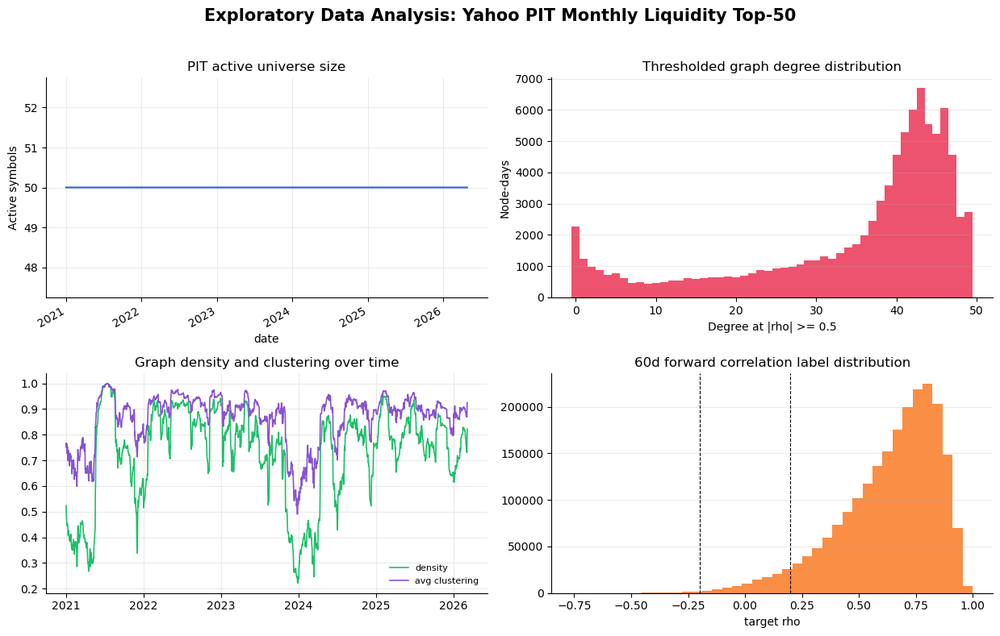

Wrote paper/figures/eda_graph_stats.png
Wrote paper/eda_summary.json


In [8]:
# RUN_EDA_SECTION_ONLY
# This cell is intentionally limited to the EDA path. It does not train models.
stage_setup_and_configuration(forward_window_days=60)
stage_build_yahoo_pit_monthly_liquidity_universe()
stage_load_pit_returns_and_universe()
stage_return_data_quality_checks()
stage_build_dynamic_pair_panel()
stage_exploratory_data_analysis()

### Stage 6: Walk-Forward Splits and Evaluation Metrics

This stage assigns each pair-date observation to walk-forward folds. The notebook uses fixed train, validation, and test windows so every model is evaluated on the same out-of-sample periods.

The shared metric functions defined here keep later comparisons consistent across tree models, neural baselines, GATs, and portfolio diagnostics.


In [8]:
def stage_walk_forward_splits_and_metrics() -> None:
    global evaluate_all_predictions, make_walk_forward_splits, mean_daily_spearman, split_table, splits
    # ============================================================================
    # Walk-forward splits and metrics
    # ============================================================================
    def make_walk_forward_splits(unique_dates: pd.Series | np.ndarray) -> list[dict[str, object]]:
        dates = [pd.Timestamp(d) for d in sorted(pd.to_datetime(unique_dates).unique())]
        splits = []
        test_start = INITIAL_TRAIN_DAYS
        fold = 1
        while test_start + TEST_BLOCK_DAYS <= len(dates):
            train_start = max(0, test_start - TRAIN_WINDOW_DAYS)
            train_dates = dates[train_start:test_start]
            test_dates = dates[test_start : test_start + TEST_BLOCK_DAYS]
            splits.append(
                {
                    "fold": fold,
                    "train_dates": train_dates,
                    "test_dates": test_dates,
                    "train_start": train_dates[0],
                    "train_end": train_dates[-1],
                    "test_start": test_dates[0],
                    "test_end": test_dates[-1],
                }
            )
            fold += 1
            if MAX_FOLDS is not None and len(splits) >= MAX_FOLDS:
                break
            test_start += TEST_BLOCK_DAYS
        return splits


    def mean_daily_spearman(df: pd.DataFrame, pred_col: str) -> float:
        vals = []
        for _, group in df.groupby("date"):
            sub = group[["target_corr", pred_col]].replace([np.inf, -np.inf], np.nan).dropna()
            if len(sub) >= 3:
                corr = sub["target_corr"].rank().corr(sub[pred_col].rank())
                if np.isfinite(corr):
                    vals.append(corr)
        return float(np.mean(vals)) if vals else np.nan


    def evaluate_all_predictions(predictions: pd.DataFrame, prediction_cols: list[str]) -> pd.DataFrame:
        rows = []
        for col in prediction_cols:
            valid = predictions[["target_corr", col]].replace([np.inf, -np.inf], np.nan).dropna()
            if valid.empty:
                continue
            err = valid[col] - valid["target_corr"]
            model_name = col.replace("pred_", "")
            rows.append(
                {
                    "model": model_name,
                    "n": len(valid),
                    "MAE": mean_absolute_error(valid["target_corr"], valid[col]),
                    "RMSE": math.sqrt(mean_squared_error(valid["target_corr"], valid[col])),
                    "Bias": float(err.mean()),
                    "EdgeSignAcc_pm0.2": float(
                        np.mean(
                            np.sign(valid[col].where(valid[col].abs() >= SIGN_THRESHOLD, 0.0))
                            == np.sign(valid["target_corr"].where(valid["target_corr"].abs() >= SIGN_THRESHOLD, 0.0))
                        )
                    ),
                    "MeanDailySpearman": mean_daily_spearman(predictions, col),
                }
            )
        return pd.DataFrame(rows).set_index("model").sort_values("RMSE")

    splits = make_walk_forward_splits(panel["date"])
    split_table = pd.DataFrame(
        {
            "fold": s["fold"],
            "train_start": s["train_start"].date(),
            "train_end": s["train_end"].date(),
            "validation_start": pd.Timestamp(s["train_dates"][-VALIDATION_DAYS]).date(),
            "validation_end": s["train_end"].date(),
            "test_start": s["test_start"].date(),
            "test_end": s["test_end"].date(),
            "train_days": len(s["train_dates"]),
            "core_train_days_for_neural": len(s["train_dates"]) - VALIDATION_DAYS,
            "validation_days": VALIDATION_DAYS,
            "test_days": len(s["test_dates"]),
        }
        for s in splits
    )
    split_table.to_csv(SPLITS_CACHE, index=False)
    display(split_table)




### Stage 7: Persistence, EWMA, and Residual HGB Baselines

This stage establishes the classical and tabular baselines. Persistence and EWMA provide simple correlation forecasts, while residual HGB learns deviations from the lagged/base correlation.

The tuned HGB baseline is important because it is a strong non-graph comparator: the graph models need to beat this, not just naive persistence.


In [9]:
def stage_baselines_and_residual_hgb() -> None:
    global HGB_CURVE_EVERY_N_ITER, HGB_CURVE_SAMPLE_ROWS, HGB_PARAM_GRID, HGB_SELECTED_CONFIG_CACHE, HGB_SELECTED_CURVE_CACHE, HGB_TUNING_HISTORY_CACHE, best_model, best_params, best_val, config_id, config_idx, core_train_dates
    global core_train_df, fold, forecast_metrics, frames, hgb_config_id, hgb_corr_rmse, hgb_curve_rows, hgb_history_rows, hgb_selected_rows, hgb_staged_curve_rows, model, model_outputs_from_cache
    global nonval_model, params, pred_base_cols, pred_df, prediction_cols, predictions, sample_hgb_curve_df, split, test_dates, test_df, train_dates_full, train_df_full
    global train_residual_hgb, train_rmse, val_dates, val_df, val_rmse
    # ============================================================================
    # Baselines and residual HGB
    # ============================================================================
    HGB_TUNING_HISTORY_CACHE = OUTPUT_DIR / f"{RUN_ID}_hgb_tuning_history.csv"
    HGB_SELECTED_CONFIG_CACHE = OUTPUT_DIR / f"{RUN_ID}_hgb_selected_configs.csv"
    HGB_SELECTED_CURVE_CACHE = OUTPUT_DIR / f"{RUN_ID}_hgb_selected_training_curves.csv"
    HGB_CURVE_SAMPLE_ROWS = 75_000
    HGB_CURVE_EVERY_N_ITER = 10

    HGB_PARAM_GRID = [
        {
            "max_leaf_nodes": max_leaf_nodes,
            "min_samples_leaf": min_samples_leaf,
            "l2_regularization": 0.05,
            "learning_rate": 0.05,
            "max_iter": 180,
        }
        for max_leaf_nodes in [15, 31, 63]
        for min_samples_leaf in [30, 50]
    ]


    def hgb_config_id(params: dict[str, float | int]) -> str:
        return (
            f"leaf{params['max_leaf_nodes']}"
            f"_min{params['min_samples_leaf']}"
            f"_l2{params['l2_regularization']}"
            f"_lr{params['learning_rate']}"
            f"_iter{params['max_iter']}"
        )


    def train_residual_hgb(train_df: pd.DataFrame, params: dict[str, float | int] | None = None) -> HistGradientBoostingRegressor:
        params = params or {
            "learning_rate": 0.05,
            "max_iter": 180,
            "max_leaf_nodes": 31,
            "min_samples_leaf": 30,
            "l2_regularization": 0.05,
        }
        model = HistGradientBoostingRegressor(
            loss="squared_error",
            learning_rate=float(params["learning_rate"]),
            max_iter=int(params["max_iter"]),
            max_leaf_nodes=int(params["max_leaf_nodes"]),
            min_samples_leaf=int(params["min_samples_leaf"]),
            l2_regularization=float(params["l2_regularization"]),
            early_stopping=False,
            random_state=RANDOM_SEED,
        )
        model.fit(train_df[FEATURE_COLS], train_df["target_residual"])
        return model


    def hgb_corr_rmse(model: HistGradientBoostingRegressor, df: pd.DataFrame) -> float:
        if df.empty:
            return np.nan
        pred_corr = clip_corr(df["base_corr"].to_numpy(dtype=float) + model.predict(df[FEATURE_COLS]))
        return float(math.sqrt(mean_squared_error(df["target_corr"], pred_corr)))


    def sample_hgb_curve_df(df: pd.DataFrame, max_rows: int, seed: int) -> pd.DataFrame:
        if len(df) <= max_rows:
            return df
        return df.sample(n=max_rows, random_state=seed).sort_values(["date", "pair_id", "row_id"])


    def hgb_staged_curve_rows(
        model: HistGradientBoostingRegressor,
        train_df: pd.DataFrame,
        val_df: pd.DataFrame,
        test_df: pd.DataFrame,
        fold: int,
        config_id: str,
        params: dict[str, float | int],
    ) -> list[dict[str, object]]:
        frames = {
            "train": train_df,
            "validation": val_df,
            "test_diagnostic": test_df,
        }
        predictions_by_split = {
            split_name: model.staged_predict(split_df[FEATURE_COLS])
            for split_name, split_df in frames.items()
            if not split_df.empty
        }
        max_iter = int(getattr(model, "n_iter_", params["max_iter"]))
        rows = []
        for iteration in range(1, max_iter + 1):
            keep_iter = iteration == 1 or iteration == max_iter or iteration % HGB_CURVE_EVERY_N_ITER == 0
            split_preds = {name: next(gen) for name, gen in predictions_by_split.items()}
            if not keep_iter:
                continue
            row = {
                "model": "residual_hgb_tuned",
                "model_label": "Residual HGB tuned",
                "fold": fold,
                "config_id": config_id,
                "iteration": iteration,
                **params,
            }
            for split_name, split_df in frames.items():
                if split_name not in split_preds or split_df.empty:
                    row[f"{split_name}_rmse"] = np.nan
                    continue
                pred_corr = clip_corr(split_df["base_corr"].to_numpy(dtype=float) + split_preds[split_name])
                row[f"{split_name}_rmse"] = float(math.sqrt(mean_squared_error(split_df["target_corr"], pred_corr)))
            rows.append(row)
        return rows


    prediction_cols = ["pred_persistence", "pred_ewma", "pred_residual_hgb", "pred_residual_hgb_tuned"]

    model_outputs_from_cache = (
        USE_CACHED_MODEL_OUTPUTS
        and not FORCE_RETRAIN_MODELS
        and PREDICTIONS_CACHE.exists()
        and METRICS_CACHE.exists()
    )

    if model_outputs_from_cache:
        predictions = pd.read_csv(PREDICTIONS_CACHE, parse_dates=["date"])
        prediction_cols = model_prediction_columns(predictions)
        forecast_metrics = evaluate_all_predictions(predictions, prediction_cols)
        forecast_metrics.to_csv(METRICS_CACHE)
        print(f"Loaded cached predictions from {PREDICTIONS_CACHE.relative_to(PROJECT_ROOT)}")
    else:
        frames = []
        hgb_history_rows = []
        hgb_selected_rows = []
        hgb_curve_rows = []
        for split in splits:
            fold = int(split["fold"])
            train_dates_full = [pd.Timestamp(d) for d in split["train_dates"]]
            core_train_dates = train_dates_full[:-VALIDATION_DAYS]
            val_dates = train_dates_full[-VALIDATION_DAYS:]
            test_dates = [pd.Timestamp(d) for d in split["test_dates"]]
            train_df_full = panel.loc[panel["date"].isin(train_dates_full)].copy()
            core_train_df = panel.loc[panel["date"].isin(core_train_dates)].copy()
            val_df = panel.loc[panel["date"].isin(val_dates)].copy()
            test_df = panel.loc[panel["date"].isin(test_dates)].copy()
            print(
                f"Fold {fold}: HGB nonval_train={len(train_df_full):,}, "
                f"tune_train={len(core_train_df):,}, val={len(val_df):,}, test={len(test_df):,}"
            )

            nonval_model = train_residual_hgb(train_df_full)
            best_val = math.inf
            best_params = None
            best_model = None
            for config_idx, params in enumerate(HGB_PARAM_GRID, start=1):
                config_id = hgb_config_id(params)
                model = train_residual_hgb(core_train_df, params)
                train_rmse = hgb_corr_rmse(model, core_train_df)
                val_rmse = hgb_corr_rmse(model, val_df)
                hgb_history_rows.append(
                    {
                        "model": "residual_hgb_tuned",
                        "fold": fold,
                        "config_idx": config_idx,
                        "config_id": config_id,
                        **params,
                        "train_rmse": train_rmse,
                        "val_rmse": val_rmse,
                    }
                )
                if np.isfinite(val_rmse) and val_rmse < best_val:
                    best_val = val_rmse
                    best_params = dict(params)
                    best_model = model
            if best_model is None:
                best_params = dict(HGB_PARAM_GRID[0])
                best_model = train_residual_hgb(core_train_df, best_params)
                best_val = hgb_corr_rmse(best_model, val_df)
            hgb_selected_rows.append(
                {
                    "model": "residual_hgb_tuned",
                    "fold": fold,
                    "config_id": hgb_config_id(best_params),
                    **best_params,
                    "best_val_rmse": best_val,
                }
            )
            print(f"      selected HGB config {hgb_config_id(best_params)} val_rmse={best_val:.5f}")
            hgb_curve_rows.extend(
                hgb_staged_curve_rows(
                    best_model,
                    sample_hgb_curve_df(core_train_df, HGB_CURVE_SAMPLE_ROWS, RANDOM_SEED + 30_000 + fold),
                    sample_hgb_curve_df(val_df, HGB_CURVE_SAMPLE_ROWS, RANDOM_SEED + 40_000 + fold),
                    sample_hgb_curve_df(test_df, HGB_CURVE_SAMPLE_ROWS, RANDOM_SEED + 50_000 + fold),
                    fold,
                    hgb_config_id(best_params),
                    best_params,
                )
            )

            pred_base_cols = [
                "row_id",
                "date",
                "asset_i",
                "asset_j",
                "i_idx",
                "j_idx",
                "pair_id",
                "target_corr",
                "target_residual",
                "base_corr",
                "ewma_corr",
                "vol_base_i",
                "vol_base_j",
            ]
            pred_df = test_df[list(dict.fromkeys(pred_base_cols + FEATURE_COLS))].copy()
            pred_df["fold"] = fold
            pred_df["pred_persistence"] = clip_corr(pred_df["base_corr"])
            pred_df["pred_ewma"] = clip_corr(pred_df["ewma_corr"].fillna(pred_df["base_corr"]))
            pred_df["pred_residual_hgb"] = clip_corr(pred_df["base_corr"] + nonval_model.predict(pred_df[FEATURE_COLS]))
            pred_df["pred_residual_hgb_tuned"] = clip_corr(pred_df["base_corr"] + best_model.predict(pred_df[FEATURE_COLS]))
            frames.append(pred_df)

        predictions = pd.concat(frames, ignore_index=True)
        prediction_cols = model_prediction_columns(predictions)
        forecast_metrics = evaluate_all_predictions(predictions, prediction_cols)
        predictions.to_csv(PREDICTIONS_CACHE, index=False)
        forecast_metrics.to_csv(METRICS_CACHE)
        if hgb_history_rows:
            pd.DataFrame(hgb_history_rows).to_csv(HGB_TUNING_HISTORY_CACHE, index=False)
            pd.DataFrame(hgb_selected_rows).to_csv(HGB_SELECTED_CONFIG_CACHE, index=False)
            if hgb_curve_rows:
                pd.DataFrame(hgb_curve_rows).to_csv(HGB_SELECTED_CURVE_CACHE, index=False)
            print(f"Wrote HGB tuning history to {HGB_TUNING_HISTORY_CACHE.relative_to(PROJECT_ROOT)}")
        print(f"Wrote predictions to {PREDICTIONS_CACHE.relative_to(PROJECT_ROOT)}")

    display(forecast_metrics)




### Stage 8: Temporal GAT Forecast Models

This stage trains or loads the Temporal GAT families. The hard-threshold version builds graph snapshots from correlation edges above a threshold, while the softmax-|rho| version uses a denser attention-style weighting over absolute correlations.

The cache files for the selected folds and predictions are reused when present. If they are missing, this is one of the most expensive sections of the notebook.


In [10]:
def stage_temporal_gat() -> None:
    global ConfigurableDenseGATLayer, ConfigurableTemporalGATResidualModel, GAT_HARD_PARAM_GRID, GAT_MODEL_FAMILIES, GAT_SELECTED_CONFIG_CACHE, GAT_SOFTMAX_PARAM_GRID, GAT_TRAINING_HISTORY_CACHE, all_panel_dates, best_config, best_epoch, best_model, best_test_snaps
    global best_val, config, config_best_epoch, config_best_val, config_idx, core_train_dates, core_train_df, date_to_pos, edge_loss_weights, evaluate_gat_loss, family, fold
    global forecast_metrics, forward_gat_model, frames, gat_config_id, gat_frames_by_family, gat_predictions, gat_selected_rows, gat_training_history, gat_training_history_frames, history, lookback, make_gat_model
    global make_node_raw_array, missing_gat_families, model, name, node_fill, node_raw_all, node_raw_train, node_scaled, node_scaler, pair_fill, pair_raw_train, pair_scaler
    global panel_by_date, predict_gat, predictions, prepare_gat_snapshots, selected_config_id, snaps, snapshot_key, snapshot_keys, snapshots_by_key, split, test_dates, threshold
    global train_dates_full, train_gat_config, val_dates
    # ============================================================================
    # Temporal GAT
    # ============================================================================
    def edge_loss_weights(day_df: pd.DataFrame) -> np.ndarray:
        base = day_df["base_corr"].to_numpy(dtype=float)
        delta = day_df["base_delta"].fillna(0.0).to_numpy(dtype=float)
        uncertainty = np.exp(-np.abs(base) / 0.25)
        movement = np.clip(np.abs(delta) / 0.10, 0.0, 2.0)
        return (1.0 + 0.75 * uncertainty + 0.25 * movement).astype(np.float32)


    GAT_HARD_PARAM_GRID = [
        {
            "family": "hard",
            "threshold": threshold,
            "lookback_days": lookback_days,
            "hidden_dim": 32,
            "num_gat_layers": 2,
            "dropout": dropout,
            "tau": np.nan,
            "max_epochs": GAT_EPOCHS,
        }
        for threshold in [0.3, 0.5, 0.7]
        for lookback_days in [5, 10]
        for dropout in [0.10, 0.20]
    ]
    GAT_SOFTMAX_PARAM_GRID = [
        {
            "family": "softmax_abs",
            "threshold": np.nan,
            "lookback_days": lookback_days,
            "hidden_dim": 32,
            "num_gat_layers": 2,
            "dropout": dropout,
            "tau": tau,
            "max_epochs": GAT_EPOCHS,
        }
        for tau in [0.5, 2.0, 5.0]
        for lookback_days in [5, 10]
        for dropout in [0.10, 0.20]
    ]
    GAT_MODEL_FAMILIES = {
        "temporal_gat": {
            "pred_col": "pred_temporal_gat",
            "label": "Temporal GAT hard-threshold tuned",
            "mode": "hard",
            "grid": GAT_HARD_PARAM_GRID,
        },
        "temporal_gat_softmax_tuned": {
            "pred_col": "pred_temporal_gat_softmax_tuned",
            "label": "Temporal GAT softmax-|rho| tuned",
            "mode": "softmax_abs",
            "grid": GAT_SOFTMAX_PARAM_GRID,
        },
    }
    GAT_TRAINING_HISTORY_CACHE = OUTPUT_DIR / f"{RUN_ID}_gat_tuning_history.csv"
    GAT_SELECTED_CONFIG_CACHE = OUTPUT_DIR / f"{RUN_ID}_gat_selected_configs.csv"


    def gat_config_id(config: dict[str, object]) -> str:
        if config["family"] == "hard":
            corr_part = f"thr{config.get('threshold', EDGE_THRESHOLD)}"
        else:
            corr_part = f"tau{config['tau']}"
        return (
            f"{config['family']}_{corr_part}"
            f"_l{config['lookback_days']}"
            f"_h{config['hidden_dim']}"
            f"_g{config['num_gat_layers']}"
            f"_drop{config['dropout']}"
        )


    if TORCH_AVAILABLE:
        class ConfigurableDenseGATLayer(nn.Module):
            def __init__(self, in_dim: int, out_dim: int, dropout: float = 0.10, mode: str = "hard", tau: float = 1.0):
                super().__init__()
                self.linear = nn.Linear(in_dim, out_dim, bias=False)
                self.attn_src = nn.Linear(out_dim, 1, bias=False)
                self.attn_dst = nn.Linear(out_dim, 1, bias=False)
                self.attn_edge = nn.Linear(1, 1, bias=False)
                self.dropout = nn.Dropout(dropout)
                self.leaky_relu = nn.LeakyReLU(0.2)
                self.mode = mode
                self.tau = float(tau) if np.isfinite(tau) else 0.0

            def forward(self, x: torch.Tensor, adj: torch.Tensor, edge_weight: torch.Tensor) -> torch.Tensor:
                h = self.linear(x)
                scores = self.attn_src(h) + self.attn_dst(h).T + self.attn_edge(edge_weight.unsqueeze(-1)).squeeze(-1)
                scores = self.leaky_relu(scores)
                if self.mode == "softmax_abs":
                    scores = scores + self.tau * torch.abs(edge_weight)
                scores = scores.masked_fill(~adj, -1e9)
                alpha = torch.softmax(scores, dim=1)
                alpha = self.dropout(alpha)
                return F.elu(alpha @ h)


        class ConfigurableTemporalGATResidualModel(nn.Module):
            def __init__(self, node_dim: int, pair_dim: int, hidden_dim: int, num_gat_layers: int, dropout: float, mode: str, tau: float):
                super().__init__()
                self.mode = mode
                self.node_gru = nn.GRU(node_dim, hidden_dim, batch_first=True)
                self.gat_layers = nn.ModuleList(
                    [
                        ConfigurableDenseGATLayer(hidden_dim, hidden_dim, dropout=dropout, mode=mode, tau=tau)
                        for _ in range(num_gat_layers)
                    ]
                )
                self.decoder = nn.Sequential(
                    nn.Linear(hidden_dim * 4 + pair_dim, hidden_dim),
                    nn.ReLU(),
                    nn.Dropout(dropout),
                    nn.Linear(hidden_dim, max(1, hidden_dim // 2)),
                    nn.ReLU(),
                    nn.Linear(max(1, hidden_dim // 2), 1),
                )

            def forward(self, x_seq, adj, edge_weight, pair_idx, pair_features):
                node_sequence = x_seq.permute(1, 0, 2)
                _, hidden = self.node_gru(node_sequence)
                z = hidden[-1]
                for layer in self.gat_layers:
                    z = layer(z, adj, edge_weight)
                zi = z[pair_idx[:, 0]]
                zj = z[pair_idx[:, 1]]
                edge_repr = torch.cat([zi, zj, torch.abs(zi - zj), zi * zj, pair_features], dim=1)
                return self.decoder(edge_repr).squeeze(-1)


    def make_node_raw_array(dates: list[pd.Timestamp]) -> np.ndarray:
        arr = np.zeros((len(dates), N_ASSETS, len(NODE_FEATURE_COLS)), dtype=np.float32)
        for t_idx, date in enumerate(dates):
            for asset_idx, symbol in enumerate(SYMBOLS):
                if date in asset_features[symbol].index:
                    arr[t_idx, asset_idx, :] = asset_features[symbol].loc[date, NODE_FEATURE_COLS].to_numpy(dtype=np.float32)
        return arr


    def prepare_gat_snapshots(date_list, panel_by_date, all_dates, date_to_pos, node_scaled, pair_scaler, pair_fill, lookback, edge_threshold=EDGE_THRESHOLD):
        snapshots = []
        for date in date_list:
            day_df = panel_by_date.get(pd.Timestamp(date))
            if day_df is None or day_df.empty:
                continue
            pos = date_to_pos[pd.Timestamp(date)]
            start = max(0, pos - lookback + 1)
            x_seq = node_scaled[start : pos + 1]
            if len(x_seq) < lookback:
                pad = np.repeat(x_seq[:1], lookback - len(x_seq), axis=0)
                x_seq = np.concatenate([pad, x_seq], axis=0)
            edge_weight = np.zeros((N_ASSETS, N_ASSETS), dtype=np.float32)
            adj = np.eye(N_ASSETS, dtype=bool)
            soft_adj = np.eye(N_ASSETS, dtype=bool)
            for row in day_df.itertuples(index=False):
                i = int(row.i_idx)
                j = int(row.j_idx)
                value = float(row.base_corr)
                edge_weight[i, j] = value
                edge_weight[j, i] = value
                soft_adj[i, j] = True
                soft_adj[j, i] = True
                if abs(value) >= edge_threshold:
                    adj[i, j] = True
                    adj[j, i] = True
            raw_pair = day_df[GAT_PAIR_FEATURE_COLS].to_numpy(dtype=np.float32)
            scaled_pair = pair_scaler.transform(fill_nonfinite(raw_pair, pair_fill)).astype(np.float32)
            snapshots.append(
                {
                    "date": pd.Timestamp(date),
                    "row_id": day_df["row_id"].to_numpy(dtype=np.int64),
                    "base_corr": day_df["base_corr"].to_numpy(dtype=np.float32),
                    "x_seq": torch.tensor(x_seq, dtype=torch.float32, device=DEVICE),
                    "adj": torch.tensor(adj, dtype=torch.bool, device=DEVICE),
                    "soft_adj": torch.tensor(soft_adj, dtype=torch.bool, device=DEVICE),
                    "edge_weight": torch.tensor(edge_weight, dtype=torch.float32, device=DEVICE),
                    "pair_idx": torch.tensor(day_df[["i_idx", "j_idx"]].to_numpy(dtype=np.int64), dtype=torch.long, device=DEVICE),
                    "pair_features": torch.tensor(scaled_pair, dtype=torch.float32, device=DEVICE),
                    "y": torch.tensor(day_df["target_residual"].to_numpy(dtype=np.float32), dtype=torch.float32, device=DEVICE),
                    "weights": torch.tensor(edge_loss_weights(day_df), dtype=torch.float32, device=DEVICE),
                }
            )
        return snapshots


    def make_gat_model(config: dict[str, object]):
        return ConfigurableTemporalGATResidualModel(
            len(NODE_FEATURE_COLS),
            len(GAT_PAIR_FEATURE_COLS),
            int(config["hidden_dim"]),
            int(config["num_gat_layers"]),
            float(config["dropout"]),
            str(config["family"]),
            float(config["tau"]) if np.isfinite(config["tau"]) else 0.0,
        ).to(DEVICE)


    def forward_gat_model(model, snap, mode: str):
        adj = snap["soft_adj"] if mode == "softmax_abs" else snap["adj"]
        return model(snap["x_seq"], adj, snap["edge_weight"], snap["pair_idx"], snap["pair_features"])


    def evaluate_gat_loss(model, snapshots, mode: str) -> float:
        if not snapshots:
            return np.nan
        model.eval()
        losses = []
        with torch.no_grad():
            for snap in snapshots:
                pred = forward_gat_model(model, snap, mode)
                loss_vec = F.smooth_l1_loss(pred, snap["y"], reduction="none", beta=0.05)
                loss = (loss_vec * snap["weights"]).sum() / snap["weights"].sum()
                losses.append(float(loss.detach().cpu()))
        return float(np.mean(losses)) if losses else np.nan


    def train_gat_config(train_snaps, val_snaps, test_snaps, config: dict[str, object], fold: int, model_name: str, model_label: str):
        mode = str(config["family"])
        config_id = gat_config_id(config)
        model = make_gat_model(config)
        optimizer = torch.optim.AdamW(model.parameters(), lr=GAT_LR, weight_decay=GAT_WEIGHT_DECAY)
        best_state = copy.deepcopy(model.state_dict())
        best_val = math.inf
        best_epoch = None
        stale = 0
        history_rows = []
        rng = random.Random(RANDOM_SEED + fold)
        for epoch in range(1, int(config["max_epochs"]) + 1):
            model.train()
            rng.shuffle(train_snaps)
            train_losses = []
            for snap in train_snaps:
                optimizer.zero_grad(set_to_none=True)
                pred = forward_gat_model(model, snap, mode)
                loss_vec = F.smooth_l1_loss(pred, snap["y"], reduction="none", beta=0.05)
                loss = (loss_vec * snap["weights"]).sum() / snap["weights"].sum()
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)
                optimizer.step()
                train_losses.append(float(loss.detach().cpu()))
            train_loss = float(np.mean(train_losses)) if train_losses else np.nan
            val_loss = evaluate_gat_loss(model, val_snaps, mode)
            test_loss = evaluate_gat_loss(model, test_snaps, mode)
            improved = np.isfinite(val_loss) and val_loss + EARLY_STOP_MIN_DELTA < best_val
            if improved:
                best_val = val_loss
                best_epoch = epoch
                best_state = copy.deepcopy(model.state_dict())
                stale = 0
            else:
                stale += 1
            history_rows.append(
                {
                    "model": model_name,
                    "model_label": model_label,
                    "fold": fold,
                    "config_id": config_id,
                    "epoch": epoch,
                    "train_loss": train_loss,
                    "val_loss": val_loss,
                    "test_loss": test_loss,
                    "selected_epoch": False,
                    **config,
                }
            )
            print(
                f"      {model_label} {config_id} epoch {epoch:02d}: "
                f"train_loss={train_loss:.5f}, val_loss={val_loss:.5f}, test_loss={test_loss:.5f}"
            )
            if epoch >= GAT_MIN_EPOCHS and stale >= GAT_PATIENCE:
                print(f"      Early stopping {model_label} {config_id}: validation loss stale for {GAT_PATIENCE} epoch(s); best_epoch={best_epoch}")
                break
        model.load_state_dict(best_state)
        history = pd.DataFrame(history_rows)
        if best_epoch is not None and not history.empty:
            history["selected_epoch"] = history["epoch"].eq(best_epoch)
        return model, history, best_val, best_epoch


    def predict_gat(model, snapshots, fold: int, pred_col: str, mode: str) -> pd.DataFrame:
        records = []
        model.eval()
        with torch.no_grad():
            for snap in snapshots:
                residual = forward_gat_model(model, snap, mode)
                pred_corr = clip_corr(snap["base_corr"] + residual.detach().cpu().numpy())
                records.append(pd.DataFrame({"row_id": snap["row_id"], "fold": fold, pred_col: pred_corr}))
        return pd.concat(records, ignore_index=True) if records else pd.DataFrame(columns=["row_id", "fold", pred_col])


    missing_gat_families = {
        name: cfg for name, cfg in GAT_MODEL_FAMILIES.items() if cfg["pred_col"] not in predictions.columns
    }

    if not RUN_TEMPORAL_GAT:
        print("Skipping temporal GAT tuning because PyTorch is unavailable.")
    elif not missing_gat_families:
        print("Loaded cached temporal GAT tuned predictions; skipping temporal GAT tuning.")
    else:
        print("Missing temporal GAT tuned families: " + ", ".join(missing_gat_families))
        all_panel_dates = [pd.Timestamp(d) for d in sorted(panel["date"].unique())]
        date_to_pos = {date: idx for idx, date in enumerate(all_panel_dates)}
        panel_by_date = {pd.Timestamp(k): v.copy() for k, v in panel.groupby("date", sort=False)}
        gat_frames_by_family = {name: [] for name in missing_gat_families}
        gat_training_history_frames = []
        gat_selected_rows = []
        node_raw_all = make_node_raw_array(all_panel_dates)
        for split in splits:
            fold = int(split["fold"])
            train_dates_full = [pd.Timestamp(d) for d in split["train_dates"]]
            core_train_dates = train_dates_full[:-VALIDATION_DAYS]
            val_dates = train_dates_full[-VALIDATION_DAYS:]
            test_dates = [pd.Timestamp(d) for d in split["test_dates"]]
            node_raw_train = make_node_raw_array(core_train_dates).reshape(-1, len(NODE_FEATURE_COLS))
            node_fill = finite_fill_values(node_raw_train)
            node_scaler = StandardScaler().fit(fill_nonfinite(node_raw_train, node_fill))
            node_scaled = node_scaler.transform(fill_nonfinite(node_raw_all.reshape(-1, len(NODE_FEATURE_COLS)), node_fill)).reshape(
                len(all_panel_dates), N_ASSETS, len(NODE_FEATURE_COLS)
            ).astype(np.float32)
            core_train_df = panel.loc[panel["date"].isin(core_train_dates)]
            pair_raw_train = core_train_df[GAT_PAIR_FEATURE_COLS].to_numpy(dtype=np.float32)
            pair_fill = finite_fill_values(pair_raw_train)
            pair_scaler = StandardScaler().fit(fill_nonfinite(pair_raw_train, pair_fill))
            snapshot_keys = sorted(
                {
                    (
                        int(cfg["lookback_days"]),
                        float(cfg.get("threshold", EDGE_THRESHOLD)) if str(cfg["family"]) == "hard" else float(EDGE_THRESHOLD),
                    )
                    for fam in missing_gat_families.values()
                    for cfg in fam["grid"]
                }
            )
            snapshots_by_key = {}
            for lookback, threshold in snapshot_keys:
                snapshots_by_key[(lookback, threshold)] = {
                    "train": prepare_gat_snapshots(core_train_dates, panel_by_date, all_panel_dates, date_to_pos, node_scaled, pair_scaler, pair_fill, lookback, edge_threshold=threshold),
                    "val": prepare_gat_snapshots(val_dates, panel_by_date, all_panel_dates, date_to_pos, node_scaled, pair_scaler, pair_fill, lookback, edge_threshold=threshold),
                    "test": prepare_gat_snapshots(test_dates, panel_by_date, all_panel_dates, date_to_pos, node_scaled, pair_scaler, pair_fill, lookback, edge_threshold=threshold),
                }
            print(
                f"Fold {fold}: GAT tune_train={len(core_train_dates)}, val={len(val_dates)}, test={len(test_dates)}, "
                f"snapshot_keys={snapshot_keys}"
            )
            for name, family in missing_gat_families.items():
                best_val = math.inf
                best_model = None
                best_config = None
                best_epoch = None
                best_test_snaps = None
                for config_idx, config in enumerate(family["grid"], start=1):
                    config = dict(config)
                    config["config_idx"] = config_idx
                    snapshot_key = (
                        int(config["lookback_days"]),
                        float(config.get("threshold", EDGE_THRESHOLD)) if str(config["family"]) == "hard" else float(EDGE_THRESHOLD),
                    )
                    snaps = snapshots_by_key[snapshot_key]
                    print(f"   Fold {fold}: {family['label']} config {config_idx}/{len(family['grid'])} {gat_config_id(config)}")
                    model, history, config_best_val, config_best_epoch = train_gat_config(
                        snaps["train"], snaps["val"], snaps["test"], config, fold, name, family["label"]
                    )
                    if not history.empty:
                        gat_training_history_frames.append(history)
                    if np.isfinite(config_best_val) and config_best_val < best_val:
                        best_val = config_best_val
                        best_model = model
                        best_config = config
                        best_epoch = config_best_epoch
                        best_test_snaps = snaps["test"]
                    else:
                        del model
                    if TORCH_AVAILABLE and DEVICE == "cuda":
                        torch.cuda.empty_cache()
                if best_model is None:
                    raise RuntimeError(f"No valid GAT model selected for {name} fold {fold}")
                selected_config_id = gat_config_id(best_config)
                gat_selected_rows.append(
                    {
                        "model": name,
                        "model_label": family["label"],
                        "fold": fold,
                        "config_id": selected_config_id,
                        "best_epoch": best_epoch,
                        "best_val_loss": best_val,
                        **best_config,
                    }
                )
                print(f"   Selected {family['label']} fold {fold}: {selected_config_id}, epoch={best_epoch}, val_loss={best_val:.5f}")
                gat_frames_by_family[name].append(predict_gat(best_model, best_test_snaps, fold, family["pred_col"], family["mode"]))
                del best_model
                if TORCH_AVAILABLE and DEVICE == "cuda":
                    torch.cuda.empty_cache()
        if gat_training_history_frames:
            gat_training_history = pd.concat(gat_training_history_frames, ignore_index=True)
            gat_training_history.to_csv(GAT_TRAINING_HISTORY_CACHE, index=False)
            pd.DataFrame(gat_selected_rows).to_csv(GAT_SELECTED_CONFIG_CACHE, index=False)
            print(f"Wrote GAT tuning history to {GAT_TRAINING_HISTORY_CACHE.relative_to(PROJECT_ROOT)}")
        for name, frames in gat_frames_by_family.items():
            if not frames:
                continue
            family = GAT_MODEL_FAMILIES[name]
            gat_predictions = pd.concat(frames, ignore_index=True)
            predictions = predictions.merge(gat_predictions, on=["row_id", "fold"], how="left")
            if family["pred_col"] not in prediction_cols:
                prediction_cols.append(family["pred_col"])
        forecast_metrics = evaluate_all_predictions(predictions, prediction_cols)
        predictions.to_csv(PREDICTIONS_CACHE, index=False)
        forecast_metrics.to_csv(METRICS_CACHE)


    display(forecast_metrics)




### Stage 9: Tuned MLP and All-Node Transformer Baselines

This stage adds two neural non-GAT comparators. The MLP tests whether a flexible per-pair feed-forward model is enough, while the all-node Transformer tests whether global cross-asset attention can recover useful structure without explicit thresholded graph snapshots.

Both models write predictions into the shared prediction file so later portfolio and diagnostic code can compare all forecast families side by side.


In [11]:
def stage_mlp_and_all_node_transformer_baselines() -> None:
    global ALL_NODE_TRANSFORMER_ATTENTION_BUCKET_CACHE, ALL_NODE_TRANSFORMER_ATTENTION_PAIR_CACHE, ALL_NODE_TRANSFORMER_PARAM_GRID
    global DEEP_BASELINE_SELECTED_CONFIG_CACHE, DEEP_BASELINE_TRAINING_HISTORY_CACHE, MLP_PARAM_GRID
    global AllNodeTransformerResidualModel, ResidualMLP, forecast_metrics, prediction_cols, predictions
    # ============================================================================
    # MLP and all-node Transformer deep baselines
    # ============================================================================
    import os
    DEEP_BASELINE_TRAINING_HISTORY_CACHE = OUTPUT_DIR / f"{RUN_ID}_deep_baseline_tuning_history.csv"
    DEEP_BASELINE_SELECTED_CONFIG_CACHE = OUTPUT_DIR / f"{RUN_ID}_deep_baseline_selected_configs.csv"
    ALL_NODE_TRANSFORMER_ATTENTION_PAIR_CACHE = OUTPUT_DIR / f"{RUN_ID}_all_node_transformer_attention_by_pair.csv"
    ALL_NODE_TRANSFORMER_ATTENTION_BUCKET_CACHE = OUTPUT_DIR / f"{RUN_ID}_all_node_transformer_attention_by_abs_corr.csv"
    MLP_MAX_TRAIN_ROWS = 75_000
    MLP_MAX_VAL_ROWS = 30_000
    MLP_BATCH_SIZE = 4096
    MLP_PARAM_GRID = [
        {"model": "mlp_tuned", "hidden_dim": hidden_dim, "dropout": 0.10, "max_epochs": MLP_EPOCHS}
        for hidden_dim in [64, 128]
    ]
    ALL_NODE_TRANSFORMER_PARAM_GRID = [
        {
            "model": "all_node_transformer_tuned",
            "lookback_days": lookback_days,
            "hidden_dim": 32,
            "num_layers": 2,
            "num_heads": 4,
            "dropout": dropout,
            "max_epochs": ALL_NODE_TRANSFORMER_EPOCHS,
        }
        for lookback_days in [5, 10]
        for dropout in [0.10]
    ]

    if not TORCH_AVAILABLE:
        print("Skipping MLP and all-node Transformer baselines because PyTorch is unavailable.")
        return

    baseline_specs = {
        "mlp_tuned": {"pred_col": "pred_mlp_tuned", "label": "Residual MLP tuned", "grid": MLP_PARAM_GRID},
        "all_node_transformer_tuned": {
            "pred_col": "pred_all_node_transformer_tuned",
            "label": "All-node Transformer tuned",
            "grid": ALL_NODE_TRANSFORMER_PARAM_GRID,
        },
    }
    missing_specs = {name: spec for name, spec in baseline_specs.items() if spec["pred_col"] not in predictions.columns}
    force_transformer_attention = os.environ.get("FORCE_TRANSFORMER_ATTENTION_DIAGNOSTICS", "0") == "1"
    if not missing_specs:
        if force_transformer_attention and not ALL_NODE_TRANSFORMER_ATTENTION_BUCKET_CACHE.exists():
            missing_specs = {"all_node_transformer_tuned": baseline_specs["all_node_transformer_tuned"]}
            print("Retraining only the all-node Transformer to generate attention diagnostics.")
        else:
            print("Loaded cached MLP and all-node Transformer predictions; skipping deep baseline training.")
            return
    print("Missing/retraining deep baselines: " + ", ".join(sorted(missing_specs)))

    class ResidualMLP(nn.Module):
        def __init__(self, input_dim: int, hidden_dim: int, dropout: float):
            super().__init__()
            self.net = nn.Sequential(
                nn.Linear(input_dim, hidden_dim),
                nn.ReLU(),
                nn.LayerNorm(hidden_dim),
                nn.Dropout(dropout),
                nn.Linear(hidden_dim, hidden_dim),
                nn.ReLU(),
                nn.Dropout(dropout),
                nn.Linear(hidden_dim, 1),
            )

        def forward(self, x: torch.Tensor) -> torch.Tensor:
            return self.net(x).squeeze(-1)


    class AttentionCapturingTransformerBlock(nn.Module):
        """Norm-first Transformer encoder block that stores self-attention weights."""

        def __init__(self, hidden_dim: int, num_heads: int, dropout: float):
            super().__init__()
            self.self_attn = nn.MultiheadAttention(
                embed_dim=hidden_dim,
                num_heads=num_heads,
                dropout=dropout,
                batch_first=True,
            )
            self.norm1 = nn.LayerNorm(hidden_dim)
            self.norm2 = nn.LayerNorm(hidden_dim)
            self.linear1 = nn.Linear(hidden_dim, hidden_dim * 2)
            self.linear2 = nn.Linear(hidden_dim * 2, hidden_dim)
            self.dropout_attn = nn.Dropout(dropout)
            self.dropout_ff = nn.Dropout(dropout)
            self.dropout_hidden = nn.Dropout(dropout)
            self.activation = nn.GELU()
            self.last_attn_weights = None

        def forward(self, x: torch.Tensor) -> torch.Tensor:
            attn_input = self.norm1(x)
            attn_out, attn_weights = self.self_attn(
                attn_input,
                attn_input,
                attn_input,
                need_weights=True,
                average_attn_weights=False,
            )
            self.last_attn_weights = attn_weights.detach()
            x = x + self.dropout_attn(attn_out)
            ff_input = self.norm2(x)
            ff_out = self.linear2(self.dropout_hidden(self.activation(self.linear1(ff_input))))
            return x + self.dropout_ff(ff_out)


    class AllNodeTransformerResidualModel(nn.Module):
        def __init__(self, node_dim: int, pair_dim: int, hidden_dim: int, num_layers: int, num_heads: int, dropout: float):
            super().__init__()
            self.node_gru = nn.GRU(node_dim, hidden_dim, batch_first=True)
            self.transformer_layers = nn.ModuleList(
                [AttentionCapturingTransformerBlock(hidden_dim, num_heads, dropout) for _ in range(num_layers)]
            )
            self.decoder = nn.Sequential(
                nn.Linear(hidden_dim * 4 + pair_dim, hidden_dim),
                nn.ReLU(),
                nn.Dropout(dropout),
                nn.Linear(hidden_dim, max(1, hidden_dim // 2)),
                nn.ReLU(),
                nn.Linear(max(1, hidden_dim // 2), 1),
            )

        def encode_nodes(self, x_seq):
            node_sequence = x_seq.permute(1, 0, 2)
            _, hidden = self.node_gru(node_sequence)
            z = hidden[-1].unsqueeze(0)
            for layer in self.transformer_layers:
                z = layer(z)
            return z.squeeze(0)

        def get_attention_matrix(self):
            matrices = []
            for layer in self.transformer_layers:
                weights = getattr(layer, "last_attn_weights", None)
                if weights is None:
                    continue
                if weights.dim() == 4:
                    matrices.append(weights[0].mean(dim=0))
                elif weights.dim() == 3:
                    matrices.append(weights[0])
            if not matrices:
                return None
            return torch.stack(matrices, dim=0).mean(dim=0)

        def forward(self, x_seq, pair_idx, pair_features):
            z = self.encode_nodes(x_seq)
            zi = z[pair_idx[:, 0]]
            zj = z[pair_idx[:, 1]]
            edge_repr = torch.cat([zi, zj, torch.abs(zi - zj), zi * zj, pair_features], dim=1)
            return self.decoder(edge_repr).squeeze(-1)

    def sample_rows(df: pd.DataFrame, max_rows: int, seed: int) -> pd.DataFrame:
        if len(df) <= max_rows:
            return df.copy()
        return df.sample(n=max_rows, random_state=seed).sort_values(["date", "pair_id", "row_id"])


    def mlp_config_id(config: dict[str, object]) -> str:
        return f"mlp_h{config['hidden_dim']}_drop{config['dropout']}"


    def transformer_config_id(config: dict[str, object]) -> str:
        return (
            f"allnode_l{config['lookback_days']}"
            f"_h{config['hidden_dim']}"
            f"_layers{config['num_layers']}"
            f"_heads{config['num_heads']}"
            f"_drop{config['dropout']}"
        )


    def make_mlp_loader(df: pd.DataFrame, feature_scaler: StandardScaler, feature_fill: np.ndarray, target_mean: float, target_std: float, shuffle: bool):
        x = feature_scaler.transform(fill_nonfinite(df[FEATURE_COLS].to_numpy(dtype=np.float32), feature_fill)).astype(np.float32)
        y = ((df["target_residual"].to_numpy(dtype=np.float32) - target_mean) / target_std).astype(np.float32)
        ds = torch.utils.data.TensorDataset(torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.float32))
        return DataLoader(ds, batch_size=MLP_BATCH_SIZE, shuffle=shuffle, num_workers=0)


    def evaluate_mlp_loss(model, loader: DataLoader) -> float:
        model.eval()
        losses = []
        with torch.no_grad():
            for x, y in loader:
                pred = model(x.to(DEVICE))
                losses.append(float(F.smooth_l1_loss(pred, y.to(DEVICE), beta=0.50).detach().cpu()))
        return float(np.mean(losses)) if losses else np.nan


    def train_mlp_config(train_loader, val_loader, test_loader, config: dict[str, object], fold: int):
        config_id = mlp_config_id(config)
        model = ResidualMLP(len(FEATURE_COLS), int(config["hidden_dim"]), float(config["dropout"])).to(DEVICE)
        optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
        best_state = copy.deepcopy(model.state_dict())
        best_val = math.inf
        best_epoch = None
        stale = 0
        history_rows = []
        for epoch in range(1, int(config["max_epochs"]) + 1):
            model.train()
            train_losses = []
            for x, y in train_loader:
                optimizer.zero_grad(set_to_none=True)
                pred = model(x.to(DEVICE))
                loss = F.smooth_l1_loss(pred, y.to(DEVICE), beta=0.50)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)
                optimizer.step()
                train_losses.append(float(loss.detach().cpu()))
            train_loss = float(np.mean(train_losses)) if train_losses else np.nan
            val_loss = evaluate_mlp_loss(model, val_loader)
            test_loss = evaluate_mlp_loss(model, test_loader)
            improved = np.isfinite(val_loss) and val_loss + EARLY_STOP_MIN_DELTA < best_val
            if improved:
                best_val = val_loss
                best_epoch = epoch
                best_state = copy.deepcopy(model.state_dict())
                stale = 0
            else:
                stale += 1
            history_rows.append(
                {
                    "model": "mlp_tuned",
                    "model_label": "Residual MLP tuned",
                    "fold": fold,
                    "config_id": config_id,
                    "epoch": epoch,
                    "train_loss": train_loss,
                    "val_loss": val_loss,
                    "test_loss": test_loss,
                    "selected_epoch": False,
                    **config,
                }
            )
            print(f"      MLP {config_id} epoch {epoch:02d}: train_loss={train_loss:.5f}, val_loss={val_loss:.5f}, test_loss={test_loss:.5f}")
            if epoch >= MLP_MIN_EPOCHS and stale >= MLP_PATIENCE:
                print(f"      Early stopping MLP {config_id}: validation loss stale for {MLP_PATIENCE} epoch(s); best_epoch={best_epoch}")
                break
        model.load_state_dict(best_state)
        history = pd.DataFrame(history_rows)
        if best_epoch is not None and not history.empty:
            history["selected_epoch"] = history["epoch"].eq(best_epoch)
        return model, history, best_val, best_epoch


    def predict_mlp(model, df: pd.DataFrame, feature_scaler: StandardScaler, feature_fill: np.ndarray, target_mean: float, target_std: float) -> np.ndarray:
        x = feature_scaler.transform(fill_nonfinite(df[FEATURE_COLS].to_numpy(dtype=np.float32), feature_fill)).astype(np.float32)
        preds = []
        model.eval()
        with torch.no_grad():
            for start in range(0, len(x), MLP_BATCH_SIZE):
                xb = torch.tensor(x[start : start + MLP_BATCH_SIZE], dtype=torch.float32, device=DEVICE)
                preds.append(model(xb).detach().cpu().numpy())
        scaled = np.concatenate(preds) if preds else np.array([], dtype=float)
        residual = scaled * target_std + target_mean
        return clip_corr(df["base_corr"].to_numpy(dtype=float) + residual)


    def make_transformer_snapshots(date_list, panel_by_date, all_dates, date_to_pos, node_scaled, pair_scaler, pair_fill, lookback):
        snapshots = []
        for date in date_list:
            day_df = panel_by_date.get(pd.Timestamp(date))
            if day_df is None or day_df.empty:
                continue
            pos = date_to_pos[pd.Timestamp(date)]
            start = max(0, pos - lookback + 1)
            x_seq = node_scaled[start : pos + 1]
            if len(x_seq) < lookback:
                pad = np.repeat(x_seq[:1], lookback - len(x_seq), axis=0)
                x_seq = np.concatenate([pad, x_seq], axis=0)
            active_ids = np.unique(day_df[["i_idx", "j_idx"]].to_numpy(dtype=np.int64))
            local_index = {int(asset_id): local_id for local_id, asset_id in enumerate(active_ids)}
            local_pair_idx = np.array(
                [[local_index[int(i)], local_index[int(j)]] for i, j in day_df[["i_idx", "j_idx"]].to_numpy(dtype=np.int64)],
                dtype=np.int64,
            )
            x_seq = x_seq[:, active_ids, :]
            raw_pair = day_df[GAT_PAIR_FEATURE_COLS].to_numpy(dtype=np.float32)
            scaled_pair = pair_scaler.transform(fill_nonfinite(raw_pair, pair_fill)).astype(np.float32)
            snapshots.append(
                {
                    "date": pd.Timestamp(date),
                    "row_id": day_df["row_id"].to_numpy(dtype=np.int64),
                    "base_corr": day_df["base_corr"].to_numpy(dtype=np.float32),
                    "x_seq": torch.tensor(x_seq, dtype=torch.float32, device=DEVICE),
                    "pair_idx": torch.tensor(local_pair_idx, dtype=torch.long, device=DEVICE),
                    "pair_features": torch.tensor(scaled_pair, dtype=torch.float32, device=DEVICE),
                    "y": torch.tensor(day_df["target_residual"].to_numpy(dtype=np.float32), dtype=torch.float32, device=DEVICE),
                    "weights": torch.tensor(edge_loss_weights(day_df), dtype=torch.float32, device=DEVICE),
                }
            )
        return snapshots


    def evaluate_transformer_loss(model, snapshots) -> float:
        if not snapshots:
            return np.nan
        model.eval()
        losses = []
        with torch.no_grad():
            for snap in snapshots:
                pred = model(snap["x_seq"], snap["pair_idx"], snap["pair_features"])
                loss_vec = F.smooth_l1_loss(pred, snap["y"], reduction="none", beta=0.05)
                loss = (loss_vec * snap["weights"]).sum() / snap["weights"].sum()
                losses.append(float(loss.detach().cpu()))
        return float(np.mean(losses)) if losses else np.nan


    def train_transformer_config(train_snaps, val_snaps, test_snaps, config: dict[str, object], fold: int):
        config_id = transformer_config_id(config)
        model = AllNodeTransformerResidualModel(
            len(NODE_FEATURE_COLS),
            len(GAT_PAIR_FEATURE_COLS),
            int(config["hidden_dim"]),
            int(config["num_layers"]),
            int(config["num_heads"]),
            float(config["dropout"]),
        ).to(DEVICE)
        optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
        best_state = copy.deepcopy(model.state_dict())
        best_val = math.inf
        best_epoch = None
        stale = 0
        history_rows = []
        rng = random.Random(RANDOM_SEED + 91_000 + fold)
        for epoch in range(1, int(config["max_epochs"]) + 1):
            model.train()
            rng.shuffle(train_snaps)
            train_losses = []
            for snap in train_snaps:
                optimizer.zero_grad(set_to_none=True)
                pred = model(snap["x_seq"], snap["pair_idx"], snap["pair_features"])
                loss_vec = F.smooth_l1_loss(pred, snap["y"], reduction="none", beta=0.05)
                loss = (loss_vec * snap["weights"]).sum() / snap["weights"].sum()
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)
                optimizer.step()
                train_losses.append(float(loss.detach().cpu()))
            train_loss = float(np.mean(train_losses)) if train_losses else np.nan
            val_loss = evaluate_transformer_loss(model, val_snaps)
            test_loss = evaluate_transformer_loss(model, test_snaps)
            improved = np.isfinite(val_loss) and val_loss + EARLY_STOP_MIN_DELTA < best_val
            if improved:
                best_val = val_loss
                best_epoch = epoch
                best_state = copy.deepcopy(model.state_dict())
                stale = 0
            else:
                stale += 1
            history_rows.append(
                {
                    "model": "all_node_transformer_tuned",
                    "model_label": "All-node Transformer tuned",
                    "fold": fold,
                    "config_id": config_id,
                    "epoch": epoch,
                    "train_loss": train_loss,
                    "val_loss": val_loss,
                    "test_loss": test_loss,
                    "selected_epoch": False,
                    **config,
                }
            )
            print(f"      Transformer {config_id} epoch {epoch:02d}: train_loss={train_loss:.5f}, val_loss={val_loss:.5f}, test_loss={test_loss:.5f}")
            if epoch >= ALL_NODE_TRANSFORMER_MIN_EPOCHS and stale >= ALL_NODE_TRANSFORMER_PATIENCE:
                print(f"      Early stopping Transformer {config_id}: validation loss stale for {ALL_NODE_TRANSFORMER_PATIENCE} epoch(s); best_epoch={best_epoch}")
                break
        model.load_state_dict(best_state)
        history = pd.DataFrame(history_rows)
        if best_epoch is not None and not history.empty:
            history["selected_epoch"] = history["epoch"].eq(best_epoch)
        return model, history, best_val, best_epoch


    def transformer_attention_records(model, snap, fold: int) -> pd.DataFrame:
        attn = model.get_attention_matrix()
        if attn is None:
            return pd.DataFrame()
        attn_np = attn.detach().cpu().numpy()
        pair_idx = snap["pair_idx"].detach().cpu().numpy()
        if len(pair_idx) == 0:
            return pd.DataFrame()
        i_idx = pair_idx[:, 0]
        j_idx = pair_idx[:, 1]
        attn_ij = attn_np[i_idx, j_idx]
        attn_ji = attn_np[j_idx, i_idx]
        pair_mean = 0.5 * (attn_ij + attn_ji)
        n_active = int(attn_np.shape[0])
        uniform_weight = 1.0 / max(n_active, 1)
        return pd.DataFrame(
            {
                "fold": fold,
                "date": snap["date"],
                "row_id": snap["row_id"],
                "base_corr": snap["base_corr"],
                "abs_base_corr": np.abs(snap["base_corr"]),
                "attention_ij": attn_ij,
                "attention_ji": attn_ji,
                "attention_pair_mean": pair_mean,
                "attention_lift_vs_uniform": pair_mean / uniform_weight,
                "n_active_nodes": n_active,
            }
        )


    def summarize_transformer_attention(attention_pair_df: pd.DataFrame) -> pd.DataFrame:
        if attention_pair_df.empty:
            return pd.DataFrame()
        bins = [0.0, 0.10, 0.20, 0.30, 0.40, 0.50, 0.70, 1.01]
        labels = ["0-.10", ".10-.20", ".20-.30", ".30-.40", ".40-.50", ".50-.70", ".70-1.00"]
        out = attention_pair_df.copy()
        out["abs_corr_bucket"] = pd.cut(out["abs_base_corr"], bins=bins, labels=labels, include_lowest=True, right=False)
        return (
            out.groupby("abs_corr_bucket", observed=False)
            .agg(
                n_pairs=("row_id", "count"),
                mean_abs_corr=("abs_base_corr", "mean"),
                mean_attention_pair=("attention_pair_mean", "mean"),
                median_attention_pair=("attention_pair_mean", "median"),
                mean_attention_lift_vs_uniform=("attention_lift_vs_uniform", "mean"),
                median_attention_lift_vs_uniform=("attention_lift_vs_uniform", "median"),
            )
            .reset_index()
        )


    def predict_transformer(model, snapshots, fold: int, collect_attention: bool = False):
        records = []
        attention_frames = []
        model.eval()
        with torch.no_grad():
            for snap in snapshots:
                residual = model(snap["x_seq"], snap["pair_idx"], snap["pair_features"])
                if collect_attention:
                    attn_df = transformer_attention_records(model, snap, fold)
                    if not attn_df.empty:
                        attention_frames.append(attn_df)
                pred_corr = clip_corr(snap["base_corr"] + residual.detach().cpu().numpy())
                records.append(pd.DataFrame({"row_id": snap["row_id"], "fold": fold, "pred_all_node_transformer_tuned": pred_corr}))
        pred_df = pd.concat(records, ignore_index=True) if records else pd.DataFrame(columns=["row_id", "fold", "pred_all_node_transformer_tuned"])
        if collect_attention:
            attention_df = pd.concat(attention_frames, ignore_index=True) if attention_frames else pd.DataFrame()
            return pred_df, attention_df
        return pred_df

    history_rows = []
    selected_rows = []
    transformer_attention_frames = []
    frames_by_model = {name: [] for name in missing_specs}

    for split in splits:
        fold = int(split["fold"])
        train_dates_full = [pd.Timestamp(d) for d in split["train_dates"]]
        core_train_dates = train_dates_full[:-VALIDATION_DAYS]
        val_dates = train_dates_full[-VALIDATION_DAYS:]
        test_dates = [pd.Timestamp(d) for d in split["test_dates"]]
        core_train_df = panel.loc[panel["date"].isin(core_train_dates)].copy()
        val_df = panel.loc[panel["date"].isin(val_dates)].copy()
        test_df = panel.loc[panel["date"].isin(test_dates)].copy()
        print(f"Fold {fold}: deep baselines tune_train={len(core_train_df):,}, val={len(val_df):,}, test={len(test_df):,}")

        if "mlp_tuned" in missing_specs:
            train_sample = sample_rows(core_train_df, MLP_MAX_TRAIN_ROWS, RANDOM_SEED + 61_000 + fold)
            val_sample = sample_rows(val_df, MLP_MAX_VAL_ROWS, RANDOM_SEED + 62_000 + fold)
            feature_fill = finite_fill_values(train_sample[FEATURE_COLS].to_numpy(dtype=np.float32))
            feature_scaler = StandardScaler().fit(fill_nonfinite(train_sample[FEATURE_COLS].to_numpy(dtype=np.float32), feature_fill))
            target = train_sample["target_residual"].to_numpy(dtype=np.float32)
            target_mean = float(np.nanmean(target)) if len(target) else 0.0
            target_std = float(np.nanstd(target)) if len(target) else 1.0
            target_std = target_std if np.isfinite(target_std) and target_std > 1e-6 else 1.0
            train_loader = make_mlp_loader(train_sample, feature_scaler, feature_fill, target_mean, target_std, shuffle=True)
            val_loader = make_mlp_loader(val_sample, feature_scaler, feature_fill, target_mean, target_std, shuffle=False)
            test_loader = make_mlp_loader(sample_rows(test_df, MLP_MAX_VAL_ROWS, RANDOM_SEED + 63_000 + fold), feature_scaler, feature_fill, target_mean, target_std, shuffle=False)
            best_val = math.inf
            best_model = None
            best_config = None
            best_epoch = None
            for config_idx, config in enumerate(MLP_PARAM_GRID, start=1):
                config = dict(config)
                config["config_idx"] = config_idx
                model, history, config_best_val, config_best_epoch = train_mlp_config(train_loader, val_loader, test_loader, config, fold)
                if not history.empty:
                    history_rows.append(history)
                if np.isfinite(config_best_val) and config_best_val < best_val:
                    best_val = config_best_val
                    best_model = model
                    best_config = config
                    best_epoch = config_best_epoch
                else:
                    del model
                if TORCH_AVAILABLE and DEVICE == "cuda":
                    torch.cuda.empty_cache()
            if best_model is None:
                raise RuntimeError(f"No valid MLP model selected for fold {fold}")
            selected_rows.append(
                {
                    "model": "mlp_tuned",
                    "model_label": "Residual MLP tuned",
                    "fold": fold,
                    "config_id": mlp_config_id(best_config),
                    "best_epoch": best_epoch,
                    "best_val_loss": best_val,
                    **best_config,
                }
            )
            pred = predict_mlp(best_model, test_df, feature_scaler, feature_fill, target_mean, target_std)
            frames_by_model["mlp_tuned"].append(pd.DataFrame({"row_id": test_df["row_id"].to_numpy(dtype=np.int64), "fold": fold, "pred_mlp_tuned": pred}))
            del best_model
            if TORCH_AVAILABLE and DEVICE == "cuda":
                torch.cuda.empty_cache()

        if "all_node_transformer_tuned" in missing_specs:
            all_panel_dates = [pd.Timestamp(d) for d in sorted(panel["date"].unique())]
            date_to_pos = {date: idx for idx, date in enumerate(all_panel_dates)}
            panel_by_date = {pd.Timestamp(k): v.copy() for k, v in panel.groupby("date", sort=False)}
            node_raw_all = make_node_raw_array(all_panel_dates)
            node_raw_train = make_node_raw_array(core_train_dates).reshape(-1, len(NODE_FEATURE_COLS))
            node_fill = finite_fill_values(node_raw_train)
            node_scaler = StandardScaler().fit(fill_nonfinite(node_raw_train, node_fill))
            node_scaled = node_scaler.transform(fill_nonfinite(node_raw_all.reshape(-1, len(NODE_FEATURE_COLS)), node_fill)).reshape(
                len(all_panel_dates), N_ASSETS, len(NODE_FEATURE_COLS)
            ).astype(np.float32)
            pair_raw_train = core_train_df[GAT_PAIR_FEATURE_COLS].to_numpy(dtype=np.float32)
            pair_fill = finite_fill_values(pair_raw_train)
            pair_scaler = StandardScaler().fit(fill_nonfinite(pair_raw_train, pair_fill))
            snapshots_by_lookback = {}
            for lookback in sorted({int(cfg["lookback_days"]) for cfg in ALL_NODE_TRANSFORMER_PARAM_GRID}):
                snapshots_by_lookback[lookback] = {
                    "train": make_transformer_snapshots(core_train_dates, panel_by_date, all_panel_dates, date_to_pos, node_scaled, pair_scaler, pair_fill, lookback),
                    "val": make_transformer_snapshots(val_dates, panel_by_date, all_panel_dates, date_to_pos, node_scaled, pair_scaler, pair_fill, lookback),
                    "test": make_transformer_snapshots(test_dates, panel_by_date, all_panel_dates, date_to_pos, node_scaled, pair_scaler, pair_fill, lookback),
                }
            best_val = math.inf
            best_model = None
            best_config = None
            best_epoch = None
            best_test_snaps = None
            for config_idx, config in enumerate(ALL_NODE_TRANSFORMER_PARAM_GRID, start=1):
                config = dict(config)
                config["config_idx"] = config_idx
                snaps = snapshots_by_lookback[int(config["lookback_days"])]
                model, history, config_best_val, config_best_epoch = train_transformer_config(snaps["train"], snaps["val"], snaps["test"], config, fold)
                if not history.empty:
                    history_rows.append(history)
                if np.isfinite(config_best_val) and config_best_val < best_val:
                    best_val = config_best_val
                    best_model = model
                    best_config = config
                    best_epoch = config_best_epoch
                    best_test_snaps = snaps["test"]
                else:
                    del model
                if TORCH_AVAILABLE and DEVICE == "cuda":
                    torch.cuda.empty_cache()
            if best_model is None:
                raise RuntimeError(f"No valid all-node Transformer model selected for fold {fold}")
            selected_rows.append(
                {
                    "model": "all_node_transformer_tuned",
                    "model_label": "All-node Transformer tuned",
                    "fold": fold,
                    "config_id": transformer_config_id(best_config),
                    "best_epoch": best_epoch,
                    "best_val_loss": best_val,
                    **best_config,
                }
            )
            pred_df, attention_df = predict_transformer(best_model, best_test_snaps, fold, collect_attention=True)
            frames_by_model["all_node_transformer_tuned"].append(pred_df)
            if not attention_df.empty:
                transformer_attention_frames.append(attention_df)
            del best_model
            if TORCH_AVAILABLE and DEVICE == "cuda":
                torch.cuda.empty_cache()

    if transformer_attention_frames:
        transformer_attention_pair_df = pd.concat(transformer_attention_frames, ignore_index=True)
        transformer_attention_bucket_df = summarize_transformer_attention(transformer_attention_pair_df)
        transformer_attention_pair_df.to_csv(ALL_NODE_TRANSFORMER_ATTENTION_PAIR_CACHE, index=False)
        transformer_attention_bucket_df.to_csv(ALL_NODE_TRANSFORMER_ATTENTION_BUCKET_CACHE, index=False)
        print(f"Wrote all-node Transformer attention diagnostics to {ALL_NODE_TRANSFORMER_ATTENTION_BUCKET_CACHE.relative_to(PROJECT_ROOT)}")

    if history_rows:
        new_history = pd.concat(history_rows, ignore_index=True)
        new_selected = pd.DataFrame(selected_rows)
        if DEEP_BASELINE_TRAINING_HISTORY_CACHE.exists():
            old_history = pd.read_csv(DEEP_BASELINE_TRAINING_HISTORY_CACHE)
            old_history = old_history.loc[~old_history["model"].isin(missing_specs)].copy()
            new_history = pd.concat([old_history, new_history], ignore_index=True)
        if DEEP_BASELINE_SELECTED_CONFIG_CACHE.exists():
            old_selected = pd.read_csv(DEEP_BASELINE_SELECTED_CONFIG_CACHE)
            old_selected = old_selected.loc[~old_selected["model"].isin(missing_specs)].copy()
            new_selected = pd.concat([old_selected, new_selected], ignore_index=True)
        new_history.to_csv(DEEP_BASELINE_TRAINING_HISTORY_CACHE, index=False)
        new_selected.to_csv(DEEP_BASELINE_SELECTED_CONFIG_CACHE, index=False)
        print(f"Wrote deep baseline tuning history to {DEEP_BASELINE_TRAINING_HISTORY_CACHE.relative_to(PROJECT_ROOT)}")

    for model_name, frames in frames_by_model.items():
        if not frames:
            continue
        pred_col = baseline_specs[model_name]["pred_col"]
        model_predictions = pd.concat(frames, ignore_index=True)
        predictions = predictions.drop(columns=[pred_col], errors="ignore")
        predictions = predictions.merge(model_predictions, on=["row_id", "fold"], how="left")
        if pred_col not in prediction_cols:
            prediction_cols.append(pred_col)

    prediction_cols = model_prediction_columns(predictions)
    forecast_metrics = evaluate_all_predictions(predictions, prediction_cols)
    predictions.to_csv(PREDICTIONS_CACHE, index=False)
    forecast_metrics.to_csv(METRICS_CACHE)
    display(forecast_metrics)


### Stage 10: Temporal GAT Training-Loss Curves

This stage turns the GAT tuning history into readable diagnostic plots. The goal is not only to report the selected validation loss, but also to show whether candidate configurations converged smoothly or stopped early.

These plots are useful sanity checks for the tuned GAT families before moving to downstream portfolio results.


In [12]:
def stage_gat_training_loss_curves() -> None:
    global GAT_SELECTED_CONFIG_CACHE, GAT_TRAINING_HISTORY_CACHE, gat_selected_configs, gat_training_history
    # ============================================================================
    # GAT training loss curves
    # ============================================================================
    GAT_TRAINING_HISTORY_CACHE = OUTPUT_DIR / f"{RUN_ID}_gat_tuning_history.csv"
    GAT_SELECTED_CONFIG_CACHE = OUTPUT_DIR / f"{RUN_ID}_gat_selected_configs.csv"


    if GAT_TRAINING_HISTORY_CACHE.exists() and GAT_SELECTED_CONFIG_CACHE.exists():
        gat_training_history = pd.read_csv(GAT_TRAINING_HISTORY_CACHE)
        gat_selected_configs = pd.read_csv(GAT_SELECTED_CONFIG_CACHE)
        print(f"Loaded GAT tuning history from {GAT_TRAINING_HISTORY_CACHE.relative_to(PROJECT_ROOT)}")
        display(
            gat_selected_configs.groupby(["model", "model_label", "config_id"], as_index=False)
            .agg(folds=("fold", "nunique"), mean_best_val_loss=("best_val_loss", "mean"))
            .sort_values(["model", "folds", "mean_best_val_loss"], ascending=[True, False, True])
        )
        display(
            gat_training_history.merge(gat_selected_configs[["model", "fold", "config_id"]], on=["model", "fold", "config_id"], how="inner")
            .groupby(["model", "model_label"], as_index=False)
            .agg(
                folds=("fold", "nunique"),
                max_epoch=("epoch", "max"),
                mean_train_loss=("train_loss", "mean"),
                mean_val_loss=("val_loss", "mean"),
                mean_test_loss=("test_loss", "mean"),
            )
        )
    else:
        print("No GAT tuning history yet. Run the Temporal GAT tuning cell to create selected training curves.")




### Stage 11: Tuned Edge Temporal GRU

This stage trains or loads the edge-level temporal GRU model. Unlike the GAT, this model treats each pair's feature history as a sequence and forecasts the pair directly.

It is included as another temporal neural baseline: if temporal sequence modeling alone explains the gains, the Edge GRU should be competitive with the graph-aware models.


In [13]:
def stage_tuned_edge_temporal_gru() -> None:
    global EDGE_GRU_PARAM_GRID, EDGE_GRU_SELECTED_CONFIG_CACHE, EDGE_GRU_TUNING_HISTORY_CACHE, EdgeSequenceDataset, EdgeTemporalGRUResidualModel, best_config, best_epoch, best_model, best_val, build_edge_context, config, config_best_epoch
    global config_best_val, config_idx, context, core_train_dates, core_train_df, core_train_df_full, edge_gru_config_id, edge_history, edge_history_frames, edge_selected_rows, evaluate_edge_gru_loss, fill_values
    global fold, forecast_metrics, gru_frames, gru_predictions, history, make_edge_loader, missing_edge_gru, model, predict_edge_gru, predictions, raw_train, sample_row_ids
    global scaler, split, target_mean, target_std, test_dates, test_df_full, test_lookup, test_loss_df, test_pred, test_pred_scaled, test_resid, test_row_ids
    global train_dates_full, train_edge_gru_config, train_target, val_dates, val_df, val_df_full
    # ============================================================================
    # Tuned edge temporal GRU
    # ============================================================================
    EDGE_GRU_TUNING_HISTORY_CACHE = OUTPUT_DIR / f"{RUN_ID}_edge_gru_tuning_history.csv"
    EDGE_GRU_SELECTED_CONFIG_CACHE = OUTPUT_DIR / f"{RUN_ID}_edge_gru_selected_configs.csv"
    EDGE_GRU_PARAM_GRID = [
        {
            "sequence_length": sequence_length,
            "hidden_dim": hidden_dim,
            "embed_dim": EDGE_GRU_EMBED_DIM,
            "max_epochs": EDGE_GRU_EPOCHS,
        }
        for sequence_length in [30, 60, 90]
        for hidden_dim in [32, 48]
    ]


    def edge_gru_config_id(config: dict[str, object]) -> str:
        return f"seq{config['sequence_length']}_h{config['hidden_dim']}_emb{config['embed_dim']}"


    if TORCH_AVAILABLE:
        class EdgeTemporalGRUResidualModel(nn.Module):
            def __init__(self, feature_dim: int, n_assets: int, embed_dim: int, hidden_dim: int):
                super().__init__()
                self.asset_embedding = nn.Embedding(n_assets, embed_dim)
                self.gru = nn.GRU(feature_dim, hidden_dim, batch_first=True)
                decoder_dim = hidden_dim + feature_dim + 4 * embed_dim
                self.decoder = nn.Sequential(
                    nn.LayerNorm(decoder_dim),
                    nn.Linear(decoder_dim, hidden_dim),
                    nn.ReLU(),
                    nn.Dropout(0.10),
                    nn.Linear(hidden_dim, max(1, hidden_dim // 2)),
                    nn.ReLU(),
                    nn.Linear(max(1, hidden_dim // 2), 1),
                )

            def forward(self, x_seq: torch.Tensor, i_idx: torch.Tensor, j_idx: torch.Tensor) -> torch.Tensor:
                _, hidden = self.gru(x_seq)
                h = hidden[-1]
                last_x = x_seq[:, -1, :]
                ei = self.asset_embedding(i_idx)
                ej = self.asset_embedding(j_idx)
                pair_identity = torch.cat([ei, ej, torch.abs(ei - ej), ei * ej], dim=1)
                return self.decoder(torch.cat([h, last_x, pair_identity], dim=1)).squeeze(-1)


    class EdgeSequenceDataset(Dataset):
        def __init__(self, row_ids: np.ndarray, y_scaled: np.ndarray | None, context: dict[str, np.ndarray], seq_len: int):
            self.row_ids = np.asarray(row_ids, dtype=np.int64)
            self.y_scaled = None if y_scaled is None else np.asarray(y_scaled, dtype=np.float32)
            self.context = context
            self.seq_len = seq_len

        def __len__(self) -> int:
            return len(self.row_ids)

        def __getitem__(self, idx: int):
            row_id = int(self.row_ids[idx])
            pos = int(self.context["row_to_sorted_pos"][row_id])
            group_start = int(self.context["pair_start_by_sorted_pos"][pos])
            start = max(group_start, pos - self.seq_len + 1)
            seq = self.context["scaled_features_sorted"][start : pos + 1]
            if len(seq) < self.seq_len:
                pad = np.repeat(seq[:1], self.seq_len - len(seq), axis=0)
                seq = np.vstack([pad, seq])
            i_idx = self.context["i_by_row_id"][row_id]
            j_idx = self.context["j_by_row_id"][row_id]
            if self.y_scaled is None:
                return seq.astype(np.float32), np.int64(i_idx), np.int64(j_idx), np.int64(row_id)
            return seq.astype(np.float32), np.int64(i_idx), np.int64(j_idx), np.float32(self.y_scaled[idx]), np.int64(row_id)


    def sample_row_ids(df: pd.DataFrame, max_rows: int | None, seed: int) -> pd.DataFrame:
        if max_rows is None or len(df) <= max_rows:
            return df
        return df.sample(n=max_rows, random_state=seed).sort_values(["date", "pair_id", "row_id"])


    def build_edge_context(scaler: StandardScaler, fill_values: np.ndarray) -> dict[str, np.ndarray]:
        sorted_panel = panel.sort_values(["pair_id", "date", "row_id"]).reset_index(drop=True)
        raw = sorted_panel[FEATURE_COLS].to_numpy(dtype=np.float32)
        scaled = scaler.transform(fill_nonfinite(raw, fill_values)).astype(np.float32)
        row_ids = sorted_panel["row_id"].to_numpy(dtype=np.int64)
        row_to_sorted_pos = np.empty(panel["row_id"].max() + 1, dtype=np.int64)
        row_to_sorted_pos[row_ids] = np.arange(len(row_ids), dtype=np.int64)
        pair_start_by_sorted_pos = np.empty(len(sorted_panel), dtype=np.int64)
        for _, idxs in sorted_panel.groupby("pair_id", sort=False).indices.items():
            idxs = np.asarray(idxs, dtype=np.int64)
            pair_start_by_sorted_pos[idxs] = idxs.min()
        i_by_row_id = np.empty(panel["row_id"].max() + 1, dtype=np.int64)
        j_by_row_id = np.empty(panel["row_id"].max() + 1, dtype=np.int64)
        i_by_row_id[panel["row_id"].to_numpy(dtype=np.int64)] = panel["i_idx"].to_numpy(dtype=np.int64)
        j_by_row_id[panel["row_id"].to_numpy(dtype=np.int64)] = panel["j_idx"].to_numpy(dtype=np.int64)
        return {
            "scaled_features_sorted": scaled,
            "row_to_sorted_pos": row_to_sorted_pos,
            "pair_start_by_sorted_pos": pair_start_by_sorted_pos,
            "i_by_row_id": i_by_row_id,
            "j_by_row_id": j_by_row_id,
        }


    def make_edge_loader(df: pd.DataFrame, context: dict[str, np.ndarray], target_mean: float, target_std: float, seq_len: int, shuffle: bool) -> DataLoader:
        target = (df["target_corr"].to_numpy(dtype=float) - df["base_corr"].to_numpy(dtype=float)).astype(np.float32)
        y = ((target - target_mean) / target_std).astype(np.float32)
        ds = EdgeSequenceDataset(df["row_id"].to_numpy(dtype=np.int64), y, context, seq_len)
        return DataLoader(ds, batch_size=EDGE_GRU_BATCH_SIZE, shuffle=shuffle, num_workers=0)


    def evaluate_edge_gru_loss(model, loader: DataLoader) -> float:
        model.eval()
        losses = []
        with torch.no_grad():
            for x_seq, i_idx, j_idx, y, _ in loader:
                pred = model(x_seq.to(DEVICE), i_idx.to(DEVICE), j_idx.to(DEVICE))
                losses.append(float(F.smooth_l1_loss(pred, y.to(DEVICE), beta=0.50).detach().cpu()))
        return float(np.mean(losses)) if losses else np.nan


    def train_edge_gru_config(train_df: pd.DataFrame, val_df: pd.DataFrame, test_df: pd.DataFrame, context: dict[str, np.ndarray], target_mean: float, target_std: float, config: dict[str, object], fold: int):
        seq_len = int(config["sequence_length"])
        train_loader = make_edge_loader(train_df, context, target_mean, target_std, seq_len, shuffle=True)
        val_loader = make_edge_loader(val_df, context, target_mean, target_std, seq_len, shuffle=False)
        test_loader = make_edge_loader(test_df, context, target_mean, target_std, seq_len, shuffle=False)
        model = EdgeTemporalGRUResidualModel(len(FEATURE_COLS), N_ASSETS, int(config["embed_dim"]), int(config["hidden_dim"])).to(DEVICE)
        optimizer = torch.optim.AdamW(model.parameters(), lr=EDGE_GRU_LR, weight_decay=EDGE_GRU_WEIGHT_DECAY)
        best_state = copy.deepcopy(model.state_dict())
        best_val = math.inf
        best_epoch = None
        stale = 0
        history_rows = []
        config_id = edge_gru_config_id(config)
        for epoch in range(1, int(config["max_epochs"]) + 1):
            model.train()
            train_losses = []
            for x_seq, i_idx, j_idx, y, _ in train_loader:
                optimizer.zero_grad(set_to_none=True)
                pred = model(x_seq.to(DEVICE), i_idx.to(DEVICE), j_idx.to(DEVICE))
                loss = F.smooth_l1_loss(pred, y.to(DEVICE), beta=0.50)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)
                optimizer.step()
                train_losses.append(float(loss.detach().cpu()))
            train_loss = float(np.mean(train_losses)) if train_losses else np.nan
            val_loss = evaluate_edge_gru_loss(model, val_loader)
            test_loss = evaluate_edge_gru_loss(model, test_loader)
            improved = np.isfinite(val_loss) and val_loss + EARLY_STOP_MIN_DELTA < best_val
            if improved:
                best_val = val_loss
                best_epoch = epoch
                best_state = copy.deepcopy(model.state_dict())
                stale = 0
            else:
                stale += 1
            history_rows.append(
                {
                    "model": "edge_gru_tuned",
                    "model_label": "Edge GRU tuned",
                    "fold": fold,
                    "config_id": config_id,
                    "epoch": epoch,
                    "train_loss": train_loss,
                    "val_loss": val_loss,
                    "test_loss": test_loss,
                    "selected_epoch": False,
                    **config,
                }
            )
            print(f"      Edge GRU {config_id} epoch {epoch:02d}: train_loss={train_loss:.5f}, val_loss={val_loss:.5f}, test_loss={test_loss:.5f}")
            if epoch >= EDGE_GRU_MIN_EPOCHS and stale >= EDGE_GRU_PATIENCE:
                print(f"      Early stopping Edge GRU {config_id}: validation loss stale for {EDGE_GRU_PATIENCE} epoch(s); best_epoch={best_epoch}")
                break
        model.load_state_dict(best_state)
        history = pd.DataFrame(history_rows)
        if best_epoch is not None and not history.empty:
            history["selected_epoch"] = history["epoch"].eq(best_epoch)
        return model, history, best_val, best_epoch


    def predict_edge_gru(model, row_ids: np.ndarray, context: dict[str, np.ndarray], seq_len: int) -> tuple[np.ndarray, np.ndarray]:
        ds = EdgeSequenceDataset(row_ids, None, context, seq_len)
        loader = DataLoader(ds, batch_size=EDGE_GRU_BATCH_SIZE, shuffle=False, num_workers=0)
        preds = []
        seen_row_ids = []
        model.eval()
        with torch.no_grad():
            for x_seq, i_idx, j_idx, batch_row_ids in loader:
                pred_scaled = model(x_seq.to(DEVICE), i_idx.to(DEVICE), j_idx.to(DEVICE))
                preds.append(pred_scaled.detach().cpu().numpy())
                seen_row_ids.append(batch_row_ids.numpy())
        return np.concatenate(preds), np.concatenate(seen_row_ids)


    missing_edge_gru = "pred_edge_gru_tuned" not in predictions.columns
    if not RUN_EDGE_GRU:
        print("Skipping edge GRU tuning because PyTorch is unavailable.")
    elif not missing_edge_gru:
        print("Loaded cached edge GRU tuned predictions; skipping edge GRU tuning.")
    else:
        gru_frames = []
        edge_history_frames = []
        edge_selected_rows = []
        for split in splits:
            fold = int(split["fold"])
            train_dates_full = [pd.Timestamp(d) for d in split["train_dates"]]
            core_train_dates = train_dates_full[:-VALIDATION_DAYS]
            val_dates = train_dates_full[-VALIDATION_DAYS:]
            test_dates = [pd.Timestamp(d) for d in split["test_dates"]]
            core_train_df_full = panel.loc[panel["date"].isin(core_train_dates)].copy()
            val_df_full = panel.loc[panel["date"].isin(val_dates)].copy()
            test_df_full = panel.loc[panel["date"].isin(test_dates)].copy()
            core_train_df = sample_row_ids(core_train_df_full, EDGE_GRU_MAX_TRAIN_ROWS, RANDOM_SEED + fold)
            val_df = sample_row_ids(val_df_full, EDGE_GRU_MAX_VAL_ROWS, RANDOM_SEED + 10_000 + fold)
            test_loss_df = sample_row_ids(test_df_full, EDGE_GRU_MAX_VAL_ROWS, RANDOM_SEED + 20_000 + fold)
            print(
                f"Fold {fold}: edge GRU train_sample={len(core_train_df):,}/{len(core_train_df_full):,}, "
                f"val_sample={len(val_df):,}/{len(val_df_full):,}, test_loss_sample={len(test_loss_df):,}/{len(test_df_full):,}"
            )
            raw_train = core_train_df_full[FEATURE_COLS].to_numpy(dtype=np.float32)
            fill_values = finite_fill_values(raw_train)
            scaler = StandardScaler().fit(fill_nonfinite(raw_train, fill_values))
            context = build_edge_context(scaler, fill_values)
            train_target = (core_train_df_full["target_corr"].to_numpy(dtype=float) - core_train_df_full["base_corr"].to_numpy(dtype=float)).astype(np.float32)
            target_mean = float(np.mean(train_target))
            target_std = float(np.std(train_target) + 1e-6)
            best_val = math.inf
            best_model = None
            best_config = None
            best_epoch = None
            for config_idx, config in enumerate(EDGE_GRU_PARAM_GRID, start=1):
                config = dict(config)
                config["config_idx"] = config_idx
                print(f"   Fold {fold}: Edge GRU config {config_idx}/{len(EDGE_GRU_PARAM_GRID)} {edge_gru_config_id(config)}")
                model, history, config_best_val, config_best_epoch = train_edge_gru_config(
                    core_train_df, val_df, test_loss_df, context, target_mean, target_std, config, fold
                )
                if not history.empty:
                    edge_history_frames.append(history)
                if np.isfinite(config_best_val) and config_best_val < best_val:
                    best_val = config_best_val
                    best_model = model
                    best_config = config
                    best_epoch = config_best_epoch
                else:
                    del model
                if TORCH_AVAILABLE and DEVICE == "cuda":
                    torch.cuda.empty_cache()
            if best_model is None:
                raise RuntimeError(f"No valid Edge GRU config selected for fold {fold}")
            edge_selected_rows.append(
                {
                    "model": "edge_gru_tuned",
                    "model_label": "Edge GRU tuned",
                    "fold": fold,
                    "config_id": edge_gru_config_id(best_config),
                    "best_epoch": best_epoch,
                    "best_val_loss": best_val,
                    **best_config,
                }
            )
            print(f"   Selected Edge GRU fold {fold}: {edge_gru_config_id(best_config)}, epoch={best_epoch}, val_loss={best_val:.5f}")
            test_pred_scaled, test_row_ids = predict_edge_gru(best_model, test_df_full["row_id"].to_numpy(dtype=np.int64), context, int(best_config["sequence_length"]))
            test_lookup = panel.set_index("row_id").loc[test_row_ids]
            test_resid = test_pred_scaled * target_std + target_mean
            test_pred = clip_corr(test_lookup["base_corr"].to_numpy(dtype=float) + test_resid)
            gru_frames.append(pd.DataFrame({"row_id": test_row_ids, "fold": fold, "pred_edge_gru_tuned": test_pred}))
            del best_model
            if TORCH_AVAILABLE and DEVICE == "cuda":
                torch.cuda.empty_cache()
        if edge_history_frames:
            edge_history = pd.concat(edge_history_frames, ignore_index=True)
            edge_history.to_csv(EDGE_GRU_TUNING_HISTORY_CACHE, index=False)
            pd.DataFrame(edge_selected_rows).to_csv(EDGE_GRU_SELECTED_CONFIG_CACHE, index=False)
            print(f"Wrote Edge GRU tuning history to {EDGE_GRU_TUNING_HISTORY_CACHE.relative_to(PROJECT_ROOT)}")
        if gru_frames:
            gru_predictions = pd.concat(gru_frames, ignore_index=True)
            predictions = predictions.merge(gru_predictions, on=["row_id", "fold"], how="left")
            if "pred_edge_gru_tuned" not in prediction_cols:
                prediction_cols.append("pred_edge_gru_tuned")
            forecast_metrics = evaluate_all_predictions(predictions, prediction_cols)
            predictions.to_csv(PREDICTIONS_CACHE, index=False)
            forecast_metrics.to_csv(METRICS_CACHE)


    display(forecast_metrics)




### Stage 12: Edge GRU and HGB Tuning Diagnostics

This stage summarizes tuning histories for the Edge GRU and residual HGB models. The diagnostics make model selection transparent by showing which hyperparameters were selected and how validation loss evolved.

This keeps the final comparison from feeling like a black box: every tuned family leaves a small audit trail.


In [14]:
def stage_edge_gru_and_hgb_tuning_diagnostics() -> None:
    global ax, bars, curve_df, edge_gru_selected_configs, edge_gru_tuning_history, fig, hgb_config_summary, hgb_selected_configs, hgb_selected_curves, hgb_tuning_history
    # ============================================================================
    # Edge GRU and HGB tuning diagnostics
    # ============================================================================
    if EDGE_GRU_TUNING_HISTORY_CACHE.exists() and EDGE_GRU_SELECTED_CONFIG_CACHE.exists():
        edge_gru_tuning_history = pd.read_csv(EDGE_GRU_TUNING_HISTORY_CACHE)
        edge_gru_selected_configs = pd.read_csv(EDGE_GRU_SELECTED_CONFIG_CACHE)
        print(f"Loaded Edge GRU tuning history from {EDGE_GRU_TUNING_HISTORY_CACHE.relative_to(PROJECT_ROOT)}")
        display(
            edge_gru_selected_configs.groupby(["config_id"], as_index=False)
            .agg(folds=("fold", "nunique"), mean_best_val_loss=("best_val_loss", "mean"))
            .sort_values(["folds", "mean_best_val_loss"], ascending=[False, True])
        )
    else:
        print("No Edge GRU tuning history yet. Run the Edge GRU tuning cell to create selected training curves.")

    if HGB_TUNING_HISTORY_CACHE.exists() and HGB_SELECTED_CONFIG_CACHE.exists():
        hgb_tuning_history = pd.read_csv(HGB_TUNING_HISTORY_CACHE)
        hgb_selected_configs = pd.read_csv(HGB_SELECTED_CONFIG_CACHE)
        print(f"Loaded HGB tuning history from {HGB_TUNING_HISTORY_CACHE.relative_to(PROJECT_ROOT)}")
        display(
            hgb_selected_configs.groupby(["config_id"], as_index=False)
            .agg(folds=("fold", "nunique"), mean_best_val_rmse=("best_val_rmse", "mean"))
            .sort_values(["folds", "mean_best_val_rmse"], ascending=[False, True])
        )
        hgb_config_summary = (
            hgb_tuning_history.groupby("config_id", as_index=False)
            .agg(mean_train_rmse=("train_rmse", "mean"), mean_val_rmse=("val_rmse", "mean"), folds=("fold", "nunique"))
            .sort_values("mean_val_rmse")
            .head(20)
        )
        display(hgb_config_summary)
        print("Skipping Residual HGB tuning plot; keeping the selected-config table for reference.")

        if HGB_SELECTED_CURVE_CACHE.exists():
            hgb_selected_curves = pd.read_csv(HGB_SELECTED_CURVE_CACHE)
            curve_df = (
                hgb_selected_curves
                .groupby("iteration", as_index=False)[["train_rmse", "validation_rmse", "test_diagnostic_rmse"]]
                .mean(numeric_only=True)
                .sort_values("iteration")
            )
            display(curve_df.tail(10))
    else:
        print("No HGB tuning history yet. Run the Residual HGB cell to create tuning diagnostics.")




### Stage 13: Unified Training Diagnostics

This stage combines tuning histories across model families into a common diagnostic view. It standardizes naming, aggregates best epochs/configurations, and writes summary artifacts used later in the notebook.

The purpose is to make the final model comparison easier to read: forecast performance, tuning behavior, and downstream portfolio results all point to the same model labels.


In [15]:
def stage_unified_training_diagnostics() -> None:
    global FIGURE_DIR, OUTPUT_DIR, PROJECT_ROOT, Path, UNIFIED_TRAIN_VAL_FIGURE, _mean_band, _plot_panel, _selected_config_rows, build_unified_train_validation_diagnostics, display, np, pd
    global plt, unified_train_val_diagnostics, unified_train_val_figure
    # ============================================================================
    # Unified training diagnostics
    # ============================================================================
    # Unified train-validation diagnostic plot for selected tuned models.
    # Running-best validation matches checkpoint selection by early stopping and
    # makes convergence easier to see when validation loss is noisy across folds.
    from pathlib import Path
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt
    from IPython.display import display

    PROJECT_ROOT = Path.cwd()
    OUTPUT_DIR = PROJECT_ROOT / "outputs"
    FIGURE_DIR = OUTPUT_DIR / "figures"
    FIGURE_DIR.mkdir(exist_ok=True)

    UNIFIED_TRAIN_VAL_FIGURE = FIGURE_DIR / f"{RUN_ID}_unified_selected_train_validation_loss.png"


    def _mean_band(frame: pd.DataFrame, x_col: str, train_col: str, val_col: str) -> pd.DataFrame:
        """Build carried-forward convergence curves for selected fold/config histories.

        Earlier versions averaged only the folds that were still alive at each epoch.
        That made late-epoch points look artificially good when weak folds had already
        stopped. Here each fold/config contributes its cumulative best-so-far train
        and validation loss through the full observed epoch/iteration grid. After a
        fold stops, its last best value is carried forward.
        """
        if frame.empty:
            return pd.DataFrame()
        frame = frame.copy()
        frame[x_col] = pd.to_numeric(frame[x_col], errors="coerce")
        frame["_train_loss"] = pd.to_numeric(frame[train_col], errors="coerce").replace([np.inf, -np.inf], np.nan)
        frame["_validation_raw"] = pd.to_numeric(frame[val_col], errors="coerce").replace([np.inf, -np.inf], np.nan)
        frame = frame.dropna(subset=[x_col]).sort_values(x_col)
        if frame.empty:
            return pd.DataFrame()

        x_values = np.array(sorted(frame[x_col].dropna().unique()), dtype=float)
        group_cols = [col for col in ["model", "fold", "config_id"] if col in frame.columns]
        carried_parts = []

        if group_cols:
            grouped = frame.groupby(group_cols, dropna=False, sort=False)
        else:
            frame["_single_group"] = "all"
            group_cols = ["_single_group"]
            grouped = frame.groupby(group_cols, dropna=False, sort=False)

        for key, group in grouped:
            group = group.sort_values(x_col)
            # Collapse duplicate x values inside a fold/config, then compute the
            # fold-local convergence path.
            group_path = (
                group.groupby(x_col, as_index=False)
                .agg(_train_loss=("_train_loss", "mean"), _validation_raw=("_validation_raw", "mean"))
                .sort_values(x_col)
            )
            group_path["_train_best_so_far"] = group_path["_train_loss"].cummin()
            group_path["_validation_best_so_far"] = group_path["_validation_raw"].cummin()

            carried = pd.DataFrame({x_col: x_values})
            carried = carried.merge(
                group_path[[x_col, "_train_best_so_far", "_validation_best_so_far"]],
                on=x_col,
                how="left",
            )
            carried[["_train_best_so_far", "_validation_best_so_far"]] = carried[
                ["_train_best_so_far", "_validation_best_so_far"]
            ].ffill()
            if isinstance(key, tuple):
                for col, value in zip(group_cols, key):
                    carried[col] = value
            else:
                carried[group_cols[0]] = key
            carried_parts.append(carried)

        carried_frame = pd.concat(carried_parts, ignore_index=True) if carried_parts else pd.DataFrame()

        rows = []
        for x in x_values:
            carried_group = carried_frame.loc[carried_frame[x_col].eq(x)]
            active_group = frame.loc[frame[x_col].eq(x)]
            row = {
                x_col: x,
                "folds": int(carried_group["fold"].nunique()) if "fold" in carried_group.columns else int(len(carried_group)),
                "active_folds": int(active_group["fold"].nunique()) if "fold" in active_group.columns else int(len(active_group)),
            }
            for src_name, values in [
                ("train_best", pd.to_numeric(carried_group["_train_best_so_far"], errors="coerce")),
                ("validation_best", pd.to_numeric(carried_group["_validation_best_so_far"], errors="coerce")),
                ("validation_raw", pd.to_numeric(active_group["_validation_raw"], errors="coerce")),
            ]:
                vals = values.replace([np.inf, -np.inf], np.nan).dropna()
                row[f"{src_name}_mean"] = float(vals.mean()) if len(vals) else np.nan
                row[f"{src_name}_sem"] = float(vals.std(ddof=1) / np.sqrt(len(vals))) if len(vals) > 1 else 0.0

            # Backward-compatible aliases. From here on, "train" and
            # "validation" mean carried-forward best-so-far convergence curves.
            row["train_mean"] = row["train_best_mean"]
            row["train_sem"] = row["train_best_sem"]
            row["validation_mean"] = row["validation_best_mean"]
            row["validation_sem"] = row["validation_best_sem"]
            rows.append(row)
        return pd.DataFrame(rows).sort_values(x_col)


    def _selected_config_rows(history: pd.DataFrame, selected: pd.DataFrame) -> pd.DataFrame:
        keys = selected[["model", "fold", "config_id"]].drop_duplicates()
        return history.merge(keys, on=["model", "fold", "config_id"], how="inner")


    def _plot_panel(ax, df: pd.DataFrame, x_col: str, title: str, ylabel: str, xlabel: str):
        if df.empty:
            ax.text(0.5, 0.5, "No cached history", ha="center", va="center", transform=ax.transAxes)
            ax.set_title(title_with_realized_corr(title))
            return
        x = pd.to_numeric(df[x_col], errors="coerce").to_numpy(dtype=float)
        train = df["train_best_mean"].to_numpy(dtype=float)
        val_best = df["validation_best_mean"].to_numpy(dtype=float)
        train_sem = df["train_best_sem"].fillna(0.0).to_numpy(dtype=float)
        val_best_sem = df["validation_best_sem"].fillna(0.0).to_numpy(dtype=float)

        ax.plot(x, train, color="#2563eb", marker="o", linewidth=2.0, markersize=4, label="train best so far, carried")
        ax.fill_between(x, train - train_sem, train + train_sem, color="#2563eb", alpha=0.12, linewidth=0)
        ax.plot(x, val_best, color="#dc2626", marker="o", linewidth=2.5, markersize=4, label="validation best so far, carried")
        ax.fill_between(x, val_best - val_best_sem, val_best + val_best_sem, color="#dc2626", alpha=0.13, linewidth=0)

        if len(x):
            best_idx = int(np.nanargmin(val_best)) if np.isfinite(val_best).any() else len(x) - 1
            if np.isfinite(val_best[best_idx]):
                ax.scatter([x[best_idx]], [val_best[best_idx]], marker="*", s=110, color="#991b1b", edgecolor="white", linewidth=0.8, zorder=5)

        ax.set_title(title, fontsize=12, pad=8, weight="semibold")
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.grid(alpha=0.22)
        ax.spines[["top", "right"]].set_visible(False)


    def build_unified_train_validation_diagnostics() -> tuple[pd.DataFrame, Path]:
        panel_frames = []

        hgb_curve_path = OUTPUT_DIR / f"{RUN_ID}_hgb_selected_training_curves.csv"
        if hgb_curve_path.exists():
            hgb = pd.read_csv(hgb_curve_path)
            hgb_panel = _mean_band(hgb, "iteration", "train_rmse", "validation_rmse")
            hgb_panel.insert(0, "model", "Residual HGB tuned")
            hgb_panel.insert(1, "x_col", "iteration")
            hgb_panel.insert(2, "loss_unit", "RMSE")
            panel_frames.append(hgb_panel)

        gat_hist_path = OUTPUT_DIR / f"{RUN_ID}_gat_tuning_history.csv"
        gat_selected_path = OUTPUT_DIR / f"{RUN_ID}_gat_selected_configs.csv"
        if gat_hist_path.exists() and gat_selected_path.exists():
            gat_hist = pd.read_csv(gat_hist_path)
            gat_selected = pd.read_csv(gat_selected_path)
            gat_selected_hist = _selected_config_rows(gat_hist, gat_selected)
            for model, title in [
                ("temporal_gat", "Temporal GAT hard"),
                ("temporal_gat_softmax_tuned", "Temporal GAT softmax"),
            ]:
                sub = gat_selected_hist.loc[gat_selected_hist["model"].eq(model)].copy()
                if not sub.empty:
                    panel = _mean_band(sub, "epoch", "train_loss", "val_loss")
                    panel.insert(0, "model", title)
                    panel.insert(1, "x_col", "epoch")
                    panel.insert(2, "loss_unit", "Huber loss")
                    panel_frames.append(panel)

        gru_hist_path = OUTPUT_DIR / f"{RUN_ID}_edge_gru_tuning_history.csv"
        gru_selected_path = OUTPUT_DIR / f"{RUN_ID}_edge_gru_selected_configs.csv"
        if gru_hist_path.exists() and gru_selected_path.exists():
            gru_hist = pd.read_csv(gru_hist_path)
            gru_selected = pd.read_csv(gru_selected_path)
            gru_selected_hist = _selected_config_rows(gru_hist, gru_selected)
            if not gru_selected_hist.empty:
                panel = _mean_band(gru_selected_hist, "epoch", "train_loss", "val_loss")
                panel.insert(0, "model", "Edge GRU tuned")
                panel.insert(1, "x_col", "epoch")
                panel.insert(2, "loss_unit", "Huber loss")
                panel_frames.append(panel)

        deep_hist_path = OUTPUT_DIR / f"{RUN_ID}_deep_baseline_tuning_history.csv"
        deep_selected_path = OUTPUT_DIR / f"{RUN_ID}_deep_baseline_selected_configs.csv"
        if deep_hist_path.exists() and deep_selected_path.exists():
            deep_hist = pd.read_csv(deep_hist_path)
            deep_selected = pd.read_csv(deep_selected_path)
            deep_selected_hist = _selected_config_rows(deep_hist, deep_selected)
            for model, title in [
                ("mlp_tuned", "Residual MLP"),
                ("all_node_transformer_tuned", "All-node Transformer"),
            ]:
                sub = deep_selected_hist.loc[deep_selected_hist["model"].eq(model)].copy()
                if not sub.empty:
                    panel = _mean_band(sub, "epoch", "train_loss", "val_loss")
                    panel.insert(0, "model", title)
                    panel.insert(1, "x_col", "epoch")
                    panel.insert(2, "loss_unit", "Huber loss")
                    panel_frames.append(panel)

        diagnostic_df = pd.concat(panel_frames, ignore_index=True) if panel_frames else pd.DataFrame()

        model_specs = [
            ("Residual HGB tuned", "iteration", "RMSE", "Boosting iteration"),
            ("Residual MLP", "epoch", "Huber loss", "Epoch"),
            ("All-node Transformer", "epoch", "Huber loss", "Epoch"),
            ("Temporal GAT hard", "epoch", "Huber loss", "Epoch"),
            ("Temporal GAT softmax", "epoch", "Huber loss", "Epoch"),
            ("Edge GRU tuned", "epoch", "Huber loss", "Epoch"),
        ]
        ncols = 2
        nrows = int(np.ceil(len(model_specs) / ncols))
        fig, axes = plt.subplots(nrows, ncols, figsize=(15, 4.0 * nrows))
        axes = np.ravel(axes)
        for ax, (model, x_col, ylabel, xlabel) in zip(axes, model_specs):
            sub = diagnostic_df.loc[diagnostic_df["model"].eq(model)].copy() if not diagnostic_df.empty else pd.DataFrame()
            _plot_panel(ax, sub, x_col, model, ylabel, xlabel)
        for ax in axes[len(model_specs):]:
            ax.axis("off")

        handles, labels = axes[0].get_legend_handles_labels()
        if handles:
            fig.legend(handles, labels, loc="upper center", ncol=2, frameon=False, bbox_to_anchor=(0.5, 0.925))
        fig.suptitle(
            title_with_realized_corr("Selected Model Training vs Validation Diagnostics"),
            y=0.982,
            fontsize=16,
            fontweight="bold",
        )
        fig.text(
            0.5,
            0.022,
            "Curves average across walk-forward folds. For early-stopped runs, each fold is carried forward after stopping using its best-so-far validation loss. Shaded bands are +/- 1 standard error. Test loss is omitted.",
            ha="center",
            fontsize=9,
            color="dimgray",
        )
        fig.tight_layout(rect=(0.035, 0.07, 0.985, 0.905), pad=0.9, h_pad=1.25, w_pad=1.0)
        fig.savefig(UNIFIED_TRAIN_VAL_FIGURE, dpi=220, bbox_inches="tight", pad_inches=0.18)
        plt.show()
        return diagnostic_df, UNIFIED_TRAIN_VAL_FIGURE


    unified_train_val_diagnostics, unified_train_val_figure = build_unified_train_validation_diagnostics()
    print(f"Wrote unified train/validation diagnostic plot to {unified_train_val_figure.relative_to(PROJECT_ROOT)}")
    if not unified_train_val_diagnostics.empty:
        display(
            unified_train_val_diagnostics.groupby("model", as_index=False)
            .agg(
                points=("folds", "count"),
                mean_folds_per_point=("folds", "mean"),
                final_train_mean=("train_mean", "last"),
                final_validation_raw_mean=("validation_raw_mean", "last"),
                final_validation_best_mean=("validation_best_mean", "last"),
            )
        )
    else:
        display(unified_train_val_diagnostics)


### Stage 14: Forecast Metric Comparison

This stage evaluates out-of-sample forecast errors for all available prediction columns. The metrics are computed on the shared test folds, so differences reflect model behavior rather than sample differences.

The resulting table is the core statistical forecast comparison for each horizon.


In [16]:
def stage_forecast_metric_comparison() -> None:
    global FORECAST_COMMON_EVAL_END, FORECAST_COMMON_EVAL_START, axes, fig, forecast_metrics, metric_predictions, plot_metrics_rmse, plot_metrics_spearman, prediction_cols, rmse_bars, spearman_bars
    # ============================================================================
    # Forecast metric comparison
    # ============================================================================
    FORECAST_COMMON_EVAL_START = pd.Timestamp("2023-01-01")
    FORECAST_COMMON_EVAL_END = pd.Timestamp("2025-12-05")

    if "predictions" in locals():
        prediction_cols = model_prediction_columns(predictions)
        metric_predictions = predictions.loc[
            predictions["date"].between(FORECAST_COMMON_EVAL_START, FORECAST_COMMON_EVAL_END)
        ].copy()
        forecast_metrics = evaluate_all_predictions(metric_predictions, prediction_cols)
        forecast_metrics.to_csv(METRICS_CACHE)
        print(f"Wrote metrics to {METRICS_CACHE.relative_to(PROJECT_ROOT)}")
        print(f"Forecast metrics evaluated on {FORECAST_COMMON_EVAL_START.date()} to {FORECAST_COMMON_EVAL_END.date()}")
    else:
        forecast_metrics = pd.read_csv(METRICS_CACHE, index_col="model")
        print(f"Loaded metrics from {METRICS_CACHE.relative_to(PROJECT_ROOT)}")

    display(forecast_metrics)

    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    plot_metrics_rmse = forecast_metrics.reset_index().sort_values("RMSE", ascending=True)
    plot_metrics_spearman = forecast_metrics.reset_index().sort_values("MeanDailySpearman", ascending=False)
    rmse_bars = axes[0].barh(plot_metrics_rmse["model"], plot_metrics_rmse["RMSE"], color="#4b7bec")
    axes[0].invert_yaxis()
    axes[0].set_title(title_with_realized_corr(f"Monthly liquidity PIT top-50 {FORWARD_WINDOW_DAYS}/720 RMSE"))
    axes[0].set_xlabel("RMSE")
    pad_horizontal_bar_axis(axes[0], plot_metrics_rmse["RMSE"], pad_fraction=0.18)
    label_horizontal_bars(axes[0], rmse_bars, fmt="{:.3f}", fontsize=7)
    spearman_bars = axes[1].barh(plot_metrics_spearman["model"], plot_metrics_spearman["MeanDailySpearman"], color="#20bf6b")
    axes[1].invert_yaxis()
    axes[1].set_title(title_with_realized_corr("Monthly liquidity PIT top-50 daily Spearman"))
    axes[1].set_xlabel("Spearman")
    pad_horizontal_bar_axis(axes[1], plot_metrics_spearman["MeanDailySpearman"], pad_fraction=0.18)
    label_horizontal_bars(axes[1], spearman_bars, fmt="{:.3f}", fontsize=7)
    fig.tight_layout()
    fig.savefig(FIGURE_DIR / f"{RUN_ID}_forecast_metric_comparison.png", dpi=180)
    plt.show()




### Stage 15: ERC Portfolio Utility Functions

This stage defines the portfolio machinery used by the time-series momentum experiments. Forecast covariance matrices are converted into ERC-style weights, then combined with momentum signals to produce daily strategy returns.

These utility functions are shared by the standard and fast TSMOM variants, which keeps the downstream trading comparison internally consistent.


In [17]:
def stage_erc_utility_loss() -> None:
    global ERC_ANCHOR_SHARPE, ERC_FIGURE, ERC_FOLD_CACHE, ERC_FORCE_RECOMPUTE, ERC_MIN_REALIZED_OBS, ERC_PERIOD_END, ERC_PERIOD_START, ERC_REALIZED_WINDOW_DAYS, ERC_RISK_AVERSION, ERC_SUMMARY_CACHE, ERC_TARGET_ANN_VOL, ax
    global compute_erc_utility, corr_matrix_from_prediction, covariance_from_corr_and_current_vols, erc60_utility_by_fold, erc60_utility_summary, erc_weights, expected_erc_methods, fig, fold_display_cols, minimize, missing_methods, nearest_psd_correlation
    global plot_df, realized_forward_corr, scale_to_target_vol, use_cached_erc, utility_bars, vols_from_prediction_day
    # ============================================================================
    # ERC utility loss
    # ============================================================================
    from scipy.optimize import minimize

    ERC_FORCE_RECOMPUTE = False
    ERC_PERIOD_START = pd.Timestamp("2023-01-01")
    ERC_PERIOD_END = pd.Timestamp("2025-12-05")
    ERC_REALIZED_WINDOW_DAYS = FORWARD_WINDOW_DAYS
    ERC_MIN_REALIZED_OBS = int(0.75 * ERC_REALIZED_WINDOW_DAYS)
    ERC_FOLD_CACHE = OUTPUT_DIR / f"{RUN_ID}_erc{ERC_REALIZED_WINDOW_DAYS}_utility_by_fold.csv"
    ERC_SUMMARY_CACHE = OUTPUT_DIR / f"{RUN_ID}_erc{ERC_REALIZED_WINDOW_DAYS}_utility_summary.csv"
    ERC_FIGURE = FIGURE_DIR / f"{RUN_ID}_erc{ERC_REALIZED_WINDOW_DAYS}_utility_loss_comparison.png"
    ERC_TARGET_ANN_VOL = 0.10
    ERC_ANCHOR_SHARPE = 0.50
    ERC_RISK_AVERSION = ERC_ANCHOR_SHARPE / ERC_TARGET_ANN_VOL


    def nearest_psd_correlation(corr: np.ndarray, eigen_floor: float = 1e-4) -> np.ndarray:
        corr = np.nan_to_num(corr, nan=0.0, posinf=0.0, neginf=0.0)
        corr = 0.5 * (corr + corr.T)
        np.fill_diagonal(corr, 1.0)
        eigvals, eigvecs = np.linalg.eigh(corr)
        eigvals = np.maximum(eigvals, eigen_floor)
        psd = (eigvecs * eigvals) @ eigvecs.T
        diag = np.sqrt(np.maximum(np.diag(psd), eigen_floor))
        corr_psd = psd / np.outer(diag, diag)
        corr_psd = np.clip(corr_psd, -0.999, 0.999)
        np.fill_diagonal(corr_psd, 1.0)
        return corr_psd


    def erc_weights(cov: np.ndarray, x0: np.ndarray | None = None) -> np.ndarray:
        n = cov.shape[0]
        scale = float(np.nanmedian(np.diag(cov)))
        if not np.isfinite(scale) or scale <= 0:
            scale = 1.0
        cov_s = cov / scale
        budgets = np.full(n, 1.0 / n, dtype=float)
        diag = np.maximum(np.diag(cov_s), 1e-12)
        if x0 is None or len(x0) != n or not np.all(np.isfinite(x0)) or np.any(x0 <= 0):
            x0 = 1.0 / np.sqrt(diag)
        else:
            x0 = np.maximum(np.asarray(x0, dtype=float), 1e-8)
        x0 = x0 / np.sum(x0)

        def objective(x: np.ndarray):
            x = np.maximum(x, 1e-12)
            value = 0.5 * float(x @ cov_s @ x) - float(np.sum(budgets * np.log(x)))
            grad = cov_s @ x - budgets / x
            return value, grad

        res = minimize(
            objective,
            x0,
            method="L-BFGS-B",
            jac=True,
            bounds=[(1e-10, None)] * n,
            options={"maxiter": 250, "ftol": 1e-12, "gtol": 1e-8, "maxls": 30},
        )
        x = res.x if res.success and np.all(np.isfinite(res.x)) else x0
        w = np.maximum(x, 0.0)
        total = np.sum(w)
        return w / total if np.isfinite(total) and total > 0 else np.full(n, 1.0 / n)


    def scale_to_target_vol(weights: np.ndarray, cov: np.ndarray, target_vol: float) -> tuple[np.ndarray, float, float]:
        model_vol = float(np.sqrt(max(weights @ cov @ weights, 0.0)))
        scale = target_vol / model_vol if np.isfinite(model_vol) and model_vol > 0 else 0.0
        return weights * scale, model_vol, scale


    def corr_matrix_from_prediction(day_df: pd.DataFrame, col: str | None, asset_ids: list[int]) -> np.ndarray:
        if col is None:
            return np.eye(len(asset_ids), dtype=float)
        pos = {asset_id: i for i, asset_id in enumerate(asset_ids)}
        corr = np.eye(len(asset_ids), dtype=float)
        sub = day_df[["i_idx", "j_idx", col]].replace([np.inf, -np.inf], np.nan).dropna()
        for row in sub.itertuples(index=False):
            i = int(row.i_idx)
            j = int(row.j_idx)
            if i in pos and j in pos:
                rho = float(np.clip(getattr(row, col), -0.999, 0.999))
                corr[pos[i], pos[j]] = rho
                corr[pos[j], pos[i]] = rho
        return nearest_psd_correlation(corr)


    def vols_from_prediction_day(day_df: pd.DataFrame, n_assets: int) -> np.ndarray:
        long_i = day_df[["i_idx", "vol_base_i"]].rename(columns={"i_idx": "idx", "vol_base_i": "vol"})
        long_j = day_df[["j_idx", "vol_base_j"]].rename(columns={"j_idx": "idx", "vol_base_j": "vol"})
        long = pd.concat([long_i, long_j], ignore_index=True).replace([np.inf, -np.inf], np.nan).dropna()
        med = long.groupby("idx")["vol"].median()
        vols = np.full(n_assets, np.nan, dtype=float)
        idx = med.index.to_numpy(dtype=int)
        vols[idx] = med.to_numpy(dtype=float)
        return vols


    def covariance_from_corr_and_current_vols(corr: np.ndarray, vols_3d: np.ndarray) -> np.ndarray:
        cov_3d = np.outer(vols_3d, vols_3d) * corr
        cov_ann = cov_3d * (365.0 / RETURN_LOOKBACK_DAYS)
        cov_ann = 0.5 * (cov_ann + cov_ann.T)
        ridge = max(RIDGE_COV, float(np.nanmedian(np.diag(cov_ann))) * 1e-6)
        return cov_ann + np.eye(len(vols_3d)) * ridge


    def realized_forward_corr(returns_3d: pd.DataFrame, test_dates: list[pd.Timestamp], symbols: list[str]) -> tuple[np.ndarray, list[str], int]:
        window = returns_3d.reindex(test_dates)[symbols].replace([np.inf, -np.inf], np.nan)
        valid_symbols = [s for s in symbols if window[s].notna().sum() >= ERC_MIN_REALIZED_OBS]
        if len(valid_symbols) < 3:
            return np.empty((0, 0)), [], 0
        window = window[valid_symbols]
        corr = window.corr(min_periods=ERC_MIN_REALIZED_OBS).to_numpy(dtype=float)
        return nearest_psd_correlation(corr), valid_symbols, int(len(window))


    def compute_erc_utility() -> tuple[pd.DataFrame, pd.DataFrame]:
        returns_3d_for_erc = daily_log_returns.rolling(RETURN_LOOKBACK_DAYS, min_periods=RETURN_LOOKBACK_DAYS).sum()
        idx_to_symbol = IDX_TO_SYMBOL
        symbol_to_idx = SYMBOL_TO_IDX
        methods = [(f"oracle_realized_{ERC_REALIZED_WINDOW_DAYS}d", "oracle")] + [
            (col.replace("pred_", ""), col) for col in prediction_cols
        ]
        preferred = [f"oracle_realized_{ERC_REALIZED_WINDOW_DAYS}d", "persistence", "ewma", "residual_hgb", "temporal_gat", "edge_gru_raw_l60"]
        methods = sorted(methods, key=lambda x: preferred.index(x[0]) if x[0] in preferred else 999)
        max_idx = int(max(predictions["i_idx"].max(), predictions["j_idx"].max())) + 1
        rows = []

        for split in split_table.itertuples(index=False):
            fold = int(split.fold)
            test_start = pd.Timestamp(split.test_start).normalize()
            if test_start < ERC_PERIOD_START:
                continue
            if test_start > ERC_PERIOD_END:
                continue
            fold_dates = sorted(pd.to_datetime(predictions.loc[predictions["fold"].eq(fold), "date"].unique()))
            fold_dates = [pd.Timestamp(d).normalize() for d in fold_dates]
            if not fold_dates:
                continue
            signal_date = fold_dates[0]
            realized_dates = [pd.Timestamp(d).normalize() for d in returns_3d_for_erc.index if pd.Timestamp(d).normalize() >= signal_date]
            realized_dates = realized_dates[:ERC_REALIZED_WINDOW_DAYS]
            if len(realized_dates) < ERC_REALIZED_WINDOW_DAYS:
                continue
            day_df = predictions.loc[predictions["date"].eq(signal_date) & predictions["fold"].eq(fold)].copy()
            if day_df.empty:
                continue

            vols_all = vols_from_prediction_day(day_df, max_idx)
            candidate_ids = sorted(set(day_df["i_idx"].astype(int)).union(day_df["j_idx"].astype(int)))
            candidate_ids = [
                idx for idx in candidate_ids
                if idx in idx_to_symbol and idx < len(vols_all) and np.isfinite(vols_all[idx]) and vols_all[idx] > VOL_EPS
            ]
            candidate_symbols = [idx_to_symbol[idx] for idx in candidate_ids]
            realized_corr, realized_symbols, realized_obs = realized_forward_corr(returns_3d_for_erc, realized_dates, candidate_symbols)
            if len(realized_symbols) < 3:
                continue

            asset_ids = [symbol_to_idx[s] for s in realized_symbols]
            vols = vols_all[asset_ids]
            true_cov = covariance_from_corr_and_current_vols(realized_corr, vols)
            oracle_w = erc_weights(true_cov)
            oracle_pos, _, _ = scale_to_target_vol(oracle_w, true_cov, ERC_TARGET_ANN_VOL)
            mu = ERC_ANCHOR_SHARPE * (true_cov @ oracle_pos) / ERC_TARGET_ANN_VOL
            oracle_utility = float(mu @ oracle_pos - 0.5 * ERC_RISK_AVERSION * (oracle_pos @ true_cov @ oracle_pos))
            closed_form_max_utility = ERC_ANCHOR_SHARPE * ERC_TARGET_ANN_VOL - 0.5 * ERC_RISK_AVERSION * ERC_TARGET_ANN_VOL**2

            for method_name, pred_col in methods:
                if method_name == f"oracle_realized_{ERC_REALIZED_WINDOW_DAYS}d":
                    pred_cov = true_cov
                    pred_corr_source = f"realized_{ERC_REALIZED_WINDOW_DAYS}d_corr"
                else:
                    pred_corr = corr_matrix_from_prediction(day_df, pred_col, asset_ids)
                    pred_cov = covariance_from_corr_and_current_vols(pred_corr, vols)
                    pred_corr_source = "identity" if pred_col is None else pred_col
                w = erc_weights(pred_cov)
                pos, predicted_unscaled_vol, leverage = scale_to_target_vol(w, pred_cov, ERC_TARGET_ANN_VOL)
                predicted_vol = float(np.sqrt(max(pos @ pred_cov @ pos, 0.0)))
                realized_vol = float(np.sqrt(max(pos @ true_cov @ pos, 0.0)))
                expected_return = float(mu @ pos)
                utility = float(expected_return - 0.5 * ERC_RISK_AVERSION * (pos @ true_cov @ pos))
                utility_loss = max(0.0, oracle_utility - utility)
                pred_var = float(pos @ pred_cov @ pos)
                true_var = float(pos @ true_cov @ pos)
                pred_rc = pos * (pred_cov @ pos)
                true_rc = pos * (true_cov @ pos)
                rows.append(
                    {
                        "fold": fold,
                        "signal_date": signal_date,
                        "test_start": test_start,
                        "test_end": realized_dates[-1],
                        "method": method_name,
                        "pred_corr_source": pred_corr_source,
                        "n_assets": len(asset_ids),
                        "realized_corr_obs": realized_obs,
                        "target_ann_vol": ERC_TARGET_ANN_VOL,
                        "anchor_sharpe": ERC_ANCHOR_SHARPE,
                        "risk_aversion_lambda": ERC_RISK_AVERSION,
                        "oracle_utility": oracle_utility,
                        "closed_form_max_utility": closed_form_max_utility,
                        "expected_return": expected_return,
                        "utility": utility,
                        "utility_loss": utility_loss,
                        "utility_loss_bps": utility_loss * 10000.0,
                        "predicted_ann_vol": predicted_vol,
                        "realized_ann_vol": realized_vol,
                        "predicted_unscaled_ann_vol": predicted_unscaled_vol,
                        "leverage_to_target_pred_vol": leverage,
                        "realized_sharpe_under_implied_mu": expected_return / realized_vol if realized_vol > 0 else np.nan,
                        "pred_risk_contrib_dispersion": float(np.std(pred_rc / pred_var)) if pred_var > 0 else np.nan,
                        "true_risk_contrib_dispersion": float(np.std(true_rc / true_var)) if true_var > 0 else np.nan,
                        "max_weight_scaled": float(np.max(pos)),
                        "gross_exposure_scaled": float(np.sum(np.abs(pos))),
                    }
                )

        fold_df = pd.DataFrame(rows)
        summary_df = (
            fold_df.groupby("method")
            .agg(
                folds=("fold", "nunique"),
                mean_utility_loss_bps=("utility_loss_bps", "mean"),
                median_utility_loss_bps=("utility_loss_bps", "median"),
                p90_utility_loss_bps=("utility_loss_bps", lambda x: float(np.nanpercentile(x, 90))),
                max_utility_loss_bps=("utility_loss_bps", "max"),
                mean_utility=("utility", "mean"),
                mean_expected_return=("expected_return", "mean"),
                mean_predicted_ann_vol=("predicted_ann_vol", "mean"),
                mean_realized_ann_vol=("realized_ann_vol", "mean"),
                mean_true_risk_contrib_dispersion=("true_risk_contrib_dispersion", "mean"),
                mean_abs_vol_target_error=("realized_ann_vol", lambda x: float(np.mean(np.abs(x - ERC_TARGET_ANN_VOL)))),
                mean_gross_exposure_scaled=("gross_exposure_scaled", "mean"),
                mean_max_weight_scaled=("max_weight_scaled", "mean"),
            )
            .reset_index()
        )
        summary_df["utility_loss_rank"] = summary_df["mean_utility_loss_bps"].rank(method="min")
        summary_df = summary_df.sort_values("mean_utility_loss_bps")
        return fold_df, summary_df


    expected_erc_methods = {f"oracle_realized_{ERC_REALIZED_WINDOW_DAYS}d"} | {col.replace("pred_", "") for col in prediction_cols}
    use_cached_erc = ERC_FOLD_CACHE.exists() and ERC_SUMMARY_CACHE.exists() and not ERC_FORCE_RECOMPUTE
    if use_cached_erc:
        erc60_utility_by_fold = pd.read_csv(ERC_FOLD_CACHE, parse_dates=["signal_date", "test_start", "test_end"])
        erc60_utility_summary = pd.read_csv(ERC_SUMMARY_CACHE)
        missing_methods = expected_erc_methods - set(erc60_utility_summary["method"].astype(str))
        if missing_methods:
            print("Cached ERC utility is missing methods; recomputing: " + ", ".join(sorted(missing_methods)))
            use_cached_erc = False
    if use_cached_erc:
        print(f"Loaded ERC utility results from {ERC_SUMMARY_CACHE.relative_to(PROJECT_ROOT)}")
    else:
        erc60_utility_by_fold, erc60_utility_summary = compute_erc_utility()
        erc60_utility_by_fold.to_csv(ERC_FOLD_CACHE, index=False)
        erc60_utility_summary.to_csv(ERC_SUMMARY_CACHE, index=False)
        print(f"Wrote ERC utility results to {ERC_SUMMARY_CACHE.relative_to(PROJECT_ROOT)}")

    display(erc60_utility_summary)

    erc60_utility_by_fold = erc60_utility_by_fold.loc[erc60_utility_by_fold["method"].ne("diag_identity")].copy()
    erc60_utility_summary = erc60_utility_summary.loc[erc60_utility_summary["method"].ne("diag_identity")].copy().sort_values("mean_utility_loss_bps")
    plot_df = erc60_utility_summary.loc[~erc60_utility_summary["method"].eq(f"oracle_realized_{ERC_REALIZED_WINDOW_DAYS}d")].sort_values("mean_utility_loss_bps")
    fig, ax = plt.subplots(figsize=(11, 5))
    utility_bars = ax.barh(plot_df["method"], plot_df["mean_utility_loss_bps"], color="#4b7bec")
    pad_horizontal_bar_axis(ax, plot_df["mean_utility_loss_bps"], pad_fraction=0.18)
    label_horizontal_bars(ax, utility_bars, fmt="{:.1f}", fontsize=7)
    ax.set_xlabel("Mean annual utility loss vs realized forward ERC (bps)")
    ax.set_title(title_with_realized_corr("ERC utility loss by correlation method"))
    ax.grid(axis="x", alpha=0.25)
    fig.tight_layout()
    fig.savefig(ERC_FIGURE, dpi=180)
    plt.show()

    fold_display_cols = [
        "fold",
        "signal_date",
        "method",
        "utility_loss_bps",
        "realized_ann_vol",
        "true_risk_contrib_dispersion",
    ]
    display(
        erc60_utility_by_fold[fold_display_cols]
        .sort_values(["fold", "utility_loss_bps"])
        .groupby("fold")
        .head(4)
    )




### Stage 16: Standard TSMOM Backtest

This stage applies the slower-moving time-series momentum signal using the model forecast covariance inputs. The output is a per-model portfolio summary with annualized return, volatility, Sharpe ratio, drawdown, and turnover-style diagnostics.

This is the first economic translation of forecast quality into a strategy outcome.


In [18]:
def stage_standard_tsmom_allocation() -> None:
    global DATE_TO_POS, PRICE_DATES, annualized_weight_turnover_from_group, clip_and_renormalize, col, covariance_scaled_tsmom_allocation, expected_tsmom_strategies, gross_normalize, missing_strategies, model_covariance_for_day, nearest_psd_correlation, next_portfolio_returns
    global portfolio_forward_log_returns, predicted_corr_matrix, run_tsmom_strategy, simple_tsmom, strategy_frames, summarize_tsmom_portfolio, trailing_vols_from_day, tsmom_portfolio_returns, tsmom_portfolio_summary, tsmom_signals, turnover_annualization_from_dates, use_cached_tsmom
    global valid_portfolio_assets
    # ============================================================================
    # Standard TSMOM allocation
    # ============================================================================
    PRICE_DATES = list(daily_log_returns.index)
    DATE_TO_POS = {pd.Timestamp(d): idx for idx, d in enumerate(PRICE_DATES)}

    # Portfolio P&L uses the next tradable 3-day log return. For a signal dated t,
    # this is r[t+1] + r[t+2] + r[t+3]. The internal shift by 2 aligns the rolling
    # 3-day return back to the signal date without including the already-known r[t].
    portfolio_forward_log_returns = (
        daily_log_returns.shift(-PORTFOLIO_TRADE_LAG_DAYS)
        .rolling(PORTFOLIO_RETURN_HORIZON_DAYS, min_periods=PORTFOLIO_RETURN_HORIZON_DAYS)
        .sum()
        .shift(-PORTFOLIO_RETURN_ALIGNMENT_SHIFT_DAYS)
    )


    def next_portfolio_returns(date: pd.Timestamp) -> pd.Series | None:
        date = pd.Timestamp(date)
        if date not in portfolio_forward_log_returns.index:
            return None
        ret = portfolio_forward_log_returns.loc[date]
        return None if ret.isna().all() else ret


    def simple_tsmom(xr: pd.DataFrame, lookbacks: dict[int, float] = TSMOM_LOOKBACKS) -> pd.DataFrame:
        combo = pd.DataFrame(index=xr.index, columns=xr.columns, dtype=float)
        combo.loc[:, :] = 0.0
        valid_any = pd.DataFrame(False, index=xr.index, columns=xr.columns)
        for lookback, weight in lookbacks.items():
            signal = xr.rolling(lookback).sum()
            signal = signal / signal.rolling(TSMOM_STANDARDIZATION_WINDOW, min_periods=TSMOM_MIN_STANDARDIZATION_PERIODS).std()
            signal = signal.clip(-1, 1)
            combo = combo.add(signal * weight, fill_value=0.0)
            valid_any |= signal.notna()
        return combo.where(valid_any)


    tsmom_signals = simple_tsmom(daily_log_returns)


    def trailing_vols_from_day(day_df: pd.DataFrame) -> np.ndarray:
        values = {idx: [] for idx in range(N_ASSETS)}
        for row in day_df.itertuples(index=False):
            if np.isfinite(row.vol_base_i):
                values[int(row.i_idx)].append(float(row.vol_base_i))
            if np.isfinite(row.vol_base_j):
                values[int(row.j_idx)].append(float(row.vol_base_j))
        vols = np.full(N_ASSETS, np.nan, dtype=float)
        for idx, vals in values.items():
            if vals:
                vols[idx] = float(np.nanmedian(vals))
        return vols


    def valid_portfolio_assets(day_df: pd.DataFrame) -> list[int]:
        vols = trailing_vols_from_day(day_df)
        candidates = sorted(set(day_df["i_idx"]).union(day_df["j_idx"]))
        return [int(idx) for idx in candidates if np.isfinite(vols[int(idx)]) and vols[int(idx)] > VOL_EPS]


    def nearest_psd_correlation(corr: np.ndarray, eigen_floor: float = 1e-4) -> np.ndarray:
        corr = np.nan_to_num(corr, nan=0.0, posinf=0.0, neginf=0.0)
        corr = 0.5 * (corr + corr.T)
        np.fill_diagonal(corr, 1.0)
        eigvals, eigvecs = np.linalg.eigh(corr)
        eigvals = np.maximum(eigvals, eigen_floor)
        psd = (eigvecs * eigvals) @ eigvecs.T
        diag = np.sqrt(np.maximum(np.diag(psd), eigen_floor))
        corr_psd = psd / np.outer(diag, diag)
        corr_psd = np.clip(corr_psd, -0.999, 0.999)
        np.fill_diagonal(corr_psd, 1.0)
        return corr_psd


    def predicted_corr_matrix(day_df: pd.DataFrame, pred_col: str, asset_ids: list[int]) -> np.ndarray:
        pos = {asset_id: idx for idx, asset_id in enumerate(asset_ids)}
        corr = np.eye(len(asset_ids), dtype=float)
        for row in day_df.itertuples(index=False):
            i = int(row.i_idx)
            j = int(row.j_idx)
            if i not in pos or j not in pos:
                continue
            rho = getattr(row, pred_col)
            if np.isfinite(rho):
                corr[pos[i], pos[j]] = float(np.clip(rho, -0.999, 0.999))
                corr[pos[j], pos[i]] = float(np.clip(rho, -0.999, 0.999))
        return nearest_psd_correlation(corr)


    def model_covariance_for_day(day_df: pd.DataFrame, pred_col: str | None, asset_ids: list[int]) -> np.ndarray:
        vols = trailing_vols_from_day(day_df)[asset_ids]
        corr = np.eye(len(asset_ids), dtype=float) if pred_col is None else predicted_corr_matrix(day_df, pred_col, asset_ids)
        cov = np.outer(vols, vols) * corr
        cov = 0.5 * (cov + cov.T)
        diag = np.maximum(np.diag(cov), RIDGE_COV)
        ridge = max(RIDGE_COV, float(np.nanmedian(diag)) * TSMOM_RIDGE_FRACTION)
        return cov + np.eye(len(asset_ids)) * ridge


    def gross_normalize(weights: np.ndarray) -> np.ndarray:
        gross = np.sum(np.abs(weights))
        if not np.isfinite(gross) or gross <= 0:
            return np.zeros_like(weights)
        return weights / gross


    def clip_and_renormalize(weights: np.ndarray, max_abs_weight: float = TSMOM_MAX_ABS_WEIGHT) -> np.ndarray:
        weights = gross_normalize(weights)
        weights = np.clip(weights, -max_abs_weight, max_abs_weight)
        return gross_normalize(weights)


    def covariance_scaled_tsmom_allocation(day_df: pd.DataFrame, pred_col: str | None, equal_signal: bool = False):
        date = pd.Timestamp(day_df["date"].iloc[0])
        asset_ids = valid_portfolio_assets(day_df)
        if date not in tsmom_signals.index:
            return np.zeros(N_ASSETS), np.nan
        signal_vec = tsmom_signals.loc[date].reindex(SYMBOLS).to_numpy(dtype=float)
        active_ids = [idx for idx in asset_ids if np.isfinite(signal_vec[idx]) and abs(signal_vec[idx]) > 1e-8]
        weights = np.zeros(N_ASSETS, dtype=float)
        if not active_ids:
            return weights, np.nan
        signal = signal_vec[active_ids]
        if equal_signal:
            raw = clip_and_renormalize(signal)
            weights[active_ids] = raw * TSMOM_MAX_GROSS_EXPOSURE
            return weights, np.nan
        cov = model_covariance_for_day(day_df, pred_col, active_ids)
        try:
            raw = np.linalg.solve(cov, signal)
        except np.linalg.LinAlgError:
            raw = np.linalg.pinv(cov) @ signal
        if not np.all(np.isfinite(raw)) or np.sum(np.abs(raw)) <= 0:
            raw = signal / np.sqrt(np.maximum(np.diag(cov), RIDGE_COV))
        raw = np.sign(signal) * np.abs(raw)
        raw = clip_and_renormalize(raw)
        model_vol = float(np.sqrt(max(raw @ cov @ raw, 0.0)))
        scale = min(TSMOM_MAX_GROSS_EXPOSURE, TSMOM_TARGET_MODEL_VOL / model_vol) if np.isfinite(model_vol) and model_vol > 0 else 0.0
        weights[active_ids] = raw * scale
        return weights, model_vol * scale if np.isfinite(model_vol) else np.nan


    def run_tsmom_strategy(predictions: pd.DataFrame, name: str, pred_col: str | None = None, equal_signal: bool = False) -> pd.DataFrame:
        rows = []
        prev_weights = np.zeros(N_ASSETS, dtype=float)
        for date, day_df in predictions.groupby("date"):
            ret_next = next_portfolio_returns(pd.Timestamp(date))
            if ret_next is None:
                continue
            weights, predicted_model_vol = covariance_scaled_tsmom_allocation(day_df, pred_col, equal_signal=equal_signal)
            next_returns_vec = ret_next.reindex(SYMBOLS).to_numpy(dtype=float)
            weights = np.where(np.isfinite(next_returns_vec), weights, 0.0)
            portfolio_return = float(np.dot(weights, np.nan_to_num(next_returns_vec, nan=0.0))) if np.sum(np.abs(weights)) > 0 else 0.0
            abs_weight_change = float(np.abs(weights - prev_weights).sum())
            turnover = 0.5 * abs_weight_change
            prev_weights = weights
            rows.append(
                {
                    "date": pd.Timestamp(date),
                    "strategy": name,
                    "return": portfolio_return,
                    "turnover": turnover,
                    "abs_weight_change": abs_weight_change,
                    "active_assets": int(np.count_nonzero(np.abs(weights) > 1e-6)),
                    "max_abs_weight": float(np.max(np.abs(weights))) if len(weights) else 0.0,
                    "gross_exposure": float(np.sum(np.abs(weights))),
                    "net_exposure": float(np.sum(weights)),
                    "predicted_model_vol": predicted_model_vol,
                    "pred_col": pred_col if pred_col is not None else "none",
                }
            )
        return pd.DataFrame(rows)


    def turnover_annualization_from_dates(dates: pd.Series) -> float:
        ordered = pd.Series(pd.to_datetime(dates)).sort_values()
        day_diffs = ordered.diff().dt.days.dropna()
        median_days = float(day_diffs.median()) if len(day_diffs) else 1.0
        return 365.0 / median_days if np.isfinite(median_days) and median_days > 0 else 365.0


    def annualized_weight_turnover_from_group(group: pd.DataFrame) -> tuple[float, float, float]:
        abs_change = group["abs_weight_change"] if "abs_weight_change" in group.columns else 2.0 * group["turnover"]
        avg_abs_change = float(abs_change.mean())
        avg_gross = float(group["gross_exposure"].mean()) if "gross_exposure" in group.columns else np.nan
        ann_factor = turnover_annualization_from_dates(group["date"])
        ann_turnover = (avg_abs_change / avg_gross) * ann_factor if np.isfinite(avg_gross) and avg_gross > 0 else np.nan
        return avg_abs_change, avg_gross, float(ann_turnover)


    def summarize_tsmom_portfolio(returns_df: pd.DataFrame) -> pd.DataFrame:
        rows = []
        for strategy, group in returns_df.groupby("strategy"):
            group = group.sort_values("date")
            ret = group["return"].to_numpy(dtype=float)
            equity = np.exp(np.cumsum(ret))
            drawdown = equity / np.maximum.accumulate(equity) - 1.0
            ann = 365.0
            avg_abs_weight_change, avg_gross_exposure, annualized_weight_turnover = annualized_weight_turnover_from_group(group)
            rows.append(
                {
                    "strategy": strategy,
                    "days": len(ret),
                    "ann_return_log": float(np.mean(ret) * ann),
                    "ann_vol_log": float(np.std(ret, ddof=1) * np.sqrt(ann)) if len(ret) > 1 else np.nan,
                    "sharpe_log": float(np.sqrt(ann) * np.mean(ret) / np.std(ret, ddof=1)) if len(ret) > 1 and np.std(ret, ddof=1) > 0 else np.nan,
                    "max_drawdown": float(np.min(drawdown)) if len(drawdown) else np.nan,
                    "avg_turnover": float(group["turnover"].mean()),
                    "avg_abs_weight_change": avg_abs_weight_change,
                    "annualized_weight_turnover": annualized_weight_turnover,
                    "avg_active_assets": float(group["active_assets"].mean()),
                    "avg_max_abs_weight": float(group["max_abs_weight"].mean()),
                    "avg_gross_exposure": avg_gross_exposure,
                    "avg_net_exposure": float(group["net_exposure"].mean()),
                    "avg_predicted_model_vol": float(group["predicted_model_vol"].mean()),
                }
            )
        return pd.DataFrame(rows).sort_values("sharpe_log", ascending=False)

    expected_tsmom_strategies = {
        f"{STRATEGY_PREFIX}_equal_signal",
        f"{STRATEGY_PREFIX}_diag_vol_scaled",
        *{f"{STRATEGY_PREFIX}_{col.replace('pred_', '')}" for col in prediction_cols},
    }
    use_cached_tsmom = USE_CACHED_DOWNSTREAM and not FORCE_RECOMPUTE_DOWNSTREAM and TSMOM_RETURNS_CACHE.exists() and TSMOM_SUMMARY_CACHE.exists()
    if use_cached_tsmom:
        tsmom_portfolio_returns = pd.read_csv(TSMOM_RETURNS_CACHE, parse_dates=["date"])
        missing_strategies = expected_tsmom_strategies - set(tsmom_portfolio_returns["strategy"].astype(str))
        if missing_strategies:
            print("Cached TSMOM downstream is missing strategies; recomputing: " + ", ".join(sorted(missing_strategies)))
            use_cached_tsmom = False
    if use_cached_tsmom:
        tsmom_portfolio_summary = summarize_tsmom_portfolio(tsmom_portfolio_returns)
        tsmom_portfolio_summary.to_csv(TSMOM_SUMMARY_CACHE, index=False)
        print(f"Loaded cached TSMOM downstream and refreshed summary at {TSMOM_SUMMARY_CACHE.relative_to(PROJECT_ROOT)}")
    else:
        strategy_frames = [
            run_tsmom_strategy(predictions, f"{STRATEGY_PREFIX}_equal_signal", equal_signal=True),
            run_tsmom_strategy(predictions, f"{STRATEGY_PREFIX}_diag_vol_scaled", pred_col=None),
        ]
        for col in prediction_cols:
            strategy_frames.append(run_tsmom_strategy(predictions, f"{STRATEGY_PREFIX}_{col.replace('pred_', '')}", pred_col=col))
        tsmom_portfolio_returns = pd.concat(strategy_frames, ignore_index=True)
        tsmom_portfolio_summary = summarize_tsmom_portfolio(tsmom_portfolio_returns)
        tsmom_portfolio_returns.to_csv(TSMOM_RETURNS_CACHE, index=False)
        tsmom_portfolio_summary.to_csv(TSMOM_SUMMARY_CACHE, index=False)

    print("Prepared standard TSMOM downstream cache for the period-subset and fast-signal sections below.")




### Stage 17: Standard Versus Fast TSMOM

This stage repeats the portfolio evaluation with a faster signal and compares it against the standard version. The intent is to test whether the forecast model ranking is robust to the speed of the trading signal.

The side-by-side summary helps separate forecast-model value from one particular signal specification.


In [19]:
def stage_standard_vs_fast_tsmom() -> None:
    global FAST_STRATEGY_PREFIX, FAST_TSMOM_LOOKBACKS, FAST_TSMOM_MIN_STANDARDIZATION_PERIODS, FAST_TSMOM_RETURNS_CACHE, FAST_TSMOM_STANDARDIZATION_WINDOW, FAST_TSMOM_SUMMARY_CACHE, PERIOD_WINDOWS, STANDARD_PERIOD_SUMMARY_CACHE, TSMOM_COMMON_EVAL_END, TSMOM_COMMON_EVAL_END_LIMIT, TSMOM_COMMON_EVAL_START, TSMOM_COMPARISON_SUMMARY_CACHE
    global TSMOM_EVAL_PERIOD, TSMOM_EVAL_TITLE, TSMOM_PEER_FORWARD_WINDOW_DAYS, TSMOM_PEER_RETURNS_CACHE, TSMOM_PEER_RUN_ID, clean_tsmom_strategy_name, col, covariance_scaled_tsmom_allocation_for_signal, expected_fast_tsmom_strategies, fast_strategy_frames, fast_tsmom_period_summary, fast_tsmom_portfolio_returns
    global fast_tsmom_portfolio_summary, fast_tsmom_signals, infer_common_tsmom_eval_end, max_cached_return_date, missing_fast_strategies, plot_tsmom_equity_subset, plot_tsmom_sharpe_comparison, run_tsmom_strategy_for_signal, simple_tsmom_with_standardization, standard_tsmom_period_summary, summarize_tsmom_periods, tsmom_period_comparison_summary
    global use_cached_fast_tsmom
    # ============================================================================
    # Standard vs fast TSMOM
    # ============================================================================
    FAST_STRATEGY_PREFIX = STRATEGY_PREFIX.replace("_tsmom", "_fast_tsmom")
    FAST_TSMOM_LOOKBACKS = {7: 0.25, 21: 0.35, 63: 0.40}
    FAST_TSMOM_STANDARDIZATION_WINDOW = 365
    FAST_TSMOM_MIN_STANDARDIZATION_PERIODS = 90

    FAST_TSMOM_RETURNS_CACHE = OUTPUT_DIR / f"{RUN_ID}_fast_tsmom_portfolio_daily_returns.csv"
    FAST_TSMOM_SUMMARY_CACHE = OUTPUT_DIR / f"{RUN_ID}_fast_tsmom_portfolio_summary.csv"
    STANDARD_PERIOD_SUMMARY_CACHE = OUTPUT_DIR / f"{RUN_ID}_standard_tsmom_period_summary.csv"
    TSMOM_COMPARISON_SUMMARY_CACHE = OUTPUT_DIR / f"{RUN_ID}_standard_vs_fast_tsmom_period_summary.csv"

    TSMOM_COMMON_EVAL_START = pd.Timestamp("2023-01-01")
    TSMOM_COMMON_EVAL_END_LIMIT = pd.Timestamp("2025-12-05")
    TSMOM_PEER_FORWARD_WINDOW_DAYS = 120 if FORWARD_WINDOW_DAYS == 60 else 60
    TSMOM_PEER_RUN_ID = RUN_ID.replace(f"fwd{FORWARD_WINDOW_DAYS}", f"fwd{TSMOM_PEER_FORWARD_WINDOW_DAYS}")
    TSMOM_PEER_RETURNS_CACHE = OUTPUT_DIR / f"{TSMOM_PEER_RUN_ID}_tsmom_portfolio_daily_returns.csv"


    def max_cached_return_date(path: Path) -> pd.Timestamp | None:
        if not path.exists():
            return None
        dates = pd.read_csv(path, usecols=["date"])["date"]
        if dates.empty:
            return None
        return pd.to_datetime(dates).max()


    def infer_common_tsmom_eval_end(local_returns: pd.DataFrame) -> pd.Timestamp:
        candidate_ends = [pd.to_datetime(local_returns["date"]).max()]
        peer_end = max_cached_return_date(TSMOM_PEER_RETURNS_CACHE)
        if peer_end is not None:
            candidate_ends.append(peer_end)
        common_end = min(candidate_ends)
        if common_end < TSMOM_COMMON_EVAL_START:
            raise ValueError(f"Common TSMOM evaluation window is empty: {TSMOM_COMMON_EVAL_START} to {common_end}")
        return common_end


    TSMOM_COMMON_EVAL_END = min(infer_common_tsmom_eval_end(tsmom_portfolio_returns), TSMOM_COMMON_EVAL_END_LIMIT)
    TSMOM_EVAL_PERIOD = f"{TSMOM_COMMON_EVAL_START:%Y%m%d}_to_{TSMOM_COMMON_EVAL_END:%Y%m%d}"
    TSMOM_EVAL_TITLE = f"{TSMOM_COMMON_EVAL_START.date()} to {TSMOM_COMMON_EVAL_END.date()}"
    PERIOD_WINDOWS = {TSMOM_EVAL_PERIOD: (TSMOM_COMMON_EVAL_START, TSMOM_COMMON_EVAL_END)}
    print(f"TSMOM common evaluation window: {TSMOM_EVAL_TITLE}")


    def simple_tsmom_with_standardization(
        xr: pd.DataFrame,
        lookbacks: dict[int, float],
        standardization_window: int,
        min_standardization_periods: int,
    ) -> pd.DataFrame:
        combo = pd.DataFrame(0.0, index=xr.index, columns=xr.columns)
        valid_any = pd.DataFrame(False, index=xr.index, columns=xr.columns)
        for lookback, weight in lookbacks.items():
            signal = xr.rolling(lookback).sum()
            denom = signal.rolling(standardization_window, min_periods=min_standardization_periods).std()
            signal = (signal / denom).clip(-1, 1)
            combo = combo.add(signal * weight, fill_value=0.0)
            valid_any |= signal.notna()
        return combo.where(valid_any)


    def covariance_scaled_tsmom_allocation_for_signal(
        day_df: pd.DataFrame,
        signal_frame: pd.DataFrame,
        pred_col: str | None,
        equal_signal = False,
    ):
        date = pd.Timestamp(day_df["date"].iloc[0])
        asset_ids = valid_portfolio_assets(day_df)
        if date not in signal_frame.index:
            return np.zeros(N_ASSETS), np.nan
        signal_vec = signal_frame.loc[date].reindex(SYMBOLS).to_numpy(dtype=float)
        active_ids = [idx for idx in asset_ids if np.isfinite(signal_vec[idx]) and abs(signal_vec[idx]) > 1e-8]
        weights = np.zeros(N_ASSETS, dtype=float)
        if not active_ids:
            return weights, np.nan
        signal = signal_vec[active_ids]
        if equal_signal:
            raw = clip_and_renormalize(signal)
            weights[active_ids] = raw * TSMOM_MAX_GROSS_EXPOSURE
            return weights, np.nan
        cov = model_covariance_for_day(day_df, pred_col, active_ids)
        try:
            raw = np.linalg.solve(cov, signal)
        except np.linalg.LinAlgError:
            raw = np.linalg.pinv(cov) @ signal
        if not np.all(np.isfinite(raw)) or np.sum(np.abs(raw)) <= 0:
            raw = signal / np.sqrt(np.maximum(np.diag(cov), RIDGE_COV))
        raw = np.sign(signal) * np.abs(raw)
        raw = clip_and_renormalize(raw)
        model_vol = float(np.sqrt(max(raw @ cov @ raw, 0.0)))
        scale = min(TSMOM_MAX_GROSS_EXPOSURE, TSMOM_TARGET_MODEL_VOL / model_vol) if np.isfinite(model_vol) and model_vol > 0 else 0.0
        weights[active_ids] = raw * scale
        return weights, model_vol * scale if np.isfinite(model_vol) else np.nan


    def run_tsmom_strategy_for_signal(
        predictions: pd.DataFrame,
        signal_frame: pd.DataFrame,
        name: str,
        pred_col = None,
        equal_signal = False,
    ) -> pd.DataFrame:
        rows = []
        prev_weights = np.zeros(N_ASSETS, dtype=float)
        for date, day_df in predictions.groupby("date"):
            ret_next = next_portfolio_returns(pd.Timestamp(date))
            if ret_next is None:
                continue
            weights, predicted_model_vol = covariance_scaled_tsmom_allocation_for_signal(
                day_df, signal_frame, pred_col, equal_signal=equal_signal
            )
            next_returns_vec = ret_next.reindex(SYMBOLS).to_numpy(dtype=float)
            weights = np.where(np.isfinite(next_returns_vec), weights, 0.0)
            portfolio_return = float(np.dot(weights, np.nan_to_num(next_returns_vec, nan=0.0))) if np.sum(np.abs(weights)) > 0 else 0.0
            abs_weight_change = float(np.abs(weights - prev_weights).sum())
            turnover = 0.5 * abs_weight_change
            prev_weights = weights
            rows.append(
                {
                    "date": pd.Timestamp(date),
                    "strategy": name,
                    "return": portfolio_return,
                    "turnover": turnover,
                    "abs_weight_change": abs_weight_change,
                    "active_assets": int(np.count_nonzero(np.abs(weights) > 1e-6)),
                    "max_abs_weight": float(np.max(np.abs(weights))) if len(weights) else 0.0,
                    "gross_exposure": float(np.sum(np.abs(weights))),
                    "net_exposure": float(np.sum(weights)),
                    "predicted_model_vol": predicted_model_vol,
                    "pred_col": pred_col if pred_col is not None else "none",
                }
            )
        return pd.DataFrame(rows)


    def clean_tsmom_strategy_name(name: str) -> str:
        for prefix in [STRATEGY_PREFIX + "_", FAST_STRATEGY_PREFIX + "_"]:
            if name.startswith(prefix):
                return name[len(prefix):]
        return name


    def summarize_tsmom_periods(returns_df: pd.DataFrame, signal_variant: str) -> pd.DataFrame:
        rows = []
        for period, (start, end) in PERIOD_WINDOWS.items():
            subset = returns_df.loc[
                (returns_df["date"] >= pd.Timestamp(start))
                & (returns_df["date"] <= pd.Timestamp(end))
            ].copy()
            summary = summarize_tsmom_portfolio(subset)
            cumulative = subset.groupby("strategy", as_index=False)["return"].sum().rename(columns={"return": "cum_log_return"})
            cumulative["cum_simple_return"] = np.exp(cumulative["cum_log_return"]) - 1.0
            summary = summary.merge(cumulative, on="strategy", how="left")
            summary.insert(0, "period", period)
            summary.insert(1, "signal_variant", signal_variant)
            summary.insert(2, "eval_start", pd.Timestamp(start).date().isoformat())
            summary.insert(3, "eval_end", pd.Timestamp(end).date().isoformat())
            summary.insert(5, "clean_strategy", summary["strategy"].map(clean_tsmom_strategy_name))
            rows.append(summary)
        return pd.concat(rows, ignore_index=True)


    def plot_tsmom_equity_subset(
        returns_df: pd.DataFrame,
        title: str,
        output_path: Path,
        start = None,
        end = None,
    ):
        plot_df = returns_df.copy()
        if start is not None:
            plot_df = plot_df.loc[plot_df["date"] >= pd.Timestamp(start)].copy()
        if end is not None:
            plot_df = plot_df.loc[plot_df["date"] <= pd.Timestamp(end)].copy()
        fig, ax = plt.subplots(figsize=(13, 6))
        for strategy, group in plot_df.groupby("strategy"):
            group = group.sort_values("date")
            equity = np.exp(group["return"].cumsum())
            ax.plot(group["date"], equity, label=clean_tsmom_strategy_name(strategy), linewidth=1.6)
        ax.set_title(title_with_realized_corr(title))
        ax.set_ylabel("Growth of $1")
        ax.legend(loc="best", fontsize=8, ncol=2)
        fig.tight_layout()
        fig.savefig(output_path, dpi=180)
        plt.show()


    def plot_tsmom_sharpe_comparison(summary_df: pd.DataFrame, output_path: Path):
        colors = {"standard": "#4b7bec", "fast": "#eb3b5a"}
        period = TSMOM_EVAL_PERIOD
        period_df = summary_df.loc[summary_df["period"] == period].copy()
        pivot = period_df.pivot(index="clean_strategy", columns="signal_variant", values="sharpe_log")
        strategies = pivot.max(axis=1).sort_values(ascending=True).index.tolist()
        pivot = pivot.reindex(strategies)
        y = np.arange(len(strategies))
        width = 0.36
        standard_vals = pivot["standard"] if "standard" in pivot else pd.Series(index=strategies, dtype=float)
        fast_vals = pivot["fast"] if "fast" in pivot else pd.Series(index=strategies, dtype=float)
        fig, ax = plt.subplots(figsize=(11, max(5, 0.42 * len(strategies))))
        standard_bars = ax.barh(y - width / 2, standard_vals, height=width, color=colors["standard"], label="standard")
        fast_bars = ax.barh(y + width / 2, fast_vals, height=width, color=colors["fast"], label="fast")
        ax.axvline(0, color="black", linewidth=0.8)

        finite_values = pd.concat([standard_vals, fast_vals]).replace([np.inf, -np.inf], np.nan).dropna()
        if not finite_values.empty:
            x_min = min(0.0, float(finite_values.min()))
            x_max = max(0.0, float(finite_values.max()))
            pad = max(0.05, 0.08 * (x_max - x_min if x_max > x_min else 1.0))
            ax.set_xlim(x_min - pad, x_max + pad)
            label_pad = 0.015 * (x_max - x_min if x_max > x_min else 1.0)
        else:
            label_pad = 0.02

        for bars in [standard_bars, fast_bars]:
            for bar in bars:
                value = bar.get_width()
                if not np.isfinite(value):
                    continue
                x = value + label_pad if value >= 0 else value - label_pad
                ha = "left" if value >= 0 else "right"
                ax.text(x, bar.get_y() + bar.get_height() / 2, f"{value:.2f}", va="center", ha=ha, fontsize=7)

        ax.set_yticks(y)
        ax.set_yticklabels(strategies)
        ax.set_xlabel("Sharpe")
        ax.set_title(title_with_realized_corr(f"TSMOM Sharpe comparison, {TSMOM_EVAL_TITLE}"))
        ax.grid(axis="x", alpha=0.25)
        ax.legend(loc="best")
        fig.tight_layout()
        fig.savefig(output_path, dpi=180)
        plt.show()


    standard_tsmom_period_summary = summarize_tsmom_periods(tsmom_portfolio_returns, "standard")
    standard_tsmom_period_summary.to_csv(STANDARD_PERIOD_SUMMARY_CACHE, index=False)
    print(f"Wrote {STANDARD_PERIOD_SUMMARY_CACHE.relative_to(PROJECT_ROOT)}")
    display(
        standard_tsmom_period_summary[
            ["period", "eval_start", "eval_end", "clean_strategy", "cum_simple_return", "ann_return_log", "ann_vol_log", "sharpe_log", "max_drawdown"]
        ].sort_values(["period", "sharpe_log"], ascending=[True, False])
    )

    plot_tsmom_equity_subset(
        tsmom_portfolio_returns,
        f"Standard TSMOM downstream equity, {TSMOM_EVAL_TITLE}",
        FIGURE_DIR / f"{RUN_ID}_standard_tsmom_equity_2023_to_2026.png",
        start=TSMOM_COMMON_EVAL_START,
        end=TSMOM_COMMON_EVAL_END,
    )

    fast_tsmom_signals = simple_tsmom_with_standardization(
        daily_log_returns,
        lookbacks=FAST_TSMOM_LOOKBACKS,
        standardization_window=FAST_TSMOM_STANDARDIZATION_WINDOW,
        min_standardization_periods=FAST_TSMOM_MIN_STANDARDIZATION_PERIODS,
    )

    expected_fast_tsmom_strategies = {
        f"{FAST_STRATEGY_PREFIX}_equal_signal",
        f"{FAST_STRATEGY_PREFIX}_diag_vol_scaled",
        *{f"{FAST_STRATEGY_PREFIX}_{col.replace('pred_', '')}" for col in prediction_cols},
    }
    use_cached_fast_tsmom = FAST_TSMOM_RETURNS_CACHE.exists() and FAST_TSMOM_SUMMARY_CACHE.exists()
    if use_cached_fast_tsmom:
        fast_tsmom_portfolio_returns = pd.read_csv(FAST_TSMOM_RETURNS_CACHE, parse_dates=["date"])
        missing_fast_strategies = expected_fast_tsmom_strategies - set(fast_tsmom_portfolio_returns["strategy"].astype(str))
        if missing_fast_strategies:
            print("Cached fast TSMOM is missing strategies; recomputing: " + ", ".join(sorted(missing_fast_strategies)))
            use_cached_fast_tsmom = False
    if use_cached_fast_tsmom:
        fast_tsmom_portfolio_summary = summarize_tsmom_portfolio(fast_tsmom_portfolio_returns)
        fast_tsmom_portfolio_summary.to_csv(FAST_TSMOM_SUMMARY_CACHE, index=False)
        print(f"Loaded cached fast TSMOM and refreshed summary at {FAST_TSMOM_SUMMARY_CACHE.relative_to(PROJECT_ROOT)}")
    else:
        fast_strategy_frames = [
            run_tsmom_strategy_for_signal(predictions, fast_tsmom_signals, f"{FAST_STRATEGY_PREFIX}_equal_signal", equal_signal=True),
            run_tsmom_strategy_for_signal(predictions, fast_tsmom_signals, f"{FAST_STRATEGY_PREFIX}_diag_vol_scaled", pred_col=None),
        ]
        for col in prediction_cols:
            fast_strategy_frames.append(
                run_tsmom_strategy_for_signal(
                    predictions,
                    fast_tsmom_signals,
                    f"{FAST_STRATEGY_PREFIX}_{col.replace('pred_', '')}",
                    pred_col=col,
                )
            )
        fast_tsmom_portfolio_returns = pd.concat(fast_strategy_frames, ignore_index=True)
        fast_tsmom_portfolio_summary = summarize_tsmom_portfolio(fast_tsmom_portfolio_returns)
        fast_tsmom_portfolio_returns.to_csv(FAST_TSMOM_RETURNS_CACHE, index=False)
        fast_tsmom_portfolio_summary.to_csv(FAST_TSMOM_SUMMARY_CACHE, index=False)
        print(f"Wrote {FAST_TSMOM_RETURNS_CACHE.relative_to(PROJECT_ROOT)}")
        print(f"Wrote {FAST_TSMOM_SUMMARY_CACHE.relative_to(PROJECT_ROOT)}")

    fast_tsmom_period_summary = summarize_tsmom_periods(fast_tsmom_portfolio_returns, "fast")
    tsmom_period_comparison_summary = pd.concat([standard_tsmom_period_summary, fast_tsmom_period_summary], ignore_index=True)
    tsmom_period_comparison_summary = tsmom_period_comparison_summary.sort_values(
        ["period", "signal_variant", "sharpe_log"], ascending=[True, True, False]
    )
    tsmom_period_comparison_summary.to_csv(TSMOM_COMPARISON_SUMMARY_CACHE, index=False)
    print(f"Wrote {TSMOM_COMPARISON_SUMMARY_CACHE.relative_to(PROJECT_ROOT)}")

    display(
        tsmom_period_comparison_summary[
            [
                "period",
                "eval_start",
                "eval_end",
                "signal_variant",
                "clean_strategy",
                "cum_simple_return",
                "ann_return_log",
                "ann_vol_log",
                "sharpe_log",
                "max_drawdown",
                "avg_turnover",
                "avg_abs_weight_change",
                "annualized_weight_turnover",
                "avg_gross_exposure",
                "avg_net_exposure",
            ]
        ]
    )

    plot_tsmom_equity_subset(
        fast_tsmom_portfolio_returns,
        f"Fast TSMOM downstream equity, {TSMOM_EVAL_TITLE}",
        FIGURE_DIR / f"{RUN_ID}_fast_tsmom_equity_2023_to_2026.png",
        start=TSMOM_COMMON_EVAL_START,
        end=TSMOM_COMMON_EVAL_END,
    )
    plot_tsmom_sharpe_comparison(
        tsmom_period_comparison_summary,
        FIGURE_DIR / f"{RUN_ID}_standard_vs_fast_tsmom_sharpe_comparison.png",
    )






### Stage 18: Save Per-Horizon Summary

This stage writes a compact JSON summary for the current horizon. The summary records the key cache paths and final tables created during the run.

The combined-results section uses these summaries to stitch together the 60d and 120d experiments without hard-coding every intermediate filename again.


In [20]:
def stage_save_per_horizon_summary() -> dict[str, object]:
    global f, path, summary
    # ============================================================================
    # Save per-horizon summary
    # ============================================================================
    summary = {
        "forecast_metrics": forecast_metrics.reset_index().to_dict(orient="records"),
        "tsmom_portfolio_summary": tsmom_portfolio_summary.to_dict(orient="records"),
        "erc_utility_summary": erc60_utility_summary.to_dict(orient="records") if "erc60_utility_summary" in locals() else [],
        "tsmom_period_comparison_summary": tsmom_period_comparison_summary.to_dict(orient="records") if "tsmom_period_comparison_summary" in locals() else [],
        "return_quality_flags": return_quality.loc[return_quality["flag_count"] > 0].to_dict(orient="records"),
        "configuration": {
            "universe": "Yahoo PIT top 50 by monthly trailing 90-day median Yahoo-reported USD volume, stable/wrapped filtered",
            "candidate_symbols": int(N_ASSETS),
            "baseline_window_days": BASELINE_WINDOW_DAYS,
            "forward_window_days": FORWARD_WINDOW_DAYS,
            "min_forward_obs": MIN_FORWARD_OBS,
            "train_window_days": TRAIN_WINDOW_DAYS,
            "validation_days": VALIDATION_DAYS,
            "core_train_days_for_neural": TRAIN_WINDOW_DAYS - VALIDATION_DAYS,
            "common_eval_start": "2023-01-01",
            "common_eval_end": "2025-12-05",
            "test_block_days": TEST_BLOCK_DAYS,
            "initial_train_days": INITIAL_TRAIN_DAYS,
            "portfolio_return_horizon_days": PORTFOLIO_RETURN_HORIZON_DAYS,
            "portfolio_trade_lag_days": PORTFOLIO_TRADE_LAG_DAYS,
            "portfolio_return_alignment_shift_days": PORTFOLIO_RETURN_ALIGNMENT_SHIFT_DAYS,
            "portfolio_return_annualization": PORTFOLIO_RETURN_ANNUALIZATION,
            "edge_gru": {
                "variant": "tuned",
                "max_train_rows_per_fold": EDGE_GRU_MAX_TRAIN_ROWS,
                "max_val_rows_per_fold": EDGE_GRU_MAX_VAL_ROWS,
            },
        },
    }
    with SUMMARY_JSON.open("w", encoding="utf-8") as f:
        json.dump(summary, f, indent=2, default=str)
    print(f"Wrote summary to {SUMMARY_JSON.relative_to(PROJECT_ROOT)}")
    for path in [
        RETURN_QA_CACHE,
        PANEL_CACHE,
        PREDICTIONS_CACHE,
        METRICS_CACHE,
        SPLITS_CACHE,
        TSMOM_RETURNS_CACHE,
        TSMOM_SUMMARY_CACHE,
        FAST_TSMOM_RETURNS_CACHE if "FAST_TSMOM_RETURNS_CACHE" in locals() else None,
        FAST_TSMOM_SUMMARY_CACHE if "FAST_TSMOM_SUMMARY_CACHE" in locals() else None,
        STANDARD_PERIOD_SUMMARY_CACHE if "STANDARD_PERIOD_SUMMARY_CACHE" in locals() else None,
        TSMOM_COMPARISON_SUMMARY_CACHE if "TSMOM_COMPARISON_SUMMARY_CACHE" in locals() else None,
        ERC_FOLD_CACHE if "ERC_FOLD_CACHE" in locals() else None,
        ERC_SUMMARY_CACHE if "ERC_SUMMARY_CACHE" in locals() else None,
        SUMMARY_JSON,
    ]:
        if path is not None:
            print(f"  {path.relative_to(PROJECT_ROOT)}")


    return {
        "horizon_days": FORWARD_WINDOW_DAYS,
        "run_id": RUN_ID,
        "summary_json": SUMMARY_JSON,
        "forecast_metrics_cache": METRICS_CACHE,
        "tsmom_comparison_cache": TSMOM_COMPARISON_SUMMARY_CACHE if "TSMOM_COMPARISON_SUMMARY_CACHE" in locals() else None,
        "erc_summary_cache": ERC_SUMMARY_CACHE if "ERC_SUMMARY_CACHE" in locals() else None,
    }


## Shared Experiment Runner

The runner calls the stage functions in order for one requested realized-correlation horizon. Because the same runner is used for 60d and 120d, the comparison is controlled: only `forward_window_days` changes.

The following attention-diagnostic helper is defined before the runner so it can participate in the same cache-aware execution flow.


### All-Node Transformer Attention Diagnostics

The all-node Transformer attends over all active coins each day, unlike the Temporal GAT hard-threshold model, which explicitly restricts message passing to high-correlation edges.

When attention caches are available, this stage joins each directed attention weight back to the pair's lagged/base correlation and summarizes whether the Transformer allocates more attention to strongly related assets.


In [21]:
def stage_all_node_transformer_attention_diagnostics() -> None:
    global all_node_transformer_attention_bucket, all_node_transformer_attention_pair, transformer_attention_figure
    # ============================================================================
    # All-node Transformer attention diagnostics
    # ============================================================================
    pair_path = OUTPUT_DIR / f"{RUN_ID}_all_node_transformer_attention_by_pair.csv"
    bucket_path = OUTPUT_DIR / f"{RUN_ID}_all_node_transformer_attention_by_abs_corr.csv"
    transformer_attention_figure = FIGURE_DIR / f"{RUN_ID}_all_node_transformer_attention_by_abs_corr.png"

    if not bucket_path.exists():
        print(
            "No cached all-node Transformer attention diagnostics found. "
            "The current cached prediction files store forecasts, not model checkpoints or attention maps. "
            "To generate this diagnostic without retraining the full pipeline, rerun with FORCE_TRANSFORMER_ATTENTION_DIAGNOSTICS=1; "
            "future Transformer training will write the attention-by-pair and attention-by-|rho| caches automatically."
        )
        all_node_transformer_attention_bucket = pd.DataFrame()
        all_node_transformer_attention_pair = pd.DataFrame()
        return

    all_node_transformer_attention_bucket = pd.read_csv(bucket_path)
    all_node_transformer_attention_pair = pd.read_csv(pair_path, parse_dates=["date"]) if pair_path.exists() else pd.DataFrame()
    print(f"Loaded all-node Transformer attention diagnostics from {bucket_path.relative_to(PROJECT_ROOT)}")
    display(all_node_transformer_attention_bucket)

    plot_df = all_node_transformer_attention_bucket.copy()
    plot_df = plot_df.dropna(subset=["abs_corr_bucket", "mean_attention_lift_vs_uniform"])
    if plot_df.empty:
        print("Attention bucket cache is empty; no figure generated.")
        return

    fig, ax = plt.subplots(figsize=(9.5, 4.8))
    x = np.arange(len(plot_df))
    bars = ax.bar(
        x,
        plot_df["mean_attention_lift_vs_uniform"],
        color="#2563eb",
        alpha=0.86,
        width=0.68,
    )
    ax.axhline(1.0, color="#111827", linewidth=1.0, linestyle="--", label="Uniform attention baseline")
    ax.set_xticks(x)
    ax.set_xticklabels(plot_df["abs_corr_bucket"], rotation=0)
    ax.set_ylabel("Mean attention lift vs uniform")
    ax.set_xlabel("Lagged/base |correlation| bucket")
    ax.set_title(title_with_realized_corr("All-node Transformer attention by lagged |rho|"), fontsize=13, weight="semibold", pad=12)
    ax.grid(axis="y", alpha=0.25)
    ax.spines[["top", "right"]].set_visible(False)
    ax.legend(frameon=False, loc="upper left")

    for bar, n_pairs in zip(bars, plot_df["n_pairs"]):
        height = float(bar.get_height())
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            height + 0.02,
            f"{height:.2f}x\nn={int(n_pairs):,}",
            ha="center",
            va="bottom",
            fontsize=8,
        )

    ymax = max(1.15, float(plot_df["mean_attention_lift_vs_uniform"].max()) + 0.18)
    ax.set_ylim(0, ymax)
    fig.tight_layout()
    fig.savefig(transformer_attention_figure, dpi=220, bbox_inches="tight", pad_inches=0.18)
    plt.show()


### Experiment Runner Function

This function is the orchestration layer for a single horizon. It deliberately contains very little modeling logic; instead, it calls each named stage in order and returns the per-horizon summary.


In [22]:
def run_correlation_experiment(forward_window_days: int) -> dict[str, object]:
    """Run the full cache-first experiment for one realized-correlation horizon."""
    stage_setup_and_configuration(forward_window_days)
    stage_build_yahoo_pit_monthly_liquidity_universe()
    stage_load_pit_returns_and_universe()
    stage_return_data_quality_checks()
    stage_build_dynamic_pair_panel()
    stage_exploratory_data_analysis()
    stage_walk_forward_splits_and_metrics()
    stage_baselines_and_residual_hgb()
    stage_temporal_gat()
    stage_mlp_and_all_node_transformer_baselines()
    stage_all_node_transformer_attention_diagnostics()
    stage_gat_training_loss_curves()
    stage_tuned_edge_temporal_gru()
    stage_edge_gru_and_hgb_tuning_diagnostics()
    stage_unified_training_diagnostics()
    stage_forecast_metric_comparison()
    stage_erc_utility_loss()
    stage_standard_tsmom_allocation()
    stage_standard_vs_fast_tsmom()
    return stage_save_per_horizon_summary()


## Run Both Forecast Horizons

This cell runs the shared cache-first experiment twice:

1. `forward_window_days=60`
2. `forward_window_days=120`

On a fully cached local copy, this section should mostly load existing data, predictions, tuning histories, and figures. If a required artifact is missing, the corresponding stage may rebuild it.



Running 60d realized-correlation experiment


Device: cpu
Using cached Yahoo PIT monthly liquidity universe files.
Daily universe: data/yahoo_pit_liquidity_top50_2021_by_trailing_volume_daily.csv
Raw returns: data/yahoo_pit_liquidity_top50_2021_selected_log_returns.csv
Cleaned returns: data/yahoo_pit_liquidity_top50_2021_selected_log_returns_cleaned.csv


,metric,value
0,pit_start,2021-01-01
1,end_exclusive,2026-04-27
2,candidate_symbols_before_exclusion,4433
3,excluded_symbols,188
4,candidate_symbols_after_exclusion,4245
5,unique_selected_symbols,185
6,pit_days,1941
7,rebalance_months,64
8,mean_daily_universe_size,50.0
9,min_daily_universe_size,50


,rebalance_date,rank,symbol,trailing_90d_median_yahoo_dollar_volume,valid_volume_obs_90d
0,2021-01-01,1,BTC-USD,3.429807e+10,90
1,2021-01-01,2,ETH-USD,1.403649e+10,90
2,2021-01-01,3,XRP-USD,5.297277e+09,90
3,2021-01-01,4,LTC-USD,3.800396e+09,90
4,2021-01-01,5,BCH-USD,2.394786e+09,90
5,2021-01-01,6,EOS-USD,2.299136e+09,90
6,2021-01-01,7,LINK-USD,1.369995e+09,90
7,2021-01-01,8,XMR-USD,9.750610e+08,90
8,2021-01-01,9,TRX-USD,9.449605e+08,90
9,2021-01-01,10,ADA-USD,8.394999e+08,90


Returns source: data/yahoo_pit_liquidity_top50_2021_selected_log_returns_cleaned.csv
Run ID: pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120
Loaded returns: 2,036 dates x 185 symbols
PIT universe: 1,941 dates, 185 unique symbols
Experiment date range: 2021-01-01 to 2026-04-26


,date,rebalance_date,rank,symbol,trailing_90d_median_yahoo_dollar_volume,valid_volume_obs_90d,shortName,longName,marketCap,volume24Hr,history_start_proxy,history_days_proxy,base_symbol_clean,exclude_reason
0,2021-01-01,2021-01-01,1,BTC-USD,3.429807e+10,90,Bitcoin USD,Bitcoin USD,1554086363136,3.186990e+10,2010-07-13,5765.0,BTC,NaN
1,2021-01-01,2021-01-01,2,ETH-USD,1.403649e+10,90,Ethereum USD,Ethereum USD,279753162752,1.270991e+10,2015-08-07,3914.0,ETH,NaN
2,2021-01-01,2021-01-01,3,XRP-USD,5.297277e+09,90,XRP USD,XRP USD,88464154624,2.039322e+09,2013-08-04,4647.0,XRP,NaN
3,2021-01-01,2021-01-01,4,LTC-USD,3.800396e+09,90,Litecoin USD,Litecoin USD,4369837568,2.416718e+08,2013-04-28,4745.0,LTC,NaN
4,2021-01-01,2021-01-01,5,BCH-USD,2.394786e+09,90,Bitcoin Cash USD,Bitcoin Cash USD,9119477760,1.832352e+08,2017-07-23,3198.0,BCH,NaN
5,2021-01-01,2021-01-01,6,EOS-USD,2.299136e+09,90,EOS USD,EOS USD,0,7.119050e+05,2017-07-01,3220.0,EOS,NaN
6,2021-01-01,2021-01-01,7,LINK-USD,1.369995e+09,90,Chainlink USD,Chainlink USD,6846756352,4.160697e+08,2017-09-20,3139.0,LINK,NaN
7,2021-01-01,2021-01-01,8,XMR-USD,9.750610e+08,90,Monero USD,Monero USD,6793731072,1.096505e+08,2014-05-21,4357.0,XMR,NaN
8,2021-01-01,2021-01-01,9,TRX-USD,9.449605e+08,90,TRON USD,TRON USD,30626174976,8.845886e+08,2017-09-13,3146.0,TRX,NaN
9,2021-01-01,2021-01-01,10,ADA-USD,8.394999e+08,90,Cardano USD,Cardano USD,9089576960,3.271273e+08,2017-10-01,3128.0,ADA,NaN


Wrote return quality report to outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_return_quality_report.csv
Flagged symbols: 4 / 185


,symbol,total_obs,first_return,last_return,selected_days,selected_non_missing,selected_missing_share,selected_zero_return_share,selected_longest_zero_run,selected_max_abs_log_return,selected_max_abs_log_return_date,flag_count,flags
127,DYDX-USD,1647,2021-09-09,2026-04-26,91,60,0.340659,0.000000,0,0.080522,2023-10-24,1,selected_missing_gt_5pct
95,SHIB-USD,0,NaT,NaT,1333,0,1.000000,NaN,0,NaN,NaT,1,selected_missing_gt_5pct
161,BONK-USD,0,NaT,NaT,480,0,1.000000,NaN,0,NaN,NaT,1,selected_missing_gt_5pct
168,PEPE24478-USD,0,NaT,NaT,360,0,1.000000,NaN,0,NaN,NaT,1,selected_missing_gt_5pct
26,DOGE-USD,2035,2020-09-29,2026-04-26,1941,1941,0.000000,0.000000,0,1.000000,2021-01-28,0,
59,NPXS-USD,1970,2020-09-29,2026-04-24,61,61,0.000000,0.000000,0,1.000000,2021-05-27,0,
69,LUNC-USD,2032,2020-09-29,2026-04-26,822,819,0.003650,0.072039,4,1.000000,2022-05-14,0,
71,FTT-USD,2035,2020-09-29,2026-04-26,549,549,0.000000,0.000000,0,1.000000,2022-11-08,0,
163,OM-USD,2034,2020-09-29,2026-04-24,184,184,0.000000,0.000000,0,1.000000,2025-04-13,0,
39,MANA-USD,2035,2020-09-29,2026-04-26,1275,1275,0.000000,0.000000,0,0.935067,2021-10-30,0,


Loaded cached panel from outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_pair_panel.parquet
Panel rows: 2,209,085; dates: 1,891; pairs: 7,913


,date,asset_i,asset_j,i_idx,j_idx,pair_id,base_corr,ewma_corr,target_corr,r_i_lag1,...,vol7_j,vol_base_i,vol_base_j,vol_base_spread,vol_base_ratio,base_delta,base_roll_mean5,base_abs,target_residual,row_id
0,2021-01-01,ABBC-USD,ADA-USD,29,9,0,-0.084954,-0.008542,0.009764,0.200262,...,0.104508,0.121061,0.101836,0.019225,1.188784,-0.054865,-0.052796,0.084954,0.094718,0
1,2021-01-02,ABBC-USD,ADA-USD,29,9,0,-0.074588,0.015080,0.030907,0.219139,...,0.108735,0.121799,0.102162,0.019636,1.192208,0.010366,-0.059911,0.074588,0.105496,1
2,2021-01-03,ABBC-USD,ADA-USD,29,9,0,-0.075102,-0.017535,0.060530,-0.158820,...,0.109028,0.120849,0.102505,0.018345,1.178966,-0.000513,-0.058438,0.075102,0.135631,2
3,2021-01-04,ABBC-USD,ADA-USD,29,9,0,-0.117586,-0.096790,0.090478,-0.133992,...,0.127728,0.119671,0.106151,0.013520,1.127364,-0.042485,-0.076464,0.117586,0.208065,3
4,2021-01-05,ABBC-USD,ADA-USD,29,9,0,-0.137824,-0.123330,0.119185,-0.166026,...,0.164793,0.119632,0.113835,0.005797,1.050924,-0.020237,-0.098011,0.137824,0.257009,4


,fold,train_start,train_end,validation_start,validation_end,test_start,test_end,train_days,core_train_days_for_neural,validation_days,test_days
0,1,2021-01-01,2022-12-21,2022-08-24,2022-12-21,2022-12-22,2023-02-19,720,600,120,60
1,2,2021-03-02,2023-02-19,2022-10-23,2023-02-19,2023-02-20,2023-04-20,720,600,120,60
2,3,2021-05-01,2023-04-20,2022-12-22,2023-04-20,2023-04-21,2023-06-19,720,600,120,60
3,4,2021-06-30,2023-06-19,2023-02-20,2023-06-19,2023-06-20,2023-08-18,720,600,120,60
4,5,2021-08-29,2023-08-18,2023-04-21,2023-08-18,2023-08-19,2023-10-17,720,600,120,60
5,6,2021-10-28,2023-10-17,2023-06-20,2023-10-17,2023-10-18,2023-12-16,720,600,120,60
6,7,2021-12-27,2023-12-16,2023-08-19,2023-12-16,2023-12-17,2024-02-14,720,600,120,60
7,8,2022-02-25,2024-02-14,2023-10-18,2024-02-14,2024-02-15,2024-04-14,720,600,120,60
8,9,2022-04-26,2024-04-14,2023-12-17,2024-04-14,2024-04-15,2024-06-13,720,600,120,60
9,10,2022-06-25,2024-06-13,2024-02-15,2024-06-13,2024-06-14,2024-08-12,720,600,120,60


Loaded cached predictions from outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_predictions.csv


,n,MAE,RMSE,Bias,EdgeSignAcc_pm0.2,MeanDailySpearman
model,,,,,,
residual_hgb,1299674,0.153684,0.197662,0.001173,0.950110,0.436842
residual_hgb_tuned,1299674,0.156412,0.200768,0.009609,0.951033,0.433033
mlp_tuned,1299674,0.154645,0.203507,0.030247,0.948329,0.433127
temporal_gat_softmax_tuned,1299674,0.156237,0.208680,0.049740,0.950521,0.444173
edge_gru_tuned,1299674,0.158048,0.208975,0.029935,0.949307,0.406476
temporal_gat,1299674,0.158913,0.213746,0.052876,0.949988,0.444480
all_node_transformer_tuned,1299674,0.158843,0.217492,0.044779,0.948492,0.424191
ewma,1299674,0.177370,0.231059,-0.038611,0.915502,0.457525
persistence,1299674,0.185439,0.242097,-0.029067,0.910525,0.428995


Loaded cached temporal GAT tuned predictions; skipping temporal GAT tuning.


,n,MAE,RMSE,Bias,EdgeSignAcc_pm0.2,MeanDailySpearman
model,,,,,,
residual_hgb,1299674,0.153684,0.197662,0.001173,0.950110,0.436842
residual_hgb_tuned,1299674,0.156412,0.200768,0.009609,0.951033,0.433033
mlp_tuned,1299674,0.154645,0.203507,0.030247,0.948329,0.433127
temporal_gat_softmax_tuned,1299674,0.156237,0.208680,0.049740,0.950521,0.444173
edge_gru_tuned,1299674,0.158048,0.208975,0.029935,0.949307,0.406476
temporal_gat,1299674,0.158913,0.213746,0.052876,0.949988,0.444480
all_node_transformer_tuned,1299674,0.158843,0.217492,0.044779,0.948492,0.424191
ewma,1299674,0.177370,0.231059,-0.038611,0.915502,0.457525
persistence,1299674,0.185439,0.242097,-0.029067,0.910525,0.428995


Loaded cached MLP and all-node Transformer predictions; skipping deep baseline training.
No cached all-node Transformer attention diagnostics found. The current cached prediction files store forecasts, not model checkpoints or attention maps. To generate this diagnostic without retraining the full pipeline, rerun with FORCE_TRANSFORMER_ATTENTION_DIAGNOSTICS=1; future Transformer training will write the attention-by-pair and attention-by-|rho| caches automatically.
Loaded GAT tuning history from outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_gat_tuning_history.csv


,model,model_label,config_id,folds,mean_best_val_loss
5,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.5_l5_h32_g2_drop0.1,3,0.133884
9,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.7_l5_h32_g2_drop0.1,2,0.102708
3,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.3_l5_h32_g2_drop0.2,2,0.108735
7,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.7_l10_h32_g2_drop0.1,2,0.109735
2,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.3_l5_h32_g2_drop0.1,2,0.112824
0,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.3_l10_h32_g2_drop0.1,2,0.132667
8,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.7_l10_h32_g2_drop0.2,2,0.154111
10,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.7_l5_h32_g2_drop0.2,1,0.108228
4,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.5_l10_h32_g2_drop0.2,1,0.140984
1,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.3_l10_h32_g2_drop0.2,1,0.146567


,model,model_label,folds,max_epoch,mean_train_loss,mean_val_loss,mean_test_loss
0,temporal_gat,Temporal GAT hard-threshold tuned,19,9,0.122295,0.150154,0.160690
1,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,19,13,0.122591,0.138536,0.155294


Loaded cached edge GRU tuned predictions; skipping edge GRU tuning.


,n,MAE,RMSE,Bias,EdgeSignAcc_pm0.2,MeanDailySpearman
model,,,,,,
residual_hgb,1299674,0.153684,0.197662,0.001173,0.950110,0.436842
residual_hgb_tuned,1299674,0.156412,0.200768,0.009609,0.951033,0.433033
mlp_tuned,1299674,0.154645,0.203507,0.030247,0.948329,0.433127
temporal_gat_softmax_tuned,1299674,0.156237,0.208680,0.049740,0.950521,0.444173
edge_gru_tuned,1299674,0.158048,0.208975,0.029935,0.949307,0.406476
temporal_gat,1299674,0.158913,0.213746,0.052876,0.949988,0.444480
all_node_transformer_tuned,1299674,0.158843,0.217492,0.044779,0.948492,0.424191
ewma,1299674,0.177370,0.231059,-0.038611,0.915502,0.457525
persistence,1299674,0.185439,0.242097,-0.029067,0.910525,0.428995


Loaded Edge GRU tuning history from outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_edge_gru_tuning_history.csv


,config_id,folds,mean_best_val_loss
5,seq90_h48_emb12,5,0.341531
3,seq60_h48_emb12,4,0.465348
2,seq60_h32_emb12,3,0.317223
0,seq30_h32_emb12,3,0.509344
4,seq90_h32_emb12,2,0.421135
1,seq30_h48_emb12,2,0.473703


Loaded HGB tuning history from outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_hgb_tuning_history.csv


,config_id,folds,mean_best_val_rmse
0,leaf15_min30_l20.05_lr0.05_iter180,9,0.206145
1,leaf15_min50_l20.05_lr0.05_iter180,6,0.182565
2,leaf31_min50_l20.05_lr0.05_iter180,2,0.175240
3,leaf63_min50_l20.05_lr0.05_iter180,2,0.215270


,config_id,mean_train_rmse,mean_val_rmse,folds
0,leaf15_min30_l20.05_lr0.05_iter180,0.181535,0.196839,19
1,leaf15_min50_l20.05_lr0.05_iter180,0.181539,0.196869,19
3,leaf31_min50_l20.05_lr0.05_iter180,0.176697,0.197475,19
2,leaf31_min30_l20.05_lr0.05_iter180,0.176613,0.197484,19
4,leaf63_min30_l20.05_lr0.05_iter180,0.170316,0.198329,19
5,leaf63_min50_l20.05_lr0.05_iter180,0.170369,0.198378,19


Skipping Residual HGB tuning plot; keeping the selected-config table for reference.


,iteration,train_rmse,validation_rmse,test_diagnostic_rmse
9,90,0.183779,0.195849,0.195783
10,100,0.183180,0.195928,0.195883
11,110,0.182643,0.195991,0.196021
12,120,0.182156,0.196057,0.196151
13,130,0.181710,0.196132,0.196296
14,140,0.181288,0.196213,0.196418
15,150,0.180888,0.196251,0.196546
16,160,0.180517,0.196318,0.196715
17,170,0.180153,0.196365,0.196820
18,180,0.179812,0.196408,0.196920


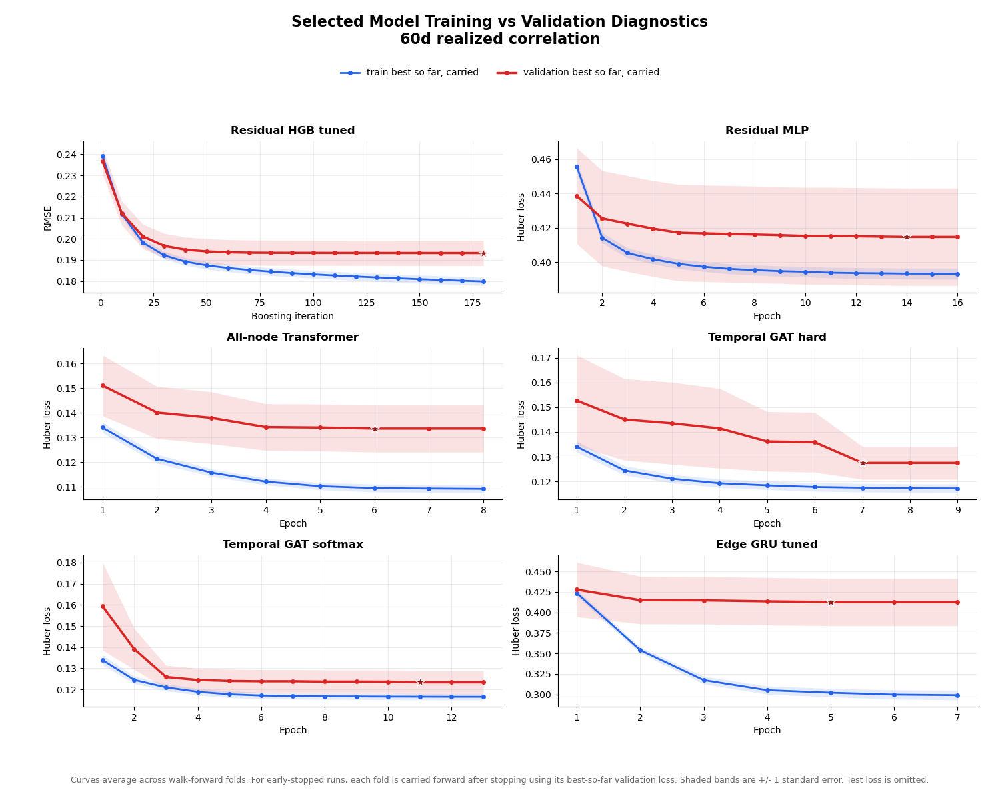

Wrote unified train/validation diagnostic plot to outputs/figures/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_unified_selected_train_validation_loss.png


,model,points,mean_folds_per_point,final_train_mean,final_validation_raw_mean,final_validation_best_mean
0,All-node Transformer,8,19.0,0.109154,0.118140,0.133581
1,Edge GRU tuned,7,19.0,0.299051,0.476639,0.412549
2,Residual HGB tuned,19,19.0,0.179812,0.196408,0.193266
3,Residual MLP,16,19.0,0.393280,0.290415,0.414736
4,Temporal GAT hard,9,19.0,0.117184,0.223491,0.127495
5,Temporal GAT softmax,13,19.0,0.116507,0.105750,0.123362


Loaded metrics from outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_forecast_metrics.csv


,n,MAE,RMSE,Bias,EdgeSignAcc_pm0.2,MeanDailySpearman
model,,,,,,
residual_hgb,1299674,0.153684,0.197662,0.001173,0.950110,0.436842
residual_hgb_tuned,1299674,0.156412,0.200768,0.009609,0.951033,0.433033
mlp_tuned,1299674,0.154645,0.203507,0.030247,0.948329,0.433127
temporal_gat_softmax_tuned,1299674,0.156237,0.208680,0.049740,0.950521,0.444173
edge_gru_tuned,1299674,0.158048,0.208975,0.029935,0.949307,0.406476
temporal_gat,1299674,0.158913,0.213746,0.052876,0.949988,0.444480
all_node_transformer_tuned,1299674,0.158843,0.217492,0.044779,0.948492,0.424191
ewma,1299674,0.177370,0.231059,-0.038611,0.915502,0.457525
persistence,1299674,0.185439,0.242097,-0.029067,0.910525,0.428995


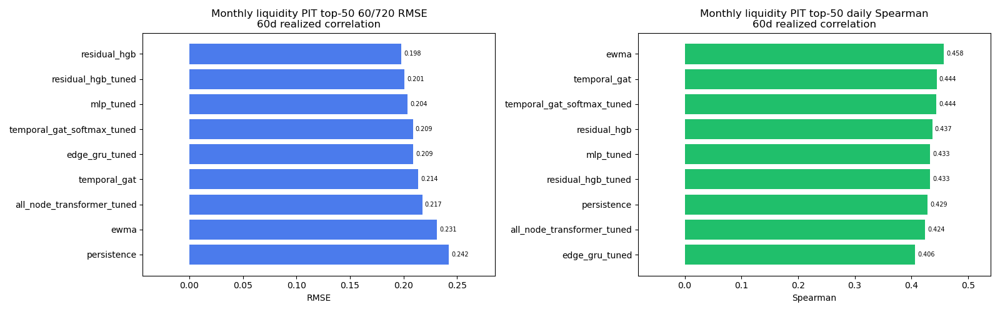

Loaded ERC utility results from outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_erc60_utility_summary.csv


,method,folds,mean_utility_loss_bps,median_utility_loss_bps,p90_utility_loss_bps,max_utility_loss_bps,mean_utility,mean_expected_return,mean_predicted_ann_vol,mean_realized_ann_vol,mean_true_risk_contrib_dispersion,mean_abs_vol_target_error,mean_gross_exposure_scaled,mean_max_weight_scaled,utility_loss_rank
0,oracle_realized_60d,17,0.000000,0.000000,0.000000,0.000000,0.025000,0.050000,0.1,0.100000,5.632323e-08,3.265362e-18,0.702434,0.524169,1.0
1,residual_hgb,17,2.316454,0.898878,5.152572,14.493662,0.024768,0.049503,0.1,0.099311,3.567846e-03,4.345777e-03,0.658497,0.488789,2.0
2,all_node_transformer_tuned,17,3.135708,1.742324,8.131945,16.662774,0.024686,0.048217,0.1,0.096763,3.691822e-03,6.327647e-03,0.699353,0.534978,3.0
3,mlp_tuned,17,3.193813,2.076790,6.900081,21.621010,0.024681,0.048441,0.1,0.097305,3.769188e-03,4.739065e-03,0.365511,0.201068,4.0
4,temporal_gat_softmax_tuned,17,3.553667,0.761135,6.649717,26.990840,0.024645,0.047838,0.1,0.096165,3.763525e-03,4.932772e-03,0.287855,0.125329,5.0
5,edge_gru_tuned,17,3.614507,1.440859,8.298558,26.538473,0.024639,0.048759,0.1,0.097999,3.805575e-03,5.095653e-03,0.292611,0.126272,6.0
6,residual_hgb_tuned,17,3.790233,1.428566,8.581191,28.736178,0.024621,0.049074,0.1,0.098658,3.805886e-03,5.300470e-03,0.292408,0.125198,7.0
7,temporal_gat,17,3.865692,0.931586,9.517671,25.593099,0.024613,0.047760,0.1,0.095985,3.812217e-03,5.376386e-03,0.312118,0.150751,8.0
8,ewma,17,5.279454,1.638416,15.045940,24.121446,0.024472,0.051955,0.1,0.104326,4.970405e-03,8.542284e-03,0.413186,0.237379,9.0
9,persistence,17,5.910878,2.216383,15.775935,25.735220,0.024409,0.052859,0.1,0.106193,5.826199e-03,8.496098e-03,0.391448,0.213887,10.0


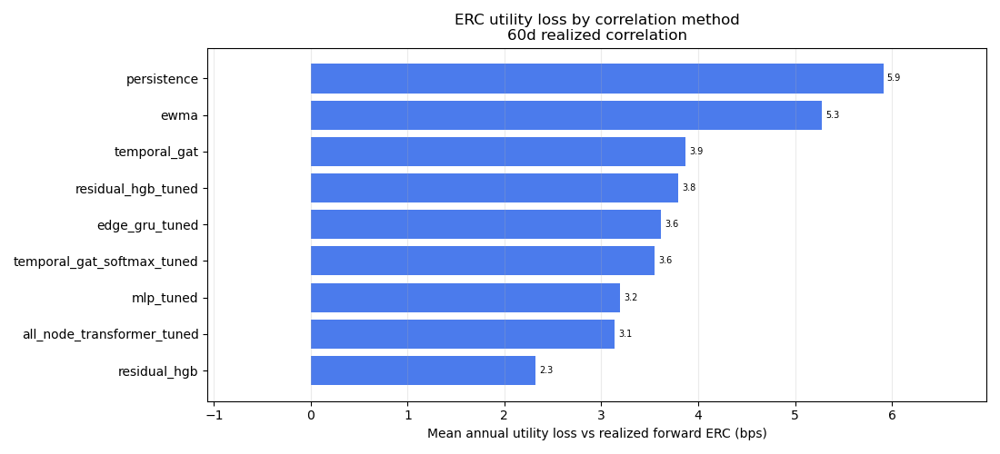

,fold,signal_date,method,utility_loss_bps,realized_ann_vol,true_risk_contrib_dispersion
0,2,2023-02-20,oracle_realized_60d,0.000000,0.100000,7.703609e-08
6,2,2023-02-20,temporal_gat_softmax_tuned,0.276083,0.099874,3.065290e-03
3,2,2023-02-20,residual_hgb,0.308264,0.100887,3.012557e-03
7,2,2023-02-20,mlp_tuned,0.333183,0.098570,3.078428e-03
10,3,2023-04-21,oracle_realized_60d,0.000000,0.100000,6.607457e-08
...,...,...,...,...,...,...
153,17,2025-08-08,residual_hgb,1.065607,0.100846,4.620687e-03
160,18,2025-10-07,oracle_realized_60d,0.000000,0.100000,7.991848e-08
163,18,2025-10-07,residual_hgb,14.493662,0.107352,5.108419e-03
168,18,2025-10-07,all_node_transformer_tuned,16.662774,0.112105,5.300276e-03


Loaded cached TSMOM downstream and refreshed summary at outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_tsmom_portfolio_summary.csv
Prepared standard TSMOM downstream cache for the period-subset and fast-signal sections below.
TSMOM common evaluation window: 2023-01-01 to 2025-12-05
Wrote outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_standard_tsmom_period_summary.csv


,period,eval_start,eval_end,clean_strategy,cum_simple_return,ann_return_log,ann_vol_log,sharpe_log,max_drawdown
0,20230101_to_20251205,2023-01-01,2025-12-05,temporal_gat_softmax_tuned,0.394449,0.113423,0.204295,0.555190,-0.465926
1,20230101_to_20251205,2023-01-01,2025-12-05,temporal_gat,0.318886,0.094418,0.199558,0.473137,-0.502058
2,20230101_to_20251205,2023-01-01,2025-12-05,all_node_transformer_tuned,0.180067,0.056480,0.198744,0.284184,-0.452185
3,20230101_to_20251205,2023-01-01,2025-12-05,ewma,0.111639,0.036103,0.201696,0.178997,-0.498841
4,20230101_to_20251205,2023-01-01,2025-12-05,edge_gru_tuned,0.044516,0.014857,0.204471,0.072662,-0.554315
5,20230101_to_20251205,2023-01-01,2025-12-05,residual_hgb_tuned,0.041141,0.013753,0.201561,0.068232,-0.524620
6,20230101_to_20251205,2023-01-01,2025-12-05,residual_hgb,0.022321,0.007530,0.200507,0.037557,-0.540627
7,20230101_to_20251205,2023-01-01,2025-12-05,mlp_tuned,-0.026498,-0.009161,0.199543,-0.045909,-0.550039
8,20230101_to_20251205,2023-01-01,2025-12-05,persistence,-0.243218,-0.095064,0.202476,-0.469506,-0.646697
9,20230101_to_20251205,2023-01-01,2025-12-05,diag_vol_scaled,-0.623680,-0.333384,0.530823,-0.628051,-0.904086


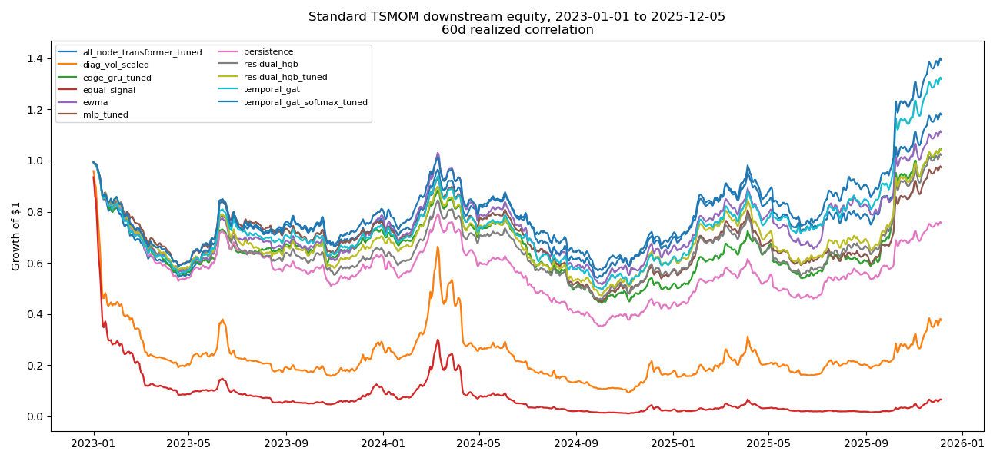

Loaded cached fast TSMOM and refreshed summary at outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_fast_tsmom_portfolio_summary.csv
Wrote outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_standard_vs_fast_tsmom_period_summary.csv


,period,eval_start,eval_end,signal_variant,clean_strategy,cum_simple_return,ann_return_log,ann_vol_log,sharpe_log,max_drawdown,avg_turnover,avg_abs_weight_change,annualized_weight_turnover,avg_gross_exposure,avg_net_exposure
11,20230101_to_20251205,2023-01-01,2025-12-05,fast,temporal_gat,1.086862,0.250950,0.197585,1.270086,-0.297319,0.132244,0.264488,221.371605,0.436091,0.002661
12,20230101_to_20251205,2023-01-01,2025-12-05,fast,residual_hgb,0.759168,0.192679,0.191823,1.004462,-0.295015,0.135574,0.271148,248.379023,0.398459,0.000846
13,20230101_to_20251205,2023-01-01,2025-12-05,fast,residual_hgb_tuned,0.664233,0.173755,0.192423,0.902985,-0.315728,0.136392,0.272784,247.420960,0.402416,0.001759
14,20230101_to_20251205,2023-01-01,2025-12-05,fast,mlp_tuned,0.650121,0.170850,0.193686,0.882100,-0.337723,0.144596,0.289192,269.596355,0.391530,0.003464
15,20230101_to_20251205,2023-01-01,2025-12-05,fast,temporal_gat_softmax_tuned,0.622322,0.165055,0.192471,0.857555,-0.309846,0.130471,0.260942,219.191225,0.434523,0.003338
16,20230101_to_20251205,2023-01-01,2025-12-05,fast,all_node_transformer_tuned,0.586173,0.157368,0.193471,0.813394,-0.329869,0.127029,0.254059,228.645053,0.405569,-0.003250
17,20230101_to_20251205,2023-01-01,2025-12-05,fast,edge_gru_tuned,0.523835,0.143691,0.194917,0.737190,-0.295293,0.123998,0.247997,243.002266,0.372502,-0.006421
18,20230101_to_20251205,2023-01-01,2025-12-05,fast,persistence,0.492222,0.136539,0.190235,0.717741,-0.279765,0.116980,0.233960,228.103869,0.374371,0.000690
19,20230101_to_20251205,2023-01-01,2025-12-05,fast,ewma,0.475493,0.132694,0.190380,0.696996,-0.307348,0.114290,0.228581,222.347584,0.375232,0.005940
20,20230101_to_20251205,2023-01-01,2025-12-05,fast,diag_vol_scaled,2.247646,0.401817,0.664918,0.604311,-0.810530,0.119562,0.239124,110.208779,0.791953,-0.001284


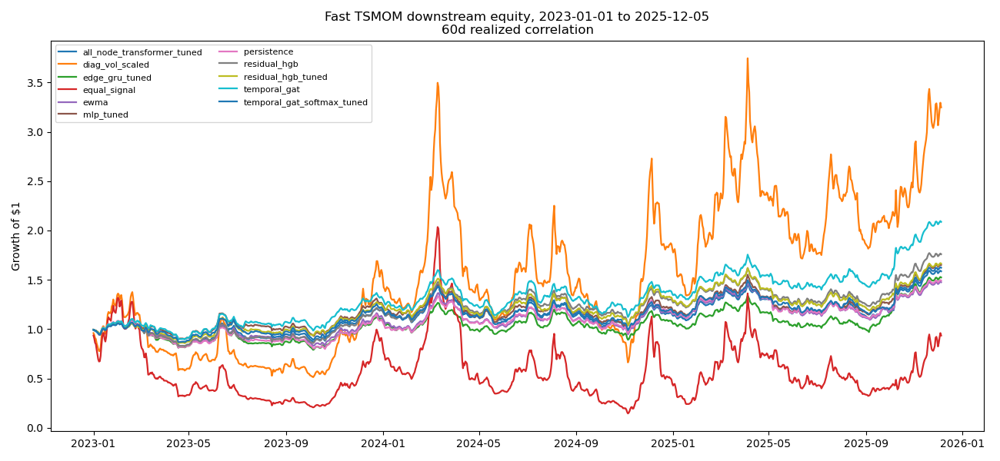

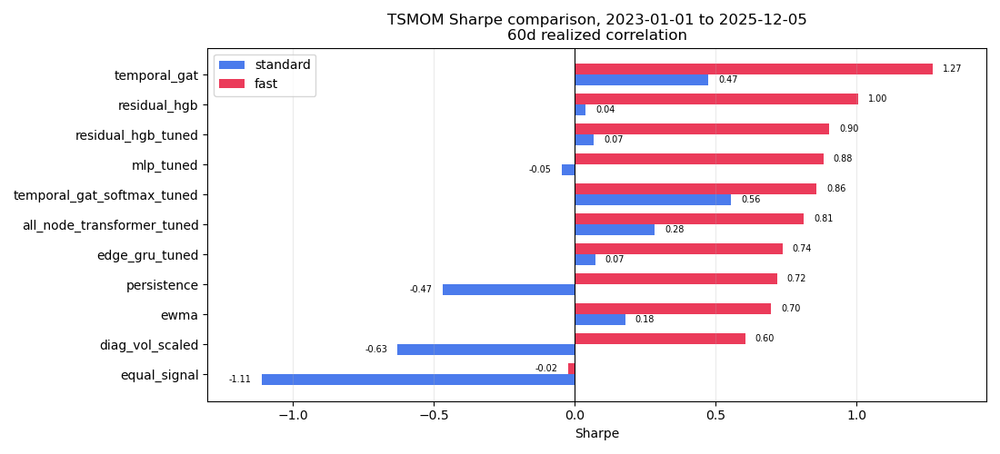

Wrote summary to outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_results_summary.json
  outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_return_quality_report.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_pair_panel.parquet
  outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_predictions.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_forecast_metrics.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_split_table.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_tsmom_portfolio_daily_returns.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_tsmom_portfolio_summary.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_results_summary.json

Running 120d realized-correlation experiment
Device: cpu
Using cached Yahoo PIT monthly liquidity universe files.
Daily universe: data/yahoo_pit_liquidity_top50_2021_

,metric,value
0,pit_start,2021-01-01
1,end_exclusive,2026-04-27
2,candidate_symbols_before_exclusion,4433
3,excluded_symbols,188
4,candidate_symbols_after_exclusion,4245
5,unique_selected_symbols,185
6,pit_days,1941
7,rebalance_months,64
8,mean_daily_universe_size,50.0
9,min_daily_universe_size,50


,rebalance_date,rank,symbol,trailing_90d_median_yahoo_dollar_volume,valid_volume_obs_90d
0,2021-01-01,1,BTC-USD,3.429807e+10,90
1,2021-01-01,2,ETH-USD,1.403649e+10,90
2,2021-01-01,3,XRP-USD,5.297277e+09,90
3,2021-01-01,4,LTC-USD,3.800396e+09,90
4,2021-01-01,5,BCH-USD,2.394786e+09,90
5,2021-01-01,6,EOS-USD,2.299136e+09,90
6,2021-01-01,7,LINK-USD,1.369995e+09,90
7,2021-01-01,8,XMR-USD,9.750610e+08,90
8,2021-01-01,9,TRX-USD,9.449605e+08,90
9,2021-01-01,10,ADA-USD,8.394999e+08,90


Returns source: data/yahoo_pit_liquidity_top50_2021_selected_log_returns_cleaned.csv
Run ID: pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120
Loaded returns: 2,036 dates x 185 symbols
PIT universe: 1,941 dates, 185 unique symbols
Experiment date range: 2021-01-01 to 2026-04-26


,date,rebalance_date,rank,symbol,trailing_90d_median_yahoo_dollar_volume,valid_volume_obs_90d,shortName,longName,marketCap,volume24Hr,history_start_proxy,history_days_proxy,base_symbol_clean,exclude_reason
0,2021-01-01,2021-01-01,1,BTC-USD,3.429807e+10,90,Bitcoin USD,Bitcoin USD,1554086363136,3.186990e+10,2010-07-13,5765.0,BTC,NaN
1,2021-01-01,2021-01-01,2,ETH-USD,1.403649e+10,90,Ethereum USD,Ethereum USD,279753162752,1.270991e+10,2015-08-07,3914.0,ETH,NaN
2,2021-01-01,2021-01-01,3,XRP-USD,5.297277e+09,90,XRP USD,XRP USD,88464154624,2.039322e+09,2013-08-04,4647.0,XRP,NaN
3,2021-01-01,2021-01-01,4,LTC-USD,3.800396e+09,90,Litecoin USD,Litecoin USD,4369837568,2.416718e+08,2013-04-28,4745.0,LTC,NaN
4,2021-01-01,2021-01-01,5,BCH-USD,2.394786e+09,90,Bitcoin Cash USD,Bitcoin Cash USD,9119477760,1.832352e+08,2017-07-23,3198.0,BCH,NaN
5,2021-01-01,2021-01-01,6,EOS-USD,2.299136e+09,90,EOS USD,EOS USD,0,7.119050e+05,2017-07-01,3220.0,EOS,NaN
6,2021-01-01,2021-01-01,7,LINK-USD,1.369995e+09,90,Chainlink USD,Chainlink USD,6846756352,4.160697e+08,2017-09-20,3139.0,LINK,NaN
7,2021-01-01,2021-01-01,8,XMR-USD,9.750610e+08,90,Monero USD,Monero USD,6793731072,1.096505e+08,2014-05-21,4357.0,XMR,NaN
8,2021-01-01,2021-01-01,9,TRX-USD,9.449605e+08,90,TRON USD,TRON USD,30626174976,8.845886e+08,2017-09-13,3146.0,TRX,NaN
9,2021-01-01,2021-01-01,10,ADA-USD,8.394999e+08,90,Cardano USD,Cardano USD,9089576960,3.271273e+08,2017-10-01,3128.0,ADA,NaN


Wrote return quality report to outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_return_quality_report.csv
Flagged symbols: 4 / 185


,symbol,total_obs,first_return,last_return,selected_days,selected_non_missing,selected_missing_share,selected_zero_return_share,selected_longest_zero_run,selected_max_abs_log_return,selected_max_abs_log_return_date,flag_count,flags
127,DYDX-USD,1647,2021-09-09,2026-04-26,91,60,0.340659,0.000000,0,0.080522,2023-10-24,1,selected_missing_gt_5pct
95,SHIB-USD,0,NaT,NaT,1333,0,1.000000,NaN,0,NaN,NaT,1,selected_missing_gt_5pct
161,BONK-USD,0,NaT,NaT,480,0,1.000000,NaN,0,NaN,NaT,1,selected_missing_gt_5pct
168,PEPE24478-USD,0,NaT,NaT,360,0,1.000000,NaN,0,NaN,NaT,1,selected_missing_gt_5pct
26,DOGE-USD,2035,2020-09-29,2026-04-26,1941,1941,0.000000,0.000000,0,1.000000,2021-01-28,0,
59,NPXS-USD,1970,2020-09-29,2026-04-24,61,61,0.000000,0.000000,0,1.000000,2021-05-27,0,
69,LUNC-USD,2032,2020-09-29,2026-04-26,822,819,0.003650,0.072039,4,1.000000,2022-05-14,0,
71,FTT-USD,2035,2020-09-29,2026-04-26,549,549,0.000000,0.000000,0,1.000000,2022-11-08,0,
163,OM-USD,2034,2020-09-29,2026-04-24,184,184,0.000000,0.000000,0,1.000000,2025-04-13,0,
39,MANA-USD,2035,2020-09-29,2026-04-26,1275,1275,0.000000,0.000000,0,0.935067,2021-10-30,0,


Loaded cached panel from outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_pair_panel.parquet
Panel rows: 2,159,154; dates: 1,843; pairs: 7,630


,date,asset_i,asset_j,i_idx,j_idx,pair_id,base_corr,ewma_corr,target_corr,r_i_lag1,...,vol7_j,vol_base_i,vol_base_j,vol_base_spread,vol_base_ratio,base_delta,base_roll_mean5,base_abs,target_residual,row_id
0,2021-01-01,ABBC-USD,ADA-USD,29,9,0,-0.084954,-0.008542,-0.035482,0.200262,...,0.104508,0.121061,0.101836,0.019225,1.188784,-0.054865,-0.052796,0.084954,0.049472,0
1,2021-01-02,ABBC-USD,ADA-USD,29,9,0,-0.074588,0.015080,-0.029731,0.219139,...,0.108735,0.121799,0.102162,0.019636,1.192208,0.010366,-0.059911,0.074588,0.044858,1
2,2021-01-03,ABBC-USD,ADA-USD,29,9,0,-0.075102,-0.017535,-0.011937,-0.158820,...,0.109028,0.120849,0.102505,0.018345,1.178966,-0.000513,-0.058438,0.075102,0.063164,2
3,2021-01-04,ABBC-USD,ADA-USD,29,9,0,-0.117586,-0.096790,0.006612,-0.133992,...,0.127728,0.119671,0.106151,0.013520,1.127364,-0.042485,-0.076464,0.117586,0.124199,3
4,2021-01-05,ABBC-USD,ADA-USD,29,9,0,-0.137824,-0.123330,-0.003071,-0.166026,...,0.164793,0.119632,0.113835,0.005797,1.050924,-0.020237,-0.098011,0.137824,0.134752,4


,fold,train_start,train_end,validation_start,validation_end,test_start,test_end,train_days,core_train_days_for_neural,validation_days,test_days
0,1,2021-01-01,2022-12-21,2022-08-24,2022-12-21,2022-12-22,2023-02-19,720,600,120,60
1,2,2021-03-02,2023-02-19,2022-10-23,2023-02-19,2023-02-20,2023-04-20,720,600,120,60
2,3,2021-05-01,2023-04-20,2022-12-22,2023-04-20,2023-04-21,2023-06-19,720,600,120,60
3,4,2021-06-30,2023-06-19,2023-02-20,2023-06-19,2023-06-20,2023-08-18,720,600,120,60
4,5,2021-08-29,2023-08-18,2023-04-21,2023-08-18,2023-08-19,2023-10-17,720,600,120,60
5,6,2021-10-28,2023-10-17,2023-06-20,2023-10-17,2023-10-18,2023-12-16,720,600,120,60
6,7,2021-12-27,2023-12-16,2023-08-19,2023-12-16,2023-12-17,2024-02-14,720,600,120,60
7,8,2022-02-25,2024-02-14,2023-10-18,2024-02-14,2024-02-15,2024-04-14,720,600,120,60
8,9,2022-04-26,2024-04-14,2023-12-17,2024-04-14,2024-04-15,2024-06-13,720,600,120,60
9,10,2022-06-25,2024-06-13,2024-02-15,2024-06-13,2024-06-14,2024-08-12,720,600,120,60


Loaded cached predictions from outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_predictions.csv


,n,MAE,RMSE,Bias,EdgeSignAcc_pm0.2,MeanDailySpearman
model,,,,,,
residual_hgb,1236686,0.127327,0.162492,-0.001214,0.971909,0.475400
residual_hgb_tuned,1236686,0.130434,0.166450,0.004259,0.971919,0.463759
mlp_tuned,1236686,0.129597,0.168961,0.015939,0.967802,0.467722
edge_gru_tuned,1236686,0.135791,0.175595,0.017023,0.969623,0.405052
temporal_gat,1236686,0.131396,0.176067,0.029316,0.968450,0.468379
all_node_transformer_tuned,1236686,0.131584,0.177838,0.032874,0.970349,0.469579
temporal_gat_softmax_tuned,1236686,0.134567,0.178491,0.031068,0.969428,0.467034
ewma,1236686,0.160271,0.210363,-0.029386,0.928879,0.469475
persistence,1236686,0.168484,0.220632,-0.019993,0.924033,0.446777


Loaded cached temporal GAT tuned predictions; skipping temporal GAT tuning.


,n,MAE,RMSE,Bias,EdgeSignAcc_pm0.2,MeanDailySpearman
model,,,,,,
residual_hgb,1236686,0.127327,0.162492,-0.001214,0.971909,0.475400
residual_hgb_tuned,1236686,0.130434,0.166450,0.004259,0.971919,0.463759
mlp_tuned,1236686,0.129597,0.168961,0.015939,0.967802,0.467722
edge_gru_tuned,1236686,0.135791,0.175595,0.017023,0.969623,0.405052
temporal_gat,1236686,0.131396,0.176067,0.029316,0.968450,0.468379
all_node_transformer_tuned,1236686,0.131584,0.177838,0.032874,0.970349,0.469579
temporal_gat_softmax_tuned,1236686,0.134567,0.178491,0.031068,0.969428,0.467034
ewma,1236686,0.160271,0.210363,-0.029386,0.928879,0.469475
persistence,1236686,0.168484,0.220632,-0.019993,0.924033,0.446777


Loaded cached MLP and all-node Transformer predictions; skipping deep baseline training.
No cached all-node Transformer attention diagnostics found. The current cached prediction files store forecasts, not model checkpoints or attention maps. To generate this diagnostic without retraining the full pipeline, rerun with FORCE_TRANSFORMER_ATTENTION_DIAGNOSTICS=1; future Transformer training will write the attention-by-pair and attention-by-|rho| caches automatically.
Loaded GAT tuning history from outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_gat_tuning_history.csv


,model,model_label,config_id,folds,mean_best_val_loss
8,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.7_l5_h32_g2_drop0.2,4,0.093730
5,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.7_l10_h32_g2_drop0.1,3,0.091291
4,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.5_l5_h32_g2_drop0.2,3,0.115162
2,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.3_l5_h32_g2_drop0.1,2,0.095200
6,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.7_l10_h32_g2_drop0.2,2,0.107581
3,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.5_l10_h32_g2_drop0.1,1,0.086198
7,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.7_l5_h32_g2_drop0.1,1,0.096113
1,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.3_l10_h32_g2_drop0.2,1,0.099652
0,temporal_gat,Temporal GAT hard-threshold tuned,hard_thr0.3_l10_h32_g2_drop0.1,1,0.128475
18,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,softmax_abs_tau5.0_l5_h32_g2_drop0.1,3,0.089185


,model,model_label,folds,max_epoch,mean_train_loss,mean_val_loss,mean_test_loss
0,temporal_gat,Temporal GAT hard-threshold tuned,18,7,0.101228,0.111855,0.126813
1,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,18,7,0.100496,0.111727,0.136868


Loaded cached edge GRU tuned predictions; skipping edge GRU tuning.


,n,MAE,RMSE,Bias,EdgeSignAcc_pm0.2,MeanDailySpearman
model,,,,,,
residual_hgb,1236686,0.127327,0.162492,-0.001214,0.971909,0.475400
residual_hgb_tuned,1236686,0.130434,0.166450,0.004259,0.971919,0.463759
mlp_tuned,1236686,0.129597,0.168961,0.015939,0.967802,0.467722
edge_gru_tuned,1236686,0.135791,0.175595,0.017023,0.969623,0.405052
temporal_gat,1236686,0.131396,0.176067,0.029316,0.968450,0.468379
all_node_transformer_tuned,1236686,0.131584,0.177838,0.032874,0.970349,0.469579
temporal_gat_softmax_tuned,1236686,0.134567,0.178491,0.031068,0.969428,0.467034
ewma,1236686,0.160271,0.210363,-0.029386,0.928879,0.469475
persistence,1236686,0.168484,0.220632,-0.019993,0.924033,0.446777


Loaded Edge GRU tuning history from outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_edge_gru_tuning_history.csv


,config_id,folds,mean_best_val_loss
0,seq30_h32_emb12,4,0.336434
2,seq60_h32_emb12,4,0.429055
3,seq60_h48_emb12,3,0.319523
1,seq30_h48_emb12,3,0.342808
4,seq90_h32_emb12,3,0.348893
5,seq90_h48_emb12,1,0.332746


Loaded HGB tuning history from outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_hgb_tuning_history.csv


,config_id,folds,mean_best_val_rmse
1,leaf15_min50_l20.05_lr0.05_iter180,8,0.161837
0,leaf15_min30_l20.05_lr0.05_iter180,6,0.153221
3,leaf31_min50_l20.05_lr0.05_iter180,2,0.147544
4,leaf63_min50_l20.05_lr0.05_iter180,1,0.198187
2,leaf31_min30_l20.05_lr0.05_iter180,1,0.201847


,config_id,mean_train_rmse,mean_val_rmse,folds
1,leaf15_min50_l20.05_lr0.05_iter180,0.151099,0.161721,18
0,leaf15_min30_l20.05_lr0.05_iter180,0.151090,0.161733,18
3,leaf31_min50_l20.05_lr0.05_iter180,0.147012,0.162412,18
2,leaf31_min30_l20.05_lr0.05_iter180,0.146988,0.162449,18
4,leaf63_min30_l20.05_lr0.05_iter180,0.141709,0.163276,18
5,leaf63_min50_l20.05_lr0.05_iter180,0.141768,0.163331,18


Skipping Residual HGB tuning plot; keeping the selected-config table for reference.


,iteration,train_rmse,validation_rmse,test_diagnostic_rmse
9,90,0.153190,0.161409,0.163317
10,100,0.152660,0.161365,0.163333
11,110,0.152215,0.161336,0.163276
12,120,0.151822,0.161340,0.163286
13,130,0.151453,0.161374,0.163302
14,140,0.151116,0.161393,0.163322
15,150,0.150790,0.161424,0.163389
16,160,0.150484,0.161473,0.163449
17,170,0.150190,0.161535,0.163524
18,180,0.149926,0.161553,0.163547


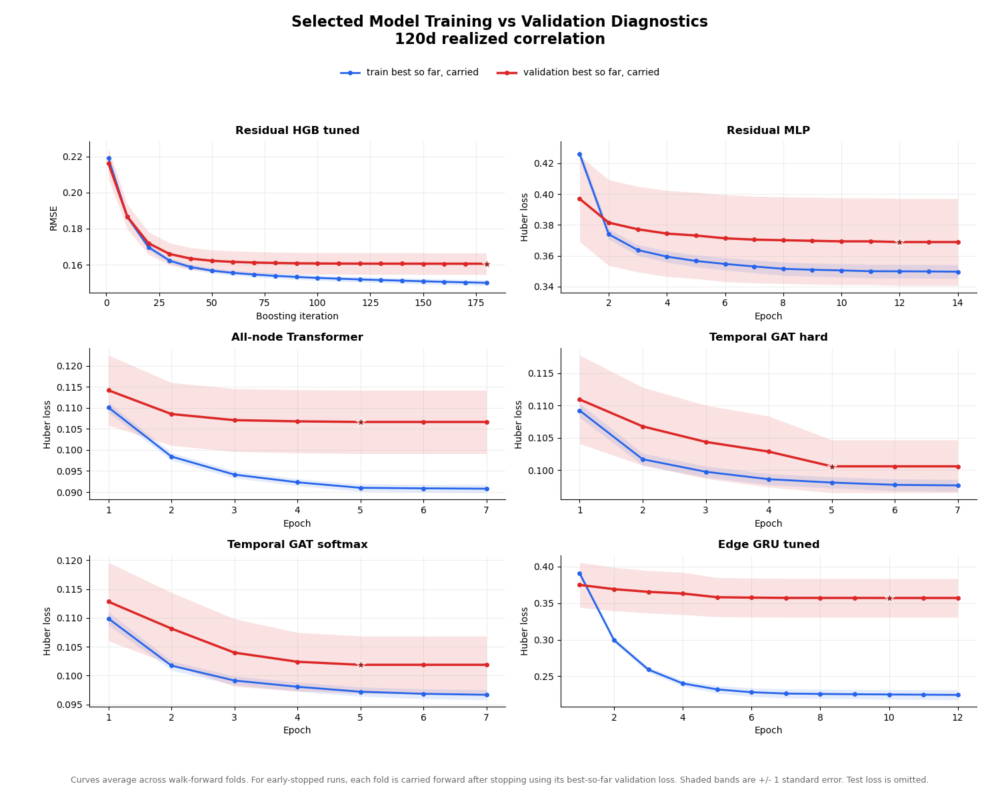

Wrote unified train/validation diagnostic plot to outputs/figures/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_unified_selected_train_validation_loss.png


,model,points,mean_folds_per_point,final_train_mean,final_validation_raw_mean,final_validation_best_mean
0,All-node Transformer,7,18.0,0.090782,0.095784,0.106663
1,Edge GRU tuned,12,18.0,0.224544,0.495675,0.357132
2,Residual HGB tuned,19,18.0,0.149926,0.161553,0.160548
3,Residual MLP,14,18.0,0.349701,0.262154,0.368895
4,Temporal GAT hard,7,18.0,0.097620,0.138904,0.100571
5,Temporal GAT softmax,7,18.0,0.096662,0.117157,0.101870


Loaded metrics from outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_forecast_metrics.csv


,n,MAE,RMSE,Bias,EdgeSignAcc_pm0.2,MeanDailySpearman
model,,,,,,
residual_hgb,1236686,0.127327,0.162492,-0.001214,0.971909,0.475400
residual_hgb_tuned,1236686,0.130434,0.166450,0.004259,0.971919,0.463759
mlp_tuned,1236686,0.129597,0.168961,0.015939,0.967802,0.467722
edge_gru_tuned,1236686,0.135791,0.175595,0.017023,0.969623,0.405052
temporal_gat,1236686,0.131396,0.176067,0.029316,0.968450,0.468379
all_node_transformer_tuned,1236686,0.131584,0.177838,0.032874,0.970349,0.469579
temporal_gat_softmax_tuned,1236686,0.134567,0.178491,0.031068,0.969428,0.467034
ewma,1236686,0.160271,0.210363,-0.029386,0.928879,0.469475
persistence,1236686,0.168484,0.220632,-0.019993,0.924033,0.446777


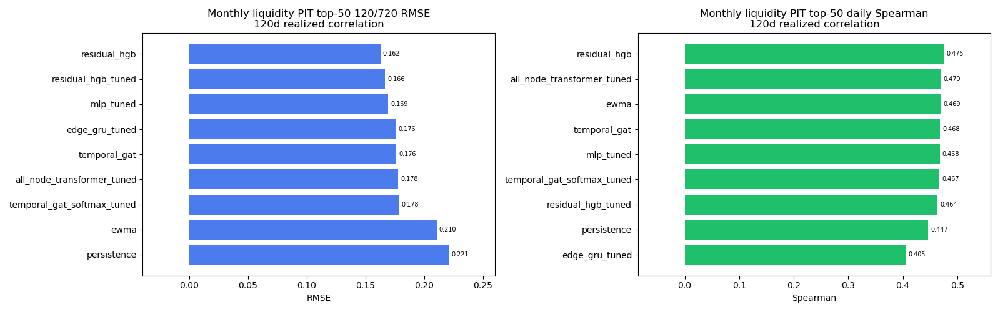

Loaded ERC utility results from outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_erc120_utility_summary.csv


,method,folds,mean_utility_loss_bps,median_utility_loss_bps,p90_utility_loss_bps,max_utility_loss_bps,mean_utility,mean_expected_return,mean_predicted_ann_vol,mean_realized_ann_vol,mean_true_risk_contrib_dispersion,mean_abs_vol_target_error,mean_gross_exposure_scaled,mean_max_weight_scaled,utility_loss_rank
0,oracle_realized_120d,17,0.000000,0.000000,0.000000,0.000000,0.025000,0.050000,0.1,0.100000,6.187838e-08,6.530724e-18,0.407716,0.231396,1.0
1,residual_hgb,17,1.230284,0.418205,3.369227,5.154075,0.024877,0.049854,0.1,0.099839,3.086190e-03,3.496046e-03,0.375358,0.203529,2.0
2,edge_gru_tuned,17,1.986392,0.590489,4.951615,11.943361,0.024801,0.049320,0.1,0.098887,3.347031e-03,3.794893e-03,0.323268,0.155139,3.0
3,residual_hgb_tuned,17,2.034520,0.336610,5.063555,12.163483,0.024797,0.049482,0.1,0.099224,3.265751e-03,3.666846e-03,0.298841,0.129563,4.0
4,mlp_tuned,17,2.147914,0.590397,4.803956,12.097118,0.024785,0.049282,0.1,0.098810,3.221818e-03,4.227998e-03,0.358698,0.190721,5.0
5,temporal_gat_softmax_tuned,17,2.342001,1.009153,6.479916,12.088423,0.024766,0.048829,0.1,0.097900,3.272190e-03,5.123254e-03,0.359666,0.194314,6.0
6,all_node_transformer_tuned,17,2.554796,0.823228,9.350014,12.799574,0.024745,0.048717,0.1,0.097725,3.458447e-03,4.895966e-03,0.647419,0.482254,7.0
7,temporal_gat,17,3.394053,1.232944,10.021563,21.109848,0.024661,0.048949,0.1,0.098248,3.720495e-03,5.987586e-03,0.759686,0.594107,8.0
8,ewma,17,5.847226,1.266909,9.252552,50.790380,0.024415,0.052230,0.1,0.104669,4.801660e-03,9.249158e-03,0.413100,0.237361,9.0
9,persistence,17,5.950598,1.825074,11.665524,44.833604,0.024405,0.053037,0.1,0.106306,5.525889e-03,9.410318e-03,0.391360,0.213867,10.0


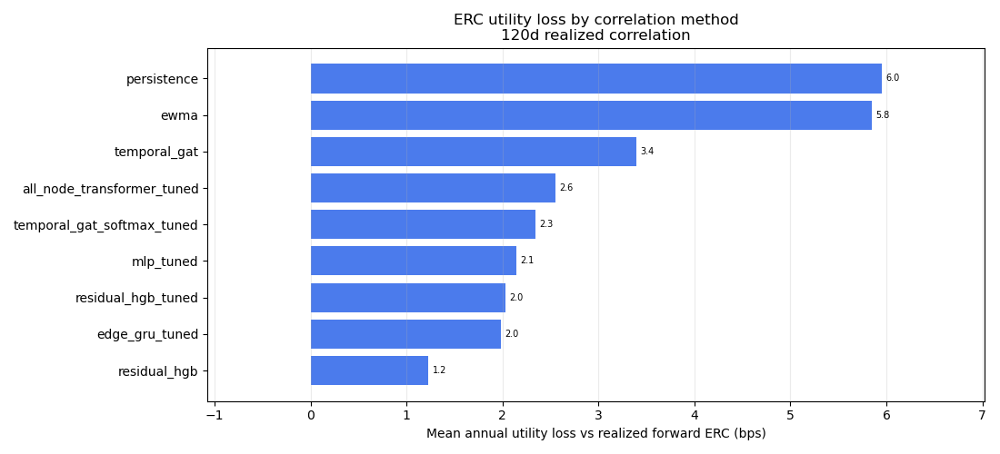

,fold,signal_date,method,utility_loss_bps,realized_ann_vol,true_risk_contrib_dispersion
0,2,2023-02-20,oracle_realized_120d,0.000000,0.100000,9.519585e-08
7,2,2023-02-20,mlp_tuned,0.156336,0.099784,2.960348e-03
9,2,2023-02-20,edge_gru_tuned,0.188513,0.100772,3.021232e-03
3,2,2023-02-20,residual_hgb,0.206745,0.101756,2.642813e-03
10,3,2023-04-21,oracle_realized_120d,0.000000,0.100000,3.451125e-08
...,...,...,...,...,...,...
152,17,2025-08-08,ewma,5.690709,0.103075,7.479281e-03
160,18,2025-10-07,oracle_realized_120d,0.000000,0.100000,4.495800e-08
163,18,2025-10-07,residual_hgb,3.224575,0.105055,3.834524e-03
167,18,2025-10-07,mlp_tuned,3.389732,0.104740,3.970221e-03


Loaded cached TSMOM downstream and refreshed summary at outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_tsmom_portfolio_summary.csv
Prepared standard TSMOM downstream cache for the period-subset and fast-signal sections below.
TSMOM common evaluation window: 2023-01-01 to 2025-12-05
Wrote outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_standard_tsmom_period_summary.csv


,period,eval_start,eval_end,clean_strategy,cum_simple_return,ann_return_log,ann_vol_log,sharpe_log,max_drawdown
0,20230101_to_20251205,2023-01-01,2025-12-05,mlp_tuned,0.447910,0.126256,0.202650,0.623025,-0.503601
1,20230101_to_20251205,2023-01-01,2025-12-05,temporal_gat,0.420917,0.119837,0.205609,0.582837,-0.472274
2,20230101_to_20251205,2023-01-01,2025-12-05,all_node_transformer_tuned,0.315215,0.093467,0.205611,0.454583,-0.479021
3,20230101_to_20251205,2023-01-01,2025-12-05,temporal_gat_softmax_tuned,0.288182,0.086383,0.205854,0.419632,-0.485053
4,20230101_to_20251205,2023-01-01,2025-12-05,residual_hgb_tuned,0.109087,0.035319,0.199896,0.176685,-0.525099
5,20230101_to_20251205,2023-01-01,2025-12-05,ewma,0.045512,0.015182,0.200274,0.075806,-0.498841
6,20230101_to_20251205,2023-01-01,2025-12-05,edge_gru_tuned,0.029963,0.010071,0.205224,0.049072,-0.453561
7,20230101_to_20251205,2023-01-01,2025-12-05,residual_hgb,-0.013475,-0.004628,0.204940,-0.022581,-0.557088
8,20230101_to_20251205,2023-01-01,2025-12-05,persistence,-0.273508,-0.108998,0.201517,-0.540887,-0.645490
9,20230101_to_20251205,2023-01-01,2025-12-05,diag_vol_scaled,-0.622687,-0.332484,0.530885,-0.626283,-0.903514


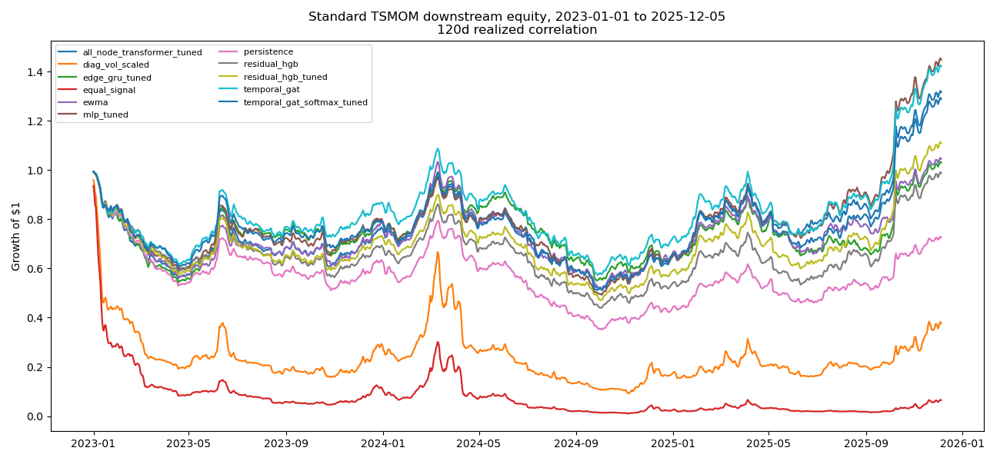

Loaded cached fast TSMOM and refreshed summary at outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_fast_tsmom_portfolio_summary.csv
Wrote outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_standard_vs_fast_tsmom_period_summary.csv


,period,eval_start,eval_end,signal_variant,clean_strategy,cum_simple_return,ann_return_log,ann_vol_log,sharpe_log,max_drawdown,avg_turnover,avg_abs_weight_change,annualized_weight_turnover,avg_gross_exposure,avg_net_exposure
11,20230101_to_20251205,2023-01-01,2025-12-05,fast,temporal_gat,1.116302,0.255729,0.197895,1.292242,-0.268967,0.131761,0.263522,209.839405,0.458377,0.005952
12,20230101_to_20251205,2023-01-01,2025-12-05,fast,all_node_transformer_tuned,1.073001,0.248677,0.195272,1.273487,-0.284020,0.127876,0.255751,220.668826,0.423029,0.004695
13,20230101_to_20251205,2023-01-01,2025-12-05,fast,residual_hgb_tuned,0.995479,0.235676,0.197591,1.192745,-0.327038,0.134671,0.269342,236.668281,0.415391,0.003664
14,20230101_to_20251205,2023-01-01,2025-12-05,fast,edge_gru_tuned,0.881306,0.215577,0.195204,1.104368,-0.276815,0.125622,0.251245,241.561553,0.379631,-0.006709
15,20230101_to_20251205,2023-01-01,2025-12-05,fast,mlp_tuned,0.842894,0.208540,0.194293,1.073328,-0.288277,0.143029,0.286058,254.663958,0.409997,0.004129
16,20230101_to_20251205,2023-01-01,2025-12-05,fast,temporal_gat_softmax_tuned,0.853699,0.210534,0.198564,1.060286,-0.307548,0.130803,0.261606,209.991981,0.454714,0.008205
17,20230101_to_20251205,2023-01-01,2025-12-05,fast,residual_hgb,0.605702,0.161542,0.193962,0.832854,-0.346718,0.135498,0.270996,238.178550,0.415292,0.003674
18,20230101_to_20251205,2023-01-01,2025-12-05,fast,persistence,0.489679,0.135958,0.190145,0.715019,-0.279765,0.116774,0.233548,227.965731,0.373938,0.000540
19,20230101_to_20251205,2023-01-01,2025-12-05,fast,ewma,0.473989,0.132346,0.190362,0.695232,-0.307348,0.113954,0.227908,222.097696,0.374548,0.005755
20,20230101_to_20251205,2023-01-01,2025-12-05,fast,diag_vol_scaled,2.247198,0.401770,0.665206,0.603979,-0.810530,0.119569,0.239138,110.193142,0.792113,-0.001436


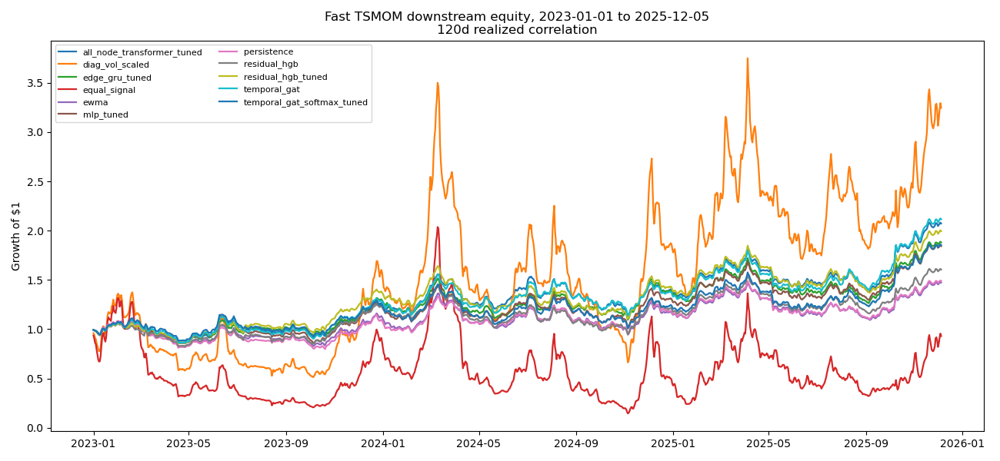

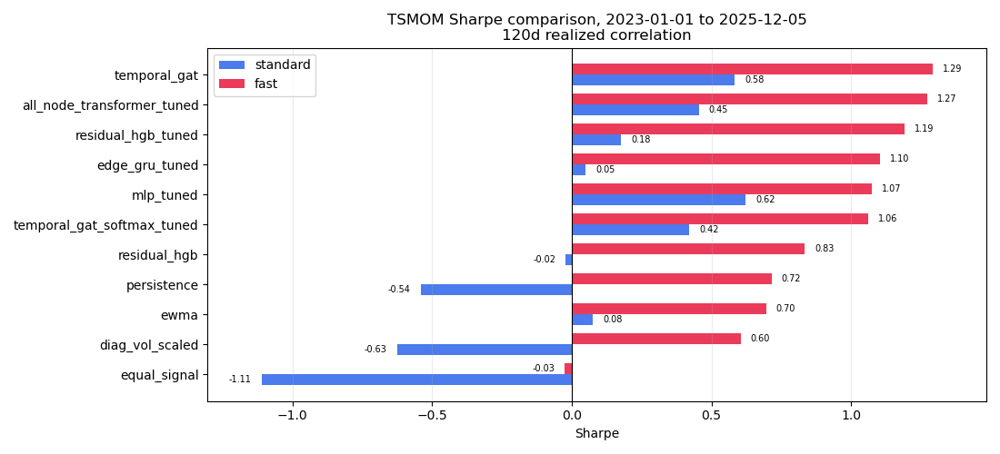

Wrote summary to outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_results_summary.json
  outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_return_quality_report.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_pair_panel.parquet
  outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_predictions.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_forecast_metrics.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_split_table.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_tsmom_portfolio_daily_returns.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_tsmom_portfolio_summary.csv
  outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_results_summary.json


{60: {'horizon_days': 60,
  'run_id': 'pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120',
  'summary_json': PosixPath('/Users/michaelw/Documents/College/Classes/2026_SPRING/CPSC 483/Crypto Final Project/outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_results_summary.json'),
  'forecast_metrics_cache': PosixPath('/Users/michaelw/Documents/College/Classes/2026_SPRING/CPSC 483/Crypto Final Project/outputs/pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120_forecast_metrics.csv'),
  'tsmom_comparison_cache': None,
  'erc_summary_cache': None},
 120: {'horizon_days': 120,
  'run_id': 'pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120',
  'summary_json': PosixPath('/Users/michaelw/Documents/College/Classes/2026_SPRING/CPSC 483/Crypto Final Project/outputs/pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120_results_summary.json'),
  'forecast_metrics_cache': PosixPath('/Users/michaelw/Documents/College/Classes/2026_SPRING/CPSC 483/Cry

In [23]:
EXPERIMENT_HORIZONS = [60, 120]
run_outputs = {}

for horizon in EXPERIMENT_HORIZONS:
    run_outputs[horizon] = run_correlation_experiment(forward_window_days=horizon)

run_outputs


## Temporal GAT Sensitivity Analysis

The next cells turn the GAT tuning histories into final-report tables. They answer three questions:

- Which configurations were selected across folds?
- Which hyperparameters were consistently helpful?
- Did the selected GAT forecasts translate into better standard or fast TSMOM summaries?


#### Load and Summarize GAT Tuning Inputs


In [24]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

try:
    from IPython.display import display
except Exception:
    display = print

PROJECT_ROOT = Path.cwd()
OUTPUT_DIR = PROJECT_ROOT / "outputs"
FIGURE_DIR = OUTPUT_DIR / "figures"
FINAL_OUTPUT_DIR = OUTPUT_DIR / "final"
FINAL_TABLE_DIR = FINAL_OUTPUT_DIR / "tables"
FINAL_FIGURE_DIR = FINAL_OUTPUT_DIR / "figures"
for path in [OUTPUT_DIR, FIGURE_DIR, FINAL_OUTPUT_DIR, FINAL_TABLE_DIR, FINAL_FIGURE_DIR]:
    path.mkdir(parents=True, exist_ok=True)

GAT_SENSITIVITY_HORIZONS = [60, 120]
GAT_SENSITIVITY_PREFIX_TEMPLATE = "pit_liquidity_top50_2021_cleaned_fwd{horizon}_60_720_tuned_600_120"


def gat_sensitivity_paths(horizon: int) -> dict[str, Path]:
    prefix = GAT_SENSITIVITY_PREFIX_TEMPLATE.format(horizon=horizon)
    return {
        "history": OUTPUT_DIR / f"{prefix}_gat_tuning_history.csv",
        "selected": OUTPUT_DIR / f"{prefix}_gat_selected_configs.csv",
        "forecast": OUTPUT_DIR / f"{prefix}_forecast_metrics.csv",
        "tsmom": OUTPUT_DIR / f"{prefix}_standard_vs_fast_tsmom_period_summary.csv",
    }


def load_gat_sensitivity_inputs(horizons: list[int] = GAT_SENSITIVITY_HORIZONS) -> dict[str, pd.DataFrame]:
    history_frames = []
    selected_frames = []
    forecast_frames = []
    downstream_frames = []
    missing = []

    for horizon in horizons:
        paths = gat_sensitivity_paths(horizon)
        for name, path in paths.items():
            if not path.exists():
                missing.append(str(path.relative_to(PROJECT_ROOT)))

        if paths["history"].exists():
            history = pd.read_csv(paths["history"])
            history.insert(0, "horizon_days", horizon)
            history_frames.append(history)

        if paths["selected"].exists():
            selected = pd.read_csv(paths["selected"])
            selected.insert(0, "horizon_days", horizon)
            selected_frames.append(selected)

        if paths["forecast"].exists():
            forecast = pd.read_csv(paths["forecast"])
            forecast.insert(0, "horizon_days", horizon)
            forecast_frames.append(forecast)

        if paths["tsmom"].exists():
            downstream = pd.read_csv(paths["tsmom"])
            downstream.insert(0, "horizon_days", horizon)
            downstream_frames.append(downstream)

    if missing:
        print("Missing optional GAT sensitivity inputs:")
        for item in missing:
            print(f"  {item}")

    return {
        "history": pd.concat(history_frames, ignore_index=True) if history_frames else pd.DataFrame(),
        "selected": pd.concat(selected_frames, ignore_index=True) if selected_frames else pd.DataFrame(),
        "forecast": pd.concat(forecast_frames, ignore_index=True) if forecast_frames else pd.DataFrame(),
        "downstream": pd.concat(downstream_frames, ignore_index=True) if downstream_frames else pd.DataFrame(),
    }


def build_gat_sensitivity_tables(inputs: dict[str, pd.DataFrame]) -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    history = inputs["history"].copy()
    selected = inputs["selected"].copy()
    downstream = inputs["downstream"].copy()

    if history.empty:
        raise FileNotFoundError("No GAT tuning history cache found. Run the main experiment first.")

    numeric_cols = [
        "train_loss",
        "val_loss",
        "test_loss",
        "threshold",
        "lookback_days",
        "hidden_dim",
        "num_gat_layers",
        "dropout",
        "tau",
        "epoch",
    ]
    for col in numeric_cols:
        if col in history.columns:
            history[col] = pd.to_numeric(history[col], errors="coerce")
        if col in selected.columns:
            selected[col] = pd.to_numeric(selected[col], errors="coerce")

    history["selected_epoch"] = history["selected_epoch"].astype(str).str.lower().isin(["true", "1", "yes"])

    best_epoch = (
        history.sort_values(["horizon_days", "model", "fold", "config_id", "val_loss", "epoch"])
        .groupby(["horizon_days", "model", "model_label", "family", "fold", "config_id"], as_index=False)
        .first()
    )

    selected_key_cols = ["horizon_days", "model", "fold", "config_id"]
    if not selected.empty:
        selected_flags = selected[selected_key_cols].drop_duplicates().assign(selected_by_fold=True)
    else:
        selected_flags = pd.DataFrame(columns=selected_key_cols + ["selected_by_fold"])
    best_epoch = best_epoch.merge(selected_flags, on=selected_key_cols, how="left")
    best_epoch["selected_by_fold"] = best_epoch["selected_by_fold"].eq(True)

    config_cols = [
        "horizon_days",
        "model",
        "model_label",
        "family",
        "config_id",
        "threshold",
        "tau",
        "lookback_days",
        "hidden_dim",
        "num_gat_layers",
        "dropout",
    ]
    config_summary = (
        best_epoch.groupby(config_cols, dropna=False)
        .agg(
            folds_present=("fold", "nunique"),
            selected_folds=("selected_by_fold", "sum"),
            mean_best_epoch=("epoch", "mean"),
            mean_best_train_loss=("train_loss", "mean"),
            mean_best_val_loss=("val_loss", "mean"),
            mean_best_test_loss=("test_loss", "mean"),
            std_best_val_loss=("val_loss", "std"),
            std_best_test_loss=("test_loss", "std"),
        )
        .reset_index()
    )
    config_summary["selected_share"] = config_summary["selected_folds"] / config_summary["folds_present"].replace(0, np.nan)

    sensitivity_frames = []
    for param in ["threshold", "tau", "lookback_days", "dropout"]:
        subset = best_epoch.dropna(subset=[param]).copy()
        if subset.empty:
            continue
        summary = (
            subset.groupby(["horizon_days", "model", "model_label", "family", param], dropna=False)
            .agg(
                config_fold_count=("config_id", "count"),
                unique_configs=("config_id", "nunique"),
                mean_best_val_loss=("val_loss", "mean"),
                mean_best_test_loss=("test_loss", "mean"),
                selected_count=("selected_by_fold", "sum"),
            )
            .reset_index()
            .rename(columns={param: "value"})
        )
        summary.insert(4, "hyperparameter", param)
        summary["selected_share"] = summary["selected_count"] / summary["config_fold_count"].replace(0, np.nan)
        sensitivity_frames.append(summary)

    hyperparameter_summary = pd.concat(sensitivity_frames, ignore_index=True) if sensitivity_frames else pd.DataFrame()

    if not selected.empty:
        selected_frequency = (
            selected.groupby(
                ["horizon_days", "model", "model_label", "family", "config_id", "threshold", "tau", "lookback_days", "dropout"],
                dropna=False,
            )
            .agg(
                selected_folds=("fold", "nunique"),
                mean_best_val_loss=("best_val_loss", "mean"),
                mean_best_epoch=("best_epoch", "mean"),
            )
            .reset_index()
            .sort_values(["horizon_days", "model", "selected_folds"], ascending=[True, True, False])
        )
    else:
        selected_frequency = pd.DataFrame()

    if not downstream.empty:
        gat_downstream = downstream[downstream["clean_strategy"].isin(["temporal_gat", "temporal_gat_softmax_tuned"])].copy()
        gat_downstream = gat_downstream[
            [
                "horizon_days",
                "signal_variant",
                "clean_strategy",
                "sharpe_log",
                "ann_return_log",
                "ann_vol_log",
                "max_drawdown",
                "days",
            ]
        ].sort_values(["horizon_days", "signal_variant", "sharpe_log"], ascending=[True, True, False])
    else:
        gat_downstream = pd.DataFrame()

    return best_epoch, config_summary, hyperparameter_summary, selected_frequency, gat_downstream


#### Build and Save GAT Sensitivity Tables


In [25]:
gat_sensitivity_inputs = load_gat_sensitivity_inputs()
(
    gat_best_epoch_by_config_fold,
    gat_config_sensitivity,
    gat_hyperparameter_sensitivity,
    gat_selected_config_frequency,
    gat_downstream_selected_summary,
) = build_gat_sensitivity_tables(gat_sensitivity_inputs)

for name, df in {
    "gat_best_epoch_by_config_fold": gat_best_epoch_by_config_fold,
    "gat_config_sensitivity": gat_config_sensitivity,
    "gat_hyperparameter_sensitivity": gat_hyperparameter_sensitivity,
    "gat_selected_config_frequency": gat_selected_config_frequency,
    "gat_downstream_selected_summary": gat_downstream_selected_summary,
}.items():
    out_path = FINAL_TABLE_DIR / f"{name}.csv"
    df.to_csv(out_path, index=False)
    print(f"Wrote {out_path.relative_to(PROJECT_ROOT)}")

print("\nTop selected Temporal GAT configs by horizon and family:")
display(
    gat_selected_config_frequency.groupby(["horizon_days", "model"], group_keys=False)
    .head(5)
    .reset_index(drop=True)
)

print("\nHyperparameter sensitivity summary:")
display(gat_hyperparameter_sensitivity)

print("\nSelected GAT downstream slow/fast TSMOM summary:")
display(gat_downstream_selected_summary)


Wrote outputs/final/tables/gat_best_epoch_by_config_fold.csv
Wrote outputs/final/tables/gat_config_sensitivity.csv
Wrote outputs/final/tables/gat_hyperparameter_sensitivity.csv
Wrote outputs/final/tables/gat_selected_config_frequency.csv
Wrote outputs/final/tables/gat_downstream_selected_summary.csv

Top selected Temporal GAT configs by horizon and family:


,horizon_days,model,model_label,family,config_id,threshold,tau,lookback_days,dropout,selected_folds,mean_best_val_loss,mean_best_epoch
0,60,temporal_gat,Temporal GAT hard-threshold tuned,hard,hard_thr0.5_l5_h32_g2_drop0.1,0.5,NaN,5,0.1,3,0.133884,5.333333
1,60,temporal_gat,Temporal GAT hard-threshold tuned,hard,hard_thr0.3_l10_h32_g2_drop0.1,0.3,NaN,10,0.1,2,0.132667,3.500000
2,60,temporal_gat,Temporal GAT hard-threshold tuned,hard,hard_thr0.3_l5_h32_g2_drop0.1,0.3,NaN,5,0.1,2,0.112824,3.500000
3,60,temporal_gat,Temporal GAT hard-threshold tuned,hard,hard_thr0.3_l5_h32_g2_drop0.2,0.3,NaN,5,0.2,2,0.108735,1.000000
4,60,temporal_gat,Temporal GAT hard-threshold tuned,hard,hard_thr0.7_l10_h32_g2_drop0.1,0.7,NaN,10,0.1,2,0.109735,4.000000
5,60,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,softmax_abs,softmax_abs_tau0.5_l5_h32_g2_drop0.2,NaN,0.5,5,0.2,3,0.107602,4.666667
6,60,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,softmax_abs,softmax_abs_tau2.0_l10_h32_g2_drop0.2,NaN,2.0,10,0.2,3,0.124982,6.000000
7,60,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,softmax_abs,softmax_abs_tau5.0_l10_h32_g2_drop0.1,NaN,5.0,10,0.1,3,0.123507,2.666667
8,60,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,softmax_abs,softmax_abs_tau0.5_l10_h32_g2_drop0.2,NaN,0.5,10,0.2,2,0.149745,3.000000
9,60,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,softmax_abs,softmax_abs_tau2.0_l5_h32_g2_drop0.1,NaN,2.0,5,0.1,2,0.130320,3.500000



Hyperparameter sensitivity summary:


,horizon_days,model,model_label,family,hyperparameter,value,config_fold_count,unique_configs,mean_best_val_loss,mean_best_test_loss,selected_count,selected_share
0,60,temporal_gat,Temporal GAT hard-threshold tuned,hard,threshold,0.3,76,4,0.145866,0.170046,7,0.092105
1,60,temporal_gat,Temporal GAT hard-threshold tuned,hard,threshold,0.5,76,4,0.147082,0.174252,5,0.065789
2,60,temporal_gat,Temporal GAT hard-threshold tuned,hard,threshold,0.7,76,4,0.142359,0.159735,7,0.092105
3,120,temporal_gat,Temporal GAT hard-threshold tuned,hard,threshold,0.3,72,4,0.110007,0.135039,4,0.055556
4,120,temporal_gat,Temporal GAT hard-threshold tuned,hard,threshold,0.5,72,4,0.110927,0.134727,4,0.055556
5,120,temporal_gat,Temporal GAT hard-threshold tuned,hard,threshold,0.7,72,4,0.108943,0.130000,10,0.138889
6,60,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,softmax_abs,tau,0.5,76,4,0.144936,0.166153,7,0.092105
7,60,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,softmax_abs,tau,2.0,76,4,0.136576,0.156864,6,0.078947
8,60,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,softmax_abs,tau,5.0,76,4,0.139195,0.162682,6,0.078947
9,120,temporal_gat_softmax_tuned,Temporal GAT softmax-|rho| tuned,softmax_abs,tau,0.5,72,4,0.108454,0.128902,5,0.069444



Selected GAT downstream slow/fast TSMOM summary:


,horizon_days,signal_variant,clean_strategy,sharpe_log,ann_return_log,ann_vol_log,max_drawdown,days
0,60,fast,temporal_gat,1.270086,0.250950,0.197585,-0.297319,1070
4,60,fast,temporal_gat_softmax_tuned,0.857555,0.165055,0.192471,-0.309846,1070
11,60,standard,temporal_gat_softmax_tuned,0.555190,0.113423,0.204295,-0.465926,1070
12,60,standard,temporal_gat,0.473137,0.094418,0.199558,-0.502058,1070
22,120,fast,temporal_gat,1.292242,0.255729,0.197895,-0.268967,1070
27,120,fast,temporal_gat_softmax_tuned,1.060286,0.210534,0.198564,-0.307548,1070
34,120,standard,temporal_gat,0.582837,0.119837,0.205609,-0.472274,1070
36,120,standard,temporal_gat_softmax_tuned,0.419632,0.086383,0.205854,-0.485053,1070


### Temporal GAT Sensitivity Figures

The table outputs from the previous section are easier to interpret as compact figures. The plotting cells below create publication-ready summaries for hyperparameter effects, selected configuration frequency, and downstream Sharpe ratios.


#### Define GAT Sensitivity Plotting Helpers


In [26]:
GAT_COLOR_BY_HORIZON = {60: "#2563eb", 120: "#dc2626"}
GAT_FAMILY_COLORS = {"temporal_gat": "#2563eb", "temporal_gat_softmax_tuned": "#16a34a"}
GAT_SIGNAL_COLORS = {"standard": "#4b5563", "fast": "#e11d48"}


def clean_gat_model_label(model: str) -> str:
    return {
        "temporal_gat": "GAT hard",
        "temporal_gat_softmax_tuned": "GAT softmax",
    }.get(str(model), str(model))


def format_gat_config_label(row: pd.Series) -> str:
    lookback = int(row["lookback_days"]) if pd.notna(row.get("lookback_days")) else "?"
    dropout = float(row["dropout"]) if pd.notna(row.get("dropout")) else np.nan
    if str(row.get("family")) == "hard":
        threshold = float(row["threshold"]) if pd.notna(row.get("threshold")) else np.nan
        first = f"thr {threshold:.1f}"
    else:
        tau = float(row["tau"]) if pd.notna(row.get("tau")) else np.nan
        first = f"tau {tau:g}"
    return f"{first} | L{lookback} | drop {dropout:.1f}"


def style_sensitivity_axis(ax, title: str, xlabel: str | None = None, ylabel: str | None = None) -> None:
    ax.set_title(title, fontsize=12, weight="semibold", pad=10)
    if xlabel:
        ax.set_xlabel(xlabel, fontsize=10)
    if ylabel:
        ax.set_ylabel(ylabel, fontsize=10)
    ax.grid(axis="y", color="#d1d5db", alpha=0.75, linewidth=0.8)
    ax.grid(axis="x", color="#e5e7eb", alpha=0.45, linewidth=0.7)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_color("#9ca3af")
    ax.spines["bottom"].set_color("#9ca3af")
    ax.tick_params(labelsize=9, colors="#374151")


def label_bars(ax, bars, fmt="{:.2f}", fontsize=8, offset_fraction: float = 0.012):
    xmin, xmax = ax.get_xlim()
    offset = max(abs(xmax - xmin) * offset_fraction, 0.01)
    for bar in bars:
        width = float(bar.get_width())
        if not np.isfinite(width):
            continue
        x = width + (offset if width >= 0 else -offset)
        ha = "left" if width >= 0 else "right"
        ax.text(
            x,
            bar.get_y() + bar.get_height() / 2,
            fmt.format(width),
            va="center",
            ha=ha,
            fontsize=fontsize,
            color="#111827",
        )


def plot_gat_hyperparameter_sensitivity(hyperparameter_summary: pd.DataFrame) -> Path:
    plot_specs = [
        ("hard", "threshold", "Hard threshold", "Threshold"),
        ("softmax_abs", "tau", "Softmax temperature", "Tau"),
        ("hard", "lookback_days", "Hard GAT lookback", "Lookback days"),
        ("softmax_abs", "lookback_days", "Softmax GAT lookback", "Lookback days"),
    ]
    from matplotlib.lines import Line2D

    fig, axes = plt.subplots(2, 2, figsize=(14.2, 9.0))
    axes = axes.ravel()

    for ax, (family, hyperparameter, title, xlabel) in zip(axes, plot_specs):
        subset = hyperparameter_summary.loc[
            hyperparameter_summary["family"].eq(family)
            & hyperparameter_summary["hyperparameter"].eq(hyperparameter)
        ].copy()
        if subset.empty:
            ax.text(0.5, 0.5, "No cached data", ha="center", va="center", transform=ax.transAxes)
            style_sensitivity_axis(ax, title, xlabel, "Huber loss")
            continue

        subset = subset.sort_values(["horizon_days", "value"])
        for horizon, group in subset.groupby("horizon_days"):
            group = group.sort_values("value")
            color = GAT_COLOR_BY_HORIZON.get(int(horizon), "#6b7280")
            marker_sizes = 80 + 1100 * group["selected_share"].fillna(0).to_numpy(dtype=float)

            ax.plot(
                group["value"],
                group["mean_best_val_loss"],
                color=color,
                marker="o",
                linewidth=2.4,
                label=f"{horizon}d validation",
                zorder=3,
            )
            ax.scatter(
                group["value"],
                group["mean_best_val_loss"],
                s=marker_sizes,
                color=color,
                alpha=0.18,
                edgecolor=color,
                linewidth=1.2,
                zorder=2,
            )
            ax.plot(
                group["value"],
                group["mean_best_test_loss"],
                color=color,
                linestyle=":",
                marker="x",
                linewidth=1.6,
                alpha=0.58,
                label=f"{horizon}d test",
                zorder=1,
            )

            best_idx = group["mean_best_val_loss"].idxmin()
            best_row = group.loc[best_idx]
            ax.scatter(
                [best_row["value"]],
                [best_row["mean_best_val_loss"]],
                marker="*",
                s=150,
                color=color,
                edgecolor="white",
                linewidth=0.8,
                zorder=5,
            )
            for _, row in group.iterrows():
                if row["selected_share"] >= 0.08:
                    ax.annotate(
                        f"{row['selected_share']:.0%}",
                        (row["value"], row["mean_best_val_loss"]),
                        textcoords="offset points",
                        xytext=(0, 9),
                        ha="center",
                        fontsize=7,
                        color="#374151",
                    )

        style_sensitivity_axis(ax, title, xlabel, "Huber loss")

    legend_handles = []
    for horizon, color in GAT_COLOR_BY_HORIZON.items():
        legend_handles.extend(
            [
                Line2D([0], [0], color=color, marker="o", linewidth=2.4, markersize=5, label=f"{horizon}d validation"),
                Line2D([0], [0], color=color, marker="x", linestyle=":", linewidth=1.8, markersize=6, alpha=0.72, label=f"{horizon}d test"),
            ]
        )

    fig.suptitle(
        "Temporal GAT Hyperparameter Sensitivity",
        fontsize=15,
        weight="bold",
        y=0.982,
    )
    fig.legend(
        handles=legend_handles,
        loc="upper center",
        bbox_to_anchor=(0.5, 0.925),
        ncol=4,
        frameon=False,
        fontsize=9,
        handlelength=2.6,
        columnspacing=1.4,
    )
    fig.text(
        0.5,
        0.028,
        "Bubble size and percentage labels indicate how often chronological validation selected that setting. Stars mark lowest mean validation loss.",
        ha="center",
        fontsize=9,
        color="#4b5563",
    )
    fig.subplots_adjust(left=0.075, right=0.985, top=0.835, bottom=0.12, hspace=0.40, wspace=0.26)
    out_path = FINAL_FIGURE_DIR / "gat_hyperparameter_sensitivity.png"
    fig.savefig(out_path, dpi=240, bbox_inches="tight", pad_inches=0.26)
    plt.show()
    return out_path


def plot_gat_selected_config_frequency(selected_frequency: pd.DataFrame) -> Path:
    panels = [
        (60, "temporal_gat", "60d hard GAT"),
        (60, "temporal_gat_softmax_tuned", "60d softmax GAT"),
        (120, "temporal_gat", "120d hard GAT"),
        (120, "temporal_gat_softmax_tuned", "120d softmax GAT"),
    ]
    fig, axes = plt.subplots(2, 2, figsize=(14.2, 9.1))
    axes = axes.ravel()

    for ax, (horizon, model, title) in zip(axes, panels):
        subset = selected_frequency.loc[
            selected_frequency["horizon_days"].eq(horizon)
            & selected_frequency["model"].eq(model)
        ].copy()
        subset = subset.sort_values(["selected_folds", "mean_best_val_loss"], ascending=[False, True]).head(6)
        subset = subset.sort_values("selected_folds", ascending=True)
        if subset.empty:
            ax.text(0.5, 0.5, "No cached data", ha="center", va="center", transform=ax.transAxes)
            style_sensitivity_axis(ax, title, "Selected folds")
            continue

        labels = subset.apply(format_gat_config_label, axis=1)
        color = GAT_FAMILY_COLORS.get(model, "#4b5563")
        bars = ax.barh(labels, subset["selected_folds"], color=color, alpha=0.86, height=0.64)
        ax.set_xlim(0, max(6, float(subset["selected_folds"].max()) + 1.2))
        label_bars(ax, bars, fmt="{:.0f}", fontsize=8)
        for bar, val_loss in zip(bars, subset["mean_best_val_loss"]):
            ax.text(
                0.12,
                bar.get_y() + bar.get_height() / 2,
                f"val {val_loss:.3f}",
                va="center",
                ha="left",
                fontsize=7,
                color="white" if bar.get_width() >= 2 else "#374151",
                weight="semibold" if bar.get_width() >= 2 else "normal",
            )
        style_sensitivity_axis(ax, title, "Selected folds")
        ax.grid(axis="y", visible=False)

    fig.suptitle("Most Frequently Selected Temporal GAT Configurations", fontsize=15, weight="bold", y=0.972)
    fig.text(
        0.5,
        0.028,
        "Bars count folds in which validation selected the configuration; in-bar labels show mean best validation loss.",
        ha="center",
        fontsize=9,
        color="#4b5563",
    )
    fig.subplots_adjust(left=0.18, right=0.985, top=0.875, bottom=0.12, hspace=0.38, wspace=0.30)
    out_path = FINAL_FIGURE_DIR / "gat_selected_config_frequency.png"
    fig.savefig(out_path, dpi=240, bbox_inches="tight", pad_inches=0.30)
    plt.show()
    return out_path


def plot_selected_gat_downstream_sharpe(gat_downstream: pd.DataFrame) -> Path:
    if gat_downstream.empty:
        raise ValueError("No selected GAT downstream summary available.")

    plot_df = gat_downstream.copy()
    plot_df["model_label"] = plot_df["clean_strategy"].map(
        {
            "temporal_gat": "Hard GAT",
            "temporal_gat_softmax_tuned": "Softmax GAT",
        }
    ).fillna(plot_df["clean_strategy"])
    plot_df["x_label"] = plot_df["horizon_days"].astype(str) + "d\n" + plot_df["model_label"]
    pivot = (
        plot_df.pivot_table(index=["horizon_days", "model_label", "x_label"], columns="signal_variant", values="sharpe_log", aggfunc="first")
        .reset_index()
        .sort_values(["horizon_days", "model_label"])
    )

    x = np.arange(len(pivot))
    width = 0.34
    fig, ax = plt.subplots(figsize=(10.2, 5.2))
    standard = pivot.get("standard", pd.Series(np.nan, index=pivot.index)).to_numpy(dtype=float)
    fast = pivot.get("fast", pd.Series(np.nan, index=pivot.index)).to_numpy(dtype=float)

    bars_standard = ax.bar(x - width / 2, standard, width, label="Slow TSMOM", color=GAT_SIGNAL_COLORS["standard"], alpha=0.88)
    bars_fast = ax.bar(x + width / 2, fast, width, label="Fast TSMOM", color=GAT_SIGNAL_COLORS["fast"], alpha=0.9)

    for bars in [bars_standard, bars_fast]:
        for bar in bars:
            height = float(bar.get_height())
            if not np.isfinite(height):
                continue
            va = "bottom" if height >= 0 else "top"
            y = height + (0.025 if height >= 0 else -0.025)
            ax.text(bar.get_x() + bar.get_width() / 2, y, f"{height:.2f}", ha="center", va=va, fontsize=8)

    ax.axhline(0, color="#111827", linewidth=0.9)
    ax.set_xticks(x)
    ax.set_xticklabels(pivot["x_label"], fontsize=9)
    ax.set_ylabel("Sharpe", fontsize=10)
    ax.set_title("Selected Temporal GAT Downstream Sharpe", fontsize=15, weight="bold", pad=18)
    ax.legend(frameon=False, ncol=2, loc="upper left")
    ax.grid(axis="y", color="#d1d5db", alpha=0.75)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_color("#9ca3af")
    ax.spines["bottom"].set_color("#9ca3af")
    ymin = min(-0.05, np.nanmin([standard, fast]) - 0.12)
    ymax = max(1.35, np.nanmax([standard, fast]) + 0.18)
    ax.set_ylim(ymin, ymax)

    fig.subplots_adjust(left=0.095, right=0.985, top=0.86, bottom=0.17)
    out_path = FINAL_FIGURE_DIR / "gat_selected_downstream_sharpe.png"
    fig.savefig(out_path, dpi=240, bbox_inches="tight", pad_inches=0.30)
    plt.show()
    return out_path


#### Render and Save GAT Sensitivity Figures


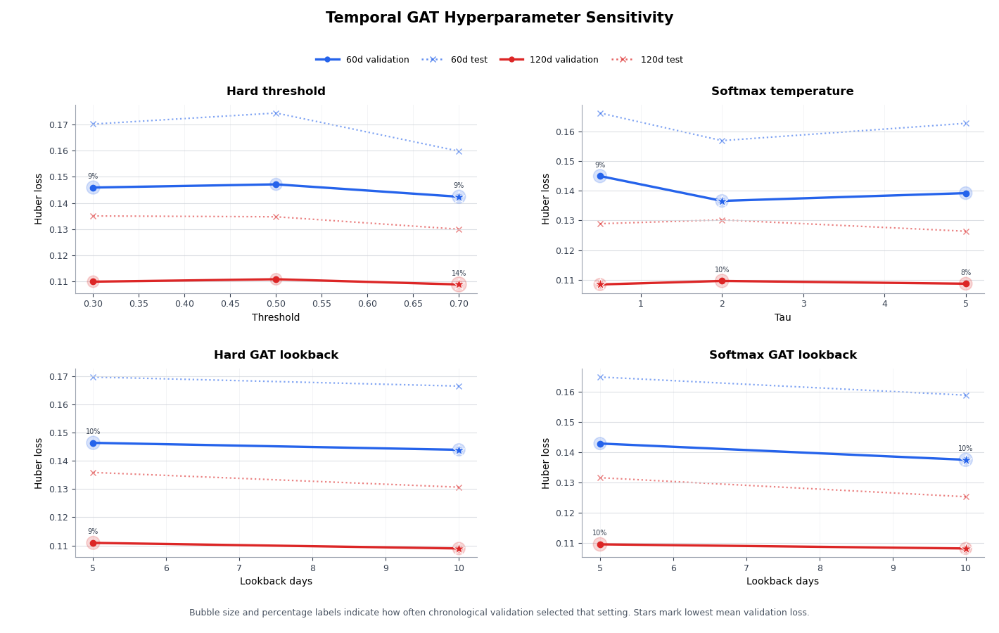

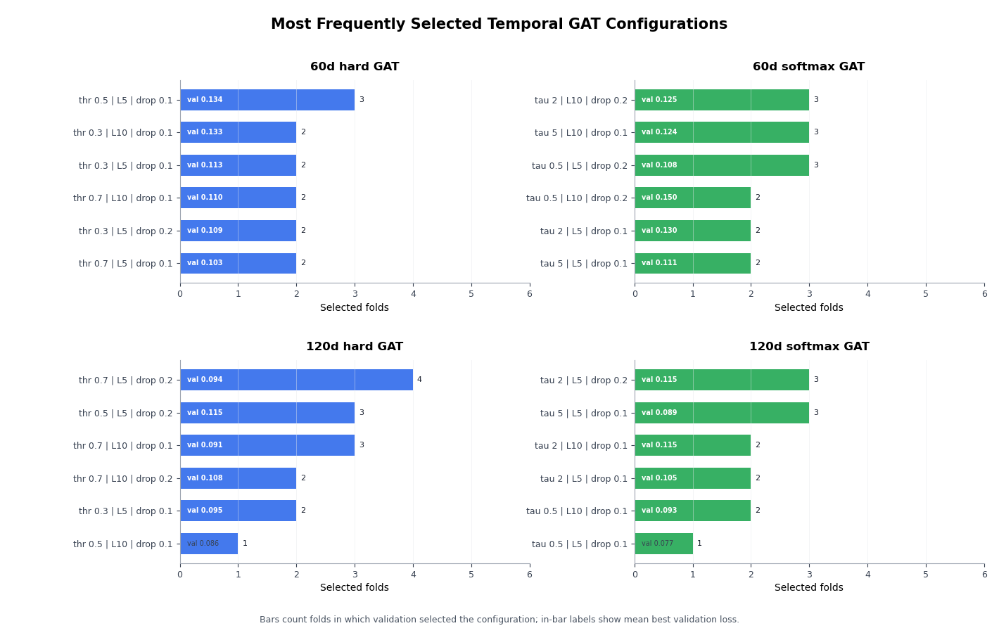

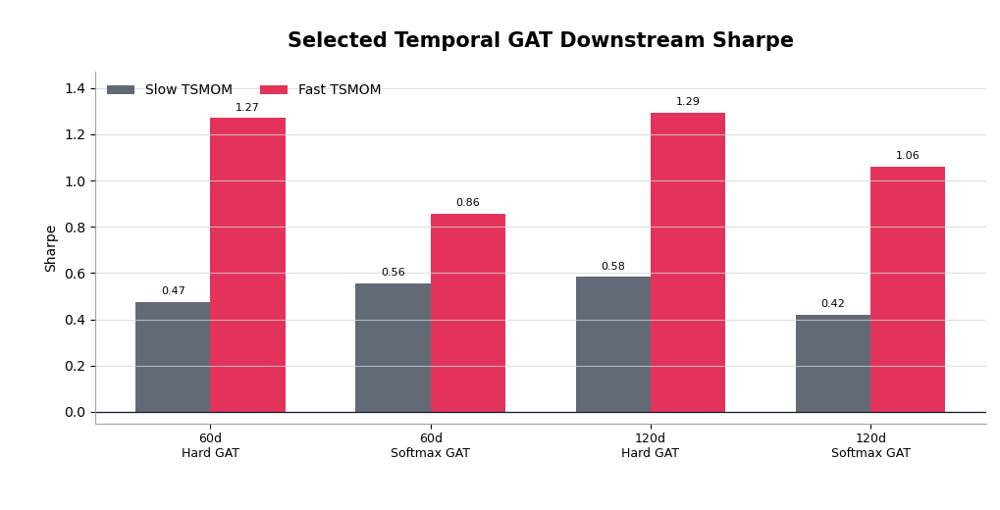

Wrote prettier Temporal GAT sensitivity figures:
  outputs/final/figures/gat_hyperparameter_sensitivity.png
  outputs/final/figures/gat_selected_config_frequency.png
  outputs/final/figures/gat_selected_downstream_sharpe.png


In [27]:
sensitivity_figure_paths = [
    plot_gat_hyperparameter_sensitivity(gat_hyperparameter_sensitivity),
    plot_gat_selected_config_frequency(gat_selected_config_frequency),
    plot_selected_gat_downstream_sharpe(gat_downstream_selected_summary),
]

print("Wrote prettier Temporal GAT sensitivity figures:")
for path in sensitivity_figure_paths:
    print(f"  {path.relative_to(PROJECT_ROOT)}")


## Matrix-Level Market-Mode Summary

Pairwise RMSE can hide whether a model captures the dominant market mode of the full correlation matrix. This section reconstructs forecast correlation matrices and compares broad matrix statistics against the realized target matrix.

The compact table focuses on the 120d horizon because that horizon is central to the final portfolio results.


#### Define Matrix-Market Summary Helpers


In [28]:
MARKET_MODE_COMPACT_PREFIX = "pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120"
MARKET_MODE_COMPACT_MODELS = {
    "HGB": "pred_residual_hgb",
    "MLP": "pred_mlp_tuned",
    "GAT hard": "pred_temporal_gat",
    "Transformer": "pred_all_node_transformer_tuned",
}


def compact_corr_matrix_stats(group: pd.DataFrame, col: str) -> tuple[float, float]:
    use = group.dropna(subset=[col, "i_idx", "j_idx"])
    asset_ids = np.sort(np.unique(np.concatenate([use["i_idx"].to_numpy(), use["j_idx"].to_numpy()])))
    n_assets = len(asset_ids)
    if n_assets < 2:
        return np.nan, np.nan
    local = {asset_id: pos for pos, asset_id in enumerate(asset_ids)}
    mat = np.eye(n_assets, dtype=float)
    i_pos = np.array([local[x] for x in use["i_idx"].to_numpy()], dtype=int)
    j_pos = np.array([local[x] for x in use["j_idx"].to_numpy()], dtype=int)
    values = np.clip(use[col].to_numpy(dtype=float), -0.99, 0.99)
    mat[i_pos, j_pos] = values
    mat[j_pos, i_pos] = values
    mat = np.nan_to_num((mat + mat.T) / 2.0, nan=0.0, posinf=0.99, neginf=-0.99)
    offdiag = mat[~np.eye(n_assets, dtype=bool)]
    lambda1_share = np.linalg.eigvalsh(mat)[-1] / n_assets
    return float(np.mean(offdiag)), float(lambda1_share)


def build_compact_market_mode_summary() -> pd.DataFrame:
    pred_path = OUTPUT_DIR / f"{MARKET_MODE_COMPACT_PREFIX}_predictions.csv"
    pred = pd.read_csv(pred_path, parse_dates=["date"])
    rows = []
    for date, day in pred.groupby("date", sort=True):
        target_mean_offdiag, target_lambda1_share = compact_corr_matrix_stats(day, "target_corr")
        for model, pred_col in MARKET_MODE_COMPACT_MODELS.items():
            mean_offdiag, lambda1_share = compact_corr_matrix_stats(day, pred_col)
            rows.append(
                {
                    "date": date,
                    "Model": model,
                    "Mean offdiag rho": mean_offdiag,
                    "Target mean offdiag": target_mean_offdiag,
                    "First eigenvalue share": lambda1_share,
                    "Target first eigenvalue share": target_lambda1_share,
                }
            )
    daily = pd.DataFrame(rows)
    summary = (
        daily.groupby("Model", as_index=False)[
            [
                "Mean offdiag rho",
                "Target mean offdiag",
                "First eigenvalue share",
                "Target first eigenvalue share",
            ]
        ]
        .mean()
    )
    order = {model: i for i, model in enumerate(MARKET_MODE_COMPACT_MODELS)}
    summary["_order"] = summary["Model"].map(order)
    summary = summary.sort_values("_order").drop(columns="_order").reset_index(drop=True)
    return summary


#### Build Compact Matrix-Market Table


In [29]:
market_mode_compact_summary = build_compact_market_mode_summary()
market_mode_compact_summary_path = FINAL_TABLE_DIR / "matrix_market_mode_compact_120d.csv"
market_mode_compact_summary.to_csv(market_mode_compact_summary_path, index=False)
print(f"Wrote {market_mode_compact_summary_path.relative_to(PROJECT_ROOT)}")
display(market_mode_compact_summary.style.format({
    "Mean offdiag rho": "{:.3f}",
    "Target mean offdiag": "{:.3f}",
    "First eigenvalue share": "{:.3f}",
    "Target first eigenvalue share": "{:.3f}",
}))


Wrote outputs/final/tables/matrix_market_mode_compact_120d.csv


,Model,Mean offdiag rho,Target mean offdiag,First eigenvalue share,Target first eigenvalue share
0,HGB,0.622,0.623,0.636,0.651
1,MLP,0.639,0.623,0.654,0.651
2,GAT hard,0.653,0.623,0.668,0.651
3,Transformer,0.656,0.623,0.671,0.651


## Market-Mode Evidence Checks

This section digs deeper into the market-mode question. It checks whether models match the average off-diagonal correlation while still under- or over-estimating the first eigenvalue share.

That distinction matters because a forecast can get the average pairwise correlation roughly right while still missing the common crypto market factor.


#### Define Market-Mode Evidence Helpers


In [30]:
from IPython.display import display, Image

MARKET_MODE_EVIDENCE_MODELS = {
    "HGB": "pred_residual_hgb",
    "MLP": "pred_mlp_tuned",
    "GAT hard": "pred_temporal_gat",
    "GAT softmax": "pred_temporal_gat_softmax_tuned",
    "Transformer": "pred_all_node_transformer_tuned",
}
MARKET_MODE_EVIDENCE_PREFIXES = {
    60: "pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120",
    120: "pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120",
}
MARKET_MODE_EVIDENCE_REBUILD = False
MARKET_MODE_CLOSE_MEAN_THRESHOLD = 0.02

market_mode_evidence_daily_path = FINAL_TABLE_DIR / "daily_market_mode_evidence.csv"
market_mode_evidence_summary_path = FINAL_TABLE_DIR / "market_mode_evidence_summary.csv"
market_mode_evidence_close_path = FINAL_TABLE_DIR / "market_mode_evidence_when_mean_rho_close.csv"
market_mode_evidence_high_path = FINAL_TABLE_DIR / "market_mode_evidence_high_target_mode_days.csv"
market_mode_scatter_path = FINAL_FIGURE_DIR / "market_mode_error_scatter_120d.png"
market_mode_close_plot_path = FINAL_FIGURE_DIR / "market_mode_bias_when_mean_rho_close_60_120.png"
market_mode_high_plot_path = FINAL_FIGURE_DIR / "market_mode_bias_high_target_mode_days_60_120.png"


def build_market_mode_evidence_tables() -> tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame, pd.DataFrame]:
    usecols = ["date", "i_idx", "j_idx", "target_corr"] + list(MARKET_MODE_EVIDENCE_MODELS.values())
    daily_parts = []
    for horizon_days, prefix in MARKET_MODE_EVIDENCE_PREFIXES.items():
        pred_path = OUTPUT_DIR / f"{prefix}_predictions.csv"
        pred = pd.read_csv(pred_path, usecols=usecols, parse_dates=["date"])
        rows = []
        for date, day in pred.groupby("date", sort=True):
            target_mean, target_lambda1 = compact_corr_matrix_stats(day, "target_corr")
            for model, pred_col in MARKET_MODE_EVIDENCE_MODELS.items():
                mean_offdiag, lambda1_share = compact_corr_matrix_stats(day, pred_col)
                rows.append(
                    {
                        "horizon_days": horizon_days,
                        "date": date,
                        "model": model,
                        "mean_offdiag": mean_offdiag,
                        "target_mean_offdiag": target_mean,
                        "lambda1_share": lambda1_share,
                        "target_lambda1_share": target_lambda1,
                        "mean_error": mean_offdiag - target_mean,
                        "lambda1_error": lambda1_share - target_lambda1,
                        "abs_mean_error": abs(mean_offdiag - target_mean),
                        "abs_lambda1_error": abs(lambda1_share - target_lambda1),
                    }
                )
        daily_parts.append(pd.DataFrame(rows))
    daily = pd.concat(daily_parts, ignore_index=True)

    summary = daily.groupby(["horizon_days", "model"], as_index=False).agg(
        days=("date", "nunique"),
        mean_offdiag_bias=("mean_error", "mean"),
        mean_offdiag_mae=("abs_mean_error", "mean"),
        lambda1_bias=("lambda1_error", "mean"),
        lambda1_mae=("abs_lambda1_error", "mean"),
        lambda1_rmse=("lambda1_error", lambda s: float(np.sqrt(np.mean(np.square(s))))),
        pct_under_lambda1=("lambda1_error", lambda s: float((s < 0).mean() * 100)),
    )

    close = daily[daily["abs_mean_error"] <= MARKET_MODE_CLOSE_MEAN_THRESHOLD]
    close_summary = close.groupby(["horizon_days", "model"], as_index=False).agg(
        close_mean_days=("date", "nunique"),
        lambda1_bias_when_mean_close=("lambda1_error", "mean"),
        lambda1_mae_when_mean_close=("abs_lambda1_error", "mean"),
        pct_under_lambda1_when_mean_close=("lambda1_error", lambda s: float((s < 0).mean() * 100)),
    )
    denom = daily.groupby(["horizon_days", "model"], as_index=False).agg(total_days=("date", "nunique"))
    close_summary = close_summary.merge(denom, on=["horizon_days", "model"], how="left")
    close_summary["share_days_mean_close"] = close_summary["close_mean_days"] / close_summary["total_days"]

    high_rows = []
    for horizon_days, hdf in daily.groupby("horizon_days"):
        target_by_date = hdf[["date", "target_lambda1_share"]].drop_duplicates()
        q75 = target_by_date["target_lambda1_share"].quantile(0.75)
        high = hdf[hdf["target_lambda1_share"] >= q75]
        agg = high.groupby("model", as_index=False).agg(
            high_mode_days=("date", "nunique"),
            mean_offdiag_bias_high_mode=("mean_error", "mean"),
            lambda1_bias_high_mode=("lambda1_error", "mean"),
            lambda1_mae_high_mode=("abs_lambda1_error", "mean"),
            pct_under_lambda1_high_mode=("lambda1_error", lambda s: float((s < 0).mean() * 100)),
        )
        agg.insert(0, "horizon_days", horizon_days)
        agg.insert(1, "target_lambda1_q75", q75)
        high_rows.append(agg)
    high_summary = pd.concat(high_rows, ignore_index=True)

    daily.to_csv(market_mode_evidence_daily_path, index=False)
    summary.to_csv(market_mode_evidence_summary_path, index=False)
    close_summary.to_csv(market_mode_evidence_close_path, index=False)
    high_summary.to_csv(market_mode_evidence_high_path, index=False)
    return daily, summary, close_summary, high_summary


def plot_market_mode_evidence(daily: pd.DataFrame, close_summary: pd.DataFrame, high_summary: pd.DataFrame) -> None:
    colors = {
        "HGB": "#2563eb",
        "MLP": "#a855f7",
        "GAT hard": "#16a34a",
        "GAT softmax": "#0d9488",
        "Transformer": "#dc2626",
    }
    hdf = daily[daily["horizon_days"] == 120]
    fig, ax = plt.subplots(figsize=(9.5, 6.2))
    for model in MARKET_MODE_EVIDENCE_MODELS:
        mdf = hdf[hdf["model"] == model]
        ax.scatter(mdf["mean_error"], mdf["lambda1_error"], s=18, alpha=0.55, label=model, color=colors[model], edgecolor="none")
        ax.scatter([mdf["mean_error"].mean()], [mdf["lambda1_error"].mean()], s=130, color=colors[model], marker="X", edgecolor="black", linewidth=0.7)
    ax.axhline(0, color="black", linewidth=0.9)
    ax.axvline(0, color="black", linewidth=0.9)
    ax.axvspan(-MARKET_MODE_CLOSE_MEAN_THRESHOLD, MARKET_MODE_CLOSE_MEAN_THRESHOLD, color="gray", alpha=0.09, label="mean rho error within +/-0.02")
    ax.set_title("Daily market-mode errors, 120d realized correlation", fontsize=14, weight="semibold", pad=12)
    ax.set_xlabel("Predicted minus realized mean off-diagonal rho")
    ax.set_ylabel("Predicted minus realized first eigenvalue share")
    ax.legend(loc="best", fontsize=8.5, ncol=2)
    ax.grid(alpha=0.25)
    fig.tight_layout(pad=1.4)
    fig.savefig(market_mode_scatter_path, dpi=220, bbox_inches="tight")
    plt.show()

    for source, value_col, title, path in [
        (close_summary, "lambda1_bias_when_mean_close", "Same average rho can still imply different market-mode strength", market_mode_close_plot_path),
        (high_summary, "lambda1_bias_high_mode", "Which models capture the common mode when it matters most?", market_mode_high_plot_path),
    ]:
        fig, axes = plt.subplots(1, 2, figsize=(13, 4.8), sharey=True)
        for ax, horizon_days in zip(axes, [60, 120]):
            plot_df = source[source["horizon_days"] == horizon_days].copy()
            plot_df["model"] = pd.Categorical(plot_df["model"], categories=list(MARKET_MODE_EVIDENCE_MODELS.keys()), ordered=True)
            plot_df = plot_df.sort_values("model")
            values = plot_df[value_col].to_numpy(dtype=float)
            ax.barh(plot_df["model"], values, color=[colors[m] for m in plot_df["model"]])
            ax.axvline(0, color="black", linewidth=0.9)
            x_min = min(float(np.nanmin(values)), 0.0)
            x_max = max(float(np.nanmax(values)), 0.0)
            x_range = max(x_max - x_min, 0.01)
            pad = max(0.012, x_range * 0.18)
            label_x = x_max + pad * 0.45
            ax.set_xlim(x_min - pad, label_x + pad * 3.2)
            subtitle = "when mean rho is close" if "close" in value_col else "on high-market-mode days"
            ax.set_title(f"{horizon_days}d: eigenmode bias {subtitle}", fontsize=12, weight="semibold")
            ax.set_xlabel("First eigenvalue share error")
            for y_pos, value in enumerate(values):
                ax.text(label_x, y_pos, f"{value:+.3f}", va="center", ha="left", fontsize=8.5)
            ax.margins(y=0.12)
            ax.grid(axis="x", alpha=0.22)
        axes[0].set_ylabel("Model")
        fig.suptitle(title, fontsize=14, weight="semibold", y=1.03)
        fig.tight_layout(pad=1.4)
        fig.savefig(path, dpi=220, bbox_inches="tight")
        plt.show()


#### Load, Rebuild, and Display Market-Mode Evidence


Market-mode evidence summary


,horizon_days,model,days,mean_offdiag_bias,mean_offdiag_mae,lambda1_bias,lambda1_mae,lambda1_rmse,pct_under_lambda1
0,60,GAT hard,1140,+0.052,0.086,+0.033,0.078,0.101,37.9%
1,60,GAT softmax,1140,+0.049,0.084,+0.028,0.075,0.093,39.2%
2,60,HGB,1140,+0.001,0.070,-0.017,0.068,0.084,59.6%
3,60,MLP,1140,+0.030,0.077,+0.012,0.071,0.089,47.5%
4,60,Transformer,1140,+0.044,0.083,+0.027,0.075,0.097,42.4%
5,120,GAT hard,1080,+0.029,0.058,+0.017,0.054,0.070,41.1%
6,120,GAT softmax,1080,+0.031,0.065,+0.017,0.057,0.079,38.1%
7,120,HGB,1080,-0.001,0.050,-0.015,0.051,0.066,64.6%
8,120,MLP,1080,+0.016,0.054,+0.004,0.053,0.069,50.6%
9,120,Transformer,1080,+0.033,0.060,+0.020,0.056,0.074,41.5%


Evidence conditional on |mean rho error| <= 0.02


,horizon_days,model,close_mean_days,lambda1_bias_when_mean_close,lambda1_mae_when_mean_close,pct_under_lambda1_when_mean_close,total_days,share_days_mean_close
0,60,GAT hard,198,-0.014,0.018,78.3%,1140,17.4%
1,60,GAT softmax,177,-0.017,0.018,90.4%,1140,15.5%
2,60,HGB,222,-0.016,0.017,87.8%,1140,19.5%
3,60,MLP,202,-0.012,0.014,77.7%,1140,17.7%
4,60,Transformer,223,-0.012,0.021,74.9%,1140,19.6%
5,120,GAT hard,305,-0.005,0.017,69.8%,1080,28.2%
6,120,GAT softmax,258,-0.009,0.013,66.7%,1080,23.9%
7,120,HGB,351,-0.015,0.017,78.9%,1080,32.5%
8,120,MLP,322,-0.011,0.017,73.9%,1080,29.8%
9,120,Transformer,279,-0.006,0.016,71.0%,1080,25.8%


Evidence on high realized market-mode days


,horizon_days,target_lambda1_q75,model,high_mode_days,mean_offdiag_bias_high_mode,lambda1_bias_high_mode,lambda1_mae_high_mode,pct_under_lambda1_high_mode
0,60,0.724,GAT hard,285,-0.046,-0.062,0.067,87.0%
1,60,0.724,GAT softmax,285,-0.035,-0.056,0.077,87.7%
2,60,0.724,HGB,285,-0.093,-0.108,0.108,100.0%
3,60,0.724,MLP,285,-0.068,-0.083,0.083,100.0%
4,60,0.724,Transformer,285,-0.024,-0.041,0.067,77.9%
5,120,0.707,GAT hard,270,-0.015,-0.026,0.035,78.9%
6,120,0.707,GAT softmax,270,-0.014,-0.028,0.037,71.5%
7,120,0.707,HGB,270,-0.040,-0.054,0.054,94.8%
8,120,0.707,MLP,270,-0.024,-0.037,0.044,84.1%
9,120,0.707,Transformer,270,-0.009,-0.022,0.032,72.6%


outputs/final/figures/market_mode_error_scatter_120d.png


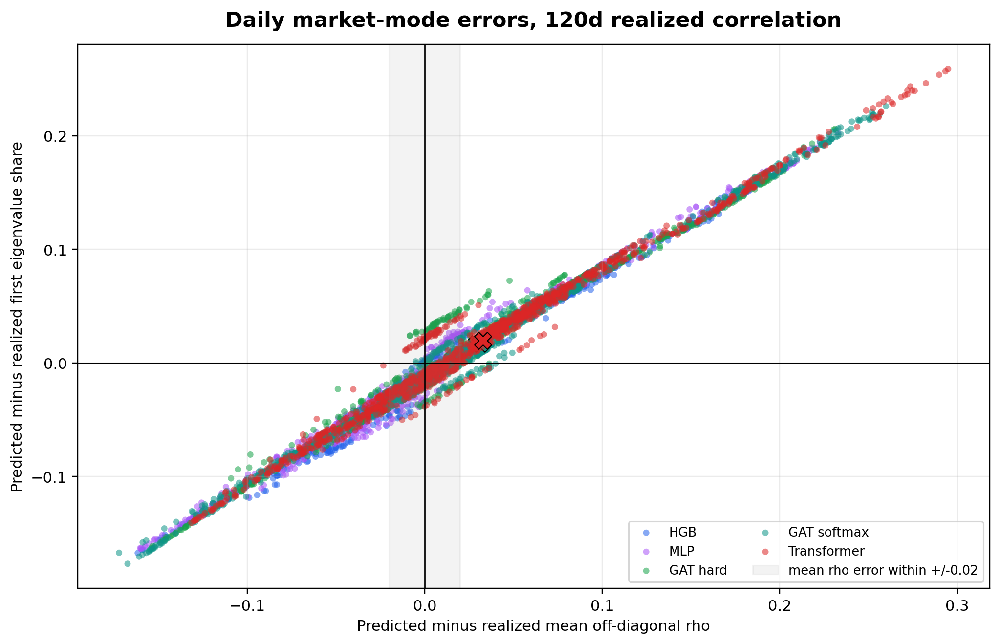

outputs/final/figures/market_mode_bias_when_mean_rho_close_60_120.png


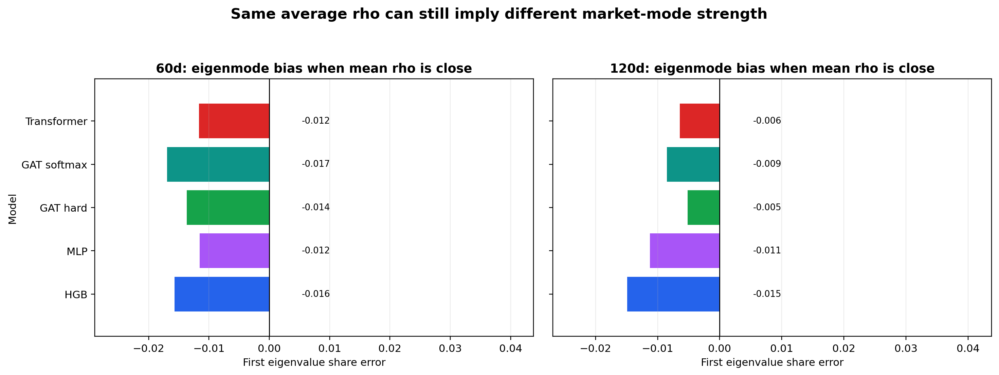

outputs/final/figures/market_mode_bias_high_target_mode_days_60_120.png


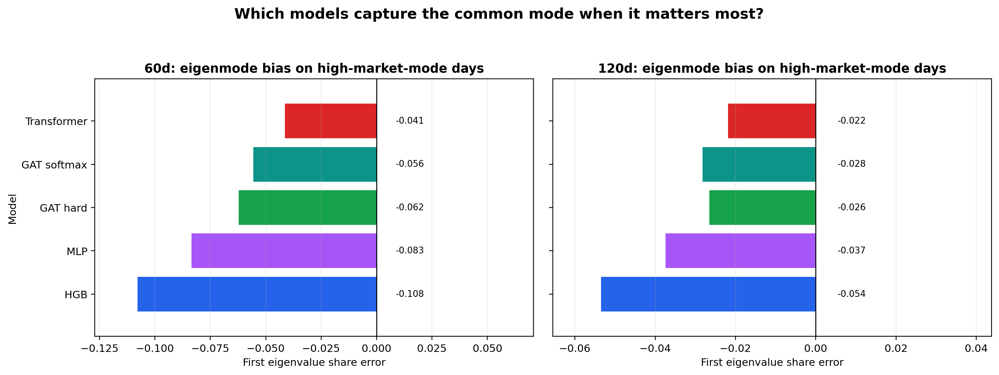

In [31]:
required_market_mode_evidence = [
    market_mode_evidence_daily_path,
    market_mode_evidence_summary_path,
    market_mode_evidence_close_path,
    market_mode_evidence_high_path,
    market_mode_scatter_path,
    market_mode_close_plot_path,
    market_mode_high_plot_path,
]
if MARKET_MODE_EVIDENCE_REBUILD or not all(path.exists() for path in required_market_mode_evidence):
    market_mode_daily, market_mode_summary, market_mode_close_summary, market_mode_high_summary = build_market_mode_evidence_tables()
    plot_market_mode_evidence(market_mode_daily, market_mode_close_summary, market_mode_high_summary)
else:
    market_mode_daily = pd.read_csv(market_mode_evidence_daily_path, parse_dates=["date"])
    market_mode_summary = pd.read_csv(market_mode_evidence_summary_path)
    market_mode_close_summary = pd.read_csv(market_mode_evidence_close_path)
    market_mode_high_summary = pd.read_csv(market_mode_evidence_high_path)

print("Market-mode evidence summary")
display(market_mode_summary.style.format({
    "mean_offdiag_bias": "{:+.3f}",
    "mean_offdiag_mae": "{:.3f}",
    "lambda1_bias": "{:+.3f}",
    "lambda1_mae": "{:.3f}",
    "lambda1_rmse": "{:.3f}",
    "pct_under_lambda1": "{:.1f}%",
}))

print(f"Evidence conditional on |mean rho error| <= {MARKET_MODE_CLOSE_MEAN_THRESHOLD:.2f}")
display(market_mode_close_summary.style.format({
    "lambda1_bias_when_mean_close": "{:+.3f}",
    "lambda1_mae_when_mean_close": "{:.3f}",
    "pct_under_lambda1_when_mean_close": "{:.1f}%",
    "share_days_mean_close": "{:.1%}",
}))

print("Evidence on high realized market-mode days")
display(market_mode_high_summary.style.format({
    "target_lambda1_q75": "{:.3f}",
    "mean_offdiag_bias_high_mode": "{:+.3f}",
    "lambda1_bias_high_mode": "{:+.3f}",
    "lambda1_mae_high_mode": "{:.3f}",
    "pct_under_lambda1_high_mode": "{:.1f}%",
}))

for path in [market_mode_scatter_path, market_mode_close_plot_path, market_mode_high_plot_path]:
    print(path.relative_to(PROJECT_ROOT))
    display(Image(filename=path))


## Forecast RMSE by Lagged-Correlation Regime

The final diagnostic slices forecast performance by the absolute lagged/base correlation bucket. This helps reveal whether models mainly improve easy low-correlation pairs, difficult high-correlation pairs, or the transition region between them.

The same table also tracks how aggressively each model moves away from the base correlation, which is useful for interpreting conservative versus adaptive forecasts.


#### Define RMSE Bucket Helpers


In [32]:
BASE_CORR_BUCKET_RUNS = {
    60: "pit_liquidity_top50_2021_cleaned_fwd60_60_720_tuned_600_120",
    120: "pit_liquidity_top50_2021_cleaned_fwd120_60_720_tuned_600_120",
}

BASE_CORR_BUCKET_MODELS = {
    "Residual HGB": "pred_residual_hgb",
    "Temporal GAT hard": "pred_temporal_gat",
    "Temporal GAT softmax": "pred_temporal_gat_softmax_tuned",
    "MLP": "pred_mlp_tuned",
    "All-node Transformer": "pred_all_node_transformer_tuned",
    "Persistence": "pred_persistence",
}

BASE_CORR_BUCKET_BINS = [0.0, 0.10, 0.20, 0.30, 0.40, 0.50, 0.70, 1.01]
BASE_CORR_BUCKET_LABELS = ["0-.10", ".10-.20", ".20-.30", ".30-.40", ".40-.50", ".50-.70", ".70-1.00"]
BASE_CORR_BUCKET_CENTERS = np.arange(len(BASE_CORR_BUCKET_LABELS))


def build_rmse_by_abs_base_corr_bucket() -> pd.DataFrame:
    rows = []
    for horizon, prefix in BASE_CORR_BUCKET_RUNS.items():
        pred_path = OUTPUT_DIR / f"{prefix}_predictions.csv"
        if not pred_path.exists():
            print(f"Missing predictions for {horizon}d horizon: {pred_path.relative_to(PROJECT_ROOT)}")
            continue
        pred = pd.read_csv(pred_path, parse_dates=["date"])
        pred["abs_base_corr_bucket"] = pd.cut(
            pred["base_corr"].abs(),
            bins=BASE_CORR_BUCKET_BINS,
            labels=BASE_CORR_BUCKET_LABELS,
            include_lowest=True,
            right=False,
        )
        for model_label, pred_col in BASE_CORR_BUCKET_MODELS.items():
            if pred_col not in pred.columns:
                continue
            use = pred.dropna(subset=["target_corr", "base_corr", pred_col, "abs_base_corr_bucket"]).copy()
            for bucket, group in use.groupby("abs_base_corr_bucket", observed=False):
                if group.empty:
                    continue
                err = group[pred_col] - group["target_corr"]
                pred_change = group[pred_col] - group["base_corr"]
                target_change = group["target_corr"] - group["base_corr"]
                rows.append(
                    {
                        "horizon_days": horizon,
                        "bucket": str(bucket),
                        "model": model_label,
                        "n_pairs": len(group),
                        "mean_base_corr": float(group["base_corr"].mean()),
                        "mean_abs_base_corr": float(group["base_corr"].abs().mean()),
                        "mean_pred_corr": float(group[pred_col].mean()),
                        "mean_abs_pred_corr": float(group[pred_col].abs().mean()),
                        "mean_target_corr": float(group["target_corr"].mean()),
                        "mean_abs_target_corr": float(group["target_corr"].abs().mean()),
                        "mean_pred_change_from_base": float(pred_change.mean()),
                        "mean_abs_pred_change_from_base": float(pred_change.abs().mean()),
                        "mean_target_change_from_base": float(target_change.mean()),
                        "mean_abs_target_change_from_base": float(target_change.abs().mean()),
                        "rmse": float(np.sqrt(np.mean(np.square(err)))),
                        "mae": float(np.mean(np.abs(err))),
                        "bias": float(np.mean(err)),
                    }
                )
    out = pd.DataFrame(rows)
    if not out.empty:
        out["bucket"] = pd.Categorical(out["bucket"], categories=BASE_CORR_BUCKET_LABELS, ordered=True)
        out = out.sort_values(["horizon_days", "model", "bucket"]).reset_index(drop=True)
    return out


#### Build RMSE Bucket Table


In [33]:
rmse_by_abs_base_corr_bucket = build_rmse_by_abs_base_corr_bucket()
rmse_bucket_table_path = FINAL_TABLE_DIR / "rmse_by_abs_base_corr_bucket.csv"
rmse_by_abs_base_corr_bucket.to_csv(rmse_bucket_table_path, index=False)
print(f"Wrote {rmse_bucket_table_path.relative_to(PROJECT_ROOT)}")
display(rmse_by_abs_base_corr_bucket)


Wrote outputs/final/tables/rmse_by_abs_base_corr_bucket.csv


,horizon_days,bucket,model,n_pairs,mean_base_corr,mean_abs_base_corr,mean_pred_corr,mean_abs_pred_corr,mean_target_corr,mean_abs_target_corr,mean_pred_change_from_base,mean_abs_pred_change_from_base,mean_target_change_from_base,mean_abs_target_change_from_base,rmse,mae,bias
0,60,0-.10,All-node Transformer,36631,0.019488,0.050775,0.494664,0.513199,0.388638,0.421923,0.475175,0.493434,0.369149,0.406375,0.376104,0.274487,0.106026
1,60,.10-.20,All-node Transformer,44831,0.117026,0.152354,0.513415,0.536958,0.440380,0.454072,0.396389,0.419335,0.323354,0.359727,0.327829,0.241111,0.073035
2,60,.20-.30,All-node Transformer,62436,0.234145,0.253226,0.546654,0.569361,0.492529,0.499631,0.312509,0.332689,0.258384,0.305886,0.297632,0.219777,0.054125
3,60,.30-.40,All-node Transformer,93307,0.345718,0.353265,0.583047,0.595491,0.537800,0.542219,0.237329,0.249339,0.192082,0.260735,0.266101,0.199337,0.045246
4,60,.40-.50,All-node Transformer,133289,0.450285,0.452671,0.621608,0.627035,0.573424,0.575710,0.171323,0.181833,0.123138,0.213323,0.232734,0.177248,0.048185
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,120,.20-.30,Temporal GAT softmax,58202,0.235040,0.253253,0.500477,0.510337,0.493993,0.495686,0.265437,0.271832,0.258952,0.283325,0.222079,0.172987,0.006485
80,120,.30-.40,Temporal GAT softmax,87854,0.346015,0.353378,0.554601,0.560745,0.532092,0.532852,0.208586,0.211954,0.186076,0.229349,0.209146,0.163171,0.022509
81,120,.40-.50,Temporal GAT softmax,127432,0.450442,0.452793,0.602172,0.603434,0.567277,0.567802,0.151730,0.153846,0.116835,0.183257,0.190465,0.148621,0.034895
82,120,.50-.70,Temporal GAT softmax,387932,0.607331,0.607377,0.658667,0.658681,0.611810,0.612037,0.051336,0.067507,0.004479,0.139668,0.178283,0.136546,0.046856


#### Plot RMSE by Lagged-Correlation Bucket


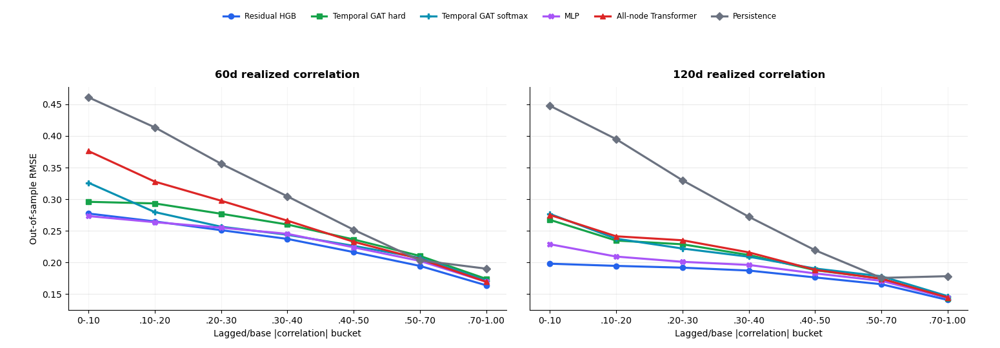

Wrote outputs/final/figures/rmse_by_abs_base_corr_bucket_60_120.png


In [34]:
fig, axes = plt.subplots(1, 2, figsize=(15.5, 5.4), sharey=True)
colors = {
    "Residual HGB": "#2563eb",
    "Temporal GAT hard": "#16a34a",
    "Temporal GAT softmax": "#0891b2",
    "MLP": "#a855f7",
    "All-node Transformer": "#dc2626",
    "Persistence": "#6b7280",
}
markers = {
    "Residual HGB": "o",
    "Temporal GAT hard": "s",
    "Temporal GAT softmax": "P",
    "MLP": "X",
    "All-node Transformer": "^",
    "Persistence": "D",
}

for ax, horizon in zip(axes, [60, 120]):
    sub = rmse_by_abs_base_corr_bucket.loc[rmse_by_abs_base_corr_bucket["horizon_days"].eq(horizon)].copy()
    for model_label in BASE_CORR_BUCKET_MODELS:
        line = sub.loc[sub["model"].eq(model_label)].sort_values("bucket")
        if line.empty:
            continue
        x = [BASE_CORR_BUCKET_LABELS.index(str(bucket)) for bucket in line["bucket"]]
        ax.plot(
            x,
            line["rmse"],
            marker=markers.get(model_label, "o"),
            linewidth=2.3,
            markersize=6,
            color=colors.get(model_label),
            label=model_label,
        )
    ax.set_title(f"{horizon}d realized correlation", fontsize=12, weight="semibold", pad=10)
    ax.set_xticks(BASE_CORR_BUCKET_CENTERS)
    ax.set_xticklabels(BASE_CORR_BUCKET_LABELS, rotation=0)
    ax.set_xlabel("Lagged/base |correlation| bucket")
    ax.grid(axis="y", alpha=0.25)
    ax.grid(axis="x", alpha=0.12)
    ax.spines[["top", "right"]].set_visible(False)

axes[0].set_ylabel("Out-of-sample RMSE")
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=6, frameon=False, bbox_to_anchor=(0.5, 0.985), fontsize=8.5)
fig.suptitle("Forecast RMSE by lagged correlation regime", fontsize=15, weight="bold", y=1.055)
fig.tight_layout(rect=(0.02, 0.0, 0.98, 0.89), w_pad=2.0)
rmse_bucket_figure_path = FINAL_FIGURE_DIR / "rmse_by_abs_base_corr_bucket_60_120.png"
fig.savefig(rmse_bucket_figure_path, dpi=240, bbox_inches="tight", pad_inches=0.20)
plt.show()
print(f"Wrote {rmse_bucket_figure_path.relative_to(PROJECT_ROOT)}")


#### Plot Prediction Magnitude and Movement


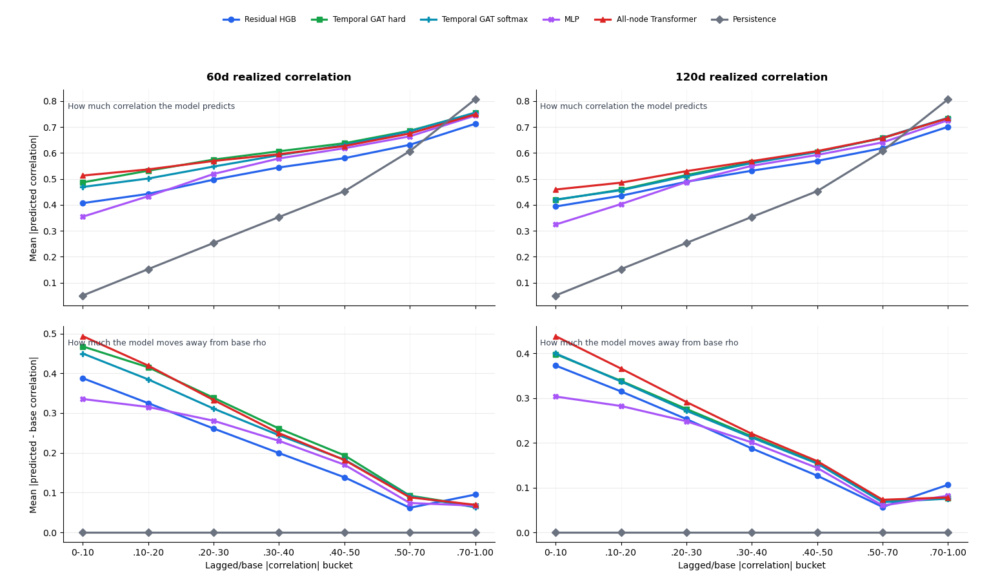

Wrote outputs/final/figures/predicted_corr_magnitude_and_change_by_abs_base_corr_bucket_60_120.png


In [35]:
fig, axes = plt.subplots(2, 2, figsize=(15.5, 9.0), sharex=True)
behavior_specs = [
    ("mean_abs_pred_corr", "Mean |predicted correlation|", "How much correlation the model predicts"),
    ("mean_abs_pred_change_from_base", "Mean |predicted - base correlation|", "How much the model moves away from base rho"),
]

for col_idx, horizon in enumerate([60, 120]):
    sub = rmse_by_abs_base_corr_bucket.loc[rmse_by_abs_base_corr_bucket["horizon_days"].eq(horizon)].copy()
    for row_idx, (metric_col, ylabel, panel_title) in enumerate(behavior_specs):
        ax = axes[row_idx, col_idx]
        for model_label in BASE_CORR_BUCKET_MODELS:
            line = sub.loc[sub["model"].eq(model_label)].sort_values("bucket")
            if line.empty:
                continue
            x = [BASE_CORR_BUCKET_LABELS.index(str(bucket)) for bucket in line["bucket"]]
            ax.plot(
                x,
                line[metric_col],
                marker=markers.get(model_label, "o"),
                linewidth=2.3,
                markersize=6,
                color=colors.get(model_label),
                label=model_label,
            )
        if row_idx == 0:
            ax.set_title(f"{horizon}d realized correlation", fontsize=12, weight="semibold", pad=10)
        if col_idx == 0:
            ax.set_ylabel(ylabel)
        ax.set_xticks(BASE_CORR_BUCKET_CENTERS)
        ax.set_xticklabels(BASE_CORR_BUCKET_LABELS, rotation=0)
        ax.grid(axis="y", alpha=0.25)
        ax.grid(axis="x", alpha=0.12)
        ax.spines[["top", "right"]].set_visible(False)
        ax.text(
            0.01,
            0.94,
            panel_title,
            transform=ax.transAxes,
            ha="left",
            va="top",
            fontsize=9,
            color="#374151",
        )

for ax in axes[-1, :]:
    ax.set_xlabel("Lagged/base |correlation| bucket")

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=6, frameon=False, bbox_to_anchor=(0.5, 0.985), fontsize=8.5)
fig.suptitle("Predicted correlation magnitude and forecast move by lagged correlation regime", fontsize=15, weight="bold", y=1.025)
fig.tight_layout(rect=(0.02, 0.0, 0.98, 0.93), h_pad=2.0, w_pad=2.0)
predicted_change_bucket_figure_path = FINAL_FIGURE_DIR / "predicted_corr_magnitude_and_change_by_abs_base_corr_bucket_60_120.png"
fig.savefig(predicted_change_bucket_figure_path, dpi=240, bbox_inches="tight", pad_inches=0.20)
plt.show()
print(f"Wrote {predicted_change_bucket_figure_path.relative_to(PROJECT_ROOT)}")


#### Combine RMSE with Signed Forecast Movement


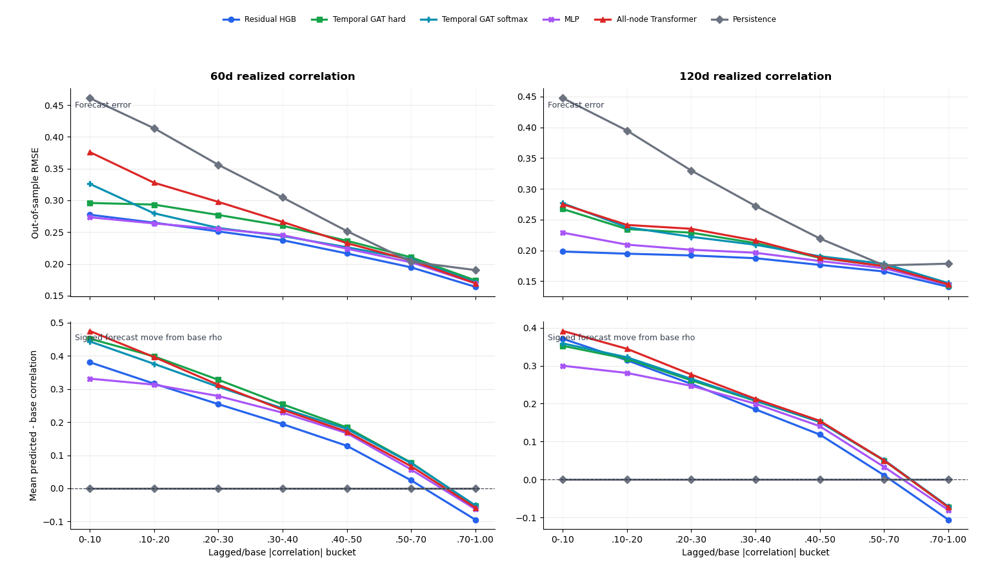

Wrote outputs/final/figures/rmse_and_signed_predicted_change_by_abs_base_corr_bucket_60_120.png


In [36]:
fig, axes = plt.subplots(2, 2, figsize=(15.5, 8.8), sharex=True)
combined_specs = [
    ("rmse", "Out-of-sample RMSE", "Forecast error"),
    ("mean_pred_change_from_base", "Mean predicted - base correlation", "Signed forecast move from base rho"),
]

for col_idx, horizon in enumerate([60, 120]):
    sub = rmse_by_abs_base_corr_bucket.loc[rmse_by_abs_base_corr_bucket["horizon_days"].eq(horizon)].copy()
    for row_idx, (metric_col, ylabel, panel_title) in enumerate(combined_specs):
        ax = axes[row_idx, col_idx]
        for model_label in BASE_CORR_BUCKET_MODELS:
            line = sub.loc[sub["model"].eq(model_label)].sort_values("bucket")
            if line.empty:
                continue
            x = [BASE_CORR_BUCKET_LABELS.index(str(bucket)) for bucket in line["bucket"]]
            ax.plot(
                x,
                line[metric_col],
                marker=markers.get(model_label, "o"),
                linewidth=2.3,
                markersize=6,
                color=colors.get(model_label),
                label=model_label,
            )
        if row_idx == 0:
            ax.set_title(f"{horizon}d realized correlation", fontsize=12, weight="semibold", pad=10)
        if row_idx == 1:
            ax.axhline(0.0, color="#111827", linewidth=0.9, linestyle="--", alpha=0.75)
        if col_idx == 0:
            ax.set_ylabel(ylabel)
        ax.text(
            0.01,
            0.94,
            panel_title,
            transform=ax.transAxes,
            ha="left",
            va="top",
            fontsize=9,
            color="#374151",
        )
        ax.set_xticks(BASE_CORR_BUCKET_CENTERS)
        ax.set_xticklabels(BASE_CORR_BUCKET_LABELS, rotation=0)
        ax.grid(axis="y", alpha=0.25)
        ax.grid(axis="x", alpha=0.12)
        ax.spines[["top", "right"]].set_visible(False)

for ax in axes[-1, :]:
    ax.set_xlabel("Lagged/base |correlation| bucket")

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=6, frameon=False, bbox_to_anchor=(0.5, 0.985), fontsize=8.5)
fig.suptitle("Forecast error and signed rho adjustment by lagged correlation regime", fontsize=15, weight="bold", y=1.025)
fig.tight_layout(rect=(0.02, 0.0, 0.98, 0.93), h_pad=2.0, w_pad=2.0)
rmse_and_change_bucket_figure_path = FINAL_FIGURE_DIR / "rmse_and_signed_predicted_change_by_abs_base_corr_bucket_60_120.png"
fig.savefig(rmse_and_change_bucket_figure_path, dpi=240, bbox_inches="tight", pad_inches=0.20)
plt.show()
print(f"Wrote {rmse_and_change_bucket_figure_path.relative_to(PROJECT_ROOT)}")
